In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LinearRegression
import seaborn as sns
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold 
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn import svm

In [2]:
from sklearn_genetic import GASearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn_genetic.space import Continuous, Categorical, Integer
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn_genetic.callbacks import DeltaThreshold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn_genetic.callbacks import LogbookSaver, ProgressBar
from sklearn_genetic.plots import plot_fitness_evolution, plot_search_space
import lightgbm as lgb
import time
from sklearn.metrics import r2_score
import xgboost as xgb

In [4]:
# path = '/content/drive/MyDrive/CS410/Regression/house_prices/'
path = ''

# Load Data

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
#Load Train
train = pd.read_csv(path + 'train.csv')
train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [6]:
#Load Test
test = pd.read_csv(path + 'test.csv')
test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal


# THIS IS THE OTHER STRATEGIES
# AVOID THIS 

In [57]:
def check_na(file):
  name_na = []
  for i in file.columns:
    if file[i].isna().sum() / len(file) > 0.05:
      file = file.drop(i, axis = 1)
      name_na.append(i)
  return file, name_na


In [58]:
# drop some columns have the rate of NaN > 0.8
train, train_na = check_na(train)
test, test_na = check_na(test)
na_left = list(set(train_na) - set(test_na))
for i in na_left:
  if i in test:
    test = test.drop(i, axis = 1)
  elif i in train:
    train = train.drop(i, axis = 1)
print(any(train.drop('SalePrice', axis = 1).columns == test.columns))

True


In [59]:
train 

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,175000
1456,1457,20,RL,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2010,WD,Normal,210000
1457,1458,70,RL,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,112,0,0,0,0,4,2010,WD,Normal,142125


In [60]:
test

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,11622,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,120,0,0,6,2010,WD,Normal
1,1462,20,RL,14267,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,36,0,0,0,0,12500,6,2010,WD,Normal
2,1463,60,RL,13830,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,34,0,0,0,0,0,3,2010,WD,Normal
3,1464,60,RL,9978,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,36,0,0,0,0,0,6,2010,WD,Normal
4,1465,120,RL,5005,Pave,IR1,HLS,AllPub,Inside,Gtl,...,82,0,0,144,0,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,1936,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,0,6,2006,WD,Normal
1455,2916,160,RM,1894,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,24,0,0,0,0,0,4,2006,WD,Abnorml
1456,2917,20,RL,20000,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,0,9,2006,WD,Abnorml
1457,2918,85,RL,10441,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,32,0,0,0,0,700,7,2006,WD,Normal


In [61]:
# drop columns has NaN
train = train.dropna(axis = 1)
test = test.dropna(axis = 1)


In [62]:
def preprocessing_data(file_):
  one_hot_encode_cols = file_.dtypes[file_.dtypes == np.object]  # filtering by string categoricals
  one_hot_encode_cols = one_hot_encode_cols.index.tolist()  # list of categorical fields

  # Here we see another way of one-hot-encoding:
  # Encode these columns as categoricals so one hot encoding works on split data (if desired)
  for col in one_hot_encode_cols:
      file_[col] = pd.Categorical(file_[col])

  # Do the one hot encoding
  data_ = pd.get_dummies(file_, columns=one_hot_encode_cols)
  return data_

In [63]:
train = preprocessing_data(train)
test = preprocessing_data(test)

C:\Users\Admin\AppData\Local\Temp/ipykernel_29748/3967219656.py:2: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  one_hot_encode_cols = file_.dtypes[file_.dtypes == np.object]  # filtering by string categoricals
C:\Users\Admin\AppData\Local\Temp/ipykernel_29748/3967219656.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  file_[col] = pd.Categorical(file_[col])


In [64]:
def balance_columns(file_, tar):
  for i in file_.columns:
    if i not in tar and i != 'SalePrice': 
      file_ = file_.drop(i, axis = 1)
  return file_

In [80]:
train = balance_columns(train, test)
test = balance_columns(test, train)

In [81]:
train

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,1stFlrSF,2ndFlrSF,LowQualFinSF,...,CentralAir_Y,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,8450,7,5,2003,2003,856,854,0,...,1,0,0,1,0,0,0,0,1,0
1,2,20,9600,6,8,1976,1976,1262,0,0,...,1,0,0,1,0,0,0,0,1,0
2,3,60,11250,7,5,2001,2002,920,866,0,...,1,0,0,1,0,0,0,0,1,0
3,4,70,9550,7,5,1915,1970,961,756,0,...,1,0,0,1,1,0,0,0,0,0
4,5,60,14260,8,5,2000,2000,1145,1053,0,...,1,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,1455,20,7500,7,5,2004,2005,1221,0,0,...,1,0,0,1,0,0,0,0,1,0
1455,1456,60,7917,6,5,1999,2000,953,694,0,...,1,0,0,1,0,0,0,0,1,0
1456,1457,20,13175,6,6,1978,1988,2073,0,0,...,1,0,0,1,0,0,0,0,1,0
1457,1458,70,9042,7,9,1941,2006,1188,1152,0,...,1,0,0,1,0,0,0,0,1,0


In [82]:
test

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,1stFlrSF,2ndFlrSF,LowQualFinSF,...,CentralAir_Y,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1461,20,11622,5,6,1961,1961,896,0,0,...,1,0,0,1,0,0,0,0,1,0
1,1462,20,14267,6,6,1958,1958,1329,0,0,...,1,0,0,1,0,0,0,0,1,0
2,1463,60,13830,5,5,1997,1998,928,701,0,...,1,0,0,1,0,0,0,0,1,0
3,1464,60,9978,6,6,1998,1998,926,678,0,...,1,0,0,1,0,0,0,0,1,0
4,1465,120,5005,8,5,1992,1992,1280,0,0,...,1,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,1936,4,7,1970,1970,546,546,0,...,1,0,0,1,0,0,0,0,1,0
1455,2916,160,1894,4,5,1970,1970,546,546,0,...,1,0,0,1,1,0,0,0,0,0
1456,2917,20,20000,5,7,1960,1996,1224,0,0,...,1,0,0,1,1,0,0,0,0,0
1457,2918,85,10441,5,5,1992,1992,970,0,0,...,1,0,0,1,0,0,0,0,1,0


In [83]:
#balance the size
train = train[0:len(test)]

In [69]:
def Scaling(file_):
  from sklearn import preprocessing
  names = file_.columns
  prepro = preprocessing.normalize(file_)
  scaled = pd.DataFrame(prepro, columns=names)
  return scaled

In [102]:
#X_train, X_valid = train_test_split(train, test_size=0.2,  random_state=19520197)
X_train = train

In [103]:
y_train = X_train['SalePrice'].values
X_train = X_train.drop('SalePrice', axis = 1).values
# y_valid = X_valid['SalePrice'].values
# X_valid  = X_valid.drop('SalePrice', axis=1).values

In [104]:
from sklearn.preprocessing import StandardScaler
X_scaler = StandardScaler()
y_scaler = StandardScaler()
X_train = X_scaler.fit_transform(X_train)
y_train = y_scaler.fit_transform([y_train])
# X_valid = X_scaler.transform(X_valid)
# y_valid = y_scaler.transform([y_valid])

In [105]:
X_train

array([[-1.73086406,  0.07277097, -0.20711081, ..., -0.11789207,
         0.4678467 , -0.3061097 ],
       [-1.72848977, -0.87308957, -0.09189482, ..., -0.11789207,
         0.4678467 , -0.3061097 ],
       [-1.72611547,  0.07277097,  0.07341508, ..., -0.11789207,
         0.4678467 , -0.3061097 ],
       ...,
       [ 1.72611547, -0.87308957,  0.26627663, ..., -0.11789207,
         0.4678467 , -0.3061097 ],
       [ 1.72848977,  0.30923611, -0.14779962, ..., -0.11789207,
         0.4678467 , -0.3061097 ],
       [ 1.73086406, -0.87308957, -0.08017285, ..., -0.11789207,
         0.4678467 , -0.3061097 ]])

In [ ]:
# X_train = Scaling(X_train)
# X_valid = Scaling(X_valid)
# test = Scaling(test)

In [112]:
clf_svm = svm.SVR(kernel='linear')
clf_svm.fit(X_train,y_train[0])
print("Train score: ", (clf_svm.score(X_train, y_train[0])))
#print("Test score: ",  (clf_svm.score(X_valid, y_valid)))


Train score:  1.0


In [113]:
test_ = X_scaler.transform(test)
y_pred = clf_svm.predict(test_)
y_pred

array([0., 0., 0., ..., 0., 0., 0.])

In [114]:
real_pred = y_scaler.inverse_transform([y_pred][0])
real_pred

array([208500., 181500., 223500., ..., 210000., 266500., 142125.])

In [115]:
result = pd.DataFrame()
result['Id'] = test['Id']
result['SalePrice'] = [float(i) for i in real_pred]
result.head()


,Id,SalePrice
0,1461,208500.0
1,1462,181500.0
2,1463,223500.0
3,1464,140000.0
4,1465,250000.0


In [111]:
result.to_csv('submission.csv', index=False)

# Preprocessing Data

In [7]:
total = train.isnull().sum().sort_values(ascending=False)
percent = (train.isnull().sum()/train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479


In [8]:
#Split the train into x_train and y_train so that SalePrice can be kept separate for training later
y = train.SalePrice
X = train.drop(columns=["SalePrice"], axis=1)

In [9]:
X['Type'] = 'train'
test['Type'] = 'test'
#test['SalePrice'] = -1
data = X.append(test)

In [10]:
columns_having_null_values = data[data.columns[data.isnull().sum()>0]]
columns_having_null_values

,MSZoning,LotFrontage,Alley,Utilities,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,...,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PoolQC,Fence,MiscFeature,SaleType
0,RL,65.0,NaN,AllPub,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,...,2003.0,RFn,2.0,548.0,TA,TA,NaN,NaN,NaN,WD
1,RL,80.0,NaN,AllPub,MetalSd,MetalSd,None,0.0,Gd,TA,...,1976.0,RFn,2.0,460.0,TA,TA,NaN,NaN,NaN,WD
2,RL,68.0,NaN,AllPub,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,...,2001.0,RFn,2.0,608.0,TA,TA,NaN,NaN,NaN,WD
3,RL,60.0,NaN,AllPub,Wd Sdng,Wd Shng,None,0.0,TA,Gd,...,1998.0,Unf,3.0,642.0,TA,TA,NaN,NaN,NaN,WD
4,RL,84.0,NaN,AllPub,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,...,2000.0,RFn,3.0,836.0,TA,TA,NaN,NaN,NaN,WD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,RM,21.0,NaN,AllPub,CemntBd,CmentBd,None,0.0,TA,TA,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,WD
1455,RM,21.0,NaN,AllPub,CemntBd,CmentBd,None,0.0,TA,TA,...,1970.0,Unf,1.0,286.0,TA,TA,NaN,NaN,NaN,WD
1456,RL,160.0,NaN,AllPub,VinylSd,VinylSd,None,0.0,TA,TA,...,1960.0,Unf,2.0,576.0,TA,TA,NaN,NaN,NaN,WD
1457,RL,62.0,NaN,AllPub,HdBoard,Wd Shng,None,0.0,Gd,TA,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,MnPrv,Shed,WD


In [11]:
# We have to check what values are there in the table so that we can fill values according to real world scenario.
data['Electrical'].value_counts()

SBrkr    2671
FuseA     188
FuseF      50
FuseP       8
Mix         1
Name: Electrical, dtype: int64

In [12]:
data['Electrical'].fillna("Sbrkr", inplace=True)

In [13]:
data['MSZoning'].value_counts()
#Filling null values with 'RL'
data['MSZoning'].fillna("RL",inplace=True)

#Filling nul values with mean
data['LotFrontage'].fillna(data['LotFrontage'].mean(), inplace=True)

data['Alley'].fillna("Nothing", inplace=True)
data['Utilities'].fillna("AllPub", inplace=True)
data['Exterior1st'].fillna("VinylSd", inplace=True)
data['Exterior2nd'].fillna("VinylSd", inplace=True)
data['MasVnrArea'].fillna(0, inplace=True)
data['MasVnrType'].fillna("None", inplace=True)
data['BsmtCond'].fillna("No", inplace=True)
data['BsmtExposure'].fillna("NB", inplace=True)
data['BsmtFinType1'].fillna("NB", inplace=True)
data['BsmtFinSF1'].fillna(0.0, inplace=True)
data['BsmtFinSF2'].fillna(0.0, inplace=True)
data['BsmtUnfSF'].fillna(0.0, inplace=True)
data['TotalBsmtSF'].fillna(0.0, inplace=True)
data['BsmtFullBath'].fillna(0.0, inplace=True)
data['BsmtHalfBath'].fillna(0.0, inplace=True)
data['KitchenQual'].fillna("TA", inplace=True)
data['Functional'].fillna("Typ", inplace=True)
data['FireplaceQu'].fillna("None", inplace=True)
data['GarageType'].fillna("No", inplace=True)
data['GarageYrBlt'].fillna(0, inplace=True)
data['GarageFinish'].fillna("No", inplace=True)
data['GarageCars'].fillna(0, inplace=True)
data['GarageArea'].fillna(0, inplace=True)
data['GarageQual'].fillna("No", inplace=True)
data['GarageCond'].fillna("No", inplace=True)
data['PoolQC'].fillna("No", inplace=True)
data['Fence'].fillna("No", inplace=True)
data['MiscFeature'].fillna("No", inplace=True)
data['SaleType'].fillna("Con", inplace=True)
data['SaleCondition'].fillna("None", inplace=True)
data['BsmtQual'].fillna("TA", inplace=True)
data['BsmtFinType2'].fillna("Unf", inplace=True)

In [14]:
data.isnull().sum().sum()

0

In [15]:
int_columns = data[data.columns[data.dtypes=='int']]
int_columns.columns

Index([], dtype='object')

In [16]:
data['MSZoning'].unique()

array(['RL', 'RM', 'C (all)', 'FV', 'RH'], dtype=object)

In [17]:
float_columns = data[data.columns[data.dtypes=='float']]
float_columns.columns

Index(['LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'GarageYrBlt',
       'GarageCars', 'GarageArea'],
      dtype='object')

In [18]:
object_columnns = data[data.columns[data.dtypes=='object']]
object_columnns.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'Type'],
      dtype='object')

In [19]:
from sklearn.preprocessing import LabelEncoder
for i in object_columnns:
    label = LabelEncoder()
    label.fit(data[i].values)
    data[i] = label.transform(data[i].values)

In [20]:
# if want to label all 
y_label = LabelEncoder()
y_ = y_label.fit_transform(y.values)
y_


array([412, 339, 442, ..., 527, 199, 221], dtype=int64)

In [21]:
int_columns = data[data.columns[data.dtypes=='int']]
int_columns.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'Type'],
      dtype='object')

In [22]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Type
0,1,60,3,65.0,8450,1,1,3,3,0,...,0,3,4,1,0,2,2008,8,4,1
1,2,20,3,80.0,9600,1,1,3,3,0,...,0,3,4,1,0,5,2007,8,4,1
2,3,60,3,68.0,11250,1,1,0,3,0,...,0,3,4,1,0,9,2008,8,4,1
3,4,70,3,60.0,9550,1,1,0,3,0,...,0,3,4,1,0,2,2006,8,0,1
4,5,60,3,84.0,14260,1,1,0,3,0,...,0,3,4,1,0,12,2008,8,4,1


# SPLIT


In [23]:
X_ = data[data.Type==1]
X_ = X_.drop(["Type"], axis=1)
test_ = data[data.Type==0]
test_ = test_.drop(["Type"], axis=1)

In [24]:
X_.shape, y.shape, test_.shape 

((1460, 80), (1460,), (1459, 80))

# Scaling


In [25]:
from sklearn import preprocessing
names = X_.columns
prepro = preprocessing.normalize(X_)
X_scaled = pd.DataFrame(prepro, columns=names)
y_scaled = pd.DataFrame(preprocessing.normalize(np.array(y).reshape(1,-1)))

In [26]:
X_scaled.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0.000103,0.006206,0.000310,0.006724,0.874058,0.000103,0.000103,0.000310,0.000310,0.0,...,0.0,0.0,0.000310,0.000414,0.000103,0.0,0.000207,0.207705,0.000828,0.000414
1,0.000187,0.001873,0.000281,0.007492,0.899023,0.000094,0.000094,0.000281,0.000281,0.0,...,0.0,0.0,0.000281,0.000375,0.000094,0.0,0.000468,0.187952,0.000749,0.000375
2,0.000246,0.004914,0.000246,0.005569,0.921406,0.000082,0.000082,0.000000,0.000246,0.0,...,0.0,0.0,0.000246,0.000328,0.000082,0.0,0.000737,0.164461,0.000655,0.000328
3,0.000377,0.006596,0.000283,0.005654,0.899917,0.000094,0.000094,0.000000,0.000283,0.0,...,0.0,0.0,0.000283,0.000377,0.000094,0.0,0.000188,0.189030,0.000754,0.000000
4,0.000330,0.003961,0.000198,0.005545,0.941325,0.000066,0.000066,0.000000,0.000198,0.0,...,0.0,0.0,0.000198,0.000264,0.000066,0.0,0.000792,0.132551,0.000528,0.000264


In [27]:
y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [28]:
y_scaled = np.array(y_scaled).reshape(-1,1)
y_scaled

array([[0.02761715],
       [0.02404083],
       [0.02960399],
       ...,
       [0.03529961],
       [0.01882536],
       [0.01953731]])

# SPLIT DATASETS


In [29]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X_, y, test_size=0.1, random_state=19520197)

In [30]:
from sklearn.model_selection import train_test_split
x_train_scaled, x_test_scaled, y_train_scaled, y_test_scaled = train_test_split(X_scaled, y, test_size=0.1, random_state=19520197)

In [31]:
y_train

85      260000
809     106000
22      230000
593     140000
1105    325000
         ...  
254     145000
596     114504
1165    233170
994     337500
630     124000
Name: SalePrice, Length: 1314, dtype: int64

# Modelling

In [30]:
score_test = []
#score_train = []
model = []

In [35]:
svr = svm.SVR()
svr.fit(x_train,y_train)
svr_scaled = svm.SVR()
svr_scaled.fit(x_train_scaled, y_train_scaled)

SVR()

In [36]:
score_svr = r2_score(svr.predict(x_test), y_test)
score_svr_scaled = r2_score(svr_scaled.predict(x_test_scaled), y_test_scaled)
score_test += [score_svr, score_svr_scaled]
model += ['model_svr', 'model_svr_scaled']

In [37]:
print(score_svr, score_svr_scaled)

-4813262.500101848 -31529761.120543294


In [38]:
from sklearn.ensemble import RandomForestRegressor
model_randomforest = RandomForestRegressor()
model_randomforest.fit(x_train, y_train)

model_randomforest_scaled = RandomForestRegressor()
model_randomforest_scaled.fit(x_train_scaled, y_train_scaled)

RandomForestRegressor()

In [39]:
model_randomforest.score(x_test, y_test)

0.8808583769408656

In [40]:
y_predict_randomforest = model_randomforest.predict(x_test)

In [41]:
score_test.append(model_randomforest.score(x_test, y_test))
model.append("model_randomforest")

In [42]:
score_test.append(model_randomforest_scaled.score(x_test_scaled, y_test_scaled))
model.append("model_randomforest_scaled")

In [39]:
import xgboost as xgb
model_xgboost = xgb.XGBRegressor()
 
model_xgboost.fit(x_train, y_train)



XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [44]:
model_xgboost_scaled = xgb.XGBRegressor()
 
model_xgboost_scaled.fit(x_train_scaled, y_train_scaled)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [45]:
xgb_score_ = model_xgboost.score(x_test, y_test)
score_test.append(xgb_score_)
model.append("model_xgboost")
xgb_score_


0.900540537972849

In [46]:
score_test.append(model_xgboost_scaled.score(x_test_scaled, y_test_scaled))
model.append("model_xgboost_scaled")

In [47]:
import lightgbm as lgb
lightgbm = lgb.LGBMRegressor(objective='regression')
lightgbm.fit(x_train, y_train)



LGBMRegressor(objective='regression')

In [48]:
lightgbm_scaled = lgb.LGBMRegressor(objective='regression')                                   
lightgbm_scaled.fit(x_train_scaled, y_train_scaled)


LGBMRegressor(objective='regression')

In [49]:
score_test.append(lightgbm.score(x_test, y_test))
model.append("lightgbm")

In [50]:
score_test.append(lightgbm_scaled.score(x_test_scaled, y_test_scaled))
model.append("lightgbm_scaled")

In [51]:
# MLP
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score
reg = MLPRegressor(hidden_layer_sizes=(128,128,128))
reg.fit(x_train, y_train)

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(128, 128, 128))

In [52]:
reg_scaled = MLPRegressor(hidden_layer_sizes=(128,128,128))
reg_scaled.fit(x_train_scaled, y_train_scaled)

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(128, 128, 128))

In [53]:
print("Train Score",reg.score(x_train, y_train))
print("Test Score:", reg.score(x_test, y_test))
print("Scaled Train Score:", reg_scaled.score(x_train_scaled, y_train_scaled))
print("Scaled Test Score:", reg_scaled.score(x_test_scaled, y_test_scaled))
score_test += [reg.score(x_test, y_test),reg_scaled.score(x_test_scaled, y_test_scaled)]
model += ["MLP", "MLP_scaled"]


Train Score 0.8042415639863668
Test Score: 0.7730626921436689
Scaled Train Score: 0.20310124361116655
Scaled Test Score: 0.19448004292873067


In [54]:
final_scores = pd.DataFrame()
final_scores['model_name'] = model
final_scores['score_test'] = score_test
final_scores = final_scores.sort_values(by=['score_test'], ascending=0)
final_scores

,model_name,score_test
6,lightgbm,9.082351e-01
4,model_xgboost,9.005405e-01
2,model_randomforest,8.808584e-01
7,lightgbm_scaled,8.765307e-01
3,model_randomforest_scaled,8.040105e-01
5,model_xgboost_scaled,7.834738e-01
8,MLP,7.730627e-01
9,MLP_scaled,1.944800e-01
0,model_svr,-4.813263e+06
1,model_svr_scaled,-3.152976e+07


In [55]:
best_index = score_test.index(max(score_test))
final_scores['model_name'][best_index]

'lightgbm'

In [56]:
#use best model to predict "test_"
y_predict_lightgbm = lightgbm.predict(test_)

In [57]:
result = pd.DataFrame()
result['Id'] = test['Id']
result['SalePrice'] = y_predict_lightgbm

In [58]:
result.head()

,Id,SalePrice
0,1461,131633.734684
1,1462,156152.445653
2,1463,179063.450739
3,1464,185879.105498
4,1465,182789.912454


In [59]:
result.to_csv(path+'submission_xgb.csv', index=False)

# Let's Hypertuning these model

Using Genetic Algorithm 



In [150]:
# y = train["SalePrice"]
# X = train.drop("SalePrice", axis=1)

# x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [60]:
x_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1038,1039,160,4,21.000000,1533,1,1,3,3,0,...,0,0,3,4,1,0,5,2009,8,4
423,424,60,3,80.000000,9200,1,1,3,3,0,...,0,0,3,4,1,0,6,2008,8,4
252,253,60,3,65.000000,8366,1,1,0,3,0,...,0,0,3,4,1,0,12,2008,8,4
205,206,20,3,99.000000,11851,1,1,3,3,0,...,0,0,3,4,1,0,5,2009,8,4
1331,1332,80,3,55.000000,10780,1,1,0,3,0,...,0,0,3,4,1,0,7,2006,8,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
846,847,60,3,75.000000,9317,1,1,3,3,0,...,0,0,3,4,1,0,7,2009,8,4
36,37,20,3,112.000000,10859,1,1,3,3,0,...,0,0,3,4,1,0,6,2009,8,4
467,468,70,3,79.000000,9480,1,1,3,3,0,...,0,0,3,4,1,0,6,2007,8,4
828,829,60,3,69.305795,28698,1,1,1,2,0,...,225,0,3,4,1,0,6,2009,8,0


In [ ]:
# Day La Xong RDF - GA

In [37]:
def GA(name_model,model, param_grid, x_train, y_train, x_test, y_test, population_size = 64, generations = 40):
    cv = KFold(n_splits=5, shuffle=True)
    #cv = None
    # callback = DeltaThreshold(threshold=0.0001, generations=5, metric='fitness_std')
    callbacks = [LogbookSaver(checkpoint_path=f"./logbook_{name_model}.pkl"), ProgressBar()]
    evolved_estimator = GASearchCV(
                    estimator=model,
                    cv=cv,
                    scoring="r2",
                    population_size=population_size,
                    generations=generations,
                    tournament_size=3,
                    elitism=True,
                    keep_top_k=4,
                    crossover_probability=0.8,
                    mutation_probability=0.05,
                    param_grid=param_grid,
                    criteria="max",
                    n_jobs=-1)
    # Train and optimize the estimator
    evolved_estimator.fit(x_train, y_train, callbacks=callbacks)
    # Best parameters found
    print(evolved_estimator.best_params_)
    y_predict_ga = evolved_estimator.predict(x_test)
    r_squared = r2_score(y_test, y_predict_ga)
    print("r-squared: ", "{:.2f}".format(r_squared))
    # Use the model fitted with the best parameters
    
    return evolved_estimator 
 

Randomforest

Xong RDF


In [63]:
#Randomforest
param_grid = {'n_estimators': Integer(10,300),
    "max_features": Continuous(0.1, 1),
    'max_depth': Integer(3,50),
    "min_samples_split": Integer(2,20),
    "min_samples_leaf": Integer(1,20)
}
start = time.time()
rdf_reg = GA("RDF",RandomForestRegressor(), param_grid, x_train, y_train,x_test, y_test)
end = time.time()
print("Time Execution: ", end- start)


  0%|          | 0/41 [00:00<?, ?it/s]gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	64    	0.825582	0.0202146  	0.86068    	0.756622   
100%|██████████| 41/41 [3:33:21<00:00, 414.31s/it]40 	107   	0.869564	0.00418039 	0.875177   	0.855747   
42it [3:39:24, 313.45s/it]                        
{'n_estimators': 290, 'max_features': 0.634499634675905, 'max_depth': 50, 'min_samples_split': 4, 'min_samples_leaf': 1}
r-squared:  0.90
Time Execution:  13169.428332567215


In [64]:
start = time.time()
rdf_reg_scaled = GA("RDF_Scaled",RandomForestRegressor(), param_grid, x_train_scaled, y_train_scaled,x_test_scaled, y_test_scaled)
end = time.time()
print("Time Execution: ", end- start)



  0%|          | 0/41 [00:00<?, ?it/s]gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	64    	0.753368	0.0275425  	0.795692   	0.647273   
100%|██████████| 41/41 [1:43:00<00:00, 134.15s/it]40 	107   	0.80041 	0.00440144 	0.804393   	0.788758   
42it [1:45:09, 150.22s/it]                        
{'n_estimators': 155, 'max_features': 0.17836736362539501, 'max_depth': 40, 'min_samples_split': 5, 'min_samples_leaf': 1}
r-squared:  0.85
Time Execution:  6312.030382156372


In [43]:
from sklearn_genetic.plots import plot_fitness_evolution, plot_search_space

<AxesSubplot:title={'center':'Fitness average evolution over generations'}, xlabel='generations', ylabel='fitness (r2)'>

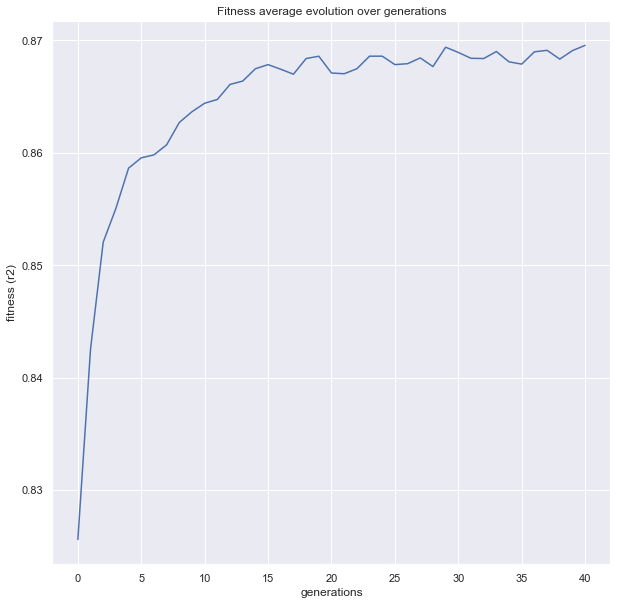

In [66]:
plot_fitness_evolution(rdf_reg, metric="fitness")

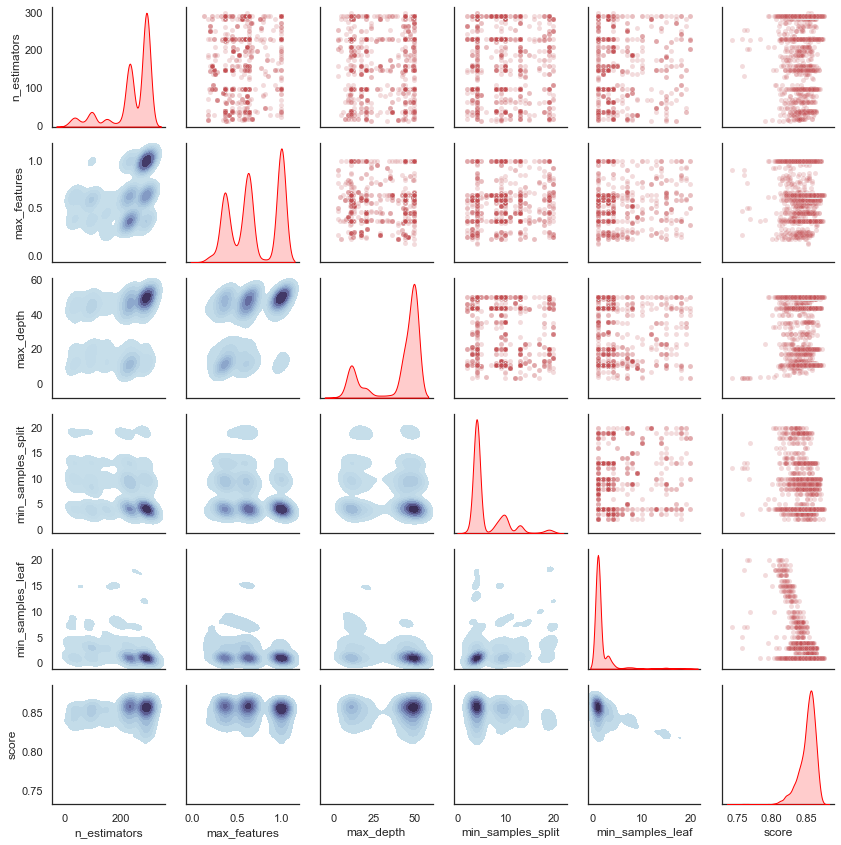

In [67]:
plot_search_space(rdf_reg)

In [68]:
print(rdf_reg.best_estimator_)
print(rdf_reg.best_params_)

RandomForestRegressor(max_depth=50, max_features=0.634499634675905,
                      min_samples_split=4, n_estimators=290)
{'n_estimators': 290, 'max_features': 0.634499634675905, 'max_depth': 50, 'min_samples_split': 4, 'min_samples_leaf': 1}


In [69]:
ga_rdf_reg_score = rdf_reg.best_score_
ga_rdf_reg_score

0.8760654856532902

<AxesSubplot:title={'center':'Fitness average evolution over generations'}, xlabel='generations', ylabel='fitness (r2)'>

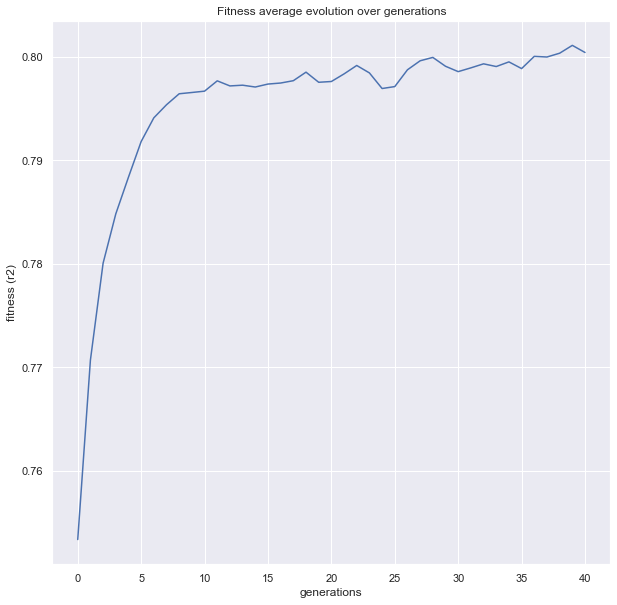

In [70]:
plot_fitness_evolution(rdf_reg_scaled, metric="fitness")

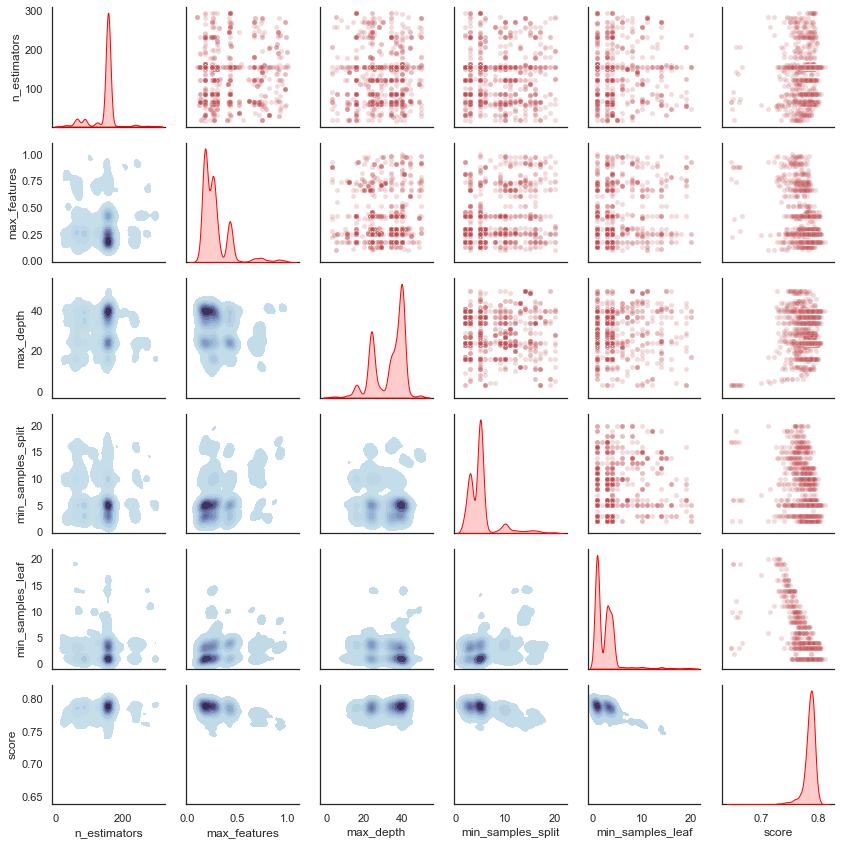

In [71]:
plot_search_space(rdf_reg_scaled)

In [72]:
print(rdf_reg_scaled.best_estimator_)
print(rdf_reg_scaled.best_params_)

RandomForestRegressor(max_depth=40, max_features=0.17836736362539501,
                      min_samples_split=5, n_estimators=155)
{'n_estimators': 155, 'max_features': 0.17836736362539501, 'max_depth': 40, 'min_samples_split': 5, 'min_samples_leaf': 1}


In [73]:
ga_rdf_reg_scaled_score = rdf_reg_scaled.best_score_
ga_rdf_reg_scaled_score

0.813016443322226

XGBOOST


In [35]:
#xgboost
base_score= Continuous(0.01, 1)
n_estimators = Integer(100, 300)
max_depth = Integer(2, 10)
booster=Categorical(['gbtree','gblinear'])
learning_rate=Continuous(0.001, 1)
min_child_weight=Integer(1, 4)

# Define the grid of hyperparameters to search
param_grid = {
    'n_estimators': n_estimators,
    'max_depth':max_depth,
    'learning_rate':learning_rate,
    'min_child_weight':min_child_weight,
    'booster':booster,
    'base_score':base_score
    }

In [40]:
#xgboost
start = time.time()
xgb_reg = GA("XGB",xgb.XGBRegressor(), param_grid, x_train, y_train,x_test, y_test)
end = time.time()
print("Time Execution: ", end- start)


  0%|          | 0/41 [00:00<?, ?it/s]gen	nevals	fitness	fitness_std	fitness_max	fitness_min
0  	64    	nan    	nan        	nan        	nan        
100%|██████████| 41/41 [1:46:55<00:00, 164.73s/it]40 	112   	0.889219	0.00815478 	0.896196   	0.865095   
42it [1:49:46, 156.82s/it]                        


D:\anaconda\envs\snowflakes\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn_genetic\utils\cv_scores.py:43: RuntimeWarning: Mean of empty slice
  np.nanmean(cv_scores)


{'n_estimators': 250, 'max_depth': 5, 'learning_rate': 0.04477725784975646, 'min_child_weight': 3, 'booster': 'gbtree', 'base_score': 0.20806483714200902}
r-squared:  0.92
Time Execution:  6590.147732496262


In [41]:
start = time.time()
xgb_reg_scaled = GA("XGB_Scaled",xgb.XGBRegressor(), param_grid, x_train_scaled, y_train_scaled,x_test_scaled, y_test_scaled)
end = time.time()
print("Time Execution: ", end- start)


  0%|          | 0/41 [00:00<?, ?it/s]gen	nevals	fitness	fitness_std	fitness_max	fitness_min
0  	64    	nan    	nan        	nan        	nan        
100%|██████████| 41/41 [2:24:30<00:00, 211.60s/it]40 	108   	0.830413	0.00984168 	0.83859    	0.808246   
42it [2:28:01, 211.47s/it]                        


D:\anaconda\envs\snowflakes\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn_genetic\utils\cv_scores.py:43: RuntimeWarning: Mean of empty slice
  np.nanmean(cv_scores)


{'n_estimators': 238, 'max_depth': 3, 'learning_rate': 0.14362196828135207, 'min_child_weight': 1, 'booster': 'gbtree', 'base_score': 0.21436027169970626}
r-squared:  0.88
Time Execution:  8883.958609819412


<AxesSubplot:title={'center':'Fitness average evolution over generations'}, xlabel='generations', ylabel='fitness (r2)'>

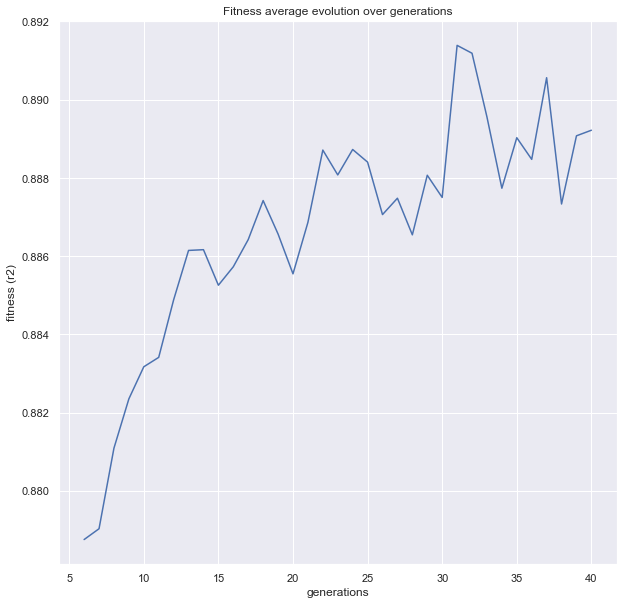

In [44]:
plot_fitness_evolution(xgb_reg, metric="fitness")

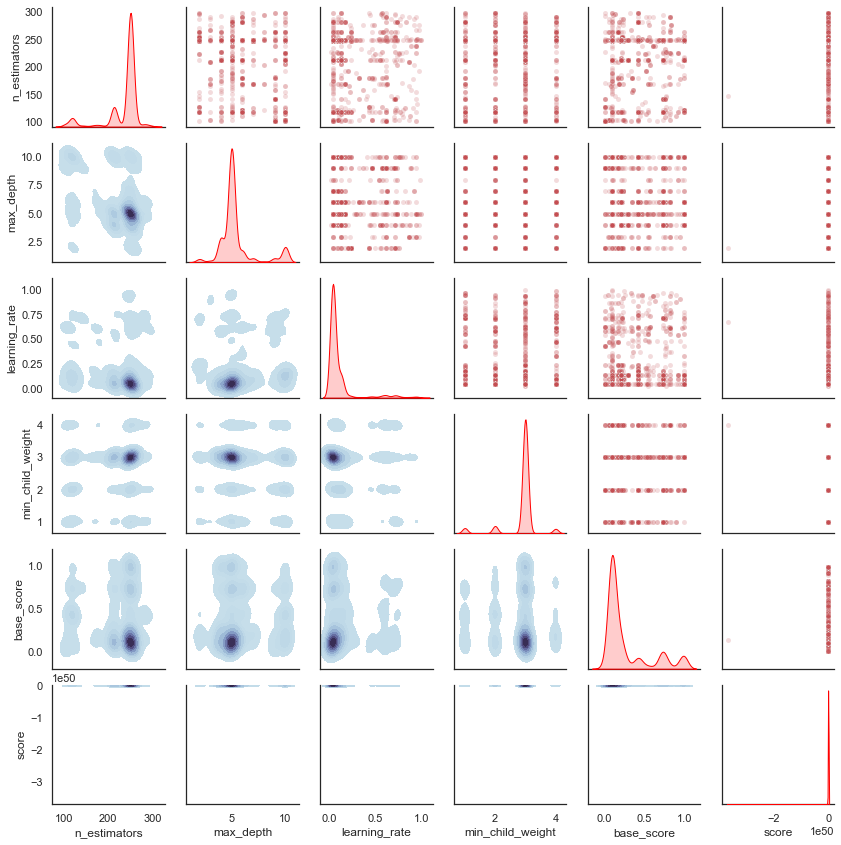

In [45]:
plot_search_space(xgb_reg)

In [46]:
print(xgb_reg.best_estimator_)
print(xgb_reg.best_params_)

XGBRegressor(base_score=0.20806483714200902, booster='gbtree',
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             enable_categorical=False, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.04477725784975646,
             max_delta_step=0, max_depth=5, min_child_weight=3, missing=nan,
             monotone_constraints='()', n_estimators=250, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)
{'n_estimators': 250, 'max_depth': 5, 'learning_rate': 0.04477725784975646, 'min_child_weight': 3, 'booster': 'gbtree', 'base_score': 0.20806483714200902}


In [47]:
ga_xgb_reg_score = xgb_reg.best_score_
ga_xgb_reg_score

0.8992874551874094

<AxesSubplot:title={'center':'Fitness average evolution over generations'}, xlabel='generations', ylabel='fitness (r2)'>

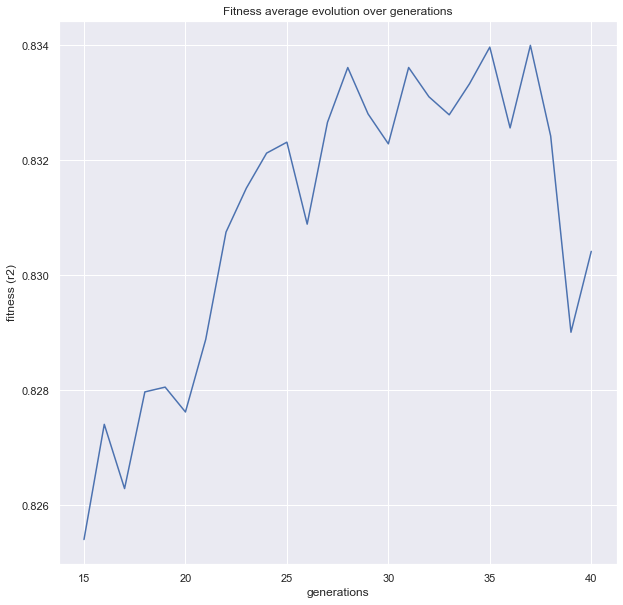

In [48]:
plot_fitness_evolution(xgb_reg_scaled, metric="fitness")

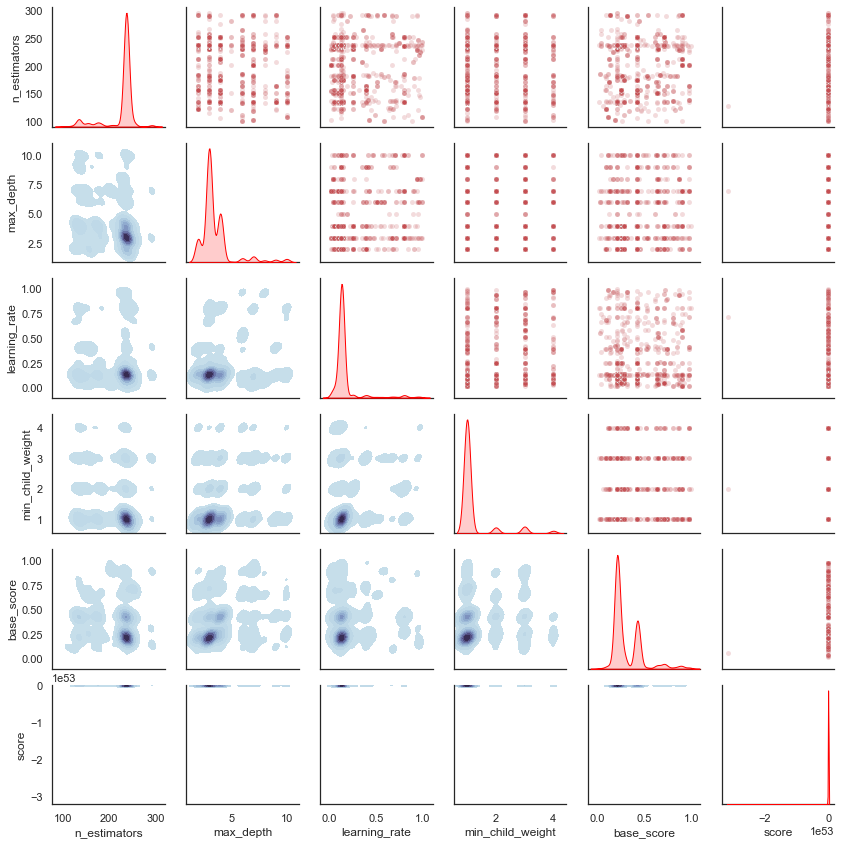

In [49]:
plot_search_space(xgb_reg_scaled)

In [50]:
print(xgb_reg_scaled.best_estimator_)
print(xgb_reg_scaled.best_params_)

XGBRegressor(base_score=0.21436027169970626, booster='gbtree',
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             enable_categorical=False, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.14362196828135207,
             max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=238, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)
{'n_estimators': 238, 'max_depth': 3, 'learning_rate': 0.14362196828135207, 'min_child_weight': 1, 'booster': 'gbtree', 'base_score': 0.21436027169970626}


In [51]:
ga_xgb_reg_scaled_score = xgb_reg_scaled.best_score_
ga_xgb_reg_scaled_score

0.8413029711228688

LightGBM


In [ ]:
param_grid = {
    'reg_alpha': Continuous(0, 10),
    'reg_lambda': Continuous(0, 10),
    'num_leaves': Integer(2, 256),
    'subsample': Continuous(0.5, 1),
    'colsample_bytree':Continuous(0.5, 1),
    'subsample_freq': Integer(1, 7),
    'min_child_samples': Integer(5, 100),
    'n_estimators': Integer(50, 300),
    'learning_rate': Continuous(0.01, 1),
}
start = time.time()
lgb_reg = GA("LightGBM",lgb.LGBMRegressor(objective="regression"), param_grid, x_train, y_train,x_test, y_test)
end = time.time()
print("Time Execution: ", end- start)


gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	15    	0.787304	0.0453729  	0.842239   	0.708736   
1  	24    	0.832188	0.0125627  	0.842713   	0.801827   
2  	28    	0.841879	0.00200962 	0.84526    	0.836265   
3  	27    	0.84443 	0.00201695 	0.847891   	0.841825   
4  	25    	0.845524	0.00155096 	0.847891   	0.842776   
5  	25    	0.847137	0.00125413 	0.847891   	0.844172   
6  	24    	0.847829	0.000231957	0.847891   	0.846961   
7  	25    	0.847891	7.45631e-09	0.847891   	0.847891   
8  	27    	0.847891	8.54618e-09	0.847891   	0.847891   
9  	22    	0.847891	9.64139e-09	0.847891   	0.847891   
10 	25    	0.847891	4.82069e-09	0.847891   	0.847891   
11 	24    	0.847891	2.22045e-16	0.847891   	0.847891   
12 	28    	0.847891	2.22045e-16	0.847891   	0.847891   
13 	27    	0.847891	2.22045e-16	0.847891   	0.847891   
14 	25    	0.847891	2.22045e-16	0.847891   	0.847891   
15 	25    	0.847891	2.22045e-16	0.847891   	0.847891   
16 	26    	0.847891	2.22045e-16	0.847891   	0.84

In [ ]:
start = time.time()
lgb_reg_scaled = GA("LightGBM_Scaled",lgb.LGBMRegressor(objective="regression"), param_grid, x_train_scaled, y_train_scaled,x_test_scaled, y_test_scaled)
end = time.time()
print("Time Execution: ", end- start)

In [ ]:
plot_fitness_evolution(lgb_reg, metric="fitness")

In [ ]:
plot_search_space(lgb_reg)

In [ ]:
print(lgb_reg.best_estimator_)
print(lgb_reg.best_params_)

In [ ]:
ga_lgb_reg_score = lgb_reg.best_score_
ga_lgb_reg_score

In [ ]:
plot_fitness_evolution(lgb_reg_scaled, metric="fitness")

In [ ]:
plot_search_space(lgb_reg_scaled)

In [ ]:
print(lgb_reg_scaled.best_estimator_)
print(lgb_reg_scaled.best_params_)

In [ ]:
ga_lgb_reg_scaled_score = lgb_reg_scaled.best_score_
ga_lgb_reg_scaled_score

# PSO

In [32]:
import optuna
import optunity
import optunity.metrics

Randomforest

In [99]:
rf_search = {
            'n_estimators': [10, 300],
            "max_features": [0.1, 1],
            'max_depth': [3,50],
            "min_samples_split": [2,20],
            "min_samples_leaf": [1,20]
        }

In [100]:
@optunity.cross_validated(x=X_.values, y=y.values, num_folds=5)
def rf_performance(x_train, y_train, x_test, y_test, n_estimators=None, max_features=None, max_depth=None, min_samples_split=None, min_samples_leaf=None, criterion='mse'):
    rdf_reg = RandomForestRegressor(n_estimators=int(n_estimators), max_features=max_features,
                                 max_depth=round(max_depth), min_samples_split=round(min_samples_split), min_samples_leaf=round(min_samples_leaf), criterion=criterion)
    rdf_reg.fit(x_train, y_train)
   
    predictions = rdf_reg.predict(x_test)
    
    return optunity.metrics.r_squared(y_test, predictions)

In [101]:
rf_pso_start_time = time.time()
rf_optimal_configuration, rf_info, _= optunity.maximize_structured(rf_performance,
                                                              search_space=rf_search,
                                                              num_evals=1000)
#rf_optimal_configuration, rf_info, _ = 
rf_pso_end_time = time.time()

In [164]:
rf_optimal_configuration

{'max_depth': 25.59012380515136,
 'max_features': 0.615874321710892,
 'min_samples_leaf': 1.8943262239574226,
 'min_samples_split': 5.260278797021839,
 'n_estimators': 156.7237903602672}

In [102]:
rf_pso_log =  optunity.call_log2dataframe(rf_info.call_log)
rf_pso_log.to_csv("rf_pso_log.csv")

In [7]:
rf_log = pd.read_csv(path + 'rf_pso_log.csv')
rf_log.sort_values(by='value', ascending=False)[:10]

,Unnamed: 0,n_estimators,min_samples_split,max_features,max_depth,min_samples_leaf,value
863,863,156.723790,5.260279,0.615874,25.590124,1.894326,0.869714
893,893,157.637584,4.943418,0.607295,26.194291,2.147189,0.869563
783,783,156.265151,5.286052,0.603280,25.547271,1.715410,0.869558
380,380,156.864465,4.930586,0.611994,25.685088,1.948585,0.869346
984,984,155.901554,5.428813,0.591331,25.740192,1.702370,0.869249
811,811,154.038677,4.839552,0.605307,26.166639,1.397751,0.868931
563,563,174.086738,6.205279,0.615284,25.684189,1.754761,0.868914
973,973,152.754816,5.161333,0.605026,24.812960,1.608254,0.868797
960,960,157.937735,5.051246,0.616744,25.133233,1.629465,0.868762
764,764,156.374814,4.906988,0.617209,26.166561,2.358797,0.868375


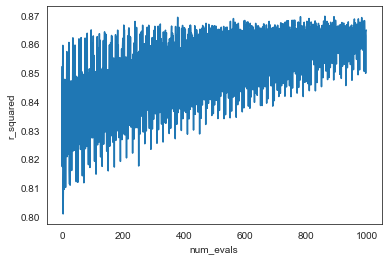

In [171]:
plt.plot(np.array(rf_pso_log['value']).reshape(-1,1))
plt.ylabel('r_squared')
plt.xlabel('num_evals')
plt.show()

In [103]:
rf_pso_runtime = rf_pso_end_time - rf_pso_start_time
rf_pso_score = rf_info.optimum

In [104]:
print("Score:", rf_pso_score)
print("Runtime:", rf_pso_runtime)

Score: 0.8697140354341528
Runtime: 4756.576979875565


SCALED

In [192]:
import optuna
import optunity
import optunity.metrics

In [106]:
@optunity.cross_validated(x=X_scaled.values, y=y.values, num_folds=5)
def rf_performance_scaled(x_train, y_train, x_test , y_test, n_estimators=None, max_features=None, max_depth=None, min_samples_split=None, min_samples_leaf=None, criterion='mse'):
    rdf_reg_scaled = RandomForestRegressor(n_estimators=round(n_estimators), max_features=max_features,
                                 max_depth=round(max_depth), min_samples_split=round(min_samples_split), min_samples_leaf=round(min_samples_leaf), criterion=criterion)
    rdf_reg_scaled.fit(x_train_scaled, y_train_scaled)
    predictions = rdf_reg_scaled.predict(x_test_scaled)
    return optunity.metrics.r_squared(y_test_scaled, predictions)

In [107]:
rf_pso_start_time = time.time()
rf_optimal_configuration_scaled, rf_info_scaled, _ = optunity.maximize_structured(rf_performance_scaled,
                                                              search_space=rf_search,
                                                              num_evals=1000)
rf_pso_end_time = time.time()

In [163]:
rf_optimal_configuration_scaled

{'max_depth': 31.049049835870647,
 'max_features': 0.38659496729654574,
 'min_samples_leaf': 2.500907353019134,
 'min_samples_split': 11.99758473945689,
 'n_estimators': 94.81008414336804}

In [108]:
rf_pso_log_scaled =  optunity.call_log2dataframe(rf_info_scaled.call_log)
rf_pso_log_scaled.to_csv("rf_pso_log_scaled.csv")

In [8]:
rf_log_scaled = pd.read_csv(path + 'rf_pso_log_scaled.csv')
rf_log_scaled.sort_values(by='value', ascending=False)[:10]

,Unnamed: 0,min_samples_leaf,n_estimators,min_samples_split,max_features,max_depth,value
983,983,2.500907,94.810084,11.997585,0.386595,31.049050,0.896854
960,960,2.511811,94.551069,11.773439,0.393642,30.290439,0.896726
824,824,2.734646,95.073237,11.908388,0.394495,30.436984,0.896725
738,738,3.042942,98.200884,11.990954,0.393888,34.385003,0.896677
924,924,2.982590,96.803684,11.847023,0.384646,30.648261,0.896045
696,696,3.719672,110.417031,12.213585,0.397492,34.322122,0.895789
610,610,3.415598,88.473461,11.880072,0.384812,34.487283,0.895667
795,795,3.139058,102.122997,12.029065,0.387910,34.402486,0.895075
936,936,3.018144,92.345430,12.035094,0.383060,31.218766,0.894701
769,769,3.078730,104.656776,12.036927,0.384911,34.525222,0.894601


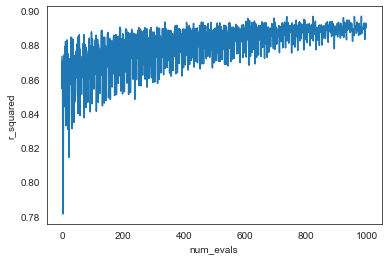

In [173]:
plt.plot(np.array(rf_pso_log_scaled['value']).reshape(-1,1))
plt.ylabel('r_squared')
plt.xlabel('num_evals')
plt.show()

In [109]:
rf_pso_runtime_scaled = rf_pso_end_time - rf_pso_start_time
rf_pso_score_scaled = rf_info_scaled.optimum

In [110]:
print("SCALED DATA\n")
print("Score:", rf_pso_score_scaled)
print("Runtime:", rf_pso_runtime_scaled)

SCALED DATA

Score: 0.896853813783987
Runtime: 6102.2022869586945


XGBOOST


In [125]:
xgb_para = {
    'max_depth': [2, 10],
    'min_child_weight': [1, 4],
    'learning_rate': [0.001, 1],
    'n_estimators': [100, 300],
    'base_score' : [0.01, 1]
}

In [126]:
xgb_search = {
    "booster" :
    {
        'gbtree': xgb_para,
        'gblinear': xgb_para
    }
    
}

In [127]:
@optunity.cross_validated(x=X_.values, y=y.values, num_folds=5)
def xgb_performance(x_train, y_train, x_test, y_test, n_estimators, max_depth, min_child_weight,
                                 learning_rate, booster, base_score):
    xgb_reg = xgb.XGBRegressor(n_estimators=round(n_estimators), max_depth=round(max_depth), min_child_weight=round(min_child_weight),
                                 learning_rate=learning_rate, booster=booster, base_score=base_score)
    xgb_reg.fit(x_train, y_train)
    predictions = xgb_reg.predict(x_test)
    return optunity.metrics.r_squared(y_test, predictions)

In [128]:
xgb_pso_start_time = time.time()
xgb_optimal_configuration, xgb_info, _ = optunity.maximize_structured(xgb_performance,
                                                              search_space=xgb_search,
                                                              num_evals=1000)
xgb_pso_end_time = time.time()

[15:45:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[15:45:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[15:45:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

In [162]:
xgb_optimal_configuration

{'booster': 'gbtree',
 'base_score': 0.3573464090077122,
 'learning_rate': 0.11128881075537929,
 'max_depth': 5.7410926035053205,
 'min_child_weight': 3.531116530326552,
 'n_estimators': 200.1820308200897}

In [129]:
xgb_pso_log = optunity.call_log2dataframe(xgb_info.call_log)
xgb_pso_log.to_csv('xgb_pso_log.csv')

In [130]:
xgb_pso_log

,base_score,learning_rate,min_child_weight,booster,n_estimators,max_depth,value
0,0.874800,0.548792,1.045410,gbtree,119.433594,2.246094,0.843961
1,0.627300,0.299042,1.795410,gbtree,269.433594,8.246094,0.862490
2,0.846763,0.292212,2.741699,gblinear,125.683594,2.488281,0.801328
3,0.475513,0.666837,1.616699,gblinear,100.683594,9.488281,NaN
4,0.998550,0.174167,3.670410,gbtree,194.433594,3.246094,0.878503
...,...,...,...,...,...,...,...
995,0.350187,0.118862,3.516289,gbtree,221.074087,5.810349,0.885279
996,0.354110,0.284931,3.566283,gbtree,201.408594,5.601222,0.872850
997,0.347768,0.131445,3.525285,gbtree,223.688398,5.725227,0.888187
998,0.363870,0.101896,3.513134,gbtree,201.061862,5.635597,0.888926


In [9]:
xgb_log = pd.read_csv(path + 'xgb_pso_log.csv')
xgb_log.sort_values(by='value', ascending=False)[:10]

,Unnamed: 0,base_score,learning_rate,min_child_weight,booster,n_estimators,max_depth,value
733,733,0.357346,0.111289,3.531117,gbtree,200.182031,5.741093,0.895136
570,570,0.174084,0.133969,3.519759,gbtree,258.872994,5.659793,0.893663
923,923,0.364950,0.122159,3.528455,gbtree,229.914251,5.913755,0.893556
633,633,0.426646,0.134033,3.509910,gbtree,186.182031,5.612912,0.893435
170,170,0.181305,0.124716,3.566910,gbtree,259.533594,5.522094,0.893433
999,999,0.349949,0.160056,3.150285,gbtree,225.155756,5.916099,0.893403
441,441,0.544140,0.124622,2.719410,gbtree,260.045713,6.454094,0.893374
828,828,0.383265,0.114167,2.954910,gbtree,246.441261,5.635549,0.893358
971,971,0.330795,0.124724,3.542235,gbtree,207.333594,5.819993,0.893284
190,190,0.195165,0.110730,3.608910,gbtree,256.733594,5.410094,0.893196


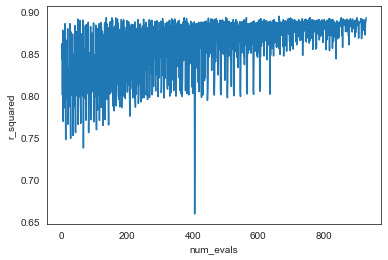

In [182]:
plt.plot(np.array([i for i in xgb_pso_log['value'] if i >= 0]).reshape(-1,1))
plt.ylabel('r_squared')
plt.xlabel('num_evals')
plt.show()

In [131]:
xgb_pso_runtime = xgb_pso_end_time - xgb_pso_start_time
xgb_pso_score = xgb_info.optimum

In [132]:
print("Score:", xgb_pso_score)
print("Runtime:", xgb_pso_runtime)

Score: 0.8951357022609334
Runtime: 2630.9268715381622


SCALED


In [136]:
@optunity.cross_validated(x=X_scaled.values, y=y.values, num_folds=5)
def xgb_performance_scaled(x_train, y_train, x_test, y_test, n_estimators, max_depth, min_child_weight,
                                 learning_rate, booster, base_score):
    xgb_reg_scaled = xgb.XGBRegressor(n_estimators=round(n_estimators), max_depth=round(max_depth), min_child_weight=round(min_child_weight),
                                 learning_rate=learning_rate, booster=booster, base_score=base_score)
    xgb_reg_scaled.fit(x_train_scaled, y_train_scaled)
    predictions = xgb_reg_scaled.predict(x_test_scaled)
    return optunity.metrics.r_squared(y_test_scaled, predictions)

In [137]:
xgb_pso_start_time = time.time()
xgb_optimal_configuration_scaled, xgb_info_scaled, _ = optunity.maximize_structured(xgb_performance_scaled,
                                                              search_space=xgb_search,
                                                              num_evals=1000)
xgb_pso_end_time = time.time()

[16:36:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[16:36:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[16:36:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

In [161]:
xgb_optimal_configuration_scaled

{'booster': 'gbtree',
 'base_score': 0.4042656684775631,
 'learning_rate': 0.30821194790726997,
 'max_depth': 2.788249999999996,
 'min_child_weight': 1.9428468662832317,
 'n_estimators': 250.0401817979173}

In [138]:
xgb_pso_runtime_scaled = xgb_pso_end_time - xgb_pso_start_time
xgb_pso_score_scaled = xgb_info_scaled.optimum

In [139]:
xgb_pso_log_scaled = optunity.call_log2dataframe(xgb_info_scaled.call_log)
xgb_pso_log_scaled.to_csv('xgb_pso_log_scaled.csv')

In [10]:
xgb_log_scaled = pd.read_csv(path + 'xgb_pso_log_scaled.csv')
xgb_log_scaled.sort_values(by='value', ascending=False)[:10]

,Unnamed: 0,n_estimators,min_child_weight,learning_rate,booster,base_score,max_depth,value
793,793,250.040182,1.942847,0.308212,gbtree,0.404266,2.788250,0.898912
836,836,249.174983,1.951509,0.308630,gbtree,0.409944,2.753176,0.897951
827,827,251.085132,1.945000,0.308181,gbtree,0.394416,3.126750,0.897265
769,769,252.589042,1.961794,0.308031,gbtree,0.398945,2.761907,0.896906
853,853,249.925429,1.925191,0.307138,gbtree,0.409612,2.883583,0.896681
342,342,250.056250,1.928592,0.308060,gbtree,0.411909,2.814750,0.896599
913,913,250.600591,1.979133,0.308064,gbtree,0.394438,2.713885,0.896581
974,974,248.825720,1.936851,0.307152,gbtree,0.406228,2.662684,0.896556
867,867,255.748520,1.929764,0.308539,gbtree,0.410714,2.902750,0.895420
977,977,255.220370,1.966998,0.307332,gbtree,0.410833,2.833611,0.895263


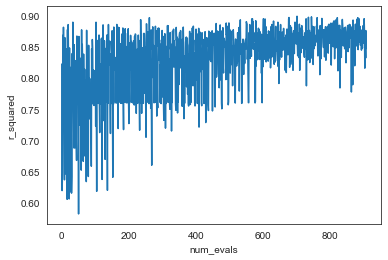

In [184]:
plt.plot(np.array([i for i in xgb_pso_log_scaled['value'] if i >= 0]).reshape(-1,1))
plt.ylabel('r_squared')
plt.xlabel('num_evals')
plt.show()

In [140]:
print("SCALED DATA\n")
print("Score:", xgb_pso_score_scaled)
print("Runtime:", xgb_pso_runtime_scaled)

SCALED DATA

Score: 0.8989124596430562
Runtime: 5237.9828226566315


Light GBM


In [141]:
lgb_search = {
    'n_estimators': [50, 300],
    'num_leaves': [2, 256],
    'min_child_samples': [5, 100],
    'learning_rate': [0.01, 1],
    'subsample': [0.5, 1],
    'subsample_freq': [1, 7],
    'colsample_bytree': [0.5, 1],
    'reg_alpha': [0, 10],
    'reg_lambda': [0, 10],
    'max_depth': [2, 24]
}

In [142]:
@optunity.cross_validated(x=X_.values, y=y.values, num_folds=5)
def lgb_performance(x_train, y_train, x_test, y_test, n_estimators, max_depth, num_leaves,
                                 learning_rate, min_child_samples, subsample, colsample_bytree, subsample_freq, reg_alpha, reg_lambda):
    lgb_reg = lgb.LGBMRegressor( n_estimators=int(n_estimators), max_depth=int(max_depth), num_leaves=int(num_leaves),
                                 learning_rate=learning_rate, min_child_samples=int(min_child_samples), 
                             subsample=subsample, colsample_bytree=colsample_bytree, subsample_freq=int(subsample_freq),
                             reg_alpha=reg_alpha, reg_lambda=reg_lambda)
    lgb_reg.fit(x_train, y_train)
    predictions = lgb_reg.predict(x_test)
    return optunity.metrics.r_squared(y_test, predictions)

In [143]:
lgb_pso_start_time = time.time()
lgb_optimal_configuration, lgb_info, _ = optunity.maximize_structured(lgb_performance,
                                                              search_space=lgb_search,
                                                              num_evals=1000)
lgb_pso_end_time = time.time()

In [160]:
lgb_optimal_configuration

{'colsample_bytree': 0.701725650221859,
 'learning_rate': 0.2350161422873012,
 'max_depth': 12.193528042322182,
 'min_child_samples': 55.46824177058749,
 'n_estimators': 225.35123962377284,
 'num_leaves': 128.8100150562593,
 'reg_alpha': 4.03954100286843,
 'reg_lambda': 6.800464711228725,
 'subsample': 0.8584492403077751,
 'subsample_freq': 2.803754843385871}

In [144]:
lgb_pso_log = optunity.call_log2dataframe(lgb_info.call_log)
lgb_pso_log.to_csv("lgb_pso_log.csv")

In [11]:
lgb_log = pd.read_csv(path + 'lgb_pso_log.csv')
lgb_log.sort_values(by='value', ascending=False)[:10]

,Unnamed: 0,subsample,learning_rate,reg_alpha,reg_lambda,colsample_bytree,min_child_samples,max_depth,subsample_freq,n_estimators,num_leaves,value
873,873,0.858449,0.235016,4.039541,6.800465,0.701726,55.468242,12.193528,2.803755,225.351240,128.810015,0.863429
989,989,0.853989,0.229442,4.140044,6.921633,0.704047,54.947600,11.918459,2.885177,222.703441,135.335134,0.862811
977,977,0.849442,0.233135,3.809714,6.713360,0.702680,55.449266,12.205084,2.737463,228.947329,129.680618,0.862332
854,854,0.854859,0.236017,2.522216,6.861104,0.707995,55.129112,12.144766,2.841661,211.282227,118.098826,0.861665
790,790,0.852333,0.230525,2.448884,6.774771,0.704572,55.370904,12.068830,2.830445,228.238041,131.598539,0.861518
923,923,0.854904,0.236110,3.900255,6.845085,0.703363,55.117291,12.384670,2.726296,223.571510,129.122232,0.861332
744,744,0.849778,0.232240,2.481996,6.646232,0.701338,55.878421,11.810183,2.590782,228.744600,110.455536,0.861276
827,827,0.849715,0.232179,2.468188,6.915467,0.703828,55.851668,12.007072,2.694398,225.713822,114.830613,0.861120
855,855,0.853949,0.230559,2.473401,6.814037,0.706265,55.257910,11.757286,2.687213,226.061129,134.148895,0.861021
679,679,0.855607,0.236039,2.588315,6.559619,0.708205,55.183547,11.718878,2.636323,229.722822,104.259037,0.861007


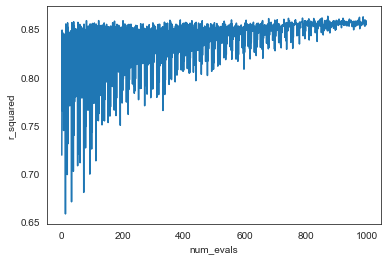

In [185]:
plt.plot(np.array([i for i in lgb_pso_log['value'] if i >= 0]).reshape(-1,1))
plt.ylabel('r_squared')
plt.xlabel('num_evals')
plt.show()

In [145]:
lgb_pso_score = lgb_info.optimum
lgb_pso_runtime = lgb_pso_end_time - lgb_pso_start_time

In [146]:
print("Score:", lgb_pso_score)
print("Runtime:", lgb_pso_runtime)

Score: 0.8634288330381352
Runtime: 1400.5752317905426


SCALED

In [149]:
@optunity.cross_validated(x=X_scaled.values, y=y.values, num_folds=5)
def lgb_performance_scaled(x_train, y_train, x_test, y_test, n_estimators, max_depth, num_leaves,
                                 learning_rate, min_child_samples, subsample, colsample_bytree, subsample_freq, reg_alpha, reg_lambda):
    lgb_reg_scaled = lgb.LGBMRegressor( n_estimators=int(n_estimators), max_depth=int(max_depth), num_leaves=int(num_leaves),
                                 learning_rate=learning_rate, min_child_samples=int(min_child_samples), 
                             subsample=subsample, colsample_bytree=colsample_bytree, subsample_freq=int(subsample_freq),
                             reg_alpha=reg_alpha, reg_lambda=reg_lambda)
    lgb_reg_scaled.fit(x_train_scaled, y_train_scaled)
    predictions = lgb_reg_scaled.predict(x_test_scaled)
    return optunity.metrics.r_squared(y_test_scaled, predictions)

In [150]:
lgb_pso_start_time = time.time()
lgb_optimal_configuration_scaled, lgb_info_scaled, _ = optunity.maximize_structured(lgb_performance_scaled,
                                                              search_space=lgb_search,
                                                              num_evals=1000)
lgb_pso_end_time = time.time()

In [151]:
lgb_pso_log_scaled = optunity.call_log2dataframe(lgb_info_scaled.call_log)
lgb_pso_log_scaled.to_csv("lgb_pso_log_scaled.csv")

In [12]:
lgb_log_scaled = pd.read_csv(path + 'lgb_pso_log_scaled.csv')
lgb_log_scaled.sort_values(by='value', ascending=False)[:10]

,Unnamed: 0,subsample,learning_rate,colsample_bytree,reg_alpha,n_estimators,subsample_freq,min_child_samples,max_depth,num_leaves,reg_lambda,value
646,646,0.615366,0.046900,0.848510,5.850644,228.778901,5.166203,42.837912,12.357283,136.540938,5.537578,0.921199
722,722,0.619505,0.048425,0.844139,5.781460,206.029297,4.752203,44.317097,12.188814,135.933246,5.416475,0.919469
900,900,0.613565,0.053856,0.837285,5.851895,231.207807,5.189976,41.441250,12.050485,134.260359,5.527037,0.918808
752,752,0.612856,0.062814,0.849614,6.005888,225.984190,3.953453,42.673506,12.292305,132.463194,5.553205,0.918658
862,862,0.617776,0.040339,0.847110,5.861327,230.529297,5.254266,42.841267,12.100483,137.647540,5.350667,0.918261
899,899,0.612123,0.041185,0.853362,5.909496,231.975376,5.092975,43.447137,12.404875,141.085108,5.557920,0.917789
949,949,0.612206,0.063315,0.846023,5.722635,227.490025,5.207453,41.889622,12.262808,135.699478,5.525228,0.917778
864,864,0.612719,0.052203,0.844650,6.085718,232.358401,4.803750,42.848600,12.341127,137.394389,5.528286,0.917658
886,886,0.619790,0.040467,0.851078,5.762310,230.409740,5.111594,42.698472,12.197682,141.117013,5.436634,0.917576
534,534,0.611254,0.047834,0.842697,5.692781,227.317732,5.407706,43.629712,12.680346,134.937667,5.947351,0.917470


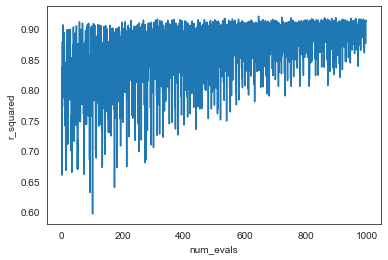

In [186]:
plt.plot(np.array([i for i in lgb_pso_log_scaled['value'] if i >= 0]).reshape(-1,1))
plt.ylabel('r_squared')
plt.xlabel('num_evals')
plt.show()

In [159]:
lgb_optimal_configuration_scaled


{'colsample_bytree': 0.8485100938552603,
 'learning_rate': 0.04689964175226329,
 'max_depth': 12.35728277384619,
 'min_child_samples': 42.83791217072242,
 'n_estimators': 228.7789006763676,
 'num_leaves': 136.5409382928979,
 'reg_alpha': 5.850644434947144,
 'reg_lambda': 5.537578124999998,
 'subsample': 0.6153660610421329,
 'subsample_freq': 5.166203124999996}

In [152]:
lgb_pso_score_scaled = lgb_info_scaled.optimum
lgb_pso_runtime_scaled = lgb_pso_end_time - lgb_pso_start_time

In [153]:
print("Score:", lgb_pso_score_scaled)
print("Runtime:", lgb_pso_runtime_scaled)

Score: 0.921199486544366
Runtime: 1833.8467671871185


# Random Search


Randomforest

In [187]:
def objective_rdf(trial):
    n_estimators = trial.suggest_int('n_estimators', 10, 300, log=True)
    max_features = trial.suggest_float('max_features', 0.1, 1)
    max_depth =  trial.suggest_int('max_depth', 3, 50, log=True)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20, log=True)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 20, log=True)

    rdf_reg = RandomForestRegressor(n_estimators=n_estimators, max_features=max_features, max_depth=max_depth, 
                                    min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)
    
    cv = KFold(n_splits=5, shuffle=True)
    scores = cross_val_score(rdf_reg, x_train, y_train, cv=cv, scoring='r2')
    return scores.mean()

In [189]:
rs_rf_study = optuna.create_study(sampler=optuna.samplers.RandomSampler(), direction='maximize')
rf_rs_start_time = time.time()
rs_rf_study.optimize(objective_rdf, n_trials=1000)
rf_rs_end_time = time.time()

[I 2021-12-28 22:45:47,655] A new study created in memory with name: no-name-bf3b6623-1c53-47d4-b74c-3a20978b4ea0
[I 2021-12-28 22:45:48,309] Trial 0 finished with value: 0.8350514493060304 and parameters: {'n_estimators': 37, 'max_features': 0.4009271736282283, 'max_depth': 48, 'min_samples_split': 7, 'min_samples_leaf': 11}. Best is trial 0 with value: 0.8350514493060304.
[I 2021-12-28 22:45:48,463] Trial 1 finished with value: 0.8068045559757682 and parameters: {'n_estimators': 11, 'max_features': 0.22796571705902385, 'max_depth': 5, 'min_samples_split': 10, 'min_samples_leaf': 8}. Best is trial 0 with value: 0.8350514493060304.
[I 2021-12-28 22:45:51,664] Trial 2 finished with value: 0.8579441685402884 and parameters: {'n_estimators': 140, 'max_features': 0.4447640892946776, 'max_depth': 46, 'min_samples_split': 2, 'min_samples_leaf': 5}. Best is trial 2 with value: 0.8579441685402884.
[I 2021-12-28 22:46:02,388] Trial 3 finished with value: 0.8393022788317321 and parameters: {'n_e

In [199]:
rf_rs_runtime = rf_rs_end_time - rf_rs_start_time
rf_rs_score = rs_rf_study.best_value

In [200]:
print("Score:", rf_rs_score)
print("Runtime:", rf_rs_runtime)

Score: 0.8735810648331727
Runtime: 1794.5252072811127


SCALED

In [201]:
def objective_rdf_scaled(trial):
    n_estimators = trial.suggest_int('n_estimators', 10, 300, log=True)
    max_features = trial.suggest_float('max_features', 0.1, 1)
    max_depth =  trial.suggest_int('max_depth', 3, 50, log=True)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20, log=True)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 20, log=True)

    rdf_reg = RandomForestRegressor(n_estimators=n_estimators, max_features=max_features, max_depth=max_depth, 
                                    min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)
    
    cv = KFold(n_splits=5, shuffle=True)
    scores = cross_val_score(rdf_reg, x_train_scaled, y_train_scaled, cv=cv, scoring='r2')
    return scores.mean()

In [202]:
rs_rf_study_scaled = optuna.create_study(sampler=optuna.samplers.RandomSampler(), direction='maximize')
rf_rs_start_time = time.time()
rs_rf_study_scaled.optimize(objective_rdf_scaled, n_trials=1000)
rf_rs_end_time = time.time()

[I 2021-12-28 23:45:53,819] A new study created in memory with name: no-name-b3d30358-f916-4751-8f52-577cc99a6fe5
[I 2021-12-28 23:45:56,667] Trial 0 finished with value: 0.7786810074357293 and parameters: {'n_estimators': 106, 'max_features': 0.25971666596994597, 'max_depth': 8, 'min_samples_split': 7, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.7786810074357293.
[I 2021-12-28 23:45:59,038] Trial 1 finished with value: 0.786977947624242 and parameters: {'n_estimators': 76, 'max_features': 0.2763141038566604, 'max_depth': 33, 'min_samples_split': 4, 'min_samples_leaf': 6}. Best is trial 1 with value: 0.786977947624242.
[I 2021-12-28 23:45:59,423] Trial 2 finished with value: 0.7657935935975722 and parameters: {'n_estimators': 15, 'max_features': 0.22215616792488851, 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 5}. Best is trial 1 with value: 0.786977947624242.
[I 2021-12-28 23:46:03,575] Trial 3 finished with value: 0.768909224416481 and parameters: {'n_estimat

In [203]:
rf_rs_runtime = rf_rs_end_time - rf_rs_start_time
rf_rs_score_scaled = rs_rf_study_scaled.best_value

In [204]:
print("Score:", rf_rs_score_scaled)
print("Runtime:", rf_rs_runtime)

Score: 0.8071232830120149
Runtime: 3461.5298273563385


XGBoost

In [205]:
def objective_xgb(trial):
    n_estimators = trial.suggest_int('n_estimators', 10, 300, log=True)
    max_depth = trial.suggest_int('max_depth', 2, 10, log=True)
    base_score = trial.suggest_float('base_score', 0.01, 1)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 4, log=True)
    learning_rate = trial.suggest_float('learning_rate', 0.001, 1)
    booster_ = trial.suggest_float('booster_', 0, 1)
    booster = ['gbtree', 'gblinear']
    
    xgb_reg = xgb.XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, min_child_weight=min_child_weight, learning_rate=learning_rate,
                                base_score=base_score, booster=booster[round(booster_)])
    
    cv = KFold(n_splits=5, shuffle=True)
    scores = cross_val_score(xgb_reg, x_train, y_train, cv=cv, scoring='r2')
    return scores.mean()

In [206]:
rs_xgb_study = optuna.create_study(sampler=optuna.samplers.RandomSampler(), direction='maximize')
xgb_rs_start_time = time.time()
rs_xgb_study.optimize(objective_xgb, n_trials=1000)
xgb_rs_end_time = time.time()

[I 2021-12-29 00:43:35,462] A new study created in memory with name: no-name-d1c9c26a-24cb-4282-9354-08bba1394e35


[00:43:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:36,209] Trial 0 finished with value: 0.74658455993221 and parameters: {'n_estimators': 187, 'max_depth': 2, 'base_score': 0.6901482738412398, 'min_child_weight': 1, 'learning_rate': 0.09545887191037039, 'booster_': 0.9780265008793688}. Best is trial 0 with value: 0.74658455993221.


[00:43:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:36,775] Trial 1 finished with value: 0.7542570933125317 and parameters: {'n_estimators': 134, 'max_depth': 2, 'base_score': 0.7634303347863632, 'min_child_weight': 2, 'learning_rate': 0.10491902831492557, 'booster_': 0.9530672775703212}. Best is trial 1 with value: 0.7542570933125317.


[00:43:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:37,552] Trial 3 finished with value: 0.7199897231325247 and parameters: {'n_estimators': 38, 'max_depth': 2, 'base_score': 0.7977082136667496, 'min_child_weight': 2, 'learning_rate': 0.15781295990186742, 'booster_': 0.651051455273665}. Best is trial 1 with value: 0.7542570933125317.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:37,779] Trial 4 finished with value: 0.7299748323796065 and parameters: {'n_estimators': 31, 'max_depth': 2, 'base_score': 0.7771995384056373, 'min_child_weight': 2, 'learning_rate': 0.24129080099045813, 'booster_': 0.747831353437121}. Best is trial 1 with value: 0.7542570933125317.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:37,936] Trial 5 finished with value: -3.477126914630882e+32 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.3611867479629366, 'min_child_weight': 1, 'learning_rate': 0.643369394048322, 'booster_': 0.5970435284546574}. Best is trial 1 with value: 0.7542570933125317.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:38,100] Trial 6 finished with value: -9.448460457334595e+22 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.5637847539085662, 'min_child_weight': 1, 'learning_rate': 0.6749001419730453, 'booster_': 0.5285823133328348}. Best is trial 1 with value: 0.7542570933125317.


[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:40,913] Trial 12 finished with value: 0.7736665522455946 and parameters: {'n_estimators': 120, 'max_depth': 4, 'base_score': 0.3141907410701631, 'min_child_weight': 1, 'learning_rate': 0.9069143999042315, 'booster_': 0.16711934984067078}. Best is trial 10 with value: 0.7840696364486561.
[I 2021-12-29 00:43:42,552] Trial 13 finished with value: 0.7745276014488213 and parameters: {'n_estimators': 171, 'max_depth': 3, 'base_score': 0.36385305969594195, 'min_child_weight': 3, 'learning_rate': 0.8772056461556786, 'booster_': 0.05091532774734786}. Best is trial 10 with value: 0.7840696364486561.


[00:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:42,757] Trial 14 finished with value: -1.2067925547268192e+23 and parameters: {'n_estimators': 23, 'max_depth': 6, 'base_score': 0.26074223488444254, 'min_child_weight': 3, 'learning_rate': 0.5407811916672641, 'booster_': 0.660834139256946}. Best is trial 10 with value: 0.7840696364486561.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[00:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:43:43,343] Trial 16 finished with value: 0.7993219993190859 and parameters: {'n_estimators': 27, 'max_depth': 2, 'base_score': 0.06895375263490777, 'min_child_weight': 2, 'learning_rate': 0.6220186190956437, 'booster_': 0.32968222461985586}. Best is trial 16 with value: 0.7993219993190859.


[00:43:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:43,653] Trial 17 finished with value: 0.7016774528839421 and parameters: {'n_estimators': 56, 'max_depth': 2, 'base_score': 0.3961644838969669, 'min_child_weight': 1, 'learning_rate': 0.25686570912648254, 'booster_': 0.6605674741523614}. Best is trial 16 with value: 0.7993219993190859.


[00:43:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:44,122] Trial 18 finished with value: 0.7682089426474583 and parameters: {'n_estimators': 101, 'max_depth': 2, 'base_score': 0.36391982463246914, 'min_child_weight': 2, 'learning_rate': 0.0784331907963811, 'booster_': 0.9726396337116336}. Best is trial 16 with value: 0.7993219993190859.


[00:43:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:45,362] Trial 20 finished with value: 0.8628336331533966 and parameters: {'n_estimators': 35, 'max_depth': 10, 'base_score': 0.35144690376805177, 'min_child_weight': 4, 'learning_rate': 0.2014173525097307, 'booster_': 0.0036683601860891812}. Best is trial 20 with value: 0.8628336331533966.
[I 2021-12-29 00:43:45,560] Trial 21 finished with value: 0.7123354958888141 and parameters: {'n_estimators': 20, 'max_depth': 3, 'base_score': 0.8056489964290966, 'min_child_weight': 1, 'learning_rate': 0.21504973780578182, 'booster_': 0.7004763380271228}. Best is trial 20 with value: 0.8628336331533966.


[00:43:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:49,831] Trial 28 finished with value: 0.7755622734817125 and parameters: {'n_estimators': 109, 'max_depth': 5, 'base_score': 0.860037080283069, 'min_child_weight': 1, 'learning_rate': 0.2520703039448521, 'booster_': 0.7457073952694896}. Best is trial 20 with value: 0.8628336331533966.


[00:43:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:43:50,925] Trial 29 failed, because the objective function returned nan.
[I 2021-12-29 00:43:52,416] Trial 30 finished with value: 0.7921925421054844 and parameters: {'n_estimators': 110, 'max_depth': 5, 'base_score': 0.3204749949122556, 'min_child_weight': 1, 'learning_rate': 0.5988502659195887, 'booster_': 0.15734007147066076}. Best is trial 20 with value: 0.8628336331533966.
[I 2021-12-29 00:43:54,463] Trial 31 finished with value: 0.8355100617210175 and parameters: {'n_estimators': 110, 'max_depth': 7, 'base_score': 0.5671622895169884, 'min_child_weight': 1, 'learning_rate': 0.183878820518947, 'booster_': 0.31426334149098334}. Best is trial 20 with value: 0.8628336331533966.
[I 2021-12-29 00:43:54,658] Trial 32 finished with value: 0.7914454185551127 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.8583934972195509, 'min_child_weight': 2, 'learning_rate': 0.8154635099736429, 'booster_': 0.29915026205683937}. Best is trial 20 with value: 0.862833

[00:43:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:43:55,450] Trial 35 finished with value: 0.8253775711576348 and parameters: {'n_estimators': 48, 'max_depth': 2, 'base_score': 0.031343105393559646, 'min_child_weight': 3, 'learning_rate': 0.696815267320216, 'booster_': 0.047560848926784915}. Best is trial 20 with value: 0.8628336331533966.
[I 2021-12-29 00:43:56,636] Trial 36 finished with value: 0.8779351369039062 and parameters: {'n_estimators': 173, 'max_depth': 2, 'base_score': 0.858869872249574, 'min_child_weight': 1, 'learning_rate': 0.2628493722870456, 'booster_': 0.42512530781758706}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estim

[00:43:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:43:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:43:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:43:57,293] Trial 38 finished with value: 0.7949233820830148 and parameters: {'n_estimators': 24, 'max_depth': 3, 'base_score': 0.8825769650678956, 'min_child_weight': 4, 'learning_rate': 0.9698968022140676, 'booster_': 0.028464093394941936}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:43:57,674] Trial 39 finished with value: 0.8266075659560697 and parameters: {'n_estimators': 41, 'max_depth': 2, 'base_score': 0.9959183532940095, 'min_child_weight': 4, 'learning_rate': 0.48467209049489196, 'booster_': 0.3618052519079401}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:43:58,130] Trial 40 finished with value: 0.8270725103556005 and parameters: {'n_estimators': 25, 'max_depth': 6, 'base_score': 0.6004114909869948, 'min_child_weight': 3, 'learning_rate': 0.5791746685073542, 'booster_': 0.4614217884846341}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:43:59,076] Trial 41 finished with value: 0.8339613050682683 an

[00:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:03,085] Trial 46 finished with value: 0.7693560332970881 and parameters: {'n_estimators': 116, 'max_depth': 2, 'base_score': 0.49008775939328236, 'min_child_weight': 1, 'learning_rate': 0.21940786312113542, 'booster_': 0.814425509379505}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:03,275] Trial 47 finished with value: 0.7319596549742688 and parameters: {'n_estimators': 16, 'max_depth': 5, 'base_score': 0.5296926198808528, 'min_child_weight': 3, 'learning_rate': 0.08799699142586728, 'booster_': 0.7955778679472321}. Best is trial 36 with value: 0.8779351369039062.


[00:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:03,563] Trial 48 finished with value: 0.8203779148335109 and parameters: {'n_estimators': 28, 'max_depth': 2, 'base_score': 0.1401862099839151, 'min_child_weight': 1, 'learning_rate': 0.5400524272895654, 'booster_': 0.055554102985660436}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:05,053] Trial 49 finished with value: 0.8458522581111433 and parameters: {'n_estimators': 208, 'max_depth': 2, 'base_score': 0.8033015299875804, 'min_child_weight': 3, 'learning_rate': 0.06203514291006004, 'booster_': 0.25359340519686535}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:05,549] Trial 50 finished with value: 0.8316969349771105 and parameters: {'n_estimators': 38, 'max_depth': 4, 'base_score': 0.6414260193590494, 'min_child_weight': 2, 'learning_rate': 0.07200128440439815, 'booster_': 0.3362812239659747}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:06,095] Trial 51 finished with value: 0.8656548955745273

[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:44:06,575] Trial 52 failed, because the objective function returned nan.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:06,763] Trial 53 finished with value: -10254.153132278698 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.036908508340497255, 'min_child_weight': 2, 'learning_rate': 0.4601464861329136, 'booster_': 0.6624271105045958}. Best is trial 36 with value: 0.8779351369039062.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:07,179] Trial 55 finished with value: -4.71824478069761e+45 and parameters: {'n_estimators': 25, 'max_depth': 6, 'base_score': 0.3077730180728185, 'min_child_weight': 3, 'learning_rate': 0.5790875809354218, 'booster_': 0.6153887494694585}. Best is trial 36 with value: 0.8779351369039062.


[00:44:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:08,445] Trial 56 finished with value: 0.8221150450347464 and parameters: {'n_estimators': 171, 'max_depth': 2, 'base_score': 0.7920636486271662, 'min_child_weight': 2, 'learning_rate': 0.8725794083242104, 'booster_': 0.025943892809685787}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:09,192] Trial 57 finished with value: 0.8112177906238699 and parameters: {'n_estimators': 20, 'max_depth': 9, 'base_score': 0.5951817367662628, 'min_child_weight': 1, 'learning_rate': 0.50851269126653, 'booster_': 0.24515487261995705}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimat

[00:44:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:10,521] Trial 59 finished with value: 0.7222183176859784 and parameters: {'n_estimators': 28, 'max_depth': 7, 'base_score': 0.722188376112099, 'min_child_weight': 1, 'learning_rate': 0.9697905561772596, 'booster_': 0.4477837804429391}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:10,922] Trial 60 finished with value: 0.8612169814280175 and parameters: {'n_estimators': 32, 'max_depth': 3, 'base_score': 0.5223871767546738, 'min_child_weight': 3, 'learning_rate': 0.5379870199005213, 'booster_': 0.24836698853622508}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator

[00:44:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:11,991] Trial 62 finished with value: -0.3451901835068819 and parameters: {'n_estimators': 65, 'max_depth': 5, 'base_score': 0.12116621002168039, 'min_child_weight': 1, 'learning_rate': 0.39972826580262766, 'booster_': 0.5065084502935033}. Best is trial 36 with value: 0.8779351369039062.


[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:12,196] Trial 63 finished with value: 0.7660778273553307 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.4359868616286768, 'min_child_weight': 4, 'learning_rate': 0.5421646950524472, 'booster_': 0.4608779939499247}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:12,496] Trial 64 finished with value: 0.7688008101934225 and parameters: {'n_estimators': 11, 'max_depth': 7, 'base_score': 0.4213378774322425, 'min_child_weight': 4, 'learning_rate': 0.8537422115725111, 'booster_': 0.29568647936114456}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimato

[00:44:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:44:13,191] Trial 65 failed, because the objective function returned nan.


[00:44:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:14,220] Trial 66 finished with value: 0.7790601262356607 and parameters: {'n_estimators': 215, 'max_depth': 8, 'base_score': 0.694101014918118, 'min_child_weight': 1, 'learning_rate': 0.37543427056861667, 'booster_': 0.8532649475854113}. Best is trial 36 with value: 0.8779351369039062.


[00:44:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:15,325] Trial 67 finished with value: 0.8702540925618021 and parameters: {'n_estimators': 105, 'max_depth': 3, 'base_score': 0.3798422279941641, 'min_child_weight': 4, 'learning_rate': 0.24253008378662883, 'booster_': 0.21983853673357812}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:15,674] Trial 68 finished with value: 0.8063410200933395 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.40341688123926006, 'min_child_weight': 2, 'learning_rate': 0.4906160956218704, 'booster_': 0.03330377135976914}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:16,683] Trial 69 finished with value: 0.8276459212586016 and parameters: {'n_estimators': 74, 'max_depth': 4, 'base_score': 0.05392974903235863, 'min_child_weight': 1, 'learning_rate': 0.5514592054895591, 'booster_': 0.36569532468862054}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:17,108] Trial 70 finished with value: 0.786706287924822

[00:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:21,220] Trial 74 finished with value: 0.6548894091335085 and parameters: {'n_estimators': 27, 'max_depth': 5, 'base_score': 0.8028831394268537, 'min_child_weight': 1, 'learning_rate': 0.2340599985311844, 'booster_': 0.901312268103409}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:21,390] Trial 75 finished with value: -1.373489211170138 and parameters: {'n_estimators': 12, 'max_depth': 9, 'base_score': 0.04106382959969797, 'min_child_weight': 4, 'learning_rate': 0.45308546243328157, 'booster_': 0.901783270514146}. Best is trial 36 with value: 0.8779351369039062.


[00:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:21,728] Trial 76 finished with value: -1.0058728318195655 and parameters: {'n_estimators': 16, 'max_depth': 8, 'base_score': 0.2867487876178066, 'min_child_weight': 4, 'learning_rate': 0.03755916663915626, 'booster_': 0.046471199950254505}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * sel

[00:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:44:21,957] Trial 77 failed, because the objective function returned nan.
[I 2021-12-29 00:44:22,414] Trial 78 finished with value: 0.8079535843487029 and parameters: {'n_estimators': 43, 'max_depth': 3, 'base_score': 0.4049468490945846, 'min_child_weight': 1, 'learning_rate': 0.8128237137820498, 'booster_': 0.23926293109671448}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:25,338] Trial 79 finished with value: 0.8582325518285007 and parameters: {'n_estimators': 120, 'max_depth': 9, 'base_score': 0.8482422202954867, 'min_child_weight': 1, 'learning_rate': 0.16384007856397442, 'booster_': 0.06368371515107818}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:26,071] Trial 80 finished with value: 0.7469687091397194 and parameters: {'n_estimators': 62, 'max_depth': 4, 'base_score': 0.4325327222801421, 'min_child_weight': 2, 'learning_rate': 0.8335359572909359, 'booster_': 0.23205483635347313}. Best is trial 36 with value: 0.87793

[00:44:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:28,553] Trial 82 finished with value: 0.7457698798682166 and parameters: {'n_estimators': 39, 'max_depth': 4, 'base_score': 0.567531865403792, 'min_child_weight': 1, 'learning_rate': 0.314646519835417, 'booster_': 0.9394555394913977}. Best is trial 36 with value: 0.8779351369039062.


[00:44:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:28,926] Trial 83 finished with value: -0.7362636575769308 and parameters: {'n_estimators': 16, 'max_depth': 6, 'base_score': 0.44818673387942504, 'min_child_weight': 4, 'learning_rate': 0.04232104454871972, 'booster_': 0.3123929507430355}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:29,497] Trial 84 finished with value: 0.7248939087174169 and parameters: {'n_estimators': 28, 'max_depth': 6, 'base_score': 0.6320212779672761, 'min_child_weight': 1, 'learning_rate': 0.6557278360824412, 'booster_': 0.3292479146614169}. Best is trial 36 with value: 0.8779351369039062.


[00:44:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:29,713] Trial 85 finished with value: -26149778175007.555 and parameters: {'n_estimators': 20, 'max_depth': 3, 'base_score': 0.8053942109405724, 'min_child_weight': 1, 'learning_rate': 0.5776635833206039, 'booster_': 0.7794027334143794}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._

[00:44:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:44:29,966] Trial 86 failed, because the objective function returned nan.


[00:44:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:30,464] Trial 87 finished with value: 0.8171412635960171 and parameters: {'n_estimators': 44, 'max_depth': 3, 'base_score': 0.48695972247718944, 'min_child_weight': 1, 'learning_rate': 0.6122659037836073, 'booster_': 0.2674835451449873}. Best is trial 36 with value: 0.8779351369039062.


[00:44:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:30,823] Trial 88 finished with value: -1.0427945106279892e+18 and parameters: {'n_estimators': 57, 'max_depth': 2, 'base_score': 0.8479137208057224, 'min_child_weight': 2, 'learning_rate': 0.4769532263681957, 'booster_': 0.5326505018827571}. Best is trial 36 with value: 0.8779351369039062.


[00:44:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:31,378] Trial 89 finished with value: 0.8591615284348748 and parameters: {'n_estimators': 50, 'max_depth': 3, 'base_score': 0.6401702610407161, 'min_child_weight': 2, 'learning_rate': 0.23130636132551127, 'booster_': 0.19206087138323036}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:33,214] Trial 94 finished with value: 0.8325198024586958 and parameters: {'n_estimators': 33, 'max_depth': 2, 'base_score': 0.18228539073487315, 'min_child_weight': 1, 'learning_rate': 0.3894971671844149, 'booster_': 0.25737406445010136}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:34,543] Trial 95 finished with value: 0.8502550081546566 and parameters: {'n_estimators': 171, 'max_depth': 2, 'base_score': 0.9774321829372747, 'min_child_weight': 1, 'learning_rate': 0.7467398060297091, 'booster_': 0.0782840809531492}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:34,865] Trial 96 finished with value: 0.7866925626638098 and parameters: {'n_estimators': 30, 'max_depth': 2, 'base_score': 0.09966411218696843, 'min_child_weight': 1, 'learning_rate': 0.9532426269882862, 'booster_': 0.3087410292878563}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validat

[00:44:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:35,873] Trial 98 finished with value: 0.8210200910268546 and parameters: {'n_estimators': 27, 'max_depth': 2, 'base_score': 0.3037508999682595, 'min_child_weight': 1, 'learning_rate': 0.14415930546350889, 'booster_': 0.2652484351721891}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:37,227] Trial 99 finished with value: 0.8058910795994763 and parameters: {'n_estimators': 55, 'max_depth': 8, 'base_score': 0.5814915223393821, 'min_child_weight': 3, 'learning_rate': 0.6216363132147764, 'booster_': 0.42455159776354723}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:39,200] Trial 100 finished with value: 0.7820423040950999 and parameters: {'n_estimators': 142, 'max_depth': 5, 'base_score': 0.7424220626424474, 'min_child_weight': 3, 'learning_rate': 0.7993561256976693, 'booster_': 0.2298872433923408}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:39,537] Trial 101 finished with value: 0.8513368547792795 

[00:44:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:39,756] Trial 102 finished with value: 0.5880505930898264 and parameters: {'n_estimators': 21, 'max_depth': 5, 'base_score': 0.015550457635325584, 'min_child_weight': 1, 'learning_rate': 0.36332909081057174, 'booster_': 0.9226715461729492}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:40,226] Trial 103 finished with value: 0.8349617957276292 and parameters: {'n_estimators': 41, 'max_depth': 3, 'base_score': 0.05745118942413404, 'min_child_weight': 1, 'learning_rate': 0.07569630705795033, 'booster_': 0.20463302995356436}. Best is trial 36 with value: 0.8779351369039062.


[00:44:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:40,560] Trial 104 finished with value: -8.155722697570928 and parameters: {'n_estimators': 53, 'max_depth': 10, 'base_score': 0.2447406483673142, 'min_child_weight': 3, 'learning_rate': 0.43828397785606216, 'booster_': 0.7904407168464811}. Best is trial 36 with value: 0.8779351369039062.


[00:44:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:41,192] Trial 105 finished with value: 0.7601003724166908 and parameters: {'n_estimators': 122, 'max_depth': 4, 'base_score': 0.3094727100648325, 'min_child_weight': 1, 'learning_rate': 0.18096611718949, 'booster_': 0.9704036832911925}. Best is trial 36 with value: 0.8779351369039062.


[00:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:41,461] Trial 106 finished with value: 0.7272339546812882 and parameters: {'n_estimators': 33, 'max_depth': 8, 'base_score': 0.2835638266121009, 'min_child_weight': 4, 'learning_rate': 0.22335777257632558, 'booster_': 0.6809943259929493}. Best is trial 36 with value: 0.8779351369039062.


[00:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:41,731] Trial 107 finished with value: 0.7328050727291393 and parameters: {'n_estimators': 33, 'max_depth': 3, 'base_score': 0.02376999695363951, 'min_child_weight': 1, 'learning_rate': 0.04502656329252649, 'booster_': 0.8373016411246825}. Best is trial 36 with value: 0.8779351369039062.


[00:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:42,427] Trial 108 finished with value: 0.734667056158743 and parameters: {'n_estimators': 38, 'max_depth': 6, 'base_score': 0.37235696592737655, 'min_child_weight': 3, 'learning_rate': 0.8579282444939033, 'booster_': 0.19447333834935654}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:42,692] Trial 109 finished with value: 0.6791730084068703 and parameters: {'n_estimators': 17, 'max_depth': 3, 'base_score': 0.75274974929084, 'min_child_weight': 1, 'learning_rate': 0.1090304997884632, 'booster_': 0.3075468363951934}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:42,952] Trial 110 finished with value: 0.832284365175863 and parameters: {'n_estimators': 11, 'max_depth': 5, 'base_score': 0.9155074736747886, 'min_child_weight': 1, 'learning_rate': 0.42044542917811534, 'booster_': 0.0011425548522580042}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:43,685] Trial 111 finished with value: 0.8221138318298757

[00:44:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:48,827] Trial 117 finished with value: 0.8400997485310316 and parameters: {'n_estimators': 39, 'max_depth': 2, 'base_score': 0.7264996108713263, 'min_child_weight': 4, 'learning_rate': 0.7776400082175042, 'booster_': 0.04648429537075549}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[00:44:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:49,668] Trial 119 finished with value: -1.9145090602340069e+28 and parameters: {'n_estimators': 104, 'max_depth': 2, 'base_score': 0.9997377209382682, 'min_child_weight': 1, 'learning_rate': 0.49642203399208007, 'booster_': 0.8417219481001582}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign *

[00:44:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:52,724] Trial 121 finished with value: 0.8741704994077315 and parameters: {'n_estimators': 260, 'max_depth': 3, 'base_score': 0.7928142570383564, 'min_child_weight': 1, 'learning_rate': 0.4038384227745244, 'booster_': 0.14389388071011}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:53,426] Trial 122 finished with value: 0.8333827174357114 and parameters: {'n_estimators': 59, 'max_depth': 3, 'base_score': 0.701020040338377, 'min_child_weight': 1, 'learning_rate': 0.5402375367825939, 'booster_': 0.4801201601374956}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:53,603] Trial 123 finished with value: 0.6455500441632818 and parameters: {'n_estimators': 12, 'max_depth': 4, 'base_score': 0.017759677071226696, 'min_child_weight': 1, 'learning_rate': 0.3146545516080073, 'booster_': 0.620662696810995}. Best is trial 36 with value: 0.8779351369039062.


[00:44:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:55,342] Trial 124 finished with value: 0.81908955583533 and parameters: {'n_estimators': 120, 'max_depth': 5, 'base_score': 0.3819417067824754, 'min_child_weight': 2, 'learning_rate': 0.44360701179752804, 'booster_': 0.17666870582508176}. Best is trial 36 with value: 0.8779351369039062.


[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:55,580] Trial 125 finished with value: -4.3306568782063435e+53 and parameters: {'n_estimators': 23, 'max_depth': 2, 'base_score': 0.19131237952547994, 'min_child_weight': 3, 'learning_rate': 0.7746456489329218, 'booster_': 0.7889063818736746}. Best is trial 36 with value: 0.8779351369039062.


[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:44:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:56,898] Trial 127 finished with value: 0.8534923014115604 and parameters: {'n_estimators': 56, 'max_depth': 4, 'base_score': 0.39339606169555935, 'min_child_weight': 2, 'learning_rate': 0.06529918624106748, 'booster_': 0.09956390656425906}. Best is trial 36 with value: 0.8779351369039062.


[00:44:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:44:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:44:57,491] Trial 128 finished with value: 0.7590674259695182 and parameters: {'n_estimators': 117, 'max_depth': 2, 'base_score': 0.971294703554916, 'min_child_weight': 1, 'learning_rate': 0.17432611386476493, 'booster_': 0.7927528479413243}. Best is trial 36 with value: 0.8779351369039062.


[00:44:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:44:59,379] Trial 129 finished with value: 0.7726782508932315 and parameters: {'n_estimators': 138, 'max_depth': 4, 'base_score': 0.44776754271567343, 'min_child_weight': 1, 'learning_rate': 0.8064352267759, 'booster_': 0.37147525110825264}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:44:59,956] Trial 130 finished with value: 0.8437442876730363 and parameters: {'n_estimators': 15, 'max_depth': 10, 'base_score': 0.7128787789539199, 'min_child_weight': 1, 'learning_rate': 0.2939904618909167, 'booster_': 0.14401767553059242}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:00,205] Trial 131 finished with value: -0.22325993076268613 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.4424076320969316, 'min_child_weight': 3, 'learning_rate': 0.0537823162583089, 'booster_': 0.34955711167162107}. Best is trial 36 with value: 0.8779351369039062.


[00:45:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:00,716] Trial 132 finished with value: -7.388491153969957e+31 and parameters: {'n_estimators': 91, 'max_depth': 5, 'base_score': 0.08439780823340189, 'min_child_weight': 4, 'learning_rate': 0.4790629602666919, 'booster_': 0.931820011494142}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:01,828] Trial 133 finished with value: 0.8202471846443311 and parameters: {'n_estimators': 137, 'max_depth': 2, 'base_score': 0.47125135873988694, 'min_child_weight': 1, 'learning_rate': 0.901027591967907, 'booster_': 0.0846375410740331}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:02,016] Trial 134 finished with value: 0.6665181071044058 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.9399022239994703, 'min_child_weight': 1, 'learning_rate': 0.21196150647698908, 'booster_': 0.9600326151121855}. Best is trial 36 with value: 0.8779351369039062.


[00:45:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:04,160] Trial 135 finished with value: 0.8633567535658765 and parameters: {'n_estimators': 136, 'max_depth': 5, 'base_score': 0.7359458738037529, 'min_child_weight': 3, 'learning_rate': 0.4230332147320011, 'booster_': 0.2664241502324738}. Best is trial 36 with value: 0.8779351369039062.


[00:45:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:05,598] Trial 136 finished with value: 0.7975037565386601 and parameters: {'n_estimators': 295, 'max_depth': 2, 'base_score': 0.3513783486536209, 'min_child_weight': 4, 'learning_rate': 0.372188867767242, 'booster_': 0.7001777605379141}. Best is trial 36 with value: 0.8779351369039062.


[00:45:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:06,897] Trial 139 finished with value: 0.8135988484740222 and parameters: {'n_estimators': 34, 'max_depth': 3, 'base_score': 0.5895809663351865, 'min_child_weight': 4, 'learning_rate': 0.610588111785766, 'booster_': 0.32410227393500024}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:07,325] Trial 140 finished with value: 0.7628746839470363 and parameters: {'n_estimators': 29, 'max_depth': 4, 'base_score': 0.9922250515835942, 'min_child_weight': 1, 'learning_rate': 0.78696764682856, 'booster_': 0.22592816902211976}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimato

[00:45:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:08,424] Trial 142 finished with value: 0.8428892405970807 and parameters: {'n_estimators': 72, 'max_depth': 2, 'base_score': 0.49392348337466446, 'min_child_weight': 3, 'learning_rate': 0.8721727823652596, 'booster_': 0.11649972453208168}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:08,626] Trial 143 finished with value: 0.7885132197579615 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.5221528573744048, 'min_child_weight': 4, 'learning_rate': 0.8538780831934595, 'booster_': 0.10273934011489183}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:09,155] Trial 144 finished with value: 0.799968668402552 and parameters: {'n_estimators': 32, 'max_depth': 5, 'base_score': 0.8587842257293664, 'min_child_weight': 3, 'learning_rate': 0.7169790866218516, 'booster_': 0.4912406701772303}. Best is trial 36 with value: 0.8779351369039062.


[00:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:09,587] Trial 145 finished with value: 0.7483867015089278 and parameters: {'n_estimators': 77, 'max_depth': 5, 'base_score': 0.90555023567356, 'min_child_weight': 2, 'learning_rate': 0.15321234187936775, 'booster_': 0.9205507388812206}. Best is trial 36 with value: 0.8779351369039062.


[00:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:10,196] Trial 146 finished with value: 0.10093188417393639 and parameters: {'n_estimators': 124, 'max_depth': 2, 'base_score': 0.9098475561103797, 'min_child_weight': 1, 'learning_rate': 0.48676588083840944, 'booster_': 0.9202282707696517}. Best is trial 36 with value: 0.8779351369039062.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:10,453] Trial 147 finished with value: -6.849739595278089e+24 and parameters: {'n_estimators': 28, 'max_depth': 6, 'base_score': 0.7818464507236271, 'min_child_weight': 2, 'learning_rate': 0.6718616165491671, 'booster_': 0.5103464261580256}. Best is trial 36 with value: 0.8779351369039062.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:10,733] Trial 148 finished with value: -161606.30928567256 and parameters: {'n_estimators': 31, 'max_depth': 5, 'base_score': 0.5491066043763678, 'min_child_weight': 1, 'learning_rate': 0.5127315305078601, 'booster_': 0.9330766372047459}. Best is trial 36 with value: 0.8779351369039062.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:12,266] Trial 151 finished with value: 0.7806465311125642 and parameters: {'n_estimators': 188, 'max_depth': 10, 'base_score': 0.8058351500697392, 'min_child_weight': 1, 'learning_rate': 0.3045388575808364, 'booster_': 0.8342825655112409}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:13,910] Trial 152 finished with value: 0.7935215911267594 and parameters: {'n_estimators': 111, 'max_depth': 5, 'base_score': 0.8758516744758709, 'min_child_weight': 1, 'learning_rate': 0.7228747768641006, 'booster_': 0.2809562862891366}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:15,533] Trial 153 finished with value: 0.8744968910098331 and parameters: {'n_estimators': 94, 'max_depth': 6, 'base_score': 0.7796750555016382, 'min_child_weight': 3, 'learning_rate': 0.11737211735180879, 'booster_': 0.3151549141329951}. Best is trial 36 with value: 0.8779351369039062.


[00:45:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:15,804] Trial 154 finished with value: 0.7509085231392095 and parameters: {'n_estimators': 32, 'max_depth': 2, 'base_score': 0.027513630974830915, 'min_child_weight': 4, 'learning_rate': 0.2354746944045449, 'booster_': 0.7680214941058957}. Best is trial 36 with value: 0.8779351369039062.


[00:45:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:16,459] Trial 155 finished with value: 0.8425937145846017 and parameters: {'n_estimators': 48, 'max_depth': 4, 'base_score': 0.3089899630073134, 'min_child_weight': 2, 'learning_rate': 0.2844013538781486, 'booster_': 0.35020777528113367}. Best is trial 36 with value: 0.8779351369039062.


[00:45:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:16,790] Trial 156 finished with value: 0.6694320155858505 and parameters: {'n_estimators': 48, 'max_depth': 3, 'base_score': 0.818461089930056, 'min_child_weight': 1, 'learning_rate': 0.011914301755659447, 'booster_': 0.9117394334337799}. Best is trial 36 with value: 0.8779351369039062.


[00:45:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:17,646] Trial 157 finished with value: 0.8075883295052675 and parameters: {'n_estimators': 96, 'max_depth': 2, 'base_score': 0.8198637090771019, 'min_child_weight': 2, 'learning_rate': 0.3400553206255736, 'booster_': 0.14394140350104567}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:19,689] Trial 158 finished with value: 0.8103561433972315 and parameters: {'n_estimators': 163, 'max_depth': 4, 'base_score': 0.6811389186358926, 'min_child_weight': 1, 'learning_rate': 0.5684708994815086, 'booster_': 0.1541881437488115}. Best is trial 36 with value: 0.8779351369039062.


[00:45:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:20,440] Trial 159 finished with value: 0.7710583255560289 and parameters: {'n_estimators': 141, 'max_depth': 3, 'base_score': 0.7203074493212445, 'min_child_weight': 1, 'learning_rate': 0.2720943489116413, 'booster_': 0.7877168298764786}. Best is trial 36 with value: 0.8779351369039062.


[00:45:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:20,694] Trial 160 finished with value: -1.8081572079052577 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.9534326438410146, 'min_child_weight': 4, 'learning_rate': 0.03821178950496929, 'booster_': 0.4168705698886217}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:21,126] Trial 161 finished with value: 0.8300034157753672 and parameters: {'n_estimators': 37, 'max_depth': 2, 'base_score': 0.5974199240930085, 'min_child_weight': 3, 'learning_rate': 0.8342470780286563, 'booster_': 0.41465679171171477}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:21,868] Trial 162 finished with value: 0.8463578550412819 and parameters: {'n_estimators': 82, 'max_depth': 2, 'base_score': 0.5767791838815948, 'min_child_weight': 3, 'learning_rate': 0.5974407788633459, 'booster_': 0.10304781353704051}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:22,048] Trial 163 finished with value: 0.71699552981959

[00:45:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:23,429] Trial 164 finished with value: 0.8032481288025235 and parameters: {'n_estimators': 58, 'max_depth': 8, 'base_score': 0.8088876766639437, 'min_child_weight': 4, 'learning_rate': 0.680043097080767, 'booster_': 0.08821100072826493}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:25,831] Trial 165 finished with value: 0.859680212015425 and parameters: {'n_estimators': 246, 'max_depth': 3, 'base_score': 0.7998446345543635, 'min_child_weight': 1, 'learning_rate': 0.5451482173880944, 'booster_': 0.3186144050158014}. Best is trial 36 with value: 0.8779351369039062.


[00:45:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:26,070] Trial 166 finished with value: 0.7327630005195838 and parameters: {'n_estimators': 23, 'max_depth': 2, 'base_score': 0.7987041141410415, 'min_child_weight': 2, 'learning_rate': 0.17643197939352032, 'booster_': 0.9208002386261467}. Best is trial 36 with value: 0.8779351369039062.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:26,278] Trial 167 finished with value: -3.6805520864007723e+43 and parameters: {'n_estimators': 14, 'max_depth': 3, 'base_score': 0.4870549299353265, 'min_child_weight': 4, 'learning_rate': 0.6645881150836741, 'booster_': 0.7464500014126714}. Best is trial 36 with value: 0.8779351369039062.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:26,482] Trial 168 finished with value: 0.6625116975298229 and parameters: {'n_estimators': 13, 'max_depth': 9, 'base_score': 0.010377746204425073, 'min_child_weight': 3, 'learning_rate': 0.04107585078586369, 'booster_': 0.8719170013188289}. Best is trial 36 with value: 0.8779351369039062.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:29,414] Trial 173 finished with value: -1.1493045199857364e+24 and parameters: {'n_estimators': 30, 'max_depth': 5, 'base_score': 0.6732707712825122, 'min_child_weight': 1, 'learning_rate': 0.5203722826495903, 'booster_': 0.9869381936269844}. Best is trial 36 with value: 0.8779351369039062.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:29,674] Trial 174 finished with value: -9.208648571505754e+38 and parameters: {'n_estimators': 32, 'max_depth': 2, 'base_score': 0.528595252998628, 'min_child_weight': 2, 'learning_rate': 0.6246623693956405, 'booster_': 0.9746180856237926}. Best is trial 36 with value: 0.8779351369039062.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:29,857] Trial 175 finished with value: -4.239135115845771 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.9155975056343576, 'min_child_weight': 2, 'learning_rate': 0.427533090067297, 'booster_': 0.5055381925679924}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:31,238] Trial 176 finished with value: 0.7241616948161613 and parameters: {'n_estimators': 78, 'max_depth': 6, 'base_score': 0.4522013324594995, 'min_child_weight': 3, 'learning_rate': 0.8994952047945339, 'booster_': 0.34700367590986414}. Best is trial 36 with value: 0.8779351369039062.


[00:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:31,596] Trial 177 finished with value: 0.7537284804462578 and parameters: {'n_estimators': 39, 'max_depth': 2, 'base_score': 0.5991751300898841, 'min_child_weight': 2, 'learning_rate': 0.23819841994677396, 'booster_': 0.6188356751920194}. Best is trial 36 with value: 0.8779351369039062.


[00:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:32,685] Trial 178 finished with value: 0.33412199623833716 and parameters: {'n_estimators': 47, 'max_depth': 9, 'base_score': 0.29945840757237874, 'min_child_weight': 3, 'learning_rate': 0.027183458725564262, 'booster_': 0.19051964249791165}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:33,173] Trial 179 finished with value: 0.7894963247008108 and parameters: {'n_estimators': 16, 'max_depth': 8, 'base_score': 0.35267286024078925, 'min_child_weight': 1, 'learning_rate': 0.6316303617865248, 'booster_': 0.43143170608008297}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:34,670] Trial 180 finished with value: 0.8173074326217495 and parameters: {'n_estimators': 160, 'max_depth': 2, 'base_score': 0.46653141043203034, 'min_child_weight': 4, 'learning_rate': 0.9169523550910113, 'booster_': 0.029926703041835534}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:35,350] Trial 181 finished with value: 0.8436765

[00:45:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:37,251] Trial 185 finished with value: 0.8331782723423116 and parameters: {'n_estimators': 60, 'max_depth': 2, 'base_score': 0.12389577354979216, 'min_child_weight': 2, 'learning_rate': 0.8092871995790207, 'booster_': 0.2898075716828884}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:37,513] Trial 186 finished with value: 0.7897963719880206 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.22703112245475776, 'min_child_weight': 1, 'learning_rate': 0.16900959876341962, 'booster_': 0.46676859042878605}. Best is trial 36 with value: 0.8779351369039062.


[00:45:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:37,969] Trial 187 finished with value: 0.6816927476849569 and parameters: {'n_estimators': 80, 'max_depth': 6, 'base_score': 0.22478646108963143, 'min_child_weight': 1, 'learning_rate': 0.3917109472255875, 'booster_': 0.8063157317042059}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:38,771] Trial 188 finished with value: 0.8448677769104748 and parameters: {'n_estimators': 35, 'max_depth': 7, 'base_score': 0.8246545772203336, 'min_child_weight': 1, 'learning_rate': 0.2365665154102854, 'booster_': 0.4367916948442514}. Best is trial 36 with value: 0.8779351369039062.


[00:45:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:45:39,306] Trial 189 failed, because the objective function returned nan.


[00:45:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:41,418] Trial 190 finished with value: 0.7539762408023036 and parameters: {'n_estimators': 61, 'max_depth': 9, 'base_score': 0.3700998516927825, 'min_child_weight': 1, 'learning_rate': 0.8265034730901192, 'booster_': 0.15207858569231658}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:41,784] Trial 191 finished with value: 0.8439840847528866 and parameters: {'n_estimators': 30, 'max_depth': 2, 'base_score': 0.23768093202065907, 'min_child_weight': 1, 'learning_rate': 0.3942003342379338, 'booster_': 0.24936133552319462}. Best is trial 36 with value: 0.8779351369039062.


[00:45:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:42,463] Trial 192 finished with value: 0.7226487510726665 and parameters: {'n_estimators': 48, 'max_depth': 2, 'base_score': 0.5645527462227712, 'min_child_weight': 2, 'learning_rate': 0.18307790794921824, 'booster_': 0.9010917443672006}. Best is trial 36 with value: 0.8779351369039062.
[I 2021-12-29 00:45:43,127] Trial 193 finished with value: 0.8192059765304966 and parameters: {'n_estimators': 36, 'max_depth': 5, 'base_score': 0.11387743038940888, 'min_child_weight': 3, 'learning_rate': 0.41407442474622963, 'booster_': 0.17291197596620178}. Best is trial 36 with value: 0.8779351369039062.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(est

[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:46,982] Trial 197 finished with value: 0.740665609410233 and parameters: {'n_estimators': 285, 'max_depth': 10, 'base_score': 0.9686823460801081, 'min_child_weight': 2, 'learning_rate': 0.04466841440288462, 'booster_': 0.8107761899471057}. Best is trial 196 with value: 0.8841712948706544.


[00:45:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:47,502] Trial 198 finished with value: 0.7469367477949248 and parameters: {'n_estimators': 87, 'max_depth': 5, 'base_score': 0.09053655439012762, 'min_child_weight': 4, 'learning_rate': 0.23841099492496778, 'booster_': 0.5536833984001127}. Best is trial 196 with value: 0.8841712948706544.


[00:45:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:48,385] Trial 199 finished with value: 0.7673414300368532 and parameters: {'n_estimators': 192, 'max_depth': 4, 'base_score': 0.5155112253390025, 'min_child_weight': 1, 'learning_rate': 0.2880121762098535, 'booster_': 0.7421094179521524}. Best is trial 196 with value: 0.8841712948706544.


[00:45:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:48,729] Trial 200 finished with value: 0.8313217203261314 and parameters: {'n_estimators': 30, 'max_depth': 2, 'base_score': 0.1929823309713077, 'min_child_weight': 4, 'learning_rate': 0.3010830414931564, 'booster_': 0.27411093703912615}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:45:49,072] Trial 201 finished with value: 0.8394768121905308 and parameters: {'n_estimators': 25, 'max_depth': 3, 'base_score': 0.6451447870126022, 'min_child_weight': 1, 'learning_rate': 0.28529744456323675, 'booster_': 0.12310186395386413}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:45:49,392] Trial 202 finished with value: 0.8291629048870719 and parameters: {'n_estimators': 26, 'max_depth': 2, 'base_score': 0.11425622140871988, 'min_child_weight': 3, 'learning_rate': 0.8034627797679971, 'booster_': 0.14296021720446872}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:45:49,914] Trial 203 finished with value: 0.8411402239

[00:45:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:50,538] Trial 204 finished with value: 0.7683749023385479 and parameters: {'n_estimators': 111, 'max_depth': 2, 'base_score': 0.2760675932778484, 'min_child_weight': 2, 'learning_rate': 0.22892534425595604, 'booster_': 0.6087040937683516}. Best is trial 196 with value: 0.8841712948706544.


[00:45:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:51,627] Trial 205 finished with value: 0.7718347619442573 and parameters: {'n_estimators': 196, 'max_depth': 9, 'base_score': 0.05214286581023314, 'min_child_weight': 2, 'learning_rate': 0.13750133642600518, 'booster_': 0.7120423679066263}. Best is trial 196 with value: 0.8841712948706544.


[00:45:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:53,071] Trial 207 finished with value: -6.533214668931095e+43 and parameters: {'n_estimators': 34, 'max_depth': 5, 'base_score': 0.7593231216657291, 'min_child_weight': 3, 'learning_rate': 0.5709411242522997, 'booster_': 0.871932528527702}. Best is trial 196 with value: 0.8841712948706544.


[00:45:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:53,322] Trial 208 finished with value: 0.6186402624033639 and parameters: {'n_estimators': 22, 'max_depth': 3, 'base_score': 0.6524993462952375, 'min_child_weight': 1, 'learning_rate': 0.017960002659312666, 'booster_': 0.5906235137301923}. Best is trial 196 with value: 0.8841712948706544.


[00:45:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:54,555] Trial 209 finished with value: 0.8453680913035427 and parameters: {'n_estimators': 110, 'max_depth': 3, 'base_score': 0.7385503558272161, 'min_child_weight': 3, 'learning_rate': 0.46244546399085174, 'booster_': 0.10831765214456524}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:45:54,969] Trial 210 finished with value: 0.7839666176773911 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.8424462399541814, 'min_child_weight': 1, 'learning_rate': 0.9355171422066431, 'booster_': 0.30217811073745826}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:45:55,342] Trial 211 finished with value: 0.8111854133359577 and parameters: {'n_estimators': 26, 'max_depth': 3, 'base_score': 0.17634644567546634, 'min_child_weight': 1, 'learning_rate': 0.6221733415002418, 'booster_': 0.2511878322492215}. Best is trial 196 with value: 0.8841712948706544.


[00:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:45:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:45:56,332] Trial 213 finished with value: -1167536056.3544755 and parameters: {'n_estimators': 71, 'max_depth': 3, 'base_score': 0.9766801375454226, 'min_child_weight': 1, 'learning_rate': 0.4955118442266555, 'booster_': 0.5812222150421862}. Best is trial 196 with value: 0.8841712948706544.


[00:45:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:45:59,401] Trial 214 finished with value: 0.8091720298475915 and parameters: {'n_estimators': 255, 'max_depth': 4, 'base_score': 0.5998984564144582, 'min_child_weight': 2, 'learning_rate': 0.700566455429022, 'booster_': 0.1880754002561631}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:45:59,967] Trial 215 finished with value: 0.8032516914671938 and parameters: {'n_estimators': 61, 'max_depth': 2, 'base_score': 0.15502606024289847, 'min_child_weight': 1, 'learning_rate': 0.5957279175029083, 'booster_': 0.4002670885892644}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:00,163] Trial 216 finished with value: 0.611615304642392 and parameters: {'n_estimators': 14, 'max_depth': 2, 'base_score': 0.3094399043645135, 'min_child_weight': 2, 'learning_rate': 0.28016365850813196, 'booster_': 0.9154631251939586}. Best is trial 196 with value: 0.8841712948706544.


[00:45:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:00,734] Trial 218 finished with value: -420925514369074.94 and parameters: {'n_estimators': 24, 'max_depth': 6, 'base_score': 0.49922578725924527, 'min_child_weight': 3, 'learning_rate': 0.5904654015229635, 'booster_': 0.8696282544856341}. Best is trial 196 with value: 0.8841712948706544.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:00,986] Trial 219 finished with value: -2.1536063583063188e+18 and parameters: {'n_estimators': 25, 'max_depth': 9, 'base_score': 0.2878007105067371, 'min_child_weight': 1, 'learning_rate': 0.6157888503200559, 'booster_': 0.8432972178515491}. Best is trial 196 with value: 0.8841712948706544.



[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:01,493] Trial 220 finished with value: 0.7914358210006645 and parameters: {'n_estimators': 43, 'max_depth': 3, 'base_score': 0.8077256683676435, 'min_child_weight': 4, 'learning_rate': 0.8998192222099476, 'booster_': 0.18281148050899487}. Best is trial 196 with value: 0.8841712948706544.


[00:46:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:02,827] Trial 221 finished with value: 0.7868809371181769 and parameters: {'n_estimators': 283, 'max_depth': 2, 'base_score': 0.054805072650582674, 'min_child_weight': 1, 'learning_rate': 0.23456700241412642, 'booster_': 0.9491408152004756}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:03,054] Trial 222 finished with value: 0.8382984480768269 and parameters: {'n_estimators': 15, 'max_depth': 2, 'base_score': 0.20998004759037026, 'min_child_weight': 1, 'learning_rate': 0.3626452394034654, 'booster_': 0.38391669273834406}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:03,419] Trial 223 finished with value: 0.8648424660930442 and parameters: {'n_estimators': 14, 'max_depth': 7, 'base_score': 0.4370227067283884, 'min_child_weight': 3, 'learning_rate': 0.4783834432204886, 'booster_': 0.274701311473729}. Best is trial 196 with value: 0.8841712948706544.


[00:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:04,137] Trial 224 finished with value: 0.7173005476402528 and parameters: {'n_estimators': 144, 'max_depth': 2, 'base_score': 0.055449385339484354, 'min_child_weight': 1, 'learning_rate': 0.12173668246153893, 'booster_': 0.6031129711810853}. Best is trial 196 with value: 0.8841712948706544.


[00:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:04,855] Trial 225 finished with value: 0.8412742562000824 and parameters: {'n_estimators': 47, 'max_depth': 3, 'base_score': 0.7137975801916239, 'min_child_weight': 2, 'learning_rate': 0.6209259960142697, 'booster_': 0.20298170592826636}. Best is trial 196 with value: 0.8841712948706544.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:10,038] Trial 233 finished with value: 0.840498922598132 and parameters: {'n_estimators': 147, 'max_depth': 2, 'base_score': 0.7690633918165755, 'min_child_weight': 4, 'learning_rate': 0.5224368125523424, 'booster_': 0.05144641690485585}. Best is trial 196 with value: 0.8841712948706544.


[00:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:10,350] Trial 234 finished with value: -8.652163558263847e+25 and parameters: {'n_estimators': 11, 'max_depth': 7, 'base_score': 0.7008580168958737, 'min_child_weight': 2, 'learning_rate': 0.8154070311229172, 'booster_': 0.7723309665815649}. Best is trial 196 with value: 0.8841712948706544.


[00:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:11,401] Trial 235 finished with value: 0.7876476173098543 and parameters: {'n_estimators': 104, 'max_depth': 3, 'base_score': 0.6773692115991033, 'min_child_weight': 2, 'learning_rate': 0.8261494456382377, 'booster_': 0.4150382866366179}. Best is trial 196 with value: 0.8841712948706544.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:12,772] Trial 237 finished with value: 0.8236957507809011 and parameters: {'n_estimators': 54, 'max_depth': 2, 'base_score': 0.709808702456354, 'min_child_weight': 2, 'learning_rate': 0.9615267198007847, 'booster_': 0.4139089865277348}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:13,948] Trial 238 finished with value: 0.8183063290355029 and parameters: {'n_estimators': 138, 'max_depth': 2, 'base_score': 0.5914359385630489, 'min_child_weight': 2, 'learning_rate': 0.5799337226023759, 'booster_': 0.08947028989007033}. Best is trial 196 with value: 0.8841712948706544.


[00:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:14,616] Trial 239 finished with value: 0.7461114340589695 and parameters: {'n_estimators': 82, 'max_depth': 2, 'base_score': 0.016998512978054915, 'min_child_weight': 1, 'learning_rate': 0.12009943672414607, 'booster_': 0.775641519324145}. Best is trial 196 with value: 0.8841712948706544.


[00:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:18,915] Trial 242 finished with value: 0.7834194420722638 and parameters: {'n_estimators': 216, 'max_depth': 6, 'base_score': 0.47862139641595164, 'min_child_weight': 1, 'learning_rate': 0.16737742296962493, 'booster_': 0.9038300468529794}. Best is trial 196 with value: 0.8841712948706544.


[00:46:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:19,724] Trial 243 finished with value: 0.6150390819725584 and parameters: {'n_estimators': 135, 'max_depth': 4, 'base_score': 0.7989157712036252, 'min_child_weight': 2, 'learning_rate': 0.40709600153027237, 'booster_': 0.7055401480752463}. Best is trial 196 with value: 0.8841712948706544.


[00:46:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:20,956] Trial 244 finished with value: 0.7768884678624552 and parameters: {'n_estimators': 221, 'max_depth': 3, 'base_score': 0.7653960576254596, 'min_child_weight': 3, 'learning_rate': 0.25542843510109425, 'booster_': 0.7229504154406983}. Best is trial 196 with value: 0.8841712948706544.


[00:46:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:21,533] Trial 245 finished with value: 0.7638907610809943 and parameters: {'n_estimators': 86, 'max_depth': 2, 'base_score': 0.9465773213346641, 'min_child_weight': 2, 'learning_rate': 0.26123625896329483, 'booster_': 0.6617839846574142}. Best is trial 196 with value: 0.8841712948706544.


[00:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:22,471] Trial 246 finished with value: 0.8406419441228892 and parameters: {'n_estimators': 91, 'max_depth': 2, 'base_score': 0.999850253054537, 'min_child_weight': 1, 'learning_rate': 0.6225416598553776, 'booster_': 0.38680157677979854}. Best is trial 196 with value: 0.8841712948706544.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[00:46:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:24,199] Trial 250 finished with value: 0.696997293879785 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.18345971982595927, 'min_child_weight': 1, 'learning_rate': 0.20024542274512863, 'booster_': 0.6335953023102161}. Best is trial 196 with value: 0.8841712948706544.


[00:46:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:24,407] Trial 251 finished with value: -4.978929255296326e+18 and parameters: {'n_estimators': 15, 'max_depth': 6, 'base_score': 0.4762309150205789, 'min_child_weight': 4, 'learning_rate': 0.6967634658548993, 'booster_': 0.8235921440948355}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:24,597] Trial 252 finished with value: -2.273381917821865e+42 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.9905565498150148, 'min_child_weight': 1, 'learning_rate': 0.9623448714643343, 'booster_': 0.8039621030311968}. Best is trial 196 with value: 0.8841712948706544.


[00:46:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:25,130] Trial 253 finished with value: 0.8193444547407338 and parameters: {'n_estimators': 26, 'max_depth': 6, 'base_score': 0.6890138104748601, 'min_child_weight': 3, 'learning_rate': 0.4495713942214883, 'booster_': 0.18973224705391134}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:27,889] Trial 254 finished with value: 0.865917900793783 and parameters: {'n_estimators': 291, 'max_depth': 2, 'base_score': 0.08695654147518755, 'min_child_weight': 4, 'learning_rate': 0.47332512741075067, 'booster_': 0.3876430642831582}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:30,165] Trial 255 finished with value: 0.8174530799015223 and parameters: {'n_estimators': 208, 'max_depth': 3, 'base_score': 0.5703222087997104, 'min_child_weight': 1, 'learning_rate': 0.7736218818672277, 'booster_': 0.2787321602616609}. Best is trial 196 with value: 0.8841712948706544.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_v

[00:46:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:30,873] Trial 257 finished with value: 0.8367960311738505 and parameters: {'n_estimators': 10, 'max_depth': 7, 'base_score': 0.9765374686160759, 'min_child_weight': 1, 'learning_rate': 0.36710042279947735, 'booster_': 0.31636454156406224}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:31,872] Trial 258 finished with value: 0.7813340794936678 and parameters: {'n_estimators': 113, 'max_depth': 2, 'base_score': 0.01791085147687459, 'min_child_weight': 2, 'learning_rate': 0.8871337855176803, 'booster_': 0.4317297728008165}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:32,307] Trial 259 finished with value: 0.7202539392948102 and parameters: {'n_estimators': 22, 'max_depth': 5, 'base_score': 0.13460939411041986, 'min_child_weight': 1, 'learning_rate': 0.9976621320242421, 'booster_': 0.30348654154115584}. Best is trial 196 with value: 0.8841712948706544.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\

[00:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:33,344] Trial 261 finished with value: -2674.5889218604107 and parameters: {'n_estimators': 104, 'max_depth': 5, 'base_score': 0.4187693672969463, 'min_child_weight': 1, 'learning_rate': 0.5219809564786371, 'booster_': 0.8786950263301898}. Best is trial 196 with value: 0.8841712948706544.


[00:46:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:34,569] Trial 262 finished with value: 0.8227014521921641 and parameters: {'n_estimators': 140, 'max_depth': 2, 'base_score': 0.08023607329388292, 'min_child_weight': 1, 'learning_rate': 0.9120784677413966, 'booster_': 0.4984799440464882}. Best is trial 196 with value: 0.8841712948706544.


[00:46:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:34,920] Trial 263 finished with value: 0.748398171023694 and parameters: {'n_estimators': 46, 'max_depth': 2, 'base_score': 0.046556759346640816, 'min_child_weight': 1, 'learning_rate': 0.07100149191526048, 'booster_': 0.5336070159434837}. Best is trial 196 with value: 0.8841712948706544.


[00:46:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:35,853] Trial 264 finished with value: -24831.72030095316 and parameters: {'n_estimators': 194, 'max_depth': 2, 'base_score': 0.6954041460515037, 'min_child_weight': 2, 'learning_rate': 0.49055491945327395, 'booster_': 0.9872110151275267}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:37,571] Trial 265 finished with value: 0.8398813494537384 and parameters: {'n_estimators': 106, 'max_depth': 5, 'base_score': 0.5064408284531219, 'min_child_weight': 1, 'learning_rate': 0.2754187183696903, 'booster_': 0.005394628682832359}. Best is trial 196 with value: 0.8841712948706544.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(

[00:46:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:40,990] Trial 267 finished with value: 0.6950212079042147 and parameters: {'n_estimators': 110, 'max_depth': 9, 'base_score': 0.6204811845276218, 'min_child_weight': 1, 'learning_rate': 0.9273739715299107, 'booster_': 0.0003055259477027228}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:41,367] Trial 268 finished with value: 0.8282453447554019 and parameters: {'n_estimators': 12, 'max_depth': 4, 'base_score': 0.17326971675792827, 'min_child_weight': 3, 'learning_rate': 0.276323232923606, 'booster_': 0.02748802357319091}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:43,428] Trial 269 finished with value: 0.7874811067797215 and parameters: {'n_estimators': 78, 'max_depth': 8, 'base_score': 0.9436436922782779, 'min_child_weight': 4, 'learning_rate': 0.5466545327569928, 'booster_': 0.002254462330225415}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:43,878] Trial 270 finished with value: 0.78808966

[00:46:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:44,954] Trial 271 finished with value: -2.7870004687697746e+43 and parameters: {'n_estimators': 231, 'max_depth': 7, 'base_score': 0.7555388861968089, 'min_child_weight': 1, 'learning_rate': 0.4558410904661948, 'booster_': 0.5143713113756724}. Best is trial 196 with value: 0.8841712948706544.


[00:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:45,204] Trial 272 finished with value: -4438105.323706664 and parameters: {'n_estimators': 25, 'max_depth': 10, 'base_score': 0.9299539056949115, 'min_child_weight': 2, 'learning_rate': 0.48451974492433286, 'booster_': 0.642228644522434}. Best is trial 196 with value: 0.8841712948706544.


[00:46:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:45,390] Trial 273 finished with value: 0.45299631395602696 and parameters: {'n_estimators': 10, 'max_depth': 4, 'base_score': 0.9206670287038128, 'min_child_weight': 1, 'learning_rate': 0.3421495115020481, 'booster_': 0.5548168319149989}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:46,443] Trial 274 finished with value: 0.8036540108810672 and parameters: {'n_estimators': 70, 'max_depth': 5, 'base_score': 0.5935269226229717, 'min_child_weight': 1, 'learning_rate': 0.6189209803235926, 'booster_': 0.15736521465410158}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:46:47,654] Trial 275 finished with value: 0.7464831555463662 and parameters: {'n_estimators': 78, 'max_depth': 4, 'base_score': 0.33915298543681094, 'min_child_weight': 4, 'learning_rate': 0.9735255436862812, 'booster_': 0.03218198847659359}. Best is trial 196 with value: 0.8841712948706544.


[00:46:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:47,996] Trial 276 finished with value: -27662470964107.76 and parameters: {'n_estimators': 22, 'max_depth': 4, 'base_score': 0.8594512102588008, 'min_child_weight': 1, 'learning_rate': 0.6193105292777885, 'booster_': 0.6417704677195784}. Best is trial 196 with value: 0.8841712948706544.


[00:46:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:53,064] Trial 281 finished with value: -1.5220979760836027e+21 and parameters: {'n_estimators': 10, 'max_depth': 5, 'base_score': 0.4786650073492903, 'min_child_weight': 2, 'learning_rate': 0.7691560882535665, 'booster_': 0.9701740073554894}. Best is trial 196 with value: 0.8841712948706544.


[00:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:53,260] Trial 282 finished with value: 0.702012366534658 and parameters: {'n_estimators': 14, 'max_depth': 3, 'base_score': 0.20603267636114303, 'min_child_weight': 1, 'learning_rate': 0.4231396981656654, 'booster_': 0.8509336340421271}. Best is trial 196 with value: 0.8841712948706544.


[00:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:54,040] Trial 283 finished with value: 0.8207529584142069 and parameters: {'n_estimators': 49, 'max_depth': 5, 'base_score': 0.1753420381379733, 'min_child_weight': 2, 'learning_rate': 0.054048593144338526, 'booster_': 0.40863422915305847}. Best is trial 196 with value: 0.8841712948706544.


[00:46:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:46:54,547] Trial 284 finished with value: -8.068090143763314e+22 and parameters: {'n_estimators': 96, 'max_depth': 9, 'base_score': 0.0426406351923406, 'min_child_weight': 1, 'learning_rate': 0.5104062637244727, 'booster_': 0.9316826841333982}. Best is trial 196 with value: 0.8841712948706544.


[00:46:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:46:55,773] Trial 285 finished with value: 0.8679548572926666 and parameters: {'n_estimators': 152, 'max_depth': 2, 'base_score': 0.10669214022541199, 'min_child_weight': 2, 'learning_rate': 0.27099951011264023, 'booster_': 0.34596071624959857}. Best is trial 196 with value: 0.8841712948706544.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * s

[00:46:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:47:04,295] Trial 295 finished with value: 0.81426606829979 and parameters: {'n_estimators': 22, 'max_depth': 6, 'base_score': 0.9100549600399134, 'min_child_weight': 1, 'learning_rate': 0.5466910345322894, 'booster_': 0.4450551954265456}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:06,162] Trial 296 finished with value: 0.8302361233919399 and parameters: {'n_estimators': 94, 'max_depth': 7, 'base_score': 0.24034010971780503, 'min_child_weight': 3, 'learning_rate': 0.029920739758020874, 'booster_': 0.3034576055039562}. Best is trial 196 with value: 0.8841712948706544.


[00:47:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:47:16,209] Trial 300 failed, because the objective function returned nan.


[00:47:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:17,334] Trial 301 finished with value: 0.7456941887107136 and parameters: {'n_estimators': 234, 'max_depth': 3, 'base_score': 0.6553647608807677, 'min_child_weight': 1, 'learning_rate': 0.3497656045535358, 'booster_': 0.5842738409621473}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:21,060] Trial 302 finished with value: 0.7199106295287957 and parameters: {'n_estimators': 227, 'max_depth': 6, 'base_score': 0.25207521751715134, 'min_child_weight': 1, 'learning_rate': 0.877230391143391, 'booster_': 0.3637953791215144}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:21,511] Trial 303 finished with value: 0.7989035050815316 and parameters: {'n_estimators': 45, 'max_depth': 2, 'base_score': 0.2916637437039182, 'min_child_weight': 1, 'learning_rate': 0.33265622541987966, 'booster_': 0.12017556608670632}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:21,751] Trial 304 finished with value: 0.45972032849

[00:47:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:22,248] Trial 306 finished with value: -3.0881616154532686e+46 and parameters: {'n_estimators': 35, 'max_depth': 6, 'base_score': 0.6475764501032862, 'min_child_weight': 1, 'learning_rate': 0.674800221160256, 'booster_': 0.9406821508635473}. Best is trial 196 with value: 0.8841712948706544.


[00:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:22,769] Trial 307 finished with value: 0.7114982923416862 and parameters: {'n_estimators': 90, 'max_depth': 9, 'base_score': 0.41517828284756153, 'min_child_weight': 2, 'learning_rate': 0.01072667009530116, 'booster_': 0.817623947908434}. Best is trial 196 with value: 0.8841712948706544.


[00:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:47:24,607] Trial 308 finished with value: 0.7937314158365462 and parameters: {'n_estimators': 101, 'max_depth': 6, 'base_score': 0.3741702126030206, 'min_child_weight': 2, 'learning_rate': 0.6154381732811897, 'booster_': 0.038957110983377397}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:24,866] Trial 309 finished with value: 0.8033771361407325 and parameters: {'n_estimators': 13, 'max_depth': 3, 'base_score': 0.07175244120551423, 'min_child_weight': 2, 'learning_rate': 0.7121956790670064, 'booster_': 0.11670678158856007}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:25,355] Trial 310 finished with value: 0.7014683824590298 and parameters: {'n_estimators': 13, 'max_depth': 10, 'base_score': 0.4013404784633542, 'min_child_weight': 4, 'learning_rate': 0.9964521071899055, 'booster_': 0.3167117606725953}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:29,871] Trial 311 finished with value: 0.785779370

[00:47:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:31,158] Trial 313 finished with value: 0.7207912932596677 and parameters: {'n_estimators': 55, 'max_depth': 2, 'base_score': 0.7751576609124418, 'min_child_weight': 4, 'learning_rate': 0.33964998780569905, 'booster_': 0.622085903201284}. Best is trial 196 with value: 0.8841712948706544.


[00:47:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:47:31,782] Trial 314 finished with value: 0.8365574891969574 and parameters: {'n_estimators': 29, 'max_depth': 5, 'base_score': 0.2481579638121886, 'min_child_weight': 1, 'learning_rate': 0.4688405245481986, 'booster_': 0.48601601169546493}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:31,985] Trial 315 finished with value: -2.204956890315495 and parameters: {'n_estimators': 11, 'max_depth': 9, 'base_score': 0.18348195084191105, 'min_child_weight': 1, 'learning_rate': 0.4511470377817404, 'booster_': 0.6313034827339251}. Best is trial 196 with value: 0.8841712948706544.


[00:47:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:33,613] Trial 316 finished with value: 0.8397907538215019 and parameters: {'n_estimators': 199, 'max_depth': 2, 'base_score': 0.9757930955719644, 'min_child_weight': 3, 'learning_rate': 0.6624898064445476, 'booster_': 0.33382327959593716}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:36,027] Trial 317 finished with value: 0.8215902195776807 and parameters: {'n_estimators': 283, 'max_depth': 2, 'base_score': 0.6745288203503726, 'min_child_weight': 1, 'learning_rate': 0.7446373713425981, 'booster_': 0.0023613721299796664}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:37,001] Trial 318 finished with value: 0.813491894864408 and parameters: {'n_estimators': 92, 'max_depth': 3, 'base_score': 0.15538202898468395, 'min_child_weight': 2, 'learning_rate': 0.8464306212003475, 'booster_': 0.029775491418907563}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:37,865] Trial 319 finished with value: 0.8621058

[00:47:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:38,214] Trial 320 finished with value: 0.7269347641137747 and parameters: {'n_estimators': 49, 'max_depth': 2, 'base_score': 0.9220756197128901, 'min_child_weight': 2, 'learning_rate': 0.2814408392811706, 'booster_': 0.836055478827383}. Best is trial 196 with value: 0.8841712948706544.


[00:47:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:47:39,157] Trial 321 finished with value: 0.7896444895252073 and parameters: {'n_estimators': 116, 'max_depth': 2, 'base_score': 0.12911977535284475, 'min_child_weight': 1, 'learning_rate': 0.45328973452008753, 'booster_': 0.04588563721113825}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:39,437] Trial 322 finished with value: 0.8353467060920139 and parameters: {'n_estimators': 19, 'max_depth': 3, 'base_score': 0.8746239274387377, 'min_child_weight': 3, 'learning_rate': 0.6766111426093891, 'booster_': 0.08330639459135758}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:40,918] Trial 323 finished with value: 0.8119879506774257 and parameters: {'n_estimators': 91, 'max_depth': 5, 'base_score': 0.511974234217807, 'min_child_weight': 1, 'learning_rate': 0.2949629924453955, 'booster_': 0.16304684064051855}. Best is trial 196 with value: 0.8841712948706544.


[00:47:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:47:41,812] Trial 325 finished with value: 0.8531808730352441 and parameters: {'n_estimators': 39, 'max_depth': 2, 'base_score': 0.6032560079345308, 'min_child_weight': 1, 'learning_rate': 0.34826365836356415, 'booster_': 0.1772320211326439}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:42,234] Trial 326 finished with value: 0.7276024199232767 and parameters: {'n_estimators': 32, 'max_depth': 3, 'base_score': 0.3182392566464964, 'min_child_weight': 2, 'learning_rate': 0.8320731630820566, 'booster_': 0.3329067665724972}. Best is trial 196 with value: 0.8841712948706544.


[00:47:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:42,447] Trial 327 finished with value: -32833.16313371148 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.39494262988890355, 'min_child_weight': 3, 'learning_rate': 0.4592304533108085, 'booster_': 0.9053877051014583}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:44,760] Trial 328 finished with value: 0.6980527983316712 and parameters: {'n_estimators': 73, 'max_depth': 10, 'base_score': 0.7366498984678405, 'min_child_weight': 1, 'learning_rate': 0.8751132283387217, 'booster_': 0.2874344225833628}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:45,152] Trial 329 finished with value: 0.7895702665329111 and parameters: {'n_estimators': 11, 'max_depth': 9, 'base_score': 0.24438521930671453, 'min_child_weight': 1, 'learning_rate': 0.6687270437441277, 'booster_': 0.20608799850404502}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:45,542] Trial 330 finished with value: 0.84206128986

[00:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:46,893] Trial 332 finished with value: 0.689627002544787 and parameters: {'n_estimators': 31, 'max_depth': 2, 'base_score': 0.3544078525001164, 'min_child_weight': 1, 'learning_rate': 0.15457198936730215, 'booster_': 0.8892461963898075}. Best is trial 196 with value: 0.8841712948706544.


[00:47:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:47,169] Trial 333 finished with value: -1.0774735831983087e+36 and parameters: {'n_estimators': 32, 'max_depth': 2, 'base_score': 0.58119153350236, 'min_child_weight': 1, 'learning_rate': 0.6172519636931569, 'booster_': 0.8709406812736813}. Best is trial 196 with value: 0.8841712948706544.


[00:47:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:47,500] Trial 334 finished with value: 0.7094842161216486 and parameters: {'n_estimators': 48, 'max_depth': 9, 'base_score': 0.6452374926900749, 'min_child_weight': 3, 'learning_rate': 0.35165322861019743, 'booster_': 0.8204733387189518}. Best is trial 196 with value: 0.8841712948706544.


[00:47:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:48,195] Trial 335 finished with value: -55973267582984.99 and parameters: {'n_estimators': 135, 'max_depth': 2, 'base_score': 0.41588573305874, 'min_child_weight': 3, 'learning_rate': 0.48143609424800365, 'booster_': 0.6527533448798308}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:49,179] Trial 336 finished with value: 0.8042495056553681 and parameters: {'n_estimators': 73, 'max_depth': 4, 'base_score': 0.7279903621555059, 'min_child_weight': 4, 'learning_rate': 0.69852392086328, 'booster_': 0.16869137197522077}. Best is trial 196 with value: 0.8841712948706544.


[00:47:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:51,615] Trial 338 finished with value: 0.7675240192746658 and parameters: {'n_estimators': 144, 'max_depth': 2, 'base_score': 0.2759562006179135, 'min_child_weight': 1, 'learning_rate': 0.16211308106684783, 'booster_': 0.786419642926867}. Best is trial 196 with value: 0.8841712948706544.


[00:47:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:47:53,026] Trial 339 finished with value: 0.8166187580522944 and parameters: {'n_estimators': 182, 'max_depth': 2, 'base_score': 0.3918719880262864, 'min_child_weight': 3, 'learning_rate': 0.9765721387522038, 'booster_': 0.19104087294013383}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:53,487] Trial 340 finished with value: 0.8048183144320828 and parameters: {'n_estimators': 13, 'max_depth': 9, 'base_score': 0.22054779789804138, 'min_child_weight': 4, 'learning_rate': 0.709899166111257, 'booster_': 0.041930269678547294}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:47:53,689] Trial 341 finished with value: 0.6442597492197335 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.5281733664195429, 'min_child_weight': 1, 'learning_rate': 0.3147227356261997, 'booster_': 0.9769929952418803}. Best is trial 196 with value: 0.8841712948706544.


[00:47:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:55,982] Trial 342 finished with value: 0.8285906425117832 and parameters: {'n_estimators': 126, 'max_depth': 5, 'base_score': 0.6142925165708265, 'min_child_weight': 1, 'learning_rate': 0.6313627758794469, 'booster_': 0.04691327014937352}. Best is trial 196 with value: 0.8841712948706544.


[00:47:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:56,991] Trial 343 finished with value: 0.7701159737920176 and parameters: {'n_estimators': 191, 'max_depth': 5, 'base_score': 0.6178255898504595, 'min_child_weight': 1, 'learning_rate': 0.2742672092265618, 'booster_': 0.8096787087546057}. Best is trial 196 with value: 0.8841712948706544.


[00:47:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:47:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:47:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:47:58,368] Trial 345 finished with value: -147.3553655635538 and parameters: {'n_estimators': 21, 'max_depth': 9, 'base_score': 0.7021707589647945, 'min_child_weight': 2, 'learning_rate': 0.4944253948115307, 'booster_': 0.5651810427057494}. Best is trial 196 with value: 0.8841712948706544.
[I 2021-12-29 00:48:00,486] Trial 346 finished with value: 0.7693509230612997 and parameters: {'n_estimators': 78, 'max_depth': 7, 'base_score': 0.44593504415372437, 'min_child_weight': 2, 'learning_rate': 0.8488903166681974, 'booster_': 0.18149343234866389}. Best is trial 196 with value: 0.8841712948706544.


[00:48:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:01,052] Trial 347 finished with value: 0.7543878391217564 and parameters: {'n_estimators': 106, 'max_depth': 7, 'base_score': 0.6976430880025495, 'min_child_weight': 1, 'learning_rate': 0.029798374181129093, 'booster_': 0.6657574272276203}. Best is trial 196 with value: 0.8841712948706544.


[00:48:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:48:01,967] Trial 348 failed, because the objective function returned nan.
[I 2021-12-29 00:48:02,166] Trial 349 finished with value: -1.8380118993766914e+20 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.889482896490779, 'min_child_weight': 1, 'learning_rate': 0.7721458507734973, 'booster_': 0.5264893785022009}. Best is trial 196 with value: 0.8841712948706544.


[00:48:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:02,687] Trial 350 finished with value: 0.707062869940356 and parameters: {'n_estimators': 41, 'max_depth': 3, 'base_score': 0.9386914928130189, 'min_child_weight': 1, 'learning_rate': 0.9029415182264983, 'booster_': 0.33780158128889914}. Best is trial 196 with value: 0.8841712948706544.


[00:48:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:08,357] Trial 352 finished with value: 0.7121388257246896 and parameters: {'n_estimators': 288, 'max_depth': 8, 'base_score': 0.36232871956325524, 'min_child_weight': 2, 'learning_rate': 0.9252249291767857, 'booster_': 0.33847444253827297}. Best is trial 196 with value: 0.8841712948706544.


[00:48:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:09,250] Trial 354 finished with value: -10.267861896976228 and parameters: {'n_estimators': 27, 'max_depth': 4, 'base_score': 0.8560331195091334, 'min_child_weight': 2, 'learning_rate': 0.39911516589608753, 'booster_': 0.5675533414450489}. Best is trial 196 with value: 0.8841712948706544.


[00:48:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:11,625] Trial 355 finished with value: 0.8875646976625852 and parameters: {'n_estimators': 280, 'max_depth': 2, 'base_score': 0.781795190881324, 'min_child_weight': 1, 'learning_rate': 0.1413227456082001, 'booster_': 0.3994234355367443}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:12,025] Trial 356 finished with value: 0.8542097233651436 and parameters: {'n_estimators': 28, 'max_depth': 3, 'base_score': 0.9993762914482807, 'min_child_weight': 1, 'learning_rate': 0.22552651095024046, 'booster_': 0.3979529698963433}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:12,553] Trial 357 finished with value: 0.8394815277984202 and parameters: {'n_estimators': 50, 'max_depth': 2, 'base_score': 0.06403078430041863, 'min_child_weight': 1, 'learning_rate': 0.41255426186923255, 'booster_': 0.46512364784337823}. Best is trial 355 with value: 0.8875646976625852.


[00:48:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:13,640] Trial 358 finished with value: 0.79864230917254 and parameters: {'n_estimators': 221, 'max_depth': 2, 'base_score': 0.4065251105413753, 'min_child_weight': 1, 'learning_rate': 0.10994911614820777, 'booster_': 0.9811665806068804}. Best is trial 355 with value: 0.8875646976625852.


[00:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:16,016] Trial 359 finished with value: 0.7744237585046829 and parameters: {'n_estimators': 158, 'max_depth': 5, 'base_score': 0.2230816958085913, 'min_child_weight': 2, 'learning_rate': 0.8805580432755118, 'booster_': 0.35677350016398}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:16,283] Trial 360 finished with value: -0.1935999052754281 and parameters: {'n_estimators': 13, 'max_depth': 4, 'base_score': 0.6731182533632152, 'min_child_weight': 3, 'learning_rate': 0.06843501774050188, 'booster_': 0.09045965766096042}. Best is trial 355 with value: 0.8875646976625852.


[00:48:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:16,784] Trial 361 finished with value: 0.7280178709530687 and parameters: {'n_estimators': 87, 'max_depth': 8, 'base_score': 0.14696300482911556, 'min_child_weight': 2, 'learning_rate': 0.11071768145288882, 'booster_': 0.744745333899041}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:17,054] Trial 362 finished with value: 0.7191810582895293 and parameters: {'n_estimators': 18, 'max_depth': 2, 'base_score': 0.1196939752498008, 'min_child_weight': 1, 'learning_rate': 0.12449577777908388, 'booster_': 0.48517150080158067}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:17,400] Trial 363 finished with value: 0.7899686155335081 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.4075502072161786, 'min_child_weight': 3, 'learning_rate': 0.841683836448233, 'booster_': 0.24167917885656376}. Best is trial 355 with value: 0.8875646976625852.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:17,623] Trial 364 finished with value: 0.29772581661343767 and parameters: {'n_estimators': 18, 'max_depth': 3, 'base_score': 0.15570435437649288, 'min_child_weight': 1, 'learning_rate': 0.3325437510751266, 'booster_': 0.6839190555918532}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:17,825] Trial 365 finished with value: 0.6678693847669933 and parameters: {'n_estimators': 12, 'max_depth': 9, 'base_score': 0.5816280240843356, 'min_child_weight': 1, 'learning_rate': 0.25542700091855236, 'booster_': 0.6531436021359008}. Best is trial 355 with value: 0.8875646976625852.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:18,413] Trial 367 finished with value: 0.7496523712241875 and parameters: {'n_estimators': 13, 'max_depth': 5, 'base_score': 0.48168639817871656, 'min_child_weight': 1, 'learning_rate': 0.9970445330329728, 'booster_': 0.02231255122925535}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:18,815] Trial 368 finished with value: 0.8157712811013063 and parameters: {'n_estimators': 34, 'max_depth': 2, 'base_score': 0.7349281234507965, 'min_child_weight': 2, 'learning_rate': 0.944299623809442, 'booster_': 0.3608866737834884}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:19,623] Trial 369 finished with value: 0.7618387744683796 and parameters: {'n_estimators': 29, 'max_depth': 7, 'base_score': 0.13978175172072263, 'min_child_weight': 1, 'learning_rate': 0.8734936420209367, 'booster_': 0.07054193494601069}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:20,576] Trial 370 finished with value: 0.799255662917

[00:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:21,258] Trial 371 finished with value: 0.7750495238384467 and parameters: {'n_estimators': 122, 'max_depth': 3, 'base_score': 0.33233211750847097, 'min_child_weight': 1, 'learning_rate': 0.14742997144250108, 'booster_': 0.8827910614301131}. Best is trial 355 with value: 0.8875646976625852.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:21,992] Trial 373 finished with value: -1.1804717391489553e+36 and parameters: {'n_estimators': 20, 'max_depth': 3, 'base_score': 0.5284654016931557, 'min_child_weight': 2, 'learning_rate': 0.6378354780311046, 'booster_': 0.9386387063718932}. Best is trial 355 with value: 0.8875646976625852.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:22,462] Trial 374 finished with value: 0.7436242988796635 and parameters: {'n_estimators': 36, 'max_depth': 3, 'base_score': 0.19103976410846776, 'min_child_weight': 2, 'learning_rate': 0.9964730302068033, 'booster_': 0.3957962014812073}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:24,535] Trial 375 finished with value: 0.7524264515900223 and parameters: {'n_estimators': 174, 'max_depth': 3, 'base_score': 0.6622181715179234, 'min_child_weight': 1, 'learning_rate': 0.9635227110897546, 'booster_': 0.1780047942273607}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(est

[00:48:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:26,121] Trial 377 finished with value: -8510122.76144231 and parameters: {'n_estimators': 153, 'max_depth': 3, 'base_score': 0.09463210917236743, 'min_child_weight': 1, 'learning_rate': 0.451916205691375, 'booster_': 0.9974629259993607}. Best is trial 355 with value: 0.8875646976625852.


[00:48:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:27,412] Trial 378 finished with value: 0.7654947945678157 and parameters: {'n_estimators': 283, 'max_depth': 6, 'base_score': 0.10480906895323686, 'min_child_weight': 1, 'learning_rate': 0.16166514236520127, 'booster_': 0.6642254646476566}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:28,071] Trial 380 finished with value: -4.209524461077103e+44 and parameters: {'n_estimators': 12, 'max_depth': 7, 'base_score': 0.45089780382338646, 'min_child_weight': 3, 'learning_rate': 0.770004158725683, 'booster_': 0.9755970713554201}. Best is trial 355 with value: 0.8875646976625852.


[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:28,289] Trial 381 finished with value: -8058897.495411374 and parameters: {'n_estimators': 17, 'max_depth': 5, 'base_score': 0.32496788890658906, 'min_child_weight': 1, 'learning_rate': 0.45208833212115324, 'booster_': 0.7413544291960196}. Best is trial 355 with value: 0.8875646976625852.


[00:48:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:30,636] Trial 382 finished with value: 0.8849995323251783 and parameters: {'n_estimators': 213, 'max_depth': 2, 'base_score': 0.08266405894300553, 'min_child_weight': 1, 'learning_rate': 0.14077944194056047, 'booster_': 0.1751404782844611}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[00:48:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:31,211] Trial 384 finished with value: 0.752803271156623 and parameters: {'n_estimators': 12, 'max_depth': 5, 'base_score': 0.909050836793846, 'min_child_weight': 2, 'learning_rate': 0.7697044811194721, 'booster_': 0.3792050923330119}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._s

[00:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:32,360] Trial 386 finished with value: 0.7166571792624779 and parameters: {'n_estimators': 41, 'max_depth': 3, 'base_score': 0.8567606694155501, 'min_child_weight': 3, 'learning_rate': 0.022320112838880406, 'booster_': 0.801504777585145}. Best is trial 355 with value: 0.8875646976625852.


[00:48:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:34,485] Trial 387 finished with value: 0.8359642887950116 and parameters: {'n_estimators': 55, 'max_depth': 10, 'base_score': 0.38074442941825504, 'min_child_weight': 1, 'learning_rate': 0.365932849618425, 'booster_': 0.19684088948798906}. Best is trial 355 with value: 0.8875646976625852.


[00:48:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:34,808] Trial 388 finished with value: 0.7095808683225403 and parameters: {'n_estimators': 15, 'max_depth': 10, 'base_score': 0.6151884310039812, 'min_child_weight': 2, 'learning_rate': 0.054977476760930136, 'booster_': 0.5864962624821418}. Best is trial 355 with value: 0.8875646976625852.


[00:48:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:35,637] Trial 390 finished with value: -235.0923402791213 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.31896128301227156, 'min_child_weight': 2, 'learning_rate': 0.4450448612766037, 'booster_': 0.6136648029873073}. Best is trial 355 with value: 0.8875646976625852.


[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:35,868] Trial 391 finished with value: 0.7205851296872352 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.589261088023857, 'min_child_weight': 2, 'learning_rate': 0.19925637842042918, 'booster_': 0.2615686267194868}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:38,696] Trial 392 finished with value: 0.7161852492560756 and parameters: {'n_estimators': 83, 'max_depth': 8, 'base_score': 0.4795347059063297, 'min_child_weight': 1, 'learning_rate': 0.8802785536549764, 'booster_': 0.4869329793139756}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:40,839] Trial 393 finished with value: 0.8673347932431004 and parameters: {'n_estimators': 194, 'max_depth': 3, 'base_score': 0.6500860805497796, 'min_child_weight': 1, 'learning_rate': 0.28304593550582713, 'booster_': 0.07172532143349719}. Best is trial 355 with value: 0.8875646976625852.


[00:48:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:42,090] Trial 394 finished with value: 0.8093150752081962 and parameters: {'n_estimators': 268, 'max_depth': 4, 'base_score': 0.12742238489819757, 'min_child_weight': 4, 'learning_rate': 0.3197492874265674, 'booster_': 0.8574010012400595}. Best is trial 355 with value: 0.8875646976625852.


[00:48:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:42,344] Trial 395 finished with value: -0.08850002312316751 and parameters: {'n_estimators': 28, 'max_depth': 7, 'base_score': 0.38901711584583004, 'min_child_weight': 1, 'learning_rate': 0.3858982351972506, 'booster_': 0.8644171424212831}. Best is trial 355 with value: 0.8875646976625852.


[00:48:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:42,835] Trial 396 finished with value: 0.7634352811342401 and parameters: {'n_estimators': 88, 'max_depth': 8, 'base_score': 0.09885024478001542, 'min_child_weight': 1, 'learning_rate': 0.1980458751825785, 'booster_': 0.5246379109559304}. Best is trial 355 with value: 0.8875646976625852.


[00:48:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:44,313] Trial 397 finished with value: 0.8132436868048554 and parameters: {'n_estimators': 260, 'max_depth': 4, 'base_score': 0.3958970947113556, 'min_child_weight': 1, 'learning_rate': 0.1361904809752068, 'booster_': 0.8113058641566792}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:48:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:45,452] Trial 399 finished with value: 0.8377399473063514 and parameters: {'n_estimators': 36, 'max_depth': 2, 'base_score': 0.7435868620815244, 'min_child_weight': 4, 'learning_rate': 0.5403539410486515, 'booster_': 0.4568524500530241}. Best is trial 355 with value: 0.8875646976625852.


[00:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:45,924] Trial 400 finished with value: 0.7722307284915372 and parameters: {'n_estimators': 70, 'max_depth': 3, 'base_score': 0.5553274975341009, 'min_child_weight': 3, 'learning_rate': 0.3004204461082558, 'booster_': 0.7581179614414992}. Best is trial 355 with value: 0.8875646976625852.


[00:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:47,014] Trial 401 finished with value: 0.8313844192526867 and parameters: {'n_estimators': 99, 'max_depth': 3, 'base_score': 0.9449531058078362, 'min_child_weight': 1, 'learning_rate': 0.4011013768861824, 'booster_': 0.14250249692107042}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:48,198] Trial 402 finished with value: 0.8333093330351204 and parameters: {'n_estimators': 43, 'max_depth': 7, 'base_score': 0.8397685275966063, 'min_child_weight': 2, 'learning_rate': 0.18620306462066877, 'booster_': 0.2657026768281773}. Best is trial 355 with value: 0.8875646976625852.


[00:48:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:49,606] Trial 404 finished with value: 0.7353399318634051 and parameters: {'n_estimators': 26, 'max_depth': 3, 'base_score': 0.6332588355189498, 'min_child_weight': 1, 'learning_rate': 0.1538137644574801, 'booster_': 0.788537048666043}. Best is trial 355 with value: 0.8875646976625852.


[00:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:50,386] Trial 405 finished with value: 0.8452185715967067 and parameters: {'n_estimators': 29, 'max_depth': 5, 'base_score': 0.8599059946212515, 'min_child_weight': 1, 'learning_rate': 0.16407085387364284, 'booster_': 0.2013369196333994}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:50,997] Trial 406 finished with value: 0.8083077066418237 and parameters: {'n_estimators': 50, 'max_depth': 3, 'base_score': 0.6610262565140697, 'min_child_weight': 3, 'learning_rate': 0.6795548420928381, 'booster_': 0.018265975778937404}. Best is trial 355 with value: 0.8875646976625852.


[00:48:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:51,240] Trial 407 finished with value: -1.1565572720603924e+28 and parameters: {'n_estimators': 26, 'max_depth': 8, 'base_score': 0.8202972022661648, 'min_child_weight': 3, 'learning_rate': 0.5413577192868654, 'booster_': 0.5163140708417324}. Best is trial 355 with value: 0.8875646976625852.


[00:48:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:51,674] Trial 408 finished with value: 0.7048418736807159 and parameters: {'n_estimators': 19, 'max_depth': 6, 'base_score': 0.5639409309505715, 'min_child_weight': 2, 'learning_rate': 0.9821573107210531, 'booster_': 0.0926847894367806}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:52,012] Trial 409 finished with value: 0.8271351054704242 and parameters: {'n_estimators': 21, 'max_depth': 3, 'base_score': 0.1467946655830007, 'min_child_weight': 1, 'learning_rate': 0.479602052563105, 'booster_': 0.22117502212307716}. Best is trial 355 with value: 0.8875646976625852.


[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:52,612] Trial 411 finished with value: 0.7570081724084072 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.9746286253195534, 'min_child_weight': 3, 'learning_rate': 0.6289583545912675, 'booster_': 0.16008006893527016}. Best is trial 355 with value: 0.8875646976625852.


[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:52,892] Trial 412 finished with value: 0.6802439504377987 and parameters: {'n_estimators': 23, 'max_depth': 4, 'base_score': 0.4649808683025454, 'min_child_weight': 3, 'learning_rate': 0.24596325371787792, 'booster_': 0.7123643155916255}. Best is trial 355 with value: 0.8875646976625852.


[00:48:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:48:56,047] Trial 413 finished with value: 0.8690378383079199 and parameters: {'n_estimators': 205, 'max_depth': 4, 'base_score': 0.33340148650224927, 'min_child_weight': 1, 'learning_rate': 0.3077988163408797, 'booster_': 0.3758550690156244}. Best is trial 355 with value: 0.8875646976625852.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:56,267] Trial 414 finished with value: 0.6106508837602231 and parameters: {'n_estimators': 16, 'max_depth': 6, 'base_score': 0.8181558452382395, 'min_child_weight': 1, 'learning_rate': 0.023926875536959942, 'booster_': 0.5098915336082438}. Best is trial 355 with value: 0.8875646976625852.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:56,510] Trial 415 finished with value: 0.6972943147399991 and parameters: {'n_estimators': 21, 'max_depth': 9, 'base_score': 0.7247576802358023, 'min_child_weight': 1, 'learning_rate': 0.35588592278975206, 'booster_': 0.590251262564202}. Best is trial 355 with value: 0.8875646976625852.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:56,846] Trial 416 finished with value: 0.7543280852327181 and parameters: {'n_estimators': 44, 'max_depth': 8, 'base_score': 0.591025743810587, 'min_child_weight': 2, 'learning_rate': 0.2908402021932711, 'booster_': 0.8826093173293136}. Best is trial 355 with value: 0.8875646976625852.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:58,420] Trial 417 finished with value: 0.7565284749286413 and parameters: {'n_estimators': 278, 'max_depth': 10, 'base_score': 0.8798342531795337, 'min_child_weight': 1, 'learning_rate': 0.030315851328424542, 'booster_': 0.9895411672451585}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:48:59,251] Trial 418 finished with value: 0.7503202679110497 and parameters: {'n_estimators': 28, 'max_depth': 8, 'base_score': 0.8150125380832056, 'min_child_weight': 2, 'learning_rate': 0.78237614614518, 'booster_': 0.39015523677126995}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(es

[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:48:59,553] Trial 419 failed, because the objective function returned nan.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:48:59,797] Trial 420 finished with value: -1.957596416198301e+37 and parameters: {'n_estimators': 22, 'max_depth': 2, 'base_score': 0.7275989895450282, 'min_child_weight': 1, 'learning_rate': 0.6618407096441068, 'booster_': 0.640440340557166}. Best is trial 355 with value: 0.8875646976625852.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:48:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:01,510] Trial 422 finished with value: 0.7588826908660528 and parameters: {'n_estimators': 152, 'max_depth': 7, 'base_score': 0.1246443165040873, 'min_child_weight': 1, 'learning_rate': 0.03293259175787607, 'booster_': 0.9840873972005627}. Best is trial 355 with value: 0.8875646976625852.


[00:49:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:02,576] Trial 423 finished with value: 0.8292516233907872 and parameters: {'n_estimators': 31, 'max_depth': 9, 'base_score': 0.16975982959827854, 'min_child_weight': 1, 'learning_rate': 0.2880295351961781, 'booster_': 0.42508251845144107}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:02,832] Trial 424 finished with value: 0.8242839606606959 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.21673989842073174, 'min_child_weight': 3, 'learning_rate': 0.2715560186201424, 'booster_': 0.41238265195722734}. Best is trial 355 with value: 0.8875646976625852.


[00:49:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:03,187] Trial 425 finished with value: -5.221549422069945e+24 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.49868535572734274, 'min_child_weight': 3, 'learning_rate': 0.7543283244319695, 'booster_': 0.5480190227217394}. Best is trial 355 with value: 0.8875646976625852.


[00:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:03,611] Trial 426 finished with value: 0.24451746172118502 and parameters: {'n_estimators': 22, 'max_depth': 4, 'base_score': 0.4481445709595135, 'min_child_weight': 1, 'learning_rate': 0.052645340174298914, 'booster_': 0.2698993417286599}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[00:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:04,955] Trial 428 finished with value: 0.7097409714185456 and parameters: {'n_estimators': 32, 'max_depth': 7, 'base_score': 0.12724114187030697, 'min_child_weight': 2, 'learning_rate': 0.8557615055213346, 'booster_': 0.3244331440738786}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:49:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:06,850] Trial 430 finished with value: 0.7293921497497837 and parameters: {'n_estimators': 66, 'max_depth': 4, 'base_score': 0.529759693553083, 'min_child_weight': 1, 'learning_rate': 0.9500638876492192, 'booster_': 0.3314417734943983}. Best is trial 355 with value: 0.8875646976625852.


[00:49:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:07,158] Trial 431 finished with value: 0.7614500708437346 and parameters: {'n_estimators': 38, 'max_depth': 7, 'base_score': 0.23724404504657415, 'min_child_weight': 1, 'learning_rate': 0.2518250113441916, 'booster_': 0.5685339154177679}. Best is trial 355 with value: 0.8875646976625852.


[00:49:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:07,568] Trial 432 finished with value: 0.7678268505591531 and parameters: {'n_estimators': 20, 'max_depth': 2, 'base_score': 0.8965152262087991, 'min_child_weight': 1, 'learning_rate': 0.7079663626536224, 'booster_': 0.4936278732411946}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:08,159] Trial 433 finished with value: 0.8469181538316979 and parameters: {'n_estimators': 39, 'max_depth': 4, 'base_score': 0.7196806420981626, 'min_child_weight': 2, 'learning_rate': 0.08169658744650428, 'booster_': 0.4991827931847168}. Best is trial 355 with value: 0.8875646976625852.


[00:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:08,382] Trial 434 finished with value: -1.916695261361701 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.6392399533328065, 'min_child_weight': 2, 'learning_rate': 0.45772284855174983, 'booster_': 0.8926462056771042}. Best is trial 355 with value: 0.8875646976625852.


[00:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:09,035] Trial 435 finished with value: 0.7434785139255651 and parameters: {'n_estimators': 116, 'max_depth': 3, 'base_score': 0.0647688719495678, 'min_child_weight': 1, 'learning_rate': 0.12519621509789897, 'booster_': 0.8493187416980167}. Best is trial 355 with value: 0.8875646976625852.


[00:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:49:09,356] Trial 436 failed, because the objective function returned nan.
[I 2021-12-29 00:49:09,840] Trial 437 finished with value: 0.835903611869855 and parameters: {'n_estimators': 40, 'max_depth': 2, 'base_score': 0.21600364863450294, 'min_child_weight': 4, 'learning_rate': 0.46634190633568334, 'booster_': 0.1557944090848673}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\

[00:49:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:11,350] Trial 439 finished with value: 0.7649192813808359 and parameters: {'n_estimators': 117, 'max_depth': 3, 'base_score': 0.41947443821256875, 'min_child_weight': 1, 'learning_rate': 0.2704084541262271, 'booster_': 0.966480303780452}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:49:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:12,239] Trial 441 finished with value: 0.8207642930314888 and parameters: {'n_estimators': 13, 'max_depth': 4, 'base_score': 0.2725885383509111, 'min_child_weight': 1, 'learning_rate': 0.4687354603719326, 'booster_': 0.3062660053763031}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:12,612] Trial 442 finished with value: 0.8066909565565762 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.49697434706469834, 'min_child_weight': 2, 'learning_rate': 0.6440706384118725, 'booster_': 0.09165731056813298}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:12,900] Trial 443 finished with value: 0.7263527732888374 and parameters: {'n_estimators': 16, 'max_depth': 3, 'base_score': 0.2828200356981804, 'min_child_weight': 1, 'learning_rate': 0.9787029299198342, 'booster_': 0.4866220783220002}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:13,871] Trial 444 finished with value: 0.8863169478883

[00:49:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:16,200] Trial 446 finished with value: 0.7813287291730658 and parameters: {'n_estimators': 88, 'max_depth': 5, 'base_score': 0.7721757171320267, 'min_child_weight': 1, 'learning_rate': 0.8078773895870015, 'booster_': 0.19313311938706557}. Best is trial 355 with value: 0.8875646976625852.


[00:49:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:16,480] Trial 447 finished with value: -6.023681625099411e+45 and parameters: {'n_estimators': 28, 'max_depth': 3, 'base_score': 0.6582067847852396, 'min_child_weight': 3, 'learning_rate': 0.7020707555587521, 'booster_': 0.5480257409684345}. Best is trial 355 with value: 0.8875646976625852.


[00:49:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:17,149] Trial 448 finished with value: 0.7615671824004601 and parameters: {'n_estimators': 39, 'max_depth': 5, 'base_score': 0.018877426165537073, 'min_child_weight': 3, 'learning_rate': 0.8949059393214669, 'booster_': 0.21612363301767812}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:17,582] Trial 449 finished with value: 0.7330788454007886 and parameters: {'n_estimators': 25, 'max_depth': 4, 'base_score': 0.6949848033807361, 'min_child_weight': 1, 'learning_rate': 0.963055393380197, 'booster_': 0.34733495499163636}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:18,265] Trial 450 finished with value: 0.8081360904342085 and parameters: {'n_estimators': 14, 'max_depth': 9, 'base_score': 0.8576174195340248, 'min_child_weight': 3, 'learning_rate': 0.5089313134695339, 'booster_': 0.13952635410643643}. Best is trial 355 with value: 0.8875646976625852.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:18,708] Trial 451 finished with value: 0.7371273192737975 and parameters: {'n_estimators': 68, 'max_depth': 8, 'base_score': 0.36043868366686077, 'min_child_weight': 4, 'learning_rate': 0.3348731513508614, 'booster_': 0.7317542611603368}. Best is trial 355 with value: 0.8875646976625852.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:22,509] Trial 458 finished with value: 0.7538116304827598 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.18937439049808213, 'min_child_weight': 1, 'learning_rate': 0.7425630975605215, 'booster_': 0.16135071985910088}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:25,066] Trial 459 finished with value: 0.8631674002051352 and parameters: {'n_estimators': 155, 'max_depth': 5, 'base_score': 0.2806977493251691, 'min_child_weight': 1, 'learning_rate': 0.1487115876807985, 'booster_': 0.2344673166188379}. Best is trial 355 with value: 0.8875646976625852.


[00:49:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:25,582] Trial 460 finished with value: -4760734925844222.0 and parameters: {'n_estimators': 85, 'max_depth': 4, 'base_score': 0.851446455621213, 'min_child_weight': 1, 'learning_rate': 0.5253879964826069, 'booster_': 0.7128074270100702}. Best is trial 355 with value: 0.8875646976625852.


[00:49:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:27,720] Trial 461 finished with value: 0.7333051489481776 and parameters: {'n_estimators': 53, 'max_depth': 10, 'base_score': 0.3462835448913579, 'min_child_weight': 1, 'learning_rate': 0.9089127682631356, 'booster_': 0.493282603767635}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:28,087] Trial 462 finished with value: 0.839235431332027 and parameters: {'n_estimators': 29, 'max_depth': 2, 'base_score': 0.20037132707084418, 'min_child_weight': 1, 'learning_rate': 0.5720029579097536, 'booster_': 0.3507775449113295}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:32,526] Trial 463 finished with value: 0.8136996067656133 and parameters: {'n_estimators': 175, 'max_depth': 8, 'base_score': 0.7886051098956885, 'min_child_weight': 1, 'learning_rate': 0.426462068127227, 'booster_': 0.3238206073202403}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:32,769] Trial 464 finished with value: 0.806999761701646

[00:49:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:49:35,849] Trial 467 failed, because the objective function returned nan.
[I 2021-12-29 00:49:36,995] Trial 468 finished with value: 0.8731918523135753 and parameters: {'n_estimators': 138, 'max_depth': 2, 'base_score': 0.5092031883245609, 'min_child_weight': 1, 'learning_rate': 0.34537050070964675, 'booster_': 0.15470805502350327}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:37,769] Trial 469 finished with value: 0.8553661291524766 and parameters: {'n_estimators': 83, 'max_depth': 2, 'base_score': 0.17488555710763237, 'min_child_weight': 1, 'learning_rate': 0.08928671780115471, 'booster_': 0.03254724337474657}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:39,621] Trial 470 finished with value: 0.8204279383038358 and parameters: {'n_estimators': 65, 'max_depth': 7, 'base_score': 0.3073405192709747, 'min_child_weight': 1, 'learning_rate': 0.47119799653056305, 'booster_': 0.13850031281157926}. Best is trial 355 with valu

[00:49:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:40,802] Trial 472 finished with value: 0.816992484146726 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.8177262077425504, 'min_child_weight': 2, 'learning_rate': 0.17705571698318556, 'booster_': 0.4183835733441522}. Best is trial 355 with value: 0.8875646976625852.


[00:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:41,155] Trial 473 finished with value: 0.7239928967223358 and parameters: {'n_estimators': 49, 'max_depth': 6, 'base_score': 0.8824262954940435, 'min_child_weight': 1, 'learning_rate': 0.10360889700989397, 'booster_': 0.9611454607057505}. Best is trial 355 with value: 0.8875646976625852.


[00:49:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:43,572] Trial 474 finished with value: 0.8720884333280985 and parameters: {'n_estimators': 183, 'max_depth': 4, 'base_score': 0.9667892462124249, 'min_child_weight': 1, 'learning_rate': 0.10736490528741129, 'booster_': 0.008984763668373974}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:45,058] Trial 475 finished with value: 0.8717991763303298 and parameters: {'n_estimators': 119, 'max_depth': 3, 'base_score': 0.688481795256104, 'min_child_weight': 3, 'learning_rate': 0.18599565925733963, 'booster_': 0.3994944020360707}. Best is trial 355 with value: 0.8875646976625852.


[00:49:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:49:45,689] Trial 476 finished with value: 0.2770040145218992 and parameters: {'n_estimators': 105, 'max_depth': 6, 'base_score': 0.4656676318880087, 'min_child_weight': 1, 'learning_rate': 0.4162523517630816, 'booster_': 0.835559405185037}. Best is trial 355 with value: 0.8875646976625852.


[00:49:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:46,055] Trial 477 finished with value: 0.849697136199406 and parameters: {'n_estimators': 24, 'max_depth': 3, 'base_score': 0.45182965530753166, 'min_child_weight': 1, 'learning_rate': 0.42457671905916644, 'booster_': 0.01165821903944586}. Best is trial 355 with value: 0.8875646976625852.


[00:49:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:49:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:49:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:49:52,202] Trial 481 finished with value: 0.8310828337328511 and parameters: {'n_estimators': 284, 'max_depth': 4, 'base_score': 0.45870448406378456, 'min_child_weight': 2, 'learning_rate': 0.46757715075925815, 'booster_': 0.24181705628861982}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:54,014] Trial 482 finished with value: 0.8192796209377906 and parameters: {'n_estimators': 171, 'max_depth': 3, 'base_score': 0.414485169238632, 'min_child_weight': 4, 'learning_rate': 0.31234250269857633, 'booster_': 0.004945061082035407}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:56,468] Trial 483 finished with value: 0.8437417140217297 and parameters: {'n_estimators': 136, 'max_depth': 6, 'base_score': 0.4762261063985464, 'min_child_weight': 2, 'learning_rate': 0.40384401780967477, 'booster_': 0.13094325055668488}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:49:57,204] Trial 484 finished with value: 0.85781

[00:50:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:50:10,378] Trial 489 finished with value: 0.8713421620813625 and parameters: {'n_estimators': 232, 'max_depth': 2, 'base_score': 0.5342132818822607, 'min_child_weight': 2, 'learning_rate': 0.3904058942592977, 'booster_': 0.43718425070191247}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:10,815] Trial 490 finished with value: 0.8019836354857501 and parameters: {'n_estimators': 33, 'max_depth': 3, 'base_score': 0.1581824737197299, 'min_child_weight': 2, 'learning_rate': 0.7988979242840232, 'booster_': 0.2015770491999842}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:11,426] Trial 491 finished with value: 0.8085957701814465 and parameters: {'n_estimators': 62, 'max_depth': 2, 'base_score': 0.2897828211344278, 'min_child_weight': 4, 'learning_rate': 0.05231004839750654, 'booster_': 0.36298352811426193}. Best is trial 355 with value: 0.8875646976625852.


[00:50:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:12,524] Trial 492 finished with value: 0.7649468002105765 and parameters: {'n_estimators': 232, 'max_depth': 5, 'base_score': 0.4280433839720149, 'min_child_weight': 1, 'learning_rate': 0.23083210349095892, 'booster_': 0.9352368701977546}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:13,105] Trial 493 finished with value: 0.8393619044934759 and parameters: {'n_estimators': 39, 'max_depth': 4, 'base_score': 0.01693765613393418, 'min_child_weight': 2, 'learning_rate': 0.41666196414469, 'booster_': 0.30445669577674017}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:13,295] Trial 494 finished with value: 0.7018250812697573 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.16690461216408742, 'min_child_weight': 3, 'learning_rate': 0.15850315584580799, 'booster_': 0.9457569860737258}. Best is trial 355 with value: 0.8875646976625852.


[00:50:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:14,335] Trial 496 finished with value: 0.7467704418043073 and parameters: {'n_estimators': 120, 'max_depth': 8, 'base_score': 0.48226396096298063, 'min_child_weight': 2, 'learning_rate': 0.35255701887438057, 'booster_': 0.7242709853462665}. Best is trial 355 with value: 0.8875646976625852.


[00:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:15,082] Trial 497 finished with value: 0.7730624016072631 and parameters: {'n_estimators': 147, 'max_depth': 5, 'base_score': 0.3378718479690649, 'min_child_weight': 2, 'learning_rate': 0.1088539228743972, 'booster_': 0.797233655364269}. Best is trial 355 with value: 0.8875646976625852.


[00:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:15,416] Trial 498 finished with value: -6.879967407342338e+16 and parameters: {'n_estimators': 44, 'max_depth': 3, 'base_score': 0.32226810065338135, 'min_child_weight': 2, 'learning_rate': 0.539624893631589, 'booster_': 0.8887710667870904}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:18,467] Trial 499 finished with value: 0.8546579333600542 and parameters: {'n_estimators': 136, 'max_depth': 7, 'base_score': 0.23486297854219834, 'min_child_weight': 3, 'learning_rate': 0.27217111538744126, 'booster_': 0.2656811859091416}. Best is trial 355 with value: 0.8875646976625852.


[00:50:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:19,051] Trial 500 finished with value: -5595345.914410303 and parameters: {'n_estimators': 83, 'max_depth': 7, 'base_score': 0.07937387768575986, 'min_child_weight': 1, 'learning_rate': 0.5217914497245423, 'booster_': 0.9337607368569933}. Best is trial 355 with value: 0.8875646976625852.


[00:50:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:50:20,226] Trial 501 finished with value: 0.8813667181060874 and parameters: {'n_estimators': 114, 'max_depth': 3, 'base_score': 0.8483449492292545, 'min_child_weight': 1, 'learning_rate': 0.15135528338047954, 'booster_': 0.24358462443395046}. Best is trial 355 with value: 0.8875646976625852.


[00:50:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:27,441] Trial 505 finished with value: 0.764080635004974 and parameters: {'n_estimators': 135, 'max_depth': 5, 'base_score': 0.010823056664057272, 'min_child_weight': 2, 'learning_rate': 0.3239483969241904, 'booster_': 0.936212180632696}. Best is trial 355 with value: 0.8875646976625852.


[00:50:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:28,306] Trial 506 finished with value: 0.7880283847949175 and parameters: {'n_estimators': 172, 'max_depth': 2, 'base_score': 0.9965277496074789, 'min_child_weight': 3, 'learning_rate': 0.2985940578778429, 'booster_': 0.7079818642786239}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:28,741] Trial 507 finished with value: 0.7949630307921114 and parameters: {'n_estimators': 17, 'max_depth': 7, 'base_score': 0.7478652684357322, 'min_child_weight': 4, 'learning_rate': 0.5824310962895703, 'booster_': 0.1989530481551901}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(esti

[00:50:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:50:33,163] Trial 509 finished with value: 0.8427832040175858 and parameters: {'n_estimators': 192, 'max_depth': 7, 'base_score': 0.3075598001211326, 'min_child_weight': 1, 'learning_rate': 0.5228044644441938, 'booster_': 0.370445773247593}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:33,611] Trial 510 finished with value: 0.8557313358052839 and parameters: {'n_estimators': 43, 'max_depth': 2, 'base_score': 0.258465289517297, 'min_child_weight': 1, 'learning_rate': 0.33376881328719066, 'booster_': 0.4834245974503044}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:34,467] Trial 511 finished with value: 0.8701183980907743 and parameters: {'n_estimators': 46, 'max_depth': 6, 'base_score': 0.5268282456825504, 'min_child_weight': 4, 'learning_rate': 0.18764297596136856, 'booster_': 0.2046613924990932}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:34,714] Trial 512 finished with value: 0.81129283366105

[00:50:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:35,479] Trial 514 finished with value: 0.789913552917785 and parameters: {'n_estimators': 100, 'max_depth': 3, 'base_score': 0.18740236133107102, 'min_child_weight': 4, 'learning_rate': 0.1771757205212771, 'booster_': 0.7470616662338115}. Best is trial 355 with value: 0.8875646976625852.


[00:50:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:35,686] Trial 515 finished with value: -40.69848603002184 and parameters: {'n_estimators': 15, 'max_depth': 3, 'base_score': 0.4874361646401347, 'min_child_weight': 1, 'learning_rate': 0.4149314849150559, 'booster_': 0.8573423308429385}. Best is trial 355 with value: 0.8875646976625852.


[00:50:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:50:36,038] Trial 516 finished with value: 0.663977713577107 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.8002308372425212, 'min_child_weight': 2, 'learning_rate': 0.8719590181385052, 'booster_': 0.33703585302491146}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:37,064] Trial 517 finished with value: 0.7961160358772922 and parameters: {'n_estimators': 98, 'max_depth': 3, 'base_score': 0.743346688429707, 'min_child_weight': 1, 'learning_rate': 0.8831720439783725, 'booster_': 0.3067738642509874}. Best is trial 355 with value: 0.8875646976625852.


[00:50:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:38,346] Trial 519 finished with value: -10.216570184550559 and parameters: {'n_estimators': 36, 'max_depth': 8, 'base_score': 0.5657493834847317, 'min_child_weight': 4, 'learning_rate': 0.49726216720162353, 'booster_': 0.5682810630383853}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:39,310] Trial 520 finished with value: 0.8556326100919864 and parameters: {'n_estimators': 74, 'max_depth': 4, 'base_score': 0.706390620826676, 'min_child_weight': 1, 'learning_rate': 0.4761290969071874, 'booster_': 0.06204701929329559}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(est

[00:50:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:50:39,551] Trial 521 failed, because the objective function returned nan.
[I 2021-12-29 00:50:40,538] Trial 522 finished with value: 0.874087627446882 and parameters: {'n_estimators': 31, 'max_depth': 9, 'base_score': 0.5456401782953268, 'min_child_weight': 3, 'learning_rate': 0.19160002192795905, 'booster_': 0.36556503992224043}. Best is trial 355 with value: 0.8875646976625852.


[00:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:40,921] Trial 523 finished with value: 0.7205783892981966 and parameters: {'n_estimators': 57, 'max_depth': 10, 'base_score': 0.07939500846575172, 'min_child_weight': 1, 'learning_rate': 0.10465055035448723, 'booster_': 0.524731680646731}. Best is trial 355 with value: 0.8875646976625852.


[00:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:50:43,080] Trial 526 failed, because the objective function returned nan.


[00:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:50:46,195] Trial 527 finished with value: 0.8199049326327412 and parameters: {'n_estimators': 210, 'max_depth': 5, 'base_score': 0.09371355272106502, 'min_child_weight': 1, 'learning_rate': 0.44354708301008067, 'booster_': 0.4323178042687036}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:46,546] Trial 528 finished with value: 0.7079950546724822 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.5315786441330355, 'min_child_weight': 2, 'learning_rate': 0.8598756053474194, 'booster_': 0.002074694070992922}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:46,827] Trial 529 finished with value: 0.6933087892728693 and parameters: {'n_estimators': 13, 'max_depth': 4, 'base_score': 0.9435482730740822, 'min_child_weight': 4, 'learning_rate': 0.9367278308472143, 'booster_': 0.3408975058853755}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:47,252] Trial 530 finished with value: 0.7322269848

[00:50:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:47,480] Trial 531 finished with value: 0.7257716652184094 and parameters: {'n_estimators': 18, 'max_depth': 2, 'base_score': 0.985892097523598, 'min_child_weight': 1, 'learning_rate': 0.2130946904971094, 'booster_': 0.9085813116864709}. Best is trial 355 with value: 0.8875646976625852.


[00:50:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:50:47,855] Trial 532 finished with value: 0.4447156663902817 and parameters: {'n_estimators': 12, 'max_depth': 7, 'base_score': 0.019434720755916485, 'min_child_weight': 1, 'learning_rate': 0.11474831238243821, 'booster_': 0.04163148902756675}. Best is trial 355 with value: 0.8875646976625852.


[00:50:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:48,432] Trial 533 finished with value: -2.966511855870294e+35 and parameters: {'n_estimators': 81, 'max_depth': 6, 'base_score': 0.44829455423682496, 'min_child_weight': 3, 'learning_rate': 0.517710189059403, 'booster_': 0.896735708340907}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:48,744] Trial 534 finished with value: 0.8105866022234329 and parameters: {'n_estimators': 15, 'max_depth': 3, 'base_score': 0.5077423105948604, 'min_child_weight': 1, 'learning_rate': 0.8595278340524766, 'booster_': 0.36564631683839544}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:51,483] Trial 535 finished with value: 0.7769995337052253 and parameters: {'n_estimators': 107, 'max_depth': 6, 'base_score': 0.20762376922699946, 'min_child_weight': 2, 'learning_rate': 0.7384334557630726, 'booster_': 0.12591880017157864}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:51,686] Trial 536 finished with value: -3.0010414

[00:50:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:53,280] Trial 537 finished with value: 0.8365892338957849 and parameters: {'n_estimators': 114, 'max_depth': 4, 'base_score': 0.5533221651136766, 'min_child_weight': 2, 'learning_rate': 0.1390447050801953, 'booster_': 0.1509125658299515}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:53,513] Trial 538 finished with value: -1.4747909158596596e+16 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.055583428773165904, 'min_child_weight': 1, 'learning_rate': 0.6570267553717117, 'booster_': 0.5511627540061346}. Best is trial 355 with value: 0.8875646976625852.


[00:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:50:54,791] Trial 540 finished with value: 0.7548622873346755 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.43646874137295893, 'min_child_weight': 1, 'learning_rate': 0.6273331818841907, 'booster_': 0.23944902164982063}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:54,992] Trial 541 finished with value: -18.057076712348778 and parameters: {'n_estimators': 15, 'max_depth': 2, 'base_score': 0.13981296106833235, 'min_child_weight': 1, 'learning_rate': 0.49345878220466743, 'booster_': 0.9900145304414897}. Best is trial 355 with value: 0.8875646976625852.


[00:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:55,277] Trial 542 finished with value: 0.8576129725122736 and parameters: {'n_estimators': 16, 'max_depth': 4, 'base_score': 0.12880948166327058, 'min_child_weight': 3, 'learning_rate': 0.45173865736301116, 'booster_': 0.19625968396767512}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:50:56,436] Trial 543 finished with value: 0.8468513066385984 and parameters: {'n_estimators': 62, 'max_depth': 6, 'base_score': 0.13971323720553455, 'min_child_weight': 1, 'learning_rate': 0.2945969154637117, 'booster_': 0.03647862517942113}. Best is trial 355 with value: 0.8875646976625852.


[00:50:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:56,720] Trial 544 finished with value: -45.6127969146403 and parameters: {'n_estimators': 11, 'max_depth': 5, 'base_score': 0.888826486082188, 'min_child_weight': 3, 'learning_rate': 0.5265928760950105, 'booster_': 0.6046567739961056}. Best is trial 355 with value: 0.8875646976625852.


[00:50:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:56,988] Trial 545 finished with value: 0.702484352210108 and parameters: {'n_estimators': 28, 'max_depth': 2, 'base_score': 0.02231931275720018, 'min_child_weight': 1, 'learning_rate': 0.36617479382425716, 'booster_': 0.7597992493219807}. Best is trial 355 with value: 0.8875646976625852.


[00:50:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:57,194] Trial 546 finished with value: 0.7035165526562817 and parameters: {'n_estimators': 14, 'max_depth': 3, 'base_score': 0.985545642982843, 'min_child_weight': 1, 'learning_rate': 0.1074203926430966, 'booster_': 0.5431109058489966}. Best is trial 355 with value: 0.8875646976625852.


[00:50:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:58,044] Trial 547 finished with value: 0.7707590366874335 and parameters: {'n_estimators': 119, 'max_depth': 2, 'base_score': 0.05001327374796647, 'min_child_weight': 2, 'learning_rate': 0.128231443124143, 'booster_': 0.7882244607314539}. Best is trial 355 with value: 0.8875646976625852.


[00:50:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:50:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:50:58,321] Trial 548 failed, because the objective function returned nan.
[I 2021-12-29 00:50:59,292] Trial 549 finished with value: 0.8409575031658789 and parameters: {'n_estimators': 93, 'max_depth': 2, 'base_score': 0.7233406409273951, 'min_child_weight': 4, 'learning_rate': 0.756206712192944, 'booster_': 0.16833140382338674}. Best is trial 355 with value: 0.8875646976625852.


[00:50:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:50:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:50:59,844] Trial 550 finished with value: 0.7662342139735834 and parameters: {'n_estimators': 98, 'max_depth': 10, 'base_score': 0.8086829287233815, 'min_child_weight': 1, 'learning_rate': 0.11191062710244938, 'booster_': 0.9414257418717521}. Best is trial 355 with value: 0.8875646976625852.


[00:50:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:00,613] Trial 551 finished with value: 0.8154870084318283 and parameters: {'n_estimators': 31, 'max_depth': 7, 'base_score': 0.06135859103055127, 'min_child_weight': 2, 'learning_rate': 0.41748352514037845, 'booster_': 0.41299913064274607}. Best is trial 355 with value: 0.8875646976625852.


[00:51:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:02,034] Trial 552 finished with value: 0.761010697180636 and parameters: {'n_estimators': 249, 'max_depth': 9, 'base_score': 0.6932507784561078, 'min_child_weight': 1, 'learning_rate': 0.27685452297878754, 'booster_': 0.6624795925195729}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:51:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:03,622] Trial 554 finished with value: 0.723335793281983 and parameters: {'n_estimators': 211, 'max_depth': 3, 'base_score': 0.8800714536198417, 'min_child_weight': 2, 'learning_rate': 0.1621700550296167, 'booster_': 0.891008135192249}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:04,765] Trial 555 finished with value: 0.8528197666946493 and parameters: {'n_estimators': 127, 'max_depth': 2, 'base_score': 0.09305510347871353, 'min_child_weight': 2, 'learning_rate': 0.07534577701989746, 'booster_': 0.4678237717516276}. Best is trial 355 with value: 0.8875646976625852.


[00:51:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:05,165] Trial 556 finished with value: 0.759254899738208 and parameters: {'n_estimators': 31, 'max_depth': 4, 'base_score': 0.18765648414345942, 'min_child_weight': 2, 'learning_rate': 0.17842241477120122, 'booster_': 0.7918576453358488}. Best is trial 355 with value: 0.8875646976625852.


[00:51:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:05,374] Trial 557 finished with value: -4289947695436.949 and parameters: {'n_estimators': 13, 'max_depth': 8, 'base_score': 0.8818777803354929, 'min_child_weight': 4, 'learning_rate': 0.6684439996936768, 'booster_': 0.5865265429813119}. Best is trial 355 with value: 0.8875646976625852.


[00:51:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:08,843] Trial 558 finished with value: 0.8635535558819424 and parameters: {'n_estimators': 157, 'max_depth': 8, 'base_score': 0.8172302455432844, 'min_child_weight': 2, 'learning_rate': 0.18512524648347586, 'booster_': 0.03198905708608013}. Best is trial 355 with value: 0.8875646976625852.


[00:51:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:11,485] Trial 561 finished with value: 0.8033681668321233 and parameters: {'n_estimators': 183, 'max_depth': 10, 'base_score': 0.322377091940704, 'min_child_weight': 4, 'learning_rate': 0.27452250209635964, 'booster_': 0.7303578735758733}. Best is trial 355 with value: 0.8875646976625852.


[00:51:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:11,950] Trial 562 finished with value: 0.8295589953529351 and parameters: {'n_estimators': 41, 'max_depth': 2, 'base_score': 0.10472632764692352, 'min_child_weight': 2, 'learning_rate': 0.7057799230646882, 'booster_': 0.45061930271775286}. Best is trial 355 with value: 0.8875646976625852.


[00:51:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:16,349] Trial 564 finished with value: 0.7919387196638281 and parameters: {'n_estimators': 184, 'max_depth': 7, 'base_score': 0.06615134438919033, 'min_child_weight': 1, 'learning_rate': 0.6714101571034969, 'booster_': 0.148262817533924}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:17,462] Trial 565 finished with value: 0.8261622641982568 and parameters: {'n_estimators': 54, 'max_depth': 6, 'base_score': 0.6755535482967364, 'min_child_weight': 2, 'learning_rate': 0.6100771996348407, 'booster_': 0.1880062038765925}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:23,332] Trial 566 finished with value: 0.7185312581080037 and parameters: {'n_estimators': 261, 'max_depth': 9, 'base_score': 0.6748531572404607, 'min_child_weight': 2, 'learning_rate': 0.8279600502976656, 'booster_': 0.26703743563948246}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_va

[00:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:24,040] Trial 568 finished with value: 0.7175912889367833 and parameters: {'n_estimators': 82, 'max_depth': 3, 'base_score': 0.040231880901610215, 'min_child_weight': 1, 'learning_rate': 0.3464285416404806, 'booster_': 0.6348477330986302}. Best is trial 355 with value: 0.8875646976625852.


[00:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:28,206] Trial 569 finished with value: 0.8144895803381393 and parameters: {'n_estimators': 138, 'max_depth': 10, 'base_score': 0.5576061218741818, 'min_child_weight': 1, 'learning_rate': 0.4701245676749256, 'booster_': 0.4680399366670456}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:28,406] Trial 570 finished with value: -259.5840232476915 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.6476252862085446, 'min_child_weight': 1, 'learning_rate': 0.5048675552538171, 'booster_': 0.5277590158473582}. Best is trial 355 with value: 0.8875646976625852.


[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:30,956] Trial 572 finished with value: 0.8684419263146689 and parameters: {'n_estimators': 136, 'max_depth': 5, 'base_score': 0.8612383537996866, 'min_child_weight': 3, 'learning_rate': 0.19106527381837543, 'booster_': 0.3793102782458021}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:31,959] Trial 573 finished with value: 0.8134350248610108 and parameters: {'n_estimators': 114, 'max_depth': 2, 'base_score': 0.9080953115243514, 'min_child_weight': 3, 'learning_rate': 0.9525328904687718, 'booster_': 0.06290568645865025}. Best is trial 355 with value: 0.8875646976625852.


[00:51:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:33,956] Trial 576 finished with value: -1.8255446997525167e+33 and parameters: {'n_estimators': 106, 'max_depth': 9, 'base_score': 0.13292986242996144, 'min_child_weight': 2, 'learning_rate': 0.49828574626400146, 'booster_': 0.6434110467036769}. Best is trial 355 with value: 0.8875646976625852.


[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:34,474] Trial 577 finished with value: 0.732570402046153 and parameters: {'n_estimators': 60, 'max_depth': 4, 'base_score': 0.761318325400116, 'min_child_weight': 1, 'learning_rate': 0.2731676782555755, 'booster_': 0.9651267219438491}. Best is trial 355 with value: 0.8875646976625852.


[00:51:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:35,767] Trial 580 finished with value: 0.7443851267104968 and parameters: {'n_estimators': 22, 'max_depth': 5, 'base_score': 0.07816252924648766, 'min_child_weight': 1, 'learning_rate': 0.2802888771361506, 'booster_': 0.8731323530425397}. Best is trial 355 with value: 0.8875646976625852.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:35,965] Trial 581 finished with value: -1.5105544640237486e+34 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.04183098298429365, 'min_child_weight': 2, 'learning_rate': 0.7507615396736561, 'booster_': 0.7665248520809002}. Best is trial 355 with value: 0.8875646976625852.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:51:38,793] Trial 585 failed, because the objective function returned nan.


[00:51:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:43,870] Trial 587 finished with value: 0.8797479406720423 and parameters: {'n_estimators': 242, 'max_depth': 5, 'base_score': 0.27650099576399656, 'min_child_weight': 1, 'learning_rate': 0.1511007080586689, 'booster_': 0.1920593535943158}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * sel

[00:51:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:44,919] Trial 589 finished with value: -9329071667859.762 and parameters: {'n_estimators': 10, 'max_depth': 5, 'base_score': 0.7443658685887572, 'min_child_weight': 1, 'learning_rate': 0.7737146293917131, 'booster_': 0.6490579473925873}. Best is trial 355 with value: 0.8875646976625852.


[00:51:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:50,553] Trial 590 finished with value: 0.8742506152587115 and parameters: {'n_estimators': 293, 'max_depth': 6, 'base_score': 0.4398122180092285, 'min_child_weight': 3, 'learning_rate': 0.031230128295298306, 'booster_': 0.18199192487706872}. Best is trial 355 with value: 0.8875646976625852.


[00:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:50,790] Trial 591 finished with value: 0.7591459454962088 and parameters: {'n_estimators': 22, 'max_depth': 6, 'base_score': 0.5305110413752413, 'min_child_weight': 2, 'learning_rate': 0.17883779942269581, 'booster_': 0.7417452719397737}. Best is trial 355 with value: 0.8875646976625852.


[00:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:51,266] Trial 592 finished with value: 0.7684757492700574 and parameters: {'n_estimators': 72, 'max_depth': 5, 'base_score': 0.8895419461996522, 'min_child_weight': 2, 'learning_rate': 0.3498965022021746, 'booster_': 0.9788218923126041}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:52,149] Trial 593 finished with value: 0.7826038455053796 and parameters: {'n_estimators': 60, 'max_depth': 3, 'base_score': 0.3089063800021923, 'min_child_weight': 2, 'learning_rate': 0.5233500140704228, 'booster_': 0.24320956010147632}. Best is trial 355 with value: 0.8875646976625852.


[00:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:51:52,469] Trial 594 finished with value: 0.7358735057400649 and parameters: {'n_estimators': 40, 'max_depth': 3, 'base_score': 0.6683869573185537, 'min_child_weight': 3, 'learning_rate': 0.04154272428978511, 'booster_': 0.5086779865340824}. Best is trial 355 with value: 0.8875646976625852.


[00:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:51:54,770] Trial 595 finished with value: 0.8671683610686722 and parameters: {'n_estimators': 180, 'max_depth': 3, 'base_score': 0.22117824715571574, 'min_child_weight': 4, 'learning_rate': 0.28108279076228637, 'booster_': 0.2505480762142147}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:58,290] Trial 596 finished with value: 0.862635751268015 and parameters: {'n_estimators': 240, 'max_depth': 3, 'base_score': 0.7227888956177692, 'min_child_weight': 4, 'learning_rate': 0.39898600833235004, 'booster_': 0.491501584255182}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:58,806] Trial 597 finished with value: 0.8593757883955722 and parameters: {'n_estimators': 39, 'max_depth': 3, 'base_score': 0.8591443547984685, 'min_child_weight': 4, 'learning_rate': 0.3077160203283361, 'booster_': 0.188254920812441}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:51:59,623] Trial 598 finished with value: 0.8282658102947

[00:51:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:51:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:00,235] Trial 599 finished with value: -1.902895459003922 and parameters: {'n_estimators': 95, 'max_depth': 4, 'base_score': 0.6294953477384264, 'min_child_weight': 1, 'learning_rate': 0.4681641472859191, 'booster_': 0.5779010154623466}. Best is trial 355 with value: 0.8875646976625852.


[00:52:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:02,740] Trial 600 finished with value: 0.859516024403907 and parameters: {'n_estimators': 62, 'max_depth': 8, 'base_score': 0.30777049692053826, 'min_child_weight': 1, 'learning_rate': 0.46255841828147887, 'booster_': 0.355820874618234}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:03,018] Trial 601 finished with value: 0.8039378528092328 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.6758654787968964, 'min_child_weight': 1, 'learning_rate': 0.18560496262082773, 'booster_': 0.4006564721421014}. Best is trial 355 with value: 0.8875646976625852.


[00:52:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:06,876] Trial 605 finished with value: 0.7708288313528037 and parameters: {'n_estimators': 183, 'max_depth': 3, 'base_score': 0.9830709060011726, 'min_child_weight': 1, 'learning_rate': 0.9561107121928478, 'booster_': 0.009138207397782483}. Best is trial 355 with value: 0.8875646976625852.


[00:52:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:07,302] Trial 606 finished with value: -9.961803359882768e+41 and parameters: {'n_estimators': 54, 'max_depth': 4, 'base_score': 0.6629365034304197, 'min_child_weight': 3, 'learning_rate': 0.6435210228071792, 'booster_': 0.8905627940713478}. Best is trial 355 with value: 0.8875646976625852.


[00:52:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:08,259] Trial 607 finished with value: 0.8636569825530815 and parameters: {'n_estimators': 63, 'max_depth': 4, 'base_score': 0.3805924312925548, 'min_child_weight': 1, 'learning_rate': 0.4213172540123204, 'booster_': 0.022144061110990987}. Best is trial 355 with value: 0.8875646976625852.


[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:08,631] Trial 608 finished with value: 0.7196902967789438 and parameters: {'n_estimators': 47, 'max_depth': 3, 'base_score': 0.5895302928390503, 'min_child_weight': 4, 'learning_rate': 0.023122248108284366, 'booster_': 0.8293741822665185}. Best is trial 355 with value: 0.8875646976625852.


[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:52:09,273] Trial 609 failed, because the objective function returned nan.


[00:52:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:10,518] Trial 610 finished with value: 0.7640561799098077 and parameters: {'n_estimators': 245, 'max_depth': 2, 'base_score': 0.3155855192688078, 'min_child_weight': 1, 'learning_rate': 0.08806188400517233, 'booster_': 0.7635666541221668}. Best is trial 355 with value: 0.8875646976625852.


[00:52:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:13,926] Trial 612 finished with value: 0.8077354479047354 and parameters: {'n_estimators': 109, 'max_depth': 5, 'base_score': 0.7628727645135113, 'min_child_weight': 1, 'learning_rate': 0.3238653803618452, 'booster_': 0.4320541096193443}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:16,316] Trial 613 finished with value: 0.840265431389674 and parameters: {'n_estimators': 180, 'max_depth': 4, 'base_score': 0.7343473737967776, 'min_child_weight': 1, 'learning_rate': 0.3415599385095429, 'booster_': 0.11836995442016529}. Best is trial 355 with value: 0.8875646976625852.


[00:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:17,520] Trial 614 finished with value: 0.757938558744546 and parameters: {'n_estimators': 244, 'max_depth': 2, 'base_score': 0.7688024413337409, 'min_child_weight': 2, 'learning_rate': 0.2856282879829105, 'booster_': 0.5071495901503863}. Best is trial 355 with value: 0.8875646976625852.


[00:52:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:18,261] Trial 615 finished with value: 0.7692367840139652 and parameters: {'n_estimators': 131, 'max_depth': 7, 'base_score': 0.6234612980071137, 'min_child_weight': 1, 'learning_rate': 0.28583480353797214, 'booster_': 0.5687281861840259}. Best is trial 355 with value: 0.8875646976625852.


[00:52:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:20,773] Trial 617 finished with value: 0.8071428309124713 and parameters: {'n_estimators': 298, 'max_depth': 3, 'base_score': 0.5143052085643093, 'min_child_weight': 2, 'learning_rate': 0.1790770355710346, 'booster_': 0.6943629740122841}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:52:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:21,331] Trial 619 finished with value: 0.7426520882824269 and parameters: {'n_estimators': 14, 'max_depth': 6, 'base_score': 0.9950849540381934, 'min_child_weight': 3, 'learning_rate': 0.18270146585434455, 'booster_': 0.6414202515528818}. Best is trial 355 with value: 0.8875646976625852.


[00:52:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:24,546] Trial 620 finished with value: 0.8269122205546457 and parameters: {'n_estimators': 113, 'max_depth': 9, 'base_score': 0.306978851620911, 'min_child_weight': 1, 'learning_rate': 0.5728946401115194, 'booster_': 0.40887181541978246}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:24,741] Trial 621 finished with value: -101.80273567771522 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.7283453597890784, 'min_child_weight': 4, 'learning_rate': 0.5309847739225532, 'booster_': 0.9532694087782673}. Best is trial 355 with value: 0.8875646976625852.


[00:52:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:24,995] Trial 622 finished with value: 0.7274652373852558 and parameters: {'n_estimators': 23, 'max_depth': 5, 'base_score': 0.3171475792266875, 'min_child_weight': 2, 'learning_rate': 0.14424505643395502, 'booster_': 0.748739193625573}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:25,263] Trial 623 finished with value: 0.8122215426670598 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.47259899740171535, 'min_child_weight': 4, 'learning_rate': 0.7421585850815838, 'booster_': 0.4511585625126231}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:26,440] Trial 624 finished with value: 0.8528188313061718 and parameters: {'n_estimators': 33, 'max_depth': 10, 'base_score': 0.6224365753582499, 'min_child_weight': 1, 'learning_rate': 0.14433969422484944, 'booster_': 0.26752917171722634}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:29,993] Trial 625 finished with value: 0.67986352757

[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:31,468] Trial 629 finished with value: 0.7066035979046472 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.14197525243700682, 'min_child_weight': 1, 'learning_rate': 0.1265350742358793, 'booster_': 0.6350329436671303}. Best is trial 355 with value: 0.8875646976625852.


[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:31,680] Trial 630 finished with value: 0.6407072048528721 and parameters: {'n_estimators': 15, 'max_depth': 7, 'base_score': 0.9011181413431028, 'min_child_weight': 1, 'learning_rate': 0.2599398605026468, 'booster_': 0.5192570807803485}. Best is trial 355 with value: 0.8875646976625852.


[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:32,655] Trial 631 finished with value: -1.0488675546351708e+20 and parameters: {'n_estimators': 137, 'max_depth': 2, 'base_score': 0.5835408960545756, 'min_child_weight': 2, 'learning_rate': 0.5098193726692788, 'booster_': 0.8849400956992208}. Best is trial 355 with value: 0.8875646976625852.


[00:52:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:35,223] Trial 634 finished with value: 0.6325525710978066 and parameters: {'n_estimators': 56, 'max_depth': 6, 'base_score': 0.10340812913142428, 'min_child_weight': 1, 'learning_rate': 0.41825479801170606, 'booster_': 0.7833476601264855}. Best is trial 355 with value: 0.8875646976625852.


[00:52:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:36,090] Trial 635 finished with value: 0.8178059774993045 and parameters: {'n_estimators': 26, 'max_depth': 9, 'base_score': 0.3024286785403545, 'min_child_weight': 2, 'learning_rate': 0.49801532969992895, 'booster_': 0.41046849878084657}. Best is trial 355 with value: 0.8875646976625852.


[00:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:37,280] Trial 636 finished with value: 0.7352656548601028 and parameters: {'n_estimators': 165, 'max_depth': 2, 'base_score': 0.08198569436238658, 'min_child_weight': 2, 'learning_rate': 0.016457774087175213, 'booster_': 0.9296257420881823}. Best is trial 355 with value: 0.8875646976625852.


[00:52:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:38,494] Trial 637 finished with value: 0.8401567346991226 and parameters: {'n_estimators': 116, 'max_depth': 2, 'base_score': 0.5738092689418093, 'min_child_weight': 1, 'learning_rate': 0.38251347937882135, 'booster_': 0.4320249318811128}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:40,203] Trial 638 finished with value: 0.8584341893220866 and parameters: {'n_estimators': 83, 'max_depth': 3, 'base_score': 0.43601629033493505, 'min_child_weight': 1, 'learning_rate': 0.06752589554421191, 'booster_': 0.09008680283335269}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:40,405] Trial 639 finished with value: 0.3246549850202962 and parameters: {'n_estimators': 11, 'max_depth': 7, 'base_score': 0.9004645042115608, 'min_child_weight': 1, 'learning_rate': 0.3782999900733303, 'booster_': 0.9465759306109832}. Best is trial 355 with value: 0.8875646976625852.


[00:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:40,805] Trial 640 finished with value: -1435423996724.844 and parameters: {'n_estimators': 32, 'max_depth': 4, 'base_score': 0.47838085129063795, 'min_child_weight': 2, 'learning_rate': 0.5806046385799309, 'booster_': 0.6457560762575911}. Best is trial 355 with value: 0.8875646976625852.


[00:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:41,460] Trial 641 finished with value: 0.8027201114734408 and parameters: {'n_estimators': 113, 'max_depth': 6, 'base_score': 0.5991045472264592, 'min_child_weight': 3, 'learning_rate': 0.3553583585098042, 'booster_': 0.5496329496808291}. Best is trial 355 with value: 0.8875646976625852.


[00:52:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:41,913] Trial 642 finished with value: 0.8410248003039961 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.06948342964183045, 'min_child_weight': 3, 'learning_rate': 0.33136538811424654, 'booster_': 0.09374019278712287}. Best is trial 355 with value: 0.8875646976625852.


[00:52:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:42,180] Trial 643 finished with value: 0.21864143411286446 and parameters: {'n_estimators': 33, 'max_depth': 2, 'base_score': 0.28273794359338467, 'min_child_weight': 1, 'learning_rate': 0.3993602541707623, 'booster_': 0.9721854928387927}. Best is trial 355 with value: 0.8875646976625852.


[00:52:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:42,863] Trial 644 finished with value: 0.7643634059615203 and parameters: {'n_estimators': 58, 'max_depth': 3, 'base_score': 0.4952449134104091, 'min_child_weight': 1, 'learning_rate': 0.7656126238907404, 'booster_': 0.14415552684201693}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:43,811] Trial 645 finished with value: 0.8418145533538113 and parameters: {'n_estimators': 65, 'max_depth': 3, 'base_score': 0.5113595463030038, 'min_child_weight': 1, 'learning_rate': 0.7145902117057106, 'booster_': 0.3667497747937096}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:46,176] Trial 646 finished with value: 0.8403445806058076 and parameters: {'n_estimators': 112, 'max_depth': 6, 'base_score': 0.12241877997465542, 'min_child_weight': 1, 'learning_rate': 0.28006932888901, 'booster_': 0.18256292748708292}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_val

[00:52:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:47,373] Trial 648 finished with value: 0.6828403682618163 and parameters: {'n_estimators': 11, 'max_depth': 5, 'base_score': 0.8748602470772916, 'min_child_weight': 1, 'learning_rate': 0.16939612101837825, 'booster_': 0.22638666279719666}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:47,597] Trial 649 finished with value: -1250077861728.1191 and parameters: {'n_estimators': 16, 'max_depth': 3, 'base_score': 0.6247914272465929, 'min_child_weight': 4, 'learning_rate': 0.498273690400736, 'booster_': 0.7043475414830588}. Best is trial 355 with value: 0.8875646976625852.


[00:52:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:48,248] Trial 650 finished with value: 0.780505050820617 and parameters: {'n_estimators': 115, 'max_depth': 3, 'base_score': 0.7526338267794352, 'min_child_weight': 2, 'learning_rate': 0.3003341086539859, 'booster_': 0.8397160133428632}. Best is trial 355 with value: 0.8875646976625852.


[00:52:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:50,563] Trial 652 finished with value: 0.7559648505536851 and parameters: {'n_estimators': 73, 'max_depth': 7, 'base_score': 0.0865992870616365, 'min_child_weight': 1, 'learning_rate': 0.7588786337017398, 'booster_': 0.07311335101087568}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:50,812] Trial 653 finished with value: 0.8058619836859148 and parameters: {'n_estimators': 15, 'max_depth': 2, 'base_score': 0.1719657318344584, 'min_child_weight': 1, 'learning_rate': 0.8707008914613386, 'booster_': 0.198716629979385}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estim

[00:52:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:52:51,897] Trial 655 finished with value: -6.688456137866595 and parameters: {'n_estimators': 22, 'max_depth': 3, 'base_score': 0.41935951184263215, 'min_child_weight': 1, 'learning_rate': 0.5213281976214353, 'booster_': 0.5663163202880585}. Best is trial 355 with value: 0.8875646976625852.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:52,096] Trial 656 finished with value: -3.4181421204791036e+45 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.7993737941355128, 'min_child_weight': 3, 'learning_rate': 0.8264778431154759, 'booster_': 0.758219190292243}. Best is trial 355 with value: 0.8875646976625852.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:52,677] Trial 657 finished with value: -3.623162185262792e+22 and parameters: {'n_estimators': 98, 'max_depth': 5, 'base_score': 0.6495537254225587, 'min_child_weight': 1, 'learning_rate': 0.49101005925382596, 'booster_': 0.608364442962302}. Best is trial 355 with value: 0.8875646976625852.


[00:52:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:54,370] Trial 658 finished with value: 0.7975972587252782 and parameters: {'n_estimators': 179, 'max_depth': 6, 'base_score': 0.31065131843065835, 'min_child_weight': 2, 'learning_rate': 0.377249804265058, 'booster_': 0.667058913530176}. Best is trial 355 with value: 0.8875646976625852.


[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:54,587] Trial 659 finished with value: -1.943499520919881e+37 and parameters: {'n_estimators': 16, 'max_depth': 3, 'base_score': 0.1527593569112424, 'min_child_weight': 2, 'learning_rate': 0.7189344319082311, 'booster_': 0.9513100285702861}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * s

[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:52:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:52:56,765] Trial 661 finished with value: -54999027.53948699 and parameters: {'n_estimators': 298, 'max_depth': 6, 'base_score': 0.27736307807609994, 'min_child_weight': 1, 'learning_rate': 0.465787462375539, 'booster_': 0.5796436689307871}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:52:57,258] Trial 662 finished with value: 0.8469294938471646 and parameters: {'n_estimators': 45, 'max_depth': 2, 'base_score': 0.09227300656888707, 'min_child_weight': 4, 'learning_rate': 0.42015644833853966, 'booster_': 0.27440945272112494}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:00,703] Trial 663 finished with value: 0.8714413157015493 and parameters: {'n_estimators': 282, 'max_depth': 4, 'base_score': 0.7885368345050233, 'min_child_weight': 3, 'learning_rate': 0.18772888567175938, 'booster_': 0.08694962911004833}. Best is trial 355 with value: 0.8875646976625852.


[00:53:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:01,029] Trial 664 finished with value: -1.9315092212976762e+30 and parameters: {'n_estimators': 38, 'max_depth': 4, 'base_score': 0.34798445907445513, 'min_child_weight': 1, 'learning_rate': 0.5725268641891331, 'booster_': 0.9654506066311315}. Best is trial 355 with value: 0.8875646976625852.


[00:53:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:01,336] Trial 665 finished with value: 0.8392714600701762 and parameters: {'n_estimators': 14, 'max_depth': 4, 'base_score': 0.6143336432093777, 'min_child_weight': 1, 'learning_rate': 0.25851093747746645, 'booster_': 0.3302876667269623}. Best is trial 355 with value: 0.8875646976625852.


[00:53:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:01,650] Trial 666 finished with value: -1.0182730002547306e+20 and parameters: {'n_estimators': 33, 'max_depth': 2, 'base_score': 0.2261207233454118, 'min_child_weight': 1, 'learning_rate': 0.6243674868078055, 'booster_': 0.9790101273419695}. Best is trial 355 with value: 0.8875646976625852.


[00:53:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:06,248] Trial 667 finished with value: 0.8303727514579462 and parameters: {'n_estimators': 219, 'max_depth': 7, 'base_score': 0.7739960662606501, 'min_child_weight': 1, 'learning_rate': 0.5748295139445209, 'booster_': 0.13285636678768908}. Best is trial 355 with value: 0.8875646976625852.


[00:53:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:06,894] Trial 668 finished with value: 0.7825877083508463 and parameters: {'n_estimators': 97, 'max_depth': 5, 'base_score': 0.4824417939389168, 'min_child_weight': 1, 'learning_rate': 0.3508020930022813, 'booster_': 0.6470596716066679}. Best is trial 355 with value: 0.8875646976625852.


[00:53:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:07,111] Trial 669 finished with value: 0.6218936313424892 and parameters: {'n_estimators': 13, 'max_depth': 4, 'base_score': 0.8826809806366303, 'min_child_weight': 1, 'learning_rate': 0.030744279195933626, 'booster_': 0.7811645655708749}. Best is trial 355 with value: 0.8875646976625852.


[00:53:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:08,476] Trial 670 finished with value: 0.8671663480216358 and parameters: {'n_estimators': 77, 'max_depth': 5, 'base_score': 0.5578161599531997, 'min_child_weight': 3, 'learning_rate': 0.07329198474352384, 'booster_': 0.11533966298729903}. Best is trial 355 with value: 0.8875646976625852.


[00:53:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:09,003] Trial 671 finished with value: 0.7671955723195969 and parameters: {'n_estimators': 26, 'max_depth': 4, 'base_score': 0.11696266795644356, 'min_child_weight': 4, 'learning_rate': 0.09944049049888168, 'booster_': 0.6911121427177698}. Best is trial 355 with value: 0.8875646976625852.


[00:53:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:09,617] Trial 673 finished with value: 0.7981206931497141 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.5562573296226605, 'min_child_weight': 2, 'learning_rate': 0.774561477776341, 'booster_': 0.047070898518903226}. Best is trial 355 with value: 0.8875646976625852.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:09,971] Trial 674 finished with value: 0.7436270775589929 and parameters: {'n_estimators': 21, 'max_depth': 6, 'base_score': 0.8043190563534233, 'min_child_weight': 1, 'learning_rate': 0.2782740376787658, 'booster_': 0.766951028280727}. Best is trial 355 with value: 0.8875646976625852.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:10,412] Trial 675 finished with value: -5.472746602218774e+35 and parameters: {'n_estimators': 33, 'max_depth': 9, 'base_score': 0.3566013008534839, 'min_child_weight': 2, 'learning_rate': 0.7295919933154068, 'booster_': 0.9878812373891201}. Best is trial 355 with value: 0.8875646976625852.


[00:53:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:10,849] Trial 676 finished with value: -0.893067595478259 and parameters: {'n_estimators': 17, 'max_depth': 9, 'base_score': 0.4797325250052126, 'min_child_weight': 3, 'learning_rate': 0.037762361344263626, 'booster_': 0.49264789797285824}. Best is trial 355 with value: 0.8875646976625852.


[00:53:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:17,841] Trial 683 finished with value: 0.683250599829891 and parameters: {'n_estimators': 69, 'max_depth': 2, 'base_score': 0.6659646818622593, 'min_child_weight': 1, 'learning_rate': 0.23709289919475066, 'booster_': 0.5696825054166308}. Best is trial 355 with value: 0.8875646976625852.


[00:53:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:18,086] Trial 684 finished with value: -374394587597123.9 and parameters: {'n_estimators': 16, 'max_depth': 3, 'base_score': 0.7125378375382118, 'min_child_weight': 3, 'learning_rate': 0.6465693358491608, 'booster_': 0.8140942216992894}. Best is trial 355 with value: 0.8875646976625852.


[00:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:24,510] Trial 686 finished with value: 0.8292301841512115 and parameters: {'n_estimators': 292, 'max_depth': 7, 'base_score': 0.22884148917382416, 'min_child_weight': 4, 'learning_rate': 0.6347126854010691, 'booster_': 0.0631418235381136}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * sel

[00:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:27,058] Trial 688 finished with value: 0.8623737233101668 and parameters: {'n_estimators': 158, 'max_depth': 3, 'base_score': 0.3389465231409981, 'min_child_weight': 1, 'learning_rate': 0.3595598029603756, 'booster_': 0.27612712029731223}. Best is trial 355 with value: 0.8875646976625852.


[00:53:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:27,845] Trial 689 finished with value: 0.7881193457644105 and parameters: {'n_estimators': 162, 'max_depth': 3, 'base_score': 0.9658009502724759, 'min_child_weight': 3, 'learning_rate': 0.26368644203721087, 'booster_': 0.8077189850458376}. Best is trial 355 with value: 0.8875646976625852.


[00:53:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:28,072] Trial 690 finished with value: 0.7401914164015758 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.879527187638977, 'min_child_weight': 2, 'learning_rate': 0.9514463725701615, 'booster_': 0.004664042616908226}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:28,348] Trial 691 finished with value: 0.7444616650717611 and parameters: {'n_estimators': 21, 'max_depth': 2, 'base_score': 0.040802298991077166, 'min_child_weight': 4, 'learning_rate': 0.854043453640599, 'booster_': 0.3534275790355752}. Best is trial 355 with value: 0.8875646976625852.


[00:53:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:29,622] Trial 692 finished with value: 0.7683031065401272 and parameters: {'n_estimators': 274, 'max_depth': 8, 'base_score': 0.9446608939156707, 'min_child_weight': 2, 'learning_rate': 0.34357328090850686, 'booster_': 0.7223856401571459}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:30,025] Trial 693 finished with value: 0.8288031690714528 and parameters: {'n_estimators': 14, 'max_depth': 6, 'base_score': 0.5276920340033012, 'min_child_weight': 1, 'learning_rate': 0.375695308180022, 'booster_': 0.0798379186026471}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:30,233] Trial 694 finished with value: -1.424306471112118e+38 and parameters: {'n_estimators': 12, 'max_depth': 5, 'base_score': 0.08805248838798416, 'min_child_weight': 1, 'learning_rate': 0.7432323388524145, 'booster_': 0.6748055981917002}. Best is trial 355 with value: 0.8875646976625852.


[00:53:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:31,843] Trial 695 finished with value: 0.8700692755579823 and parameters: {'n_estimators': 161, 'max_depth': 2, 'base_score': 0.8690052872039535, 'min_child_weight': 1, 'learning_rate': 0.21066328033007606, 'booster_': 0.4069096863386875}. Best is trial 355 with value: 0.8875646976625852.


[00:53:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:32,637] Trial 696 finished with value: 0.7387067791487049 and parameters: {'n_estimators': 154, 'max_depth': 8, 'base_score': 0.8655919112074416, 'min_child_weight': 1, 'learning_rate': 0.33223801454947033, 'booster_': 0.5823959121986083}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:32,963] Trial 697 finished with value: 0.8325245955734581 and parameters: {'n_estimators': 28, 'max_depth': 2, 'base_score': 0.1757209576587933, 'min_child_weight': 1, 'learning_rate': 0.5329333506988194, 'booster_': 0.48866170752149307}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(es

[00:53:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 00:53:33,176] Trial 698 failed, because the objective function returned nan.


[00:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:34,353] Trial 699 finished with value: 0.7737499644381074 and parameters: {'n_estimators': 262, 'max_depth': 2, 'base_score': 0.164534080135638, 'min_child_weight': 1, 'learning_rate': 0.23494277205643685, 'booster_': 0.9913734157061759}. Best is trial 355 with value: 0.8875646976625852.


[00:53:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:36,161] Trial 701 finished with value: 0.7673154834532225 and parameters: {'n_estimators': 114, 'max_depth': 2, 'base_score': 0.6156150775941299, 'min_child_weight': 4, 'learning_rate': 0.1571360529764087, 'booster_': 0.6471520060489252}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:39,112] Trial 702 finished with value: 0.7882395687550894 and parameters: {'n_estimators': 227, 'max_depth': 4, 'base_score': 0.16309921724534032, 'min_child_weight': 2, 'learning_rate': 0.733617723073502, 'booster_': 0.3502729566248787}. Best is trial 355 with value: 0.8875646976625852.


[00:53:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:39,637] Trial 703 finished with value: -89659058183028.28 and parameters: {'n_estimators': 89, 'max_depth': 6, 'base_score': 0.36898683076449074, 'min_child_weight': 1, 'learning_rate': 0.4719775522270593, 'booster_': 0.8480603237522699}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:41,199] Trial 704 finished with value: 0.8457476854559076 and parameters: {'n_estimators': 68, 'max_depth': 7, 'base_score': 0.1498556892271283, 'min_child_weight': 2, 'learning_rate': 0.2488104139943512, 'booster_': 0.3993888183813249}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:41,730] Trial 705 finished with value: 0.8149823823563075 and parameters: {'n_estimators': 35, 'max_depth': 2, 'base_score': 0.37792713965409935, 'min_child_weight': 3, 'learning_rate': 0.9423446512223024, 'booster_': 0.08967963698309445}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:42,734] Trial 706 finished with value: 0.800509543779

[00:53:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:43,112] Trial 707 finished with value: -46775477869.077545 and parameters: {'n_estimators': 12, 'max_depth': 10, 'base_score': 0.40643369741527097, 'min_child_weight': 1, 'learning_rate': 0.5925054676538949, 'booster_': 0.5733423414800544}. Best is trial 355 with value: 0.8875646976625852.


[00:53:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:43,312] Trial 708 finished with value: -3.2780858077866692e+22 and parameters: {'n_estimators': 13, 'max_depth': 5, 'base_score': 0.7906157462483101, 'min_child_weight': 3, 'learning_rate': 0.6716550121142572, 'booster_': 0.8146800685399916}. Best is trial 355 with value: 0.8875646976625852.


[00:53:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:43,488] Trial 709 finished with value: 0.3121006050730681 and parameters: {'n_estimators': 12, 'max_depth': 4, 'base_score': 0.6232719458375562, 'min_child_weight': 3, 'learning_rate': 0.3554269835174492, 'booster_': 0.8675195259634595}. Best is trial 355 with value: 0.8875646976625852.


[00:53:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:43,945] Trial 710 finished with value: 0.8416522905374123 and parameters: {'n_estimators': 42, 'max_depth': 2, 'base_score': 0.02701902938745015, 'min_child_weight': 1, 'learning_rate': 0.6268447462850631, 'booster_': 0.2884781485313185}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:44,547] Trial 711 finished with value: 0.8608360894025868 and parameters: {'n_estimators': 66, 'max_depth': 2, 'base_score': 0.5963963015234912, 'min_child_weight': 1, 'learning_rate': 0.1830209803760042, 'booster_': 0.0436468676692644}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:44,762] Trial 712 finished with value: -1349192842009341.0 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.8709221344121051, 'min_child_weight': 2, 'learning_rate': 0.5160263636348646, 'booster_': 0.9243900929498079}. Best is trial 355 with value: 0.8875646976625852.


[00:53:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:45,037] Trial 713 finished with value: -24460083646814.73 and parameters: {'n_estimators': 10, 'max_depth': 9, 'base_score': 0.4536932285118021, 'min_child_weight': 1, 'learning_rate': 0.683004437092395, 'booster_': 0.9662423956911539}. Best is trial 355 with value: 0.8875646976625852.


[00:53:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:45,238] Trial 714 finished with value: -31.81071598845056 and parameters: {'n_estimators': 18, 'max_depth': 5, 'base_score': 0.9872229932486691, 'min_child_weight': 2, 'learning_rate': 0.4988447232697636, 'booster_': 0.9915702469626057}. Best is trial 355 with value: 0.8875646976625852.


[00:53:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:45,683] Trial 715 finished with value: 0.8373179687702217 and parameters: {'n_estimators': 41, 'max_depth': 2, 'base_score': 0.10489721902172038, 'min_child_weight': 1, 'learning_rate': 0.570201298955966, 'booster_': 0.12862598880042664}. Best is trial 355 with value: 0.8875646976625852.


[00:53:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:46,133] Trial 716 finished with value: 0.7278297334325371 and parameters: {'n_estimators': 41, 'max_depth': 8, 'base_score': 0.2893201016809323, 'min_child_weight': 3, 'learning_rate': 0.3844496627821197, 'booster_': 0.53642272920794}. Best is trial 355 with value: 0.8875646976625852.


[00:53:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:49,003] Trial 718 finished with value: 0.8140787957178233 and parameters: {'n_estimators': 118, 'max_depth': 4, 'base_score': 0.41573941517078455, 'min_child_weight': 1, 'learning_rate': 0.5845822053912645, 'booster_': 0.329221780434502}. Best is trial 355 with value: 0.8875646976625852.


[00:53:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:50,130] Trial 719 finished with value: 0.782151991704207 and parameters: {'n_estimators': 259, 'max_depth': 7, 'base_score': 0.30003153502313645, 'min_child_weight': 2, 'learning_rate': 0.3053131704712024, 'booster_': 0.9967680455320944}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:53:51,837] Trial 720 finished with value: 0.8017843628835184 and parameters: {'n_estimators': 96, 'max_depth': 4, 'base_score': 0.3729416432486192, 'min_child_weight': 2, 'learning_rate': 0.6484039464537965, 'booster_': 0.4095493825109172}. Best is trial 355 with value: 0.8875646976625852.


[00:53:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:53,097] Trial 721 finished with value: -1.0615336888034705e+49 and parameters: {'n_estimators': 271, 'max_depth': 4, 'base_score': 0.16137158053306122, 'min_child_weight': 1, 'learning_rate': 0.46345026601813843, 'booster_': 0.9149063765037532}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign

[00:53:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:54,477] Trial 723 finished with value: 0.8056439404204114 and parameters: {'n_estimators': 192, 'max_depth': 2, 'base_score': 0.0779102942239627, 'min_child_weight': 3, 'learning_rate': 0.2576181082337678, 'booster_': 0.9389163004519063}. Best is trial 355 with value: 0.8875646976625852.


[00:53:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:53:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:57,994] Trial 727 finished with value: 0.7666129090080105 and parameters: {'n_estimators': 130, 'max_depth': 3, 'base_score': 0.9660578669723245, 'min_child_weight': 3, 'learning_rate': 0.984831824723113, 'booster_': 0.4990860899237757}. Best is trial 355 with value: 0.8875646976625852.


[00:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:53:58,339] Trial 728 finished with value: 0.772001965559425 and parameters: {'n_estimators': 38, 'max_depth': 3, 'base_score': 0.36689495352670476, 'min_child_weight': 2, 'learning_rate': 0.1990217563736622, 'booster_': 0.9123536796742352}. Best is trial 355 with value: 0.8875646976625852.


[00:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:53:58,609] Trial 729 finished with value: 0.8065204143528751 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.9761777486255483, 'min_child_weight': 1, 'learning_rate': 0.708838963977796, 'booster_': 0.29000036339625646}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:02,624] Trial 730 finished with value: 0.7434613446832181 and parameters: {'n_estimators': 241, 'max_depth': 6, 'base_score': 0.9819290076536735, 'min_child_weight': 3, 'learning_rate': 0.8445020390839472, 'booster_': 0.22426229804855835}. Best is trial 355 with value: 0.8875646976625852.


[00:54:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:03,085] Trial 731 finished with value: 0.7560369113299625 and parameters: {'n_estimators': 85, 'max_depth': 6, 'base_score': 0.39288544116948365, 'min_child_weight': 2, 'learning_rate': 0.07765937995154028, 'booster_': 0.7346609234410517}. Best is trial 355 with value: 0.8875646976625852.


[00:54:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:03,519] Trial 732 finished with value: 0.823716383652183 and parameters: {'n_estimators': 44, 'max_depth': 2, 'base_score': 0.9607738276580596, 'min_child_weight': 1, 'learning_rate': 0.19680927630941783, 'booster_': 0.34571715063524233}. Best is trial 355 with value: 0.8875646976625852.


[00:54:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:07,105] Trial 737 finished with value: 0.7140804296856367 and parameters: {'n_estimators': 23, 'max_depth': 6, 'base_score': 0.2710550399643643, 'min_child_weight': 1, 'learning_rate': 0.24745319299949753, 'booster_': 0.5001136699133738}. Best is trial 355 with value: 0.8875646976625852.


[00:54:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:08,302] Trial 738 finished with value: 0.8238847730715351 and parameters: {'n_estimators': 56, 'max_depth': 5, 'base_score': 0.39350938121258927, 'min_child_weight': 1, 'learning_rate': 0.4090685011172683, 'booster_': 0.3248315513225155}. Best is trial 355 with value: 0.8875646976625852.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:08,545] Trial 739 finished with value: 0.4437996747231926 and parameters: {'n_estimators': 20, 'max_depth': 7, 'base_score': 0.6480931552666636, 'min_child_weight': 2, 'learning_rate': 0.45542373022064614, 'booster_': 0.6122597008524956}. Best is trial 355 with value: 0.8875646976625852.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:08,888] Trial 740 finished with value: 0.00550907332966879 and parameters: {'n_estimators': 24, 'max_depth': 2, 'base_score': 0.700646597752994, 'min_child_weight': 1, 'learning_rate': 0.0011182404760650675, 'booster_': 0.9528540162356359}. Best is trial 355 with value: 0.8875646976625852.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:11,724] Trial 741 finished with value: 0.8553590832511941 and parameters: {'n_estimators': 192, 'max_depth': 4, 'base_score': 0.192655400151975, 'min_child_weight': 1, 'learning_rate': 0.08047622196816126, 'booster_': 0.08077699420756002}. Best is trial 355 with value: 0.8875646976625852.


[00:54:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:12,569] Trial 742 finished with value: -30.136590174655634 and parameters: {'n_estimators': 155, 'max_depth': 9, 'base_score': 0.11646693509580014, 'min_child_weight': 1, 'learning_rate': 0.4254822219866567, 'booster_': 0.7833391449930724}. Best is trial 355 with value: 0.8875646976625852.


[00:54:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:13,058] Trial 743 finished with value: 0.7467905321680297 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.6751484294064269, 'min_child_weight': 2, 'learning_rate': 0.21075196608428312, 'booster_': 0.8453517838313371}. Best is trial 355 with value: 0.8875646976625852.


[00:54:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:13,314] Trial 744 finished with value: 0.7454326799239601 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.9379204205013543, 'min_child_weight': 2, 'learning_rate': 0.2339886383500407, 'booster_': 0.4272565576266748}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:14,192] Trial 745 finished with value: 0.8588278692475948 and parameters: {'n_estimators': 58, 'max_depth': 3, 'base_score': 0.6995068540957494, 'min_child_weight': 3, 'learning_rate': 0.07084743178580791, 'booster_': 0.07668775648788839}. Best is trial 355 with value: 0.8875646976625852.


[00:54:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:14,644] Trial 746 finished with value: 0.7420497464809837 and parameters: {'n_estimators': 32, 'max_depth': 4, 'base_score': 0.22887336002462474, 'min_child_weight': 3, 'learning_rate': 0.13681553195516724, 'booster_': 0.9093039634210804}. Best is trial 355 with value: 0.8875646976625852.


[00:54:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:17,378] Trial 747 finished with value: 0.8368983972585887 and parameters: {'n_estimators': 130, 'max_depth': 6, 'base_score': 0.5225192067928578, 'min_child_weight': 4, 'learning_rate': 0.4917721029282818, 'booster_': 0.2636520022973172}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:17,586] Trial 748 finished with value: -45029638009822.05 and parameters: {'n_estimators': 13, 'max_depth': 3, 'base_score': 0.2315826595877287, 'min_child_weight': 4, 'learning_rate': 0.587244073695276, 'booster_': 0.7648328868733877}. Best is trial 355 with value: 0.8875646976625852.


[00:54:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:17,987] Trial 749 finished with value: 0.7652545195685517 and parameters: {'n_estimators': 14, 'max_depth': 7, 'base_score': 0.746752750426887, 'min_child_weight': 3, 'learning_rate': 0.9195231230322058, 'booster_': 0.06705385040128675}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:18,173] Trial 750 finished with value: 0.6815490564621581 and parameters: {'n_estimators': 10, 'max_depth': 9, 'base_score': 0.4595999823779515, 'min_child_weight': 3, 'learning_rate': 0.057971101427631976, 'booster_': 0.8280365761579791}. Best is trial 355 with value: 0.8875646976625852.


[00:54:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:19,149] Trial 751 finished with value: 0.8411955760165295 and parameters: {'n_estimators': 90, 'max_depth': 2, 'base_score': 0.1169050840558037, 'min_child_weight': 4, 'learning_rate': 0.1252462814942438, 'booster_': 0.2674739560110577}. Best is trial 355 with value: 0.8875646976625852.


[00:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:20,056] Trial 753 finished with value: 0.7253227085588192 and parameters: {'n_estimators': 46, 'max_depth': 3, 'base_score': 0.11660840792901399, 'min_child_weight': 1, 'learning_rate': 0.37836422584870816, 'booster_': 0.6208860500863709}. Best is trial 355 with value: 0.8875646976625852.


[00:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:20,560] Trial 754 finished with value: -110081.07994417552 and parameters: {'n_estimators': 46, 'max_depth': 7, 'base_score': 0.457794825617853, 'min_child_weight': 1, 'learning_rate': 0.5290132533809956, 'booster_': 0.9572359918492406}. Best is trial 355 with value: 0.8875646976625852.


[00:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:23,055] Trial 755 finished with value: 0.8617209497319134 and parameters: {'n_estimators': 270, 'max_depth': 2, 'base_score': 0.11633450815429963, 'min_child_weight': 1, 'learning_rate': 0.28431381067220385, 'booster_': 0.23259776190195758}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:25,820] Trial 756 finished with value: 0.8377829233554817 and parameters: {'n_estimators': 80, 'max_depth': 9, 'base_score': 0.7218772584507301, 'min_child_weight': 1, 'learning_rate': 0.27097486472487947, 'booster_': 0.0517699932121547}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:26,007] Trial 757 finished with value: 0.7078820319595162 and parameters: {'n_estimators': 15, 'max_depth': 9, 'base_score': 0.9674484045129014, 'min_child_weight': 1, 'learning_rate': 0.11452330839556993, 'booster_': 0.9133176222690843}. Best is trial 355 with value: 0.8875646976625852.


[00:54:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:27,014] Trial 758 finished with value: 0.7617318962336291 and parameters: {'n_estimators': 61, 'max_depth': 5, 'base_score': 0.6850711574722048, 'min_child_weight': 2, 'learning_rate': 0.9249647833674649, 'booster_': 0.35163029280648095}. Best is trial 355 with value: 0.8875646976625852.


[00:54:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:27,295] Trial 759 finished with value: 0.7242552195177742 and parameters: {'n_estimators': 26, 'max_depth': 4, 'base_score': 0.12686785956730495, 'min_child_weight': 1, 'learning_rate': 0.3588528948052573, 'booster_': 0.6446743047914812}. Best is trial 355 with value: 0.8875646976625852.


[00:54:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:27,729] Trial 760 finished with value: 0.6955522661116199 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.13509205372111793, 'min_child_weight': 1, 'learning_rate': 0.3643451725409109, 'booster_': 0.9552697608205846}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:29,290] Trial 761 finished with value: -0.12879703616417895 and parameters: {'n_estimators': 150, 'max_depth': 2, 'base_score': 0.16919276345473744, 'min_child_weight': 4, 'learning_rate': 0.006610932965096269, 'booster_': 0.29964589963615695}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:30,868] Trial 762 finished with value: 0.8204588395643965 and parameters: {'n_estimators': 136, 'max_depth': 3, 'base_score': 0.07981499352635649, 'min_child_weight': 1, 'learning_rate': 0.7308253775664969, 'booster_': 0.49063689552171996}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:33,702] Trial 763 finished with value: 0.8459

[00:54:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:34,245] Trial 765 finished with value: 0.7641100184940832 and parameters: {'n_estimators': 31, 'max_depth': 3, 'base_score': 0.7645486693980305, 'min_child_weight': 1, 'learning_rate': 0.13540827578405948, 'booster_': 0.918106490694907}. Best is trial 355 with value: 0.8875646976625852.


[00:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:34,964] Trial 766 finished with value: 0.25051675473004886 and parameters: {'n_estimators': 52, 'max_depth': 4, 'base_score': 0.8621534167818568, 'min_child_weight': 2, 'learning_rate': 0.023503634163785148, 'booster_': 0.2778024559382618}. Best is trial 355 with value: 0.8875646976625852.


[00:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:35,282] Trial 767 finished with value: -1.552210910516739e+19 and parameters: {'n_estimators': 13, 'max_depth': 4, 'base_score': 0.7630742560491189, 'min_child_weight': 1, 'learning_rate': 0.6628711365843766, 'booster_': 0.7907978211945401}. Best is trial 355 with value: 0.8875646976625852.


[00:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:35,494] Trial 768 finished with value: -9.369862405370817e+44 and parameters: {'n_estimators': 11, 'max_depth': 7, 'base_score': 0.6591328793839034, 'min_child_weight': 2, 'learning_rate': 0.9005147994247791, 'booster_': 0.5347137596618348}. Best is trial 355 with value: 0.8875646976625852.


[00:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:38,181] Trial 769 finished with value: 0.6833256985186098 and parameters: {'n_estimators': 105, 'max_depth': 9, 'base_score': 0.6521587436907641, 'min_child_weight': 2, 'learning_rate': 0.9979389153538851, 'booster_': 0.09715368916430556}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:38,686] Trial 770 finished with value: 0.8620677545025568 and parameters: {'n_estimators': 33, 'max_depth': 4, 'base_score': 0.8197445981623257, 'min_child_weight': 2, 'learning_rate': 0.4783692362668945, 'booster_': 0.4623753156517616}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:39,906] Trial 771 finished with value: 0.8843090474043691 and parameters: {'n_estimators': 156, 'max_depth': 2, 'base_score': 0.6534747622849172, 'min_child_weight': 1, 'learning_rate': 0.1292749746375713, 'booster_': 0.3868575658554111}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:40,774] Trial 772 finished with value: 0.850662649063

[00:54:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:44,696] Trial 775 finished with value: 0.8412951540998088 and parameters: {'n_estimators': 143, 'max_depth': 2, 'base_score': 0.7779453324279304, 'min_child_weight': 2, 'learning_rate': 0.530557924755849, 'booster_': 0.3941849387177848}. Best is trial 355 with value: 0.8875646976625852.


[00:54:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:48,889] Trial 778 finished with value: 0.3516555404467924 and parameters: {'n_estimators': 171, 'max_depth': 2, 'base_score': 0.20543692219154225, 'min_child_weight': 4, 'learning_rate': 0.40116367595110936, 'booster_': 0.5972495035642481}. Best is trial 355 with value: 0.8875646976625852.


[00:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:51,267] Trial 779 finished with value: 0.6970620608070587 and parameters: {'n_estimators': 77, 'max_depth': 10, 'base_score': 0.8350760982386082, 'min_child_weight': 1, 'learning_rate': 0.8577894870414257, 'booster_': 0.326150163547435}. Best is trial 355 with value: 0.8875646976625852.


[00:54:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:53,502] Trial 781 finished with value: 0.7711192231897661 and parameters: {'n_estimators': 179, 'max_depth': 7, 'base_score': 0.6372780264864468, 'min_child_weight': 1, 'learning_rate': 0.29248256177725596, 'booster_': 0.7312306953364172}. Best is trial 355 with value: 0.8875646976625852.


[00:54:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:54:53,883] Trial 782 finished with value: 0.8166341227029577 and parameters: {'n_estimators': 28, 'max_depth': 3, 'base_score': 0.9396361873008215, 'min_child_weight': 1, 'learning_rate': 0.6373813742368117, 'booster_': 0.06988935225570991}. Best is trial 355 with value: 0.8875646976625852.


[00:54:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:54,410] Trial 783 finished with value: -11796739602851.777 and parameters: {'n_estimators': 61, 'max_depth': 5, 'base_score': 0.019846945329394697, 'min_child_weight': 2, 'learning_rate': 0.4797062823488296, 'booster_': 0.5304026401683232}. Best is trial 355 with value: 0.8875646976625852.


[00:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:55,570] Trial 784 finished with value: 0.7330299500848589 and parameters: {'n_estimators': 237, 'max_depth': 4, 'base_score': 0.12758797089074547, 'min_child_weight': 4, 'learning_rate': 0.0524430773726173, 'booster_': 0.9651437884210121}. Best is trial 355 with value: 0.8875646976625852.


[00:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:55,810] Trial 785 finished with value: -3888851128362.3843 and parameters: {'n_estimators': 25, 'max_depth': 3, 'base_score': 0.5517129344852437, 'min_child_weight': 1, 'learning_rate': 0.4816619094436281, 'booster_': 0.5843450844067624}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:55,989] Trial 786 finished with value: -27.48876204425836 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.8305394145609037, 'min_child_weight': 1, 'learning_rate': 0.47809420366427346, 'booster_': 0.7033775673620921}. Best is trial 355 with value: 0.8875646976625852.


[00:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:57,765] Trial 787 finished with value: 0.84863396269227 and parameters: {'n_estimators': 100, 'max_depth': 4, 'base_score': 0.05198064721393332, 'min_child_weight': 3, 'learning_rate': 0.4970482820168199, 'booster_': 0.18404367129479726}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:58,385] Trial 788 finished with value: 0.7924434404243016 and parameters: {'n_estimators': 22, 'max_depth': 6, 'base_score': 0.46777036922456877, 'min_child_weight': 1, 'learning_rate': 0.11241661287355574, 'booster_': 0.01732309445287361}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:54:58,598] Trial 789 finished with value: -9.891994481556063e+31 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.9936055937976316, 'min_child_weight': 2, 'learning_rate': 0.8336651860776247, 'booster_': 0.8347450495018737}. Best is trial 355 with value: 0.8875646976625852.


[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:54:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:54:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:54:59,838] Trial 791 finished with value: -9.357880681373457e+30 and parameters: {'n_estimators': 125, 'max_depth': 2, 'base_score': 0.3805373299663095, 'min_child_weight': 2, 'learning_rate': 0.6145293810011658, 'booster_': 0.7623661636992366}. Best is trial 355 with value: 0.8875646976625852.


[00:54:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:01,052] Trial 792 finished with value: 0.8269230181034573 and parameters: {'n_estimators': 30, 'max_depth': 10, 'base_score': 0.5833554922615498, 'min_child_weight': 1, 'learning_rate': 0.17171347499549805, 'booster_': 0.43730829563499074}. Best is trial 355 with value: 0.8875646976625852.


[00:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:01,332] Trial 793 finished with value: -16115290.45555292 and parameters: {'n_estimators': 21, 'max_depth': 7, 'base_score': 0.6795067565453338, 'min_child_weight': 1, 'learning_rate': 0.6231475142305033, 'booster_': 0.988231515568898}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:06,728] Trial 794 finished with value: 0.850420679828264 and parameters: {'n_estimators': 230, 'max_depth': 8, 'base_score': 0.6874716747038904, 'min_child_weight': 1, 'learning_rate': 0.39120611273854233, 'booster_': 0.3236098051935027}. Best is trial 355 with value: 0.8875646976625852.


[00:55:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:07,267] Trial 795 finished with value: 0.7519413195966819 and parameters: {'n_estimators': 95, 'max_depth': 6, 'base_score': 0.29397764646532076, 'min_child_weight': 1, 'learning_rate': 0.29143137536506425, 'booster_': 0.768389151237678}. Best is trial 355 with value: 0.8875646976625852.


[00:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:07,577] Trial 796 finished with value: 0.7521694754715941 and parameters: {'n_estimators': 41, 'max_depth': 10, 'base_score': 0.43364160818027747, 'min_child_weight': 1, 'learning_rate': 0.059945368456425716, 'booster_': 0.7548333041297816}. Best is trial 355 with value: 0.8875646976625852.


[00:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:08,491] Trial 797 finished with value: 0.298586419883459 and parameters: {'n_estimators': 74, 'max_depth': 2, 'base_score': 0.8113113627274431, 'min_child_weight': 4, 'learning_rate': 0.01763570433827548, 'booster_': 0.2579385523787606}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:08,686] Trial 798 finished with value: -18231.254737793846 and parameters: {'n_estimators': 11, 'max_depth': 4, 'base_score': 0.4522402280430338, 'min_child_weight': 2, 'learning_rate': 0.6369649464121994, 'booster_': 0.5860336225944921}. Best is trial 355 with value: 0.8875646976625852.


[00:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:09,019] Trial 799 finished with value: 0.7548108362902484 and parameters: {'n_estimators': 33, 'max_depth': 3, 'base_score': 0.7883575226733869, 'min_child_weight': 3, 'learning_rate': 0.08528186438436751, 'booster_': 0.8293848188437807}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:09,760] Trial 800 finished with value: 0.8113838890586018 and parameters: {'n_estimators': 55, 'max_depth': 3, 'base_score': 0.22008640009814645, 'min_child_weight': 2, 'learning_rate': 0.7272456739950593, 'booster_': 0.1974025593753771}. Best is trial 355 with value: 0.8875646976625852.


[00:55:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:12,232] Trial 802 finished with value: -82155.62590907369 and parameters: {'n_estimators': 209, 'max_depth': 5, 'base_score': 0.4448891753577079, 'min_child_weight': 1, 'learning_rate': 0.5396665386453756, 'booster_': 0.7811211818898317}. Best is trial 355 with value: 0.8875646976625852.


[00:55:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:13,941] Trial 803 finished with value: -1528.1197150257885 and parameters: {'n_estimators': 246, 'max_depth': 7, 'base_score': 0.39619075575206497, 'min_child_weight': 2, 'learning_rate': 0.5467445101035013, 'booster_': 0.6186167418155312}. Best is trial 355 with value: 0.8875646976625852.


[00:55:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:14,730] Trial 804 finished with value: -712.767002757063 and parameters: {'n_estimators': 106, 'max_depth': 9, 'base_score': 0.852967508888863, 'min_child_weight': 2, 'learning_rate': 0.5201146589621031, 'booster_': 0.8475428019418911}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:15,492] Trial 805 finished with value: 0.24340823880224 and parameters: {'n_estimators': 52, 'max_depth': 2, 'base_score': 0.8159577537673857, 'min_child_weight': 2, 'learning_rate': 0.024200465923800398, 'booster_': 0.02722385708705488}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:16,441] Trial 806 finished with value: 0.8337250879684925 and parameters: {'n_estimators': 57, 'max_depth': 5, 'base_score': 0.2487898360990058, 'min_child_weight': 3, 'learning_rate': 0.5233395591931546, 'booster_': 0.009415583134285699}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_val

[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:16,983] Trial 808 finished with value: -1596.0076512593782 and parameters: {'n_estimators': 29, 'max_depth': 2, 'base_score': 0.5400460188470602, 'min_child_weight': 4, 'learning_rate': 0.5555916829900847, 'booster_': 0.6967015461434795}. Best is trial 355 with value: 0.8875646976625852.


[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:17,364] Trial 809 finished with value: 0.8021926046854719 and parameters: {'n_estimators': 20, 'max_depth': 3, 'base_score': 0.20744493703721809, 'min_child_weight': 3, 'learning_rate': 0.40712266979206396, 'booster_': 0.38179148017682274}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:18,270] Trial 810 finished with value: 0.8051890429430341 and parameters: {'n_estimators': 76, 'max_depth': 3, 'base_score': 0.21087348408708656, 'min_child_weight': 1, 'learning_rate': 0.743642815631197, 'booster_': 0.29965773776738847}. Best is trial 355 with value: 0.8875646976625852.


[00:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:18,722] Trial 811 finished with value: -8.06346553412574 and parameters: {'n_estimators': 62, 'max_depth': 3, 'base_score': 0.011765851681765535, 'min_child_weight': 3, 'learning_rate': 0.42714859203886896, 'booster_': 0.6948922088852743}. Best is trial 355 with value: 0.8875646976625852.


[00:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:19,971] Trial 812 finished with value: 0.8468750098004261 and parameters: {'n_estimators': 48, 'max_depth': 7, 'base_score': 0.40668063582414166, 'min_child_weight': 1, 'learning_rate': 0.14844434753514896, 'booster_': 0.4366712465342991}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:23,150] Trial 813 finished with value: 0.7671040950892314 and parameters: {'n_estimators': 175, 'max_depth': 5, 'base_score': 0.23290750761041187, 'min_child_weight': 1, 'learning_rate': 0.601794139995982, 'booster_': 0.045806943790778876}. Best is trial 355 with value: 0.8875646976625852.


[00:55:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:23,415] Trial 814 finished with value: -1.4197515414512835e+19 and parameters: {'n_estimators': 26, 'max_depth': 2, 'base_score': 0.3373762008660881, 'min_child_weight': 4, 'learning_rate': 0.607547651598952, 'booster_': 0.7164252882604123}. Best is trial 355 with value: 0.8875646976625852.


[00:55:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:24,672] Trial 815 finished with value: 0.874794001462555 and parameters: {'n_estimators': 118, 'max_depth': 3, 'base_score': 0.7374159584738644, 'min_child_weight': 2, 'learning_rate': 0.15761769341266296, 'booster_': 0.4593170522143787}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:25,139] Trial 816 finished with value: 0.7453835925801906 and parameters: {'n_estimators': 10, 'max_depth': 3, 'base_score': 0.6196599332762789, 'min_child_weight': 3, 'learning_rate': 0.8219592383253627, 'booster_': 0.09206998379473208}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(est

[00:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:26,143] Trial 818 finished with value: 0.6236514193164979 and parameters: {'n_estimators': 15, 'max_depth': 10, 'base_score': 0.9799734242102284, 'min_child_weight': 2, 'learning_rate': 0.11383882276853295, 'booster_': 0.38052950660346563}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:27,041] Trial 819 finished with value: 0.8605208052565944 and parameters: {'n_estimators': 95, 'max_depth': 2, 'base_score': 0.4326842009269998, 'min_child_weight': 1, 'learning_rate': 0.11612639834838984, 'booster_': 0.09937139155025054}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:27,518] Trial 820 finished with value: 0.8221132516049641 and parameters: {'n_estimators': 12, 'max_depth': 9, 'base_score': 0.563696259512084, 'min_child_weight': 2, 'learning_rate': 0.4454662327953954, 'booster_': 0.3054363839326786}. Best is trial 355 with value: 0.8875646976625852.


[00:55:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:27,872] Trial 821 finished with value: 0.7369256824384817 and parameters: {'n_estimators': 50, 'max_depth': 3, 'base_score': 0.9521546598107556, 'min_child_weight': 1, 'learning_rate': 0.12136730896496954, 'booster_': 0.6728175626410142}. Best is trial 355 with value: 0.8875646976625852.


[00:55:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:28,190] Trial 822 finished with value: -3.272251623500806 and parameters: {'n_estimators': 11, 'max_depth': 5, 'base_score': 0.5336498110962353, 'min_child_weight': 1, 'learning_rate': 0.4870458607040631, 'booster_': 0.8351237946640723}. Best is trial 355 with value: 0.8875646976625852.


[00:55:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:28,664] Trial 823 finished with value: 0.8226378532631541 and parameters: {'n_estimators': 12, 'max_depth': 5, 'base_score': 0.032642555888088, 'min_child_weight': 1, 'learning_rate': 0.4939378673088326, 'booster_': 0.09872520058844869}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[00:55:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:30,552] Trial 825 finished with value: 0.8116655902311285 and parameters: {'n_estimators': 124, 'max_depth': 2, 'base_score': 0.9912171838985924, 'min_child_weight': 2, 'learning_rate': 0.7613297097120771, 'booster_': 0.06497343350025464}. Best is trial 355 with value: 0.8875646976625852.


[00:55:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:30,781] Trial 826 finished with value: 0.451608759844203 and parameters: {'n_estimators': 24, 'max_depth': 9, 'base_score': 0.6005046665424043, 'min_child_weight': 1, 'learning_rate': 0.007025515943065344, 'booster_': 0.5479597472328072}. Best is trial 355 with value: 0.8875646976625852.


[00:55:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:31,692] Trial 827 finished with value: 0.7652641271227238 and parameters: {'n_estimators': 210, 'max_depth': 2, 'base_score': 0.5576725683543058, 'min_child_weight': 3, 'learning_rate': 0.1927076971981448, 'booster_': 0.6065757455468334}. Best is trial 355 with value: 0.8875646976625852.


[00:55:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:32,278] Trial 828 finished with value: 0.8563408255478157 and parameters: {'n_estimators': 24, 'max_depth': 5, 'base_score': 0.49938275308236313, 'min_child_weight': 3, 'learning_rate': 0.4946373081310709, 'booster_': 0.3134490613857579}. Best is trial 355 with value: 0.8875646976625852.


[00:55:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:36,469] Trial 831 finished with value: 0.8555950155221682 and parameters: {'n_estimators': 98, 'max_depth': 7, 'base_score': 0.2367056823797268, 'min_child_weight': 1, 'learning_rate': 0.2879178204348727, 'booster_': 0.055064942037664655}. Best is trial 355 with value: 0.8875646976625852.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:36,764] Trial 832 finished with value: -3.6897511895925235e+25 and parameters: {'n_estimators': 34, 'max_depth': 2, 'base_score': 0.35674078145249166, 'min_child_weight': 1, 'learning_rate': 0.5752263364509068, 'booster_': 0.8450130256841154}. Best is trial 355 with value: 0.8875646976625852.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:37,022] Trial 833 finished with value: 0.05055071156496978 and parameters: {'n_estimators': 25, 'max_depth': 2, 'base_score': 0.5820043966210907, 'min_child_weight': 4, 'learning_rate': 0.4191126282351791, 'booster_': 0.6904404116518332}. Best is trial 355 with value: 0.8875646976625852.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:40,198] Trial 834 finished with value: 0.8706476222967761 and parameters: {'n_estimators': 166, 'max_depth': 7, 'base_score': 0.29024382867199877, 'min_child_weight': 3, 'learning_rate': 0.17367869281032086, 'booster_': 0.266562996006966}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:41,780] Trial 835 finished with value: 0.6610384487154791 and parameters: {'n_estimators': 41, 'max_depth': 9, 'base_score': 0.46059833799472844, 'min_child_weight': 2, 'learning_rate': 0.8842533635861819, 'booster_': 0.1102493490145926}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:44,278] Trial 836 finished with value: 0.861229053529921 and parameters: {'n_estimators': 297, 'max_depth': 2, 'base_score': 0.3317827224534327, 'min_child_weight': 1, 'learning_rate': 0.3153560983465719, 'booster_': 0.42535059941014397}. Best is trial 355 with value: 0.8875646976625852.


[00:55:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:44,969] Trial 837 finished with value: 0.7498230130599859 and parameters: {'n_estimators': 121, 'max_depth': 6, 'base_score': 0.8335206075984631, 'min_child_weight': 2, 'learning_rate': 0.02324379735078692, 'booster_': 0.6812268389265211}. Best is trial 355 with value: 0.8875646976625852.


[00:55:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:48,935] Trial 843 finished with value: 0.7698334315151698 and parameters: {'n_estimators': 110, 'max_depth': 2, 'base_score': 0.31492691918566523, 'min_child_weight': 2, 'learning_rate': 0.15714585722871666, 'booster_': 0.9202774537721043}. Best is trial 355 with value: 0.8875646976625852.


[00:55:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:50,677] Trial 844 finished with value: 0.8716836570316875 and parameters: {'n_estimators': 93, 'max_depth': 5, 'base_score': 0.05189246324401722, 'min_child_weight': 2, 'learning_rate': 0.3398753404578101, 'booster_': 0.18116322780118077}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:51,322] Trial 845 finished with value: 0.7863335140612341 and parameters: {'n_estimators': 37, 'max_depth': 4, 'base_score': 0.6571164269430124, 'min_child_weight': 1, 'learning_rate': 0.7665517979131986, 'booster_': 0.40595286165124367}. Best is trial 355 with value: 0.8875646976625852.


[00:55:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:51,590] Trial 846 finished with value: 0.6707201436625476 and parameters: {'n_estimators': 27, 'max_depth': 3, 'base_score': 0.44548118494763916, 'min_child_weight': 3, 'learning_rate': 0.02085520431388565, 'booster_': 0.7669033128548918}. Best is trial 355 with value: 0.8875646976625852.


[00:55:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:52,655] Trial 847 finished with value: 0.7561361151778542 and parameters: {'n_estimators': 81, 'max_depth': 4, 'base_score': 0.6206371571125502, 'min_child_weight': 4, 'learning_rate': 0.7701824345801612, 'booster_': 0.11859606329077343}. Best is trial 355 with value: 0.8875646976625852.


[00:55:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:52,961] Trial 848 finished with value: 0.7042253101709196 and parameters: {'n_estimators': 15, 'max_depth': 3, 'base_score': 0.8881011800124513, 'min_child_weight': 3, 'learning_rate': 0.265813089227058, 'booster_': 0.8794300615541956}. Best is trial 355 with value: 0.8875646976625852.


[00:55:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:53,282] Trial 849 finished with value: 0.8308057703911373 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.21016240102265887, 'min_child_weight': 2, 'learning_rate': 0.32504188380689936, 'booster_': 0.22631195717765606}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:55:54,932] Trial 850 finished with value: 0.75633733133529 and parameters: {'n_estimators': 129, 'max_depth': 4, 'base_score': 0.229376909662103, 'min_child_weight': 1, 'learning_rate': 0.7645874055545183, 'booster_': 0.10036495303999116}. Best is trial 355 with value: 0.8875646976625852.


[00:55:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:56,169] Trial 851 finished with value: 0.7769428354537433 and parameters: {'n_estimators': 273, 'max_depth': 3, 'base_score': 0.9381988136796025, 'min_child_weight': 2, 'learning_rate': 0.3682082334708146, 'booster_': 0.8469268695733033}. Best is trial 355 with value: 0.8875646976625852.


[00:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:56,511] Trial 852 finished with value: 0.5865433159401736 and parameters: {'n_estimators': 47, 'max_depth': 2, 'base_score': 0.18985219330484845, 'min_child_weight': 2, 'learning_rate': 0.007467800528745015, 'booster_': 0.8820194833013464}. Best is trial 355 with value: 0.8875646976625852.


[00:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:57,035] Trial 853 finished with value: 0.7658708532957781 and parameters: {'n_estimators': 73, 'max_depth': 2, 'base_score': 0.050826964880797826, 'min_child_weight': 4, 'learning_rate': 0.2594513764671294, 'booster_': 0.9465984539699981}. Best is trial 355 with value: 0.8875646976625852.


[00:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:55:57,657] Trial 854 finished with value: 0.873106600230756 and parameters: {'n_estimators': 53, 'max_depth': 3, 'base_score': 0.19457125468661127, 'min_child_weight': 3, 'learning_rate': 0.20667226019716756, 'booster_': 0.25788477677820176}. Best is trial 355 with value: 0.8875646976625852.


[00:55:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:58,080] Trial 855 finished with value: 0.7084263608182917 and parameters: {'n_estimators': 38, 'max_depth': 2, 'base_score': 0.2041782070632702, 'min_child_weight': 1, 'learning_rate': 0.3639527344162442, 'booster_': 0.5843112933402957}. Best is trial 355 with value: 0.8875646976625852.


[00:55:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:55:58,605] Trial 856 finished with value: -36639.91881169038 and parameters: {'n_estimators': 93, 'max_depth': 6, 'base_score': 0.6267457241015254, 'min_child_weight': 1, 'learning_rate': 0.49217248799034335, 'booster_': 0.5315393429422997}. Best is trial 355 with value: 0.8875646976625852.


[00:55:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:55:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:55:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:02,085] Trial 861 finished with value: -4.574546049924418e+29 and parameters: {'n_estimators': 28, 'max_depth': 2, 'base_score': 0.2654431410788744, 'min_child_weight': 2, 'learning_rate': 0.5690143008544255, 'booster_': 0.6925118184963813}. Best is trial 355 with value: 0.8875646976625852.


[00:56:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:56:06,616] Trial 862 finished with value: 0.8666691311742261 and parameters: {'n_estimators': 165, 'max_depth': 8, 'base_score': 0.35580834516831944, 'min_child_weight': 1, 'learning_rate': 0.03319786455964641, 'booster_': 0.10475744960416855}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:07,186] Trial 863 finished with value: 0.8448166160418664 and parameters: {'n_estimators': 23, 'max_depth': 6, 'base_score': 0.9760875745469607, 'min_child_weight': 2, 'learning_rate': 0.3277498157278738, 'booster_': 0.15615895643394506}. Best is trial 355 with value: 0.8875646976625852.


[00:56:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:07,932] Trial 864 finished with value: -4577524.43471595 and parameters: {'n_estimators': 139, 'max_depth': 3, 'base_score': 0.5319285469070884, 'min_child_weight': 2, 'learning_rate': 0.5628716521027626, 'booster_': 0.7979784477860313}. Best is trial 355 with value: 0.8875646976625852.


[00:56:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:56:09,677] Trial 866 finished with value: 0.7315294476588846 and parameters: {'n_estimators': 16, 'max_depth': 10, 'base_score': 0.20931870148662862, 'min_child_weight': 1, 'learning_rate': 0.09704924852385932, 'booster_': 0.9915296065291396}. Best is trial 355 with value: 0.8875646976625852.


[00:56:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:10,040] Trial 867 finished with value: 0.7567302888903404 and parameters: {'n_estimators': 21, 'max_depth': 3, 'base_score': 0.3848955016277884, 'min_child_weight': 1, 'learning_rate': 0.10714825570274167, 'booster_': 0.011153076681974627}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:10,285] Trial 868 finished with value: -0.28299775891033135 and parameters: {'n_estimators': 15, 'max_depth': 2, 'base_score': 0.21668887203788345, 'min_child_weight': 1, 'learning_rate': 0.05879565462054273, 'booster_': 0.11274963381260339}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:12,097] Trial 869 finished with value: 0.8049730180974445 and parameters: {'n_estimators': 47, 'max_depth': 10, 'base_score': 0.9223411801356415, 'min_child_weight': 1, 'learning_rate': 0.5577208291317087, 'booster_': 0.3422426656077542}. Best is trial 355 with value: 0.8875646976625852.


[00:56:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:12,426] Trial 870 finished with value: -1.7737583182376442e+49 and parameters: {'n_estimators': 43, 'max_depth': 3, 'base_score': 0.944706227543493, 'min_child_weight': 4, 'learning_rate': 0.5810828397991566, 'booster_': 0.6100459921674007}. Best is trial 355 with value: 0.8875646976625852.


[00:56:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:56:12,780] Trial 871 finished with value: 0.8190420828271654 and parameters: {'n_estimators': 29, 'max_depth': 2, 'base_score': 0.9299017276526802, 'min_child_weight': 1, 'learning_rate': 0.9072144660875519, 'booster_': 0.3446512142502208}. Best is trial 355 with value: 0.8875646976625852.


[00:56:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:23,495] Trial 878 finished with value: 0.7043789607195718 and parameters: {'n_estimators': 23, 'max_depth': 7, 'base_score': 0.4674973677737488, 'min_child_weight': 1, 'learning_rate': 0.1681952837760065, 'booster_': 0.9219832948616736}. Best is trial 355 with value: 0.8875646976625852.


[00:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:23,721] Trial 879 finished with value: 0.6842353765468673 and parameters: {'n_estimators': 18, 'max_depth': 4, 'base_score': 0.944160418706201, 'min_child_weight': 2, 'learning_rate': 0.27639640945220895, 'booster_': 0.9897354429042815}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:25,019] Trial 880 finished with value: 0.8563585447244353 and parameters: {'n_estimators': 66, 'max_depth': 5, 'base_score': 0.9054639577288697, 'min_child_weight': 1, 'learning_rate': 0.36630865582331174, 'booster_': 0.13922459758408845}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:25,506] Trial 881 finished with value: 0.8372852933323287 and parameters: {'n_estimators': 37, 'max_depth': 2, 'base_score': 0.25705449202535163, 'min_child_weight': 1, 'learning_rate': 0.7035243387446033, 'booster_': 0.03128462451885272}. Best is trial 355 with value: 0.8875646976625852.


[00:56:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:27,204] Trial 883 finished with value: 0.7101590380626339 and parameters: {'n_estimators': 95, 'max_depth': 3, 'base_score': 0.8203349451330851, 'min_child_weight': 3, 'learning_rate': 0.3633450839525453, 'booster_': 0.9017763240504343}. Best is trial 355 with value: 0.8875646976625852.


[00:56:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:27,525] Trial 884 finished with value: 0.6696275892753467 and parameters: {'n_estimators': 24, 'max_depth': 2, 'base_score': 0.23874344534016456, 'min_child_weight': 2, 'learning_rate': 0.32816958190646767, 'booster_': 0.7293827694661531}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * sel

[00:56:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:29,807] Trial 886 finished with value: 0.7958089271344007 and parameters: {'n_estimators': 284, 'max_depth': 9, 'base_score': 0.5166040300270416, 'min_child_weight': 2, 'learning_rate': 0.20652729991216726, 'booster_': 0.6677216037541789}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:30,290] Trial 887 finished with value: 0.8499251902884313 and parameters: {'n_estimators': 46, 'max_depth': 2, 'base_score': 0.34711447153890407, 'min_child_weight': 1, 'learning_rate': 0.1491116759881317, 'booster_': 0.18764040119062875}. Best is trial 355 with value: 0.8875646976625852.


[00:56:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:31,196] Trial 888 finished with value: 0.7799788734153589 and parameters: {'n_estimators': 153, 'max_depth': 9, 'base_score': 0.8347735575662539, 'min_child_weight': 1, 'learning_rate': 0.28345074140337867, 'booster_': 0.9979182725849992}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:31,720] Trial 889 finished with value: 0.8523571951590576 and parameters: {'n_estimators': 20, 'max_depth': 6, 'base_score': 0.22579371614910976, 'min_child_weight': 1, 'learning_rate': 0.44706732705609553, 'booster_': 0.21657256100451583}. Best is trial 355 with value: 0.8875646976625852.


[00:56:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:32,195] Trial 890 finished with value: 0.7133617209773859 and parameters: {'n_estimators': 74, 'max_depth': 2, 'base_score': 0.9656660500580314, 'min_child_weight': 3, 'learning_rate': 0.37741632487426197, 'booster_': 0.6520463287184525}. Best is trial 355 with value: 0.8875646976625852.


[00:56:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:56:33,362] Trial 892 finished with value: 0.6768302609358431 and parameters: {'n_estimators': 10, 'max_depth': 3, 'base_score': 0.6121654627498162, 'min_child_weight': 2, 'learning_rate': 0.05785690670320911, 'booster_': 0.5520195468830618}. Best is trial 355 with value: 0.8875646976625852.


[00:56:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:33,718] Trial 893 finished with value: -2.3249060798159125 and parameters: {'n_estimators': 10, 'max_depth': 9, 'base_score': 0.8598913388889293, 'min_child_weight': 3, 'learning_rate': 0.03235956461892118, 'booster_': 0.18363051541388853}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[00:56:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:56:34,279] Trial 894 failed, because the objective function returned nan.


[00:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:46,910] Trial 900 finished with value: 0.7652122507964243 and parameters: {'n_estimators': 37, 'max_depth': 2, 'base_score': 0.9992108571676479, 'min_child_weight': 2, 'learning_rate': 0.2035904498615328, 'booster_': 0.7829491366242716}. Best is trial 355 with value: 0.8875646976625852.


[00:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:47,471] Trial 902 finished with value: -2.5057923161241114 and parameters: {'n_estimators': 25, 'max_depth': 3, 'base_score': 0.16626689390056107, 'min_child_weight': 2, 'learning_rate': 0.4752375454066894, 'booster_': 0.5456610827415822}. Best is trial 355 with value: 0.8875646976625852.


[00:56:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:50,802] Trial 903 finished with value: 0.8567513811368999 and parameters: {'n_estimators': 217, 'max_depth': 5, 'base_score': 0.9940166461826805, 'min_child_weight': 1, 'learning_rate': 0.3694214591127623, 'booster_': 0.30797952001262374}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:50,993] Trial 904 finished with value: 0.7159178696893739 and parameters: {'n_estimators': 12, 'max_depth': 8, 'base_score': 0.8706422355533805, 'min_child_weight': 1, 'learning_rate': 0.09367549540270144, 'booster_': 0.8474571697951965}. Best is trial 355 with value: 0.8875646976625852.


[00:56:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:56:51,390] Trial 905 finished with value: 0.8119814256429996 and parameters: {'n_estimators': 18, 'max_depth': 5, 'base_score': 0.41743475104629996, 'min_child_weight': 1, 'learning_rate': 0.7849024195750813, 'booster_': 0.4705080482400187}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:56:53,906] Trial 906 finished with value: 0.817386599033914 and parameters: {'n_estimators': 274, 'max_depth': 2, 'base_score': 0.7137943792522559, 'min_child_weight': 2, 'learning_rate': 0.9096394927751853, 'booster_': 0.10244386018336982}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(est

[00:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:56:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:56:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:56:57,075] Trial 908 finished with value: 0.8322081614433916 and parameters: {'n_estimators': 251, 'max_depth': 2, 'base_score': 0.4849390408701743, 'min_child_weight': 3, 'learning_rate': 0.7841038064962054, 'booster_': 0.4377426787122073}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:01,277] Trial 909 finished with value: 0.7994286956764731 and parameters: {'n_estimators': 195, 'max_depth': 8, 'base_score': 0.056239084893204234, 'min_child_weight': 2, 'learning_rate': 0.6981970369285044, 'booster_': 0.2033216541239512}. Best is trial 355 with value: 0.8875646976625852.


[00:57:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:02,199] Trial 910 finished with value: 0.7531924675958042 and parameters: {'n_estimators': 185, 'max_depth': 2, 'base_score': 0.43686339010947206, 'min_child_weight': 2, 'learning_rate': 0.31367836058656373, 'booster_': 0.9075234291710907}. Best is trial 355 with value: 0.8875646976625852.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:02,432] Trial 911 finished with value: 0.7020145200304938 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.18461598389825495, 'min_child_weight': 1, 'learning_rate': 0.24041093785353698, 'booster_': 0.7751661493553245}. Best is trial 355 with value: 0.8875646976625852.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:02,822] Trial 912 finished with value: 0.7505979975351773 and parameters: {'n_estimators': 32, 'max_depth': 2, 'base_score': 0.4328199078220951, 'min_child_weight': 4, 'learning_rate': 0.14785358238683466, 'booster_': 0.7729005233147358}. Best is trial 355 with value: 0.8875646976625852.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:03,256] Trial 913 finished with value: 0.8493597968663897 and parameters: {'n_estimators': 36, 'max_depth': 2, 'base_score': 0.6553885480041796, 'min_child_weight': 1, 'learning_rate': 0.5174369654820338, 'booster_': 0.2944581358283369}. Best is trial 355 with value: 0.8875646976625852.


[00:57:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:03,969] Trial 914 finished with value: -6.704345892765858e+40 and parameters: {'n_estimators': 135, 'max_depth': 4, 'base_score': 0.13542125092892773, 'min_child_weight': 3, 'learning_rate': 0.49886942305891535, 'booster_': 0.8389742892518904}. Best is trial 355 with value: 0.8875646976625852.


[00:57:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:04,545] Trial 915 finished with value: 0.7592570277746997 and parameters: {'n_estimators': 72, 'max_depth': 2, 'base_score': 0.03265604738706057, 'min_child_weight': 1, 'learning_rate': 0.22942426058181428, 'booster_': 0.9214903169212671}. Best is trial 355 with value: 0.8875646976625852.


[00:57:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:05,700] Trial 916 finished with value: 0.7673120219634578 and parameters: {'n_estimators': 237, 'max_depth': 2, 'base_score': 0.31406723052735974, 'min_child_weight': 2, 'learning_rate': 0.12386391202168838, 'booster_': 0.8816545720964245}. Best is trial 355 with value: 0.8875646976625852.


[00:57:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:57:06,067] Trial 917 finished with value: 0.7120971320305858 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.0633515611614828, 'min_child_weight': 4, 'learning_rate': 0.17641848039450217, 'booster_': 0.9531402233165864}. Best is trial 355 with value: 0.8875646976625852.


[00:57:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:07,751] Trial 919 finished with value: 0.7660181881124569 and parameters: {'n_estimators': 82, 'max_depth': 8, 'base_score': 0.22509739088374564, 'min_child_weight': 1, 'learning_rate': 0.4105730734961468, 'booster_': 0.8402360257104285}. Best is trial 355 with value: 0.8875646976625852.


[00:57:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:18,842] Trial 928 finished with value: 0.8494544406736392 and parameters: {'n_estimators': 29, 'max_depth': 3, 'base_score': 0.1160899210882353, 'min_child_weight': 3, 'learning_rate': 0.1320269295632189, 'booster_': 0.22673661357204922}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:57:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:19,742] Trial 930 finished with value: 0.7313771219445127 and parameters: {'n_estimators': 36, 'max_depth': 6, 'base_score': 0.6591754994498746, 'min_child_weight': 4, 'learning_rate': 0.34532151850094295, 'booster_': 0.9219014341269869}. Best is trial 355 with value: 0.8875646976625852.


[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:20,180] Trial 931 finished with value: 0.787571484645839 and parameters: {'n_estimators': 48, 'max_depth': 8, 'base_score': 0.8034373710155361, 'min_child_weight': 1, 'learning_rate': 0.21975636714642824, 'booster_': 0.5647696386826336}. Best is trial 355 with value: 0.8875646976625852.


[00:57:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:21,178] Trial 932 finished with value: -27917.37640966053 and parameters: {'n_estimators': 187, 'max_depth': 5, 'base_score': 0.10067298788165319, 'min_child_weight': 1, 'learning_rate': 0.4579420866728751, 'booster_': 0.6353248453542971}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:22,163] Trial 933 finished with value: 0.8643153751837198 and parameters: {'n_estimators': 92, 'max_depth': 2, 'base_score': 0.1982700956256354, 'min_child_weight': 3, 'learning_rate': 0.3158422233376463, 'booster_': 0.3106912549279458}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:24,636] Trial 934 finished with value: 0.7991983744182692 and parameters: {'n_estimators': 242, 'max_depth': 3, 'base_score': 0.7854196580189516, 'min_child_weight': 2, 'learning_rate': 0.7329631946963636, 'booster_': 0.19718237603710564}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:25,032] Trial 935 finished with value: 0.72903067949

[00:57:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 00:57:26,124] Trial 936 failed, because the objective function returned nan.
[I 2021-12-29 00:57:26,444] Trial 937 finished with value: 0.7847566740025629 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.7643521023453635, 'min_child_weight': 4, 'learning_rate': 0.6751617574751594, 'booster_': 0.3519907960360811}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:27,085] Trial 938 finished with value: 0.818816261328152 and parameters: {'n_estimators': 70, 'max_depth': 2, 'base_score': 0.8995030753012655, 'min_child_weight': 1, 'learning_rate': 0.8650310276713763, 'booster_': 0.04204836768601128}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:27,439] Trial 939 finished with value: 0.8327114227266247 and parameters: {'n_estimators': 14, 'max_depth': 6, 'base_score': 0.20144218012505674, 'min_child_weight': 2, 'learning_rate': 0.4371923817456404, 'booster_': 0.39668095973640627}. Best is trial 355 with value: 0.8

[00:57:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:29,137] Trial 943 finished with value: 0.7214034122687825 and parameters: {'n_estimators': 24, 'max_depth': 7, 'base_score': 0.8236216831062253, 'min_child_weight': 4, 'learning_rate': 0.18492404879664356, 'booster_': 0.6430671320333007}. Best is trial 355 with value: 0.8875646976625852.


[00:57:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:57:33,647] Trial 944 finished with value: 0.766432683475269 and parameters: {'n_estimators': 225, 'max_depth': 9, 'base_score': 0.11426331396719407, 'min_child_weight': 2, 'learning_rate': 0.9150876556609061, 'booster_': 0.4271190650956147}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:33,981] Trial 945 finished with value: 0.8368935469592269 and parameters: {'n_estimators': 24, 'max_depth': 3, 'base_score': 0.4635806566324103, 'min_child_weight': 2, 'learning_rate': 0.444897739417097, 'booster_': 0.34071545898419364}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(esti

[00:57:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:35,229] Trial 947 finished with value: 0.7822839428801125 and parameters: {'n_estimators': 157, 'max_depth': 3, 'base_score': 0.477360578293673, 'min_child_weight': 2, 'learning_rate': 0.1587510430672694, 'booster_': 0.9293915436682424}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:36,250] Trial 948 finished with value: 0.827000687370125 and parameters: {'n_estimators': 121, 'max_depth': 2, 'base_score': 0.2784716685407099, 'min_child_weight': 2, 'learning_rate': 0.2941894205032868, 'booster_': 0.04010690232883696}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(esti

[00:57:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:57:38,649] Trial 950 finished with value: 0.77424733784696 and parameters: {'n_estimators': 69, 'max_depth': 6, 'base_score': 0.1883327429687677, 'min_child_weight': 1, 'learning_rate': 0.46177185129620807, 'booster_': 0.2295423497872663}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:39,416] Trial 951 finished with value: 0.8599553234386066 and parameters: {'n_estimators': 66, 'max_depth': 3, 'base_score': 0.5911880448974206, 'min_child_weight': 2, 'learning_rate': 0.23920842315645244, 'booster_': 0.06701683756764143}. Best is trial 355 with value: 0.8875646976625852.


[00:57:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:40,413] Trial 952 finished with value: -2407132780302.053 and parameters: {'n_estimators': 213, 'max_depth': 2, 'base_score': 0.6471777646021478, 'min_child_weight': 3, 'learning_rate': 0.43565279048168587, 'booster_': 0.9537007180336955}. Best is trial 355 with value: 0.8875646976625852.


[00:57:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:41,041] Trial 953 finished with value: 0.3795664581499398 and parameters: {'n_estimators': 97, 'max_depth': 3, 'base_score': 0.13153450107127276, 'min_child_weight': 1, 'learning_rate': 0.0011188925281040217, 'booster_': 0.547522289648813}. Best is trial 355 with value: 0.8875646976625852.


[00:57:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:57:41,604] Trial 954 finished with value: 0.8609555529134129 and parameters: {'n_estimators': 33, 'max_depth': 5, 'base_score': 0.8692656314980911, 'min_child_weight': 2, 'learning_rate': 0.39317219567308553, 'booster_': 0.23121373413956425}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:42,204] Trial 955 finished with value: 0.8065570545345027 and parameters: {'n_estimators': 64, 'max_depth': 2, 'base_score': 0.7803326676000719, 'min_child_weight': 4, 'learning_rate': 0.9475190824009755, 'booster_': 0.11602443341093338}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:43,605] Trial 956 finished with value: 0.8586274870424686 and parameters: {'n_estimators': 146, 'max_depth': 2, 'base_score': 0.9775323458083618, 'min_child_weight': 1, 'learning_rate': 0.4876466545900252, 'booster_': 0.2676269402636401}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:43,852] Trial 957 finished with value: 0.80591361566

[00:57:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:57:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:45,211] Trial 960 finished with value: -6.487975134036495e+41 and parameters: {'n_estimators': 27, 'max_depth': 2, 'base_score': 0.8843524286731393, 'min_child_weight': 2, 'learning_rate': 0.5786927500402891, 'booster_': 0.9046556682184562}. Best is trial 355 with value: 0.8875646976625852.


[00:57:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:45,565] Trial 961 finished with value: 0.5483992638244714 and parameters: {'n_estimators': 22, 'max_depth': 5, 'base_score': 0.9841081329957578, 'min_child_weight': 4, 'learning_rate': 0.36803647086187447, 'booster_': 0.9005873668477907}. Best is trial 355 with value: 0.8875646976625852.


[00:57:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:57:46,519] Trial 962 finished with value: 0.8161366731670625 and parameters: {'n_estimators': 113, 'max_depth': 2, 'base_score': 0.6933574664098721, 'min_child_weight': 1, 'learning_rate': 0.3459276778769391, 'booster_': 0.3998979509541072}. Best is trial 355 with value: 0.8875646976625852.


[00:57:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:47,128] Trial 963 finished with value: 0.784871082491409 and parameters: {'n_estimators': 91, 'max_depth': 2, 'base_score': 0.20782328991050328, 'min_child_weight': 1, 'learning_rate': 0.07752796502860662, 'booster_': 0.9735059150373448}. Best is trial 355 with value: 0.8875646976625852.


[00:57:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:57:47,701] Trial 964 finished with value: 0.8453938937254273 and parameters: {'n_estimators': 57, 'max_depth': 2, 'base_score': 0.08484714589407512, 'min_child_weight': 4, 'learning_rate': 0.09902720243404735, 'booster_': 0.326859176064875}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:49,539] Trial 965 finished with value: 0.8642950268896048 and parameters: {'n_estimators': 156, 'max_depth': 3, 'base_score': 0.5712697406671745, 'min_child_weight': 1, 'learning_rate': 0.2467993361831585, 'booster_': 0.1758678808623103}. Best is trial 355 with value: 0.8875646976625852.


[00:57:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:50,001] Trial 966 finished with value: 0.7564147536861225 and parameters: {'n_estimators': 77, 'max_depth': 6, 'base_score': 0.7072524786464093, 'min_child_weight': 3, 'learning_rate': 0.3292083772837458, 'booster_': 0.5785505869495084}. Best is trial 355 with value: 0.8875646976625852.


[00:57:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:50,473] Trial 967 finished with value: 0.7547435584724006 and parameters: {'n_estimators': 56, 'max_depth': 2, 'base_score': 0.6624534848239464, 'min_child_weight': 1, 'learning_rate': 0.3132485695062932, 'booster_': 0.7579599282746586}. Best is trial 355 with value: 0.8875646976625852.


[00:57:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:50,678] Trial 968 finished with value: -1.4362428085858464e+55 and parameters: {'n_estimators': 13, 'max_depth': 3, 'base_score': 0.9704119970612373, 'min_child_weight': 2, 'learning_rate': 0.9141747467107184, 'booster_': 0.9465410256672708}. Best is trial 355 with value: 0.8875646976625852.


[00:57:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:53,746] Trial 969 finished with value: 0.8367113932830929 and parameters: {'n_estimators': 290, 'max_depth': 3, 'base_score': 0.9065294264414477, 'min_child_weight': 1, 'learning_rate': 0.5668333727041796, 'booster_': 0.4373513400102178}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:54,533] Trial 970 finished with value: 0.7900305808657372 and parameters: {'n_estimators': 90, 'max_depth': 2, 'base_score': 0.5316491982601236, 'min_child_weight': 4, 'learning_rate': 0.9889267534148327, 'booster_': 0.4101502492090717}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:57,698] Trial 971 finished with value: 0.8413939980604509 and parameters: {'n_estimators': 139, 'max_depth': 10, 'base_score': 0.8619148305130638, 'min_child_weight': 4, 'learning_rate': 0.43190857813252514, 'booster_': 0.09896254016640171}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:57:57,896] Trial 972 finished with value: 0.7265437553

[00:57:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:57:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:57:58,525] Trial 973 finished with value: 0.7606765272525167 and parameters: {'n_estimators': 30, 'max_depth': 6, 'base_score': 0.5373475588769796, 'min_child_weight': 2, 'learning_rate': 0.9688763236855717, 'booster_': 0.335877725749562}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:58:01,330] Trial 974 finished with value: 0.8731330493416589 and parameters: {'n_estimators': 236, 'max_depth': 4, 'base_score': 0.8991566533719465, 'min_child_weight': 2, 'learning_rate': 0.08537816108840365, 'booster_': 0.19884391262667944}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:58:01,531] Trial 975 finished with value: -5900896614092358.0 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.16117782089401445, 'min_child_weight': 1, 'learning_rate': 0.5932859160373035, 'booster_': 0.8334686698446484}. Best is trial 355 with value: 0.8875646976625852.


[00:58:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:58:02,027] Trial 976 finished with value: 0.7677310306047505 and parameters: {'n_estimators': 24, 'max_depth': 6, 'base_score': 0.5332115056726475, 'min_child_weight': 3, 'learning_rate': 0.7695081605131688, 'booster_': 0.3484470997938274}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[00:58:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:58:02,692] Trial 978 finished with value: 0.7131966533087974 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.6333954561592976, 'min_child_weight': 3, 'learning_rate': 0.9056772532337695, 'booster_': 0.32467998291015043}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:58:05,761] Trial 979 finished with value: 0.8577505029963977 and parameters: {'n_estimators': 125, 'max_depth': 8, 'base_score': 0.05170018441480972, 'min_child_weight': 1, 'learning_rate': 0.29439601821404693, 'booster_': 0.14575093376294246}. Best is trial 355 with value: 0.8875646976625852.


[00:58:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:58:06,013] Trial 980 finished with value: -4354858686655.5845 and parameters: {'n_estimators': 29, 'max_depth': 3, 'base_score': 0.8738093822338889, 'min_child_weight': 3, 'learning_rate': 0.49720704459370174, 'booster_': 0.6540923011888904}. Best is trial 355 with value: 0.8875646976625852.


[00:58:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:58:06,825] Trial 981 finished with value: 0.8054807695152689 and parameters: {'n_estimators': 168, 'max_depth': 2, 'base_score': 0.9243622629645741, 'min_child_weight': 1, 'learning_rate': 0.3578374928116944, 'booster_': 0.8236291929654541}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:58:07,259] Trial 982 finished with value: 0.8136822440153798 and parameters: {'n_estimators': 28, 'max_depth': 2, 'base_score': 0.7537100643333526, 'min_child_weight': 2, 'learning_rate': 0.9304340691719871, 'booster_': 0.3323172690238918}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(esti

[00:58:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:58:09,644] Trial 984 finished with value: 0.8010377437365438 and parameters: {'n_estimators': 178, 'max_depth': 3, 'base_score': 0.35256578021947066, 'min_child_weight': 1, 'learning_rate': 0.774091585415111, 'booster_': 0.4581333543697904}. Best is trial 355 with value: 0.8875646976625852.


[00:58:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:58:10,020] Trial 985 finished with value: 0.7491645025598431 and parameters: {'n_estimators': 55, 'max_depth': 4, 'base_score': 0.6170007722589037, 'min_child_weight': 3, 'learning_rate': 0.152162228784552, 'booster_': 0.6046805185096988}. Best is trial 355 with value: 0.8875646976625852.


[00:58:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:58:10,316] Trial 986 finished with value: 0.846584894947247 and parameters: {'n_estimators': 17, 'max_depth': 3, 'base_score': 0.4364218851661088, 'min_child_weight': 1, 'learning_rate': 0.46198788090282183, 'booster_': 0.029896664094514303}. Best is trial 355 with value: 0.8875646976625852.


[00:58:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:58:11,032] Trial 987 finished with value: -48538040.668632396 and parameters: {'n_estimators': 115, 'max_depth': 4, 'base_score': 0.1089634232755058, 'min_child_weight': 1, 'learning_rate': 0.43460296786363967, 'booster_': 0.5792422647675818}. Best is trial 355 with value: 0.8875646976625852.
[I 2021-12-29 00:58:11,310] Trial 988 finished with value: -3.1744729799752065 and parameters: {'n_estimators': 11, 'max_depth': 5, 'base_score': 0.3395551935725511, 'min_child_weight': 4, 'learning_rate': 0.019279727882691257, 'booster_': 0.47180062837058334}. Best is trial 355 with value: 0.8875646976625852.


[00:58:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 00:58:17,243] Trial 995 finished with value: -6.489838155355445 and parameters: {'n_estimators': 21, 'max_depth': 5, 'base_score': 0.9591307280116248, 'min_child_weight': 1, 'learning_rate': 0.40152880545687136, 'booster_': 0.6485476035062421}. Best is trial 355 with value: 0.8875646976625852.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 00:58:18,182] Trial 997 finished with value: 0.8086120505364628 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.21291891030257826, 'min_child_weight': 1, 'learning_rate': 0.8535350557215454, 'booster_': 0.1390075449886783}. Best is trial 355 with value: 0.8875646976625852.


[00:58:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[00:58:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

In [207]:
xgb_rs_runtime = xgb_rs_end_time - xgb_rs_start_time
xgb_rs_score = rs_xgb_study.best_value

In [49]:
rs_xgb_study.best_params

NameError: name 'rs_xgb_study' is not defined

In [208]:
print("Score:", xgb_rs_score)
print("Runtime:", xgb_rs_runtime)

Score: 0.8875646976625852
Runtime: 885.8735988140106


SCALED

In [33]:
def objective_xgb_scaled(trial):
    n_estimators = trial.suggest_int('n_estimators', 10, 300, log=True)
    max_depth = trial.suggest_int('max_depth', 2, 10, log=True)
    base_score = trial.suggest_float('base_score', 0.01, 1)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 4, log=True)
    learning_rate = trial.suggest_float('learning_rate', 0.001, 1)
    booster_ = trial.suggest_float('booster_', 0, 1)
    booster = ['gbtree', 'gblinear']
    
    xgb_reg = xgb.XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, min_child_weight=min_child_weight, learning_rate=learning_rate,
                                base_score=base_score, booster=booster[round(booster_)])
    
    cv = KFold(n_splits=5, shuffle=True)
    scores = cross_val_score(xgb_reg, x_train_scaled, y_train_scaled, cv=cv, scoring='r2')
    return scores.mean()

In [34]:
rs_xgb_study_scaled = optuna.create_study(sampler=optuna.samplers.RandomSampler(), direction='maximize')
xgb_rs_start_time = time.time()
rs_xgb_study_scaled.optimize(objective_xgb_scaled, n_trials=1000)
xgb_rs_end_time = time.time()

[I 2021-12-29 02:35:19,763] A new study created in memory with name: no-name-c13666b8-7e80-4be2-82ba-aee79fefef94
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowfla

[02:35:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:35:20,303] Trial 1 finished with value: 0.7348413604037378 and parameters: {'n_estimators': 18, 'max_depth': 2, 'base_score': 0.5139303329944325, 'min_child_weight': 2, 'learning_rate': 0.4720182237181985, 'booster_': 0.32221220252547356}. Best is trial 1 with value: 0.7348413604037378.
[I 2021-12-29 02:35:21,192] Trial 2 finished with value: 0.8095556817842533 and parameters: {'n_estimators': 90, 'max_depth': 2, 'base_score': 0.5470560738628242, 'min_child_weight': 3, 'learning_rate': 0.31574626360041036, 'booster_': 0.08389179127209168}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:21,367] Trial 3 finished with value: -2.8347602425717384 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.48403485818503394, 'min_child_weight': 4, 'learning_rate': 0.4203548313633016, 'booster_': 0.9209120062520031}. Best is trial 2 with value: 0.8095556817842533.


[02:35:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:25,004] Trial 4 finished with value: 0.7677896852796051 and parameters: {'n_estimators': 201, 'max_depth': 5, 'base_score': 0.8393798593219197, 'min_child_weight': 2, 'learning_rate': 0.480412731070573, 'booster_': 0.44408237294286557}. Best is trial 2 with value: 0.8095556817842533.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._sc

[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:26,249] Trial 7 finished with value: 0.45281345725654115 and parameters: {'n_estimators': 53, 'max_depth': 2, 'base_score': 0.1317926086492164, 'min_child_weight': 1, 'learning_rate': 0.3880685297053868, 'booster_': 0.5553405091009059}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:26,419] Trial 8 finished with value: -0.5611240916069214 and parameters: {'n_estimators': 16, 'max_depth': 7, 'base_score': 0.4773589867230015, 'min_child_weight': 1, 'learning_rate': 0.0063163626904064185, 'booster_': 0.649809639193208}. Best is trial 2 with value: 0.8095556817842533.


[02:35:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:26,580] Trial 9 finished with value: -2.630019379739011e+40 and parameters: {'n_estimators': 14, 'max_depth': 2, 'base_score': 0.3405676618938067, 'min_child_weight': 2, 'learning_rate': 0.7593044807442276, 'booster_': 0.5048246210442822}. Best is trial 2 with value: 0.8095556817842533.


[02:35:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:28,712] Trial 10 finished with value: 0.7719957371448245 and parameters: {'n_estimators': 59, 'max_depth': 7, 'base_score': 0.13272302196059577, 'min_child_weight': 2, 'learning_rate': 0.3986548656522286, 'booster_': 0.20522394299998237}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:29,262] Trial 11 finished with value: 0.7641333587090026 and parameters: {'n_estimators': 42, 'max_depth': 2, 'base_score': 0.9032549816140955, 'min_child_weight': 3, 'learning_rate': 0.43135702649625646, 'booster_': 0.09814963273137411}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:29,449] Trial 12 finished with value: 0.5146538296900267 and parameters: {'n_estimators': 14, 'max_depth': 3, 'base_score': 0.8369768819477373, 'min_child_weight': 3, 'learning_rate': 0.15703793531678734, 'booster_': 0.5815290812333027}. Best is trial 2 with value: 0.8095556817842533.


[02:35:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:30,005] Trial 13 finished with value: -51096.375157231974 and parameters: {'n_estimators': 113, 'max_depth': 5, 'base_score': 0.7390557190721923, 'min_child_weight': 1, 'learning_rate': 0.4202291019827674, 'booster_': 0.6950847821048911}. Best is trial 2 with value: 0.8095556817842533.


[02:35:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:35:30,387] Trial 14 finished with value: 0.06079724877371595 and parameters: {'n_estimators': 13, 'max_depth': 5, 'base_score': 0.4917140631485697, 'min_child_weight': 1, 'learning_rate': 0.08312990999287131, 'booster_': 0.3790335053071445}. Best is trial 2 with value: 0.8095556817842533.


[02:35:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:31,015] Trial 15 finished with value: 0.710688078556902 and parameters: {'n_estimators': 141, 'max_depth': 2, 'base_score': 0.0155076156967132, 'min_child_weight': 1, 'learning_rate': 0.22807955150511872, 'booster_': 0.7844712413182586}. Best is trial 2 with value: 0.8095556817842533.


[02:35:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:31,850] Trial 18 finished with value: 0.44438184445861123 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.4488596414755208, 'min_child_weight': 4, 'learning_rate': 0.11615893931272131, 'booster_': 0.717707283240259}. Best is trial 2 with value: 0.8095556817842533.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:32,349] Trial 19 finished with value: 0.5580119828634215 and parameters: {'n_estimators': 86, 'max_depth': 8, 'base_score': 0.205940051279858, 'min_child_weight': 2, 'learning_rate': 0.03802166690638183, 'booster_': 0.5873928578999364}. Best is trial 2 with value: 0.8095556817842533.


[02:35:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:35:34,353] Trial 20 finished with value: 0.7677310541762543 and parameters: {'n_estimators': 180, 'max_depth': 2, 'base_score': 0.27895373245005783, 'min_child_weight': 3, 'learning_rate': 0.7571110556862919, 'booster_': 0.26314638987222005}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:35,978] Trial 21 finished with value: 0.7720947308035815 and parameters: {'n_estimators': 82, 'max_depth': 4, 'base_score': 0.7984422978816957, 'min_child_weight': 1, 'learning_rate': 0.6918431299849336, 'booster_': 0.4351062148018777}. Best is trial 2 with value: 0.8095556817842533.


[02:35:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:36,452] Trial 22 finished with value: 0.6883842855791091 and parameters: {'n_estimators': 97, 'max_depth': 2, 'base_score': 0.13435512241265943, 'min_child_weight': 2, 'learning_rate': 0.315156837526453, 'booster_': 0.5523587732367122}. Best is trial 2 with value: 0.8095556817842533.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._sc

[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:35:36,655] Trial 23 failed, because the objective function returned nan.


[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:36,867] Trial 24 finished with value: 0.5899960516612329 and parameters: {'n_estimators': 23, 'max_depth': 3, 'base_score': 0.5878301050785953, 'min_child_weight': 1, 'learning_rate': 0.1788562662026926, 'booster_': 0.5269422816622774}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:39,465] Trial 25 finished with value: 0.7403039321639049 and parameters: {'n_estimators': 183, 'max_depth': 3, 'base_score': 0.5156385793128843, 'min_child_weight': 1, 'learning_rate': 0.5447407296700286, 'booster_': 0.14828105053329188}. Best is trial 2 with value: 0.8095556817842533.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator

[02:35:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:35:45,479] Trial 27 finished with value: 0.767641445111425 and parameters: {'n_estimators': 133, 'max_depth': 10, 'base_score': 0.42628241307341874, 'min_child_weight': 1, 'learning_rate': 0.10907512657501432, 'booster_': 0.35103952215604683}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:47,230] Trial 28 finished with value: 0.7927269810855352 and parameters: {'n_estimators': 120, 'max_depth': 3, 'base_score': 0.6633369694192612, 'min_child_weight': 2, 'learning_rate': 0.4041263123935309, 'booster_': 0.38277078820690524}. Best is trial 2 with value: 0.8095556817842533.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:47,451] Trial 29 finished with value: -1.78813876231487e+37 and parameters: {'n_estimators': 30, 'max_depth': 3, 'base_score': 0.7631518860646294, 'min_child_weight': 2, 'learning_rate': 0.6011460742962207, 'booster_': 0.5110353568602796}. Best is trial 2 with value: 0.8095556817842533.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:47,706] Trial 30 finished with value: 0.4624112980751276 and parameters: {'n_estimators': 41, 'max_depth': 8, 'base_score': 0.9129701466931364, 'min_child_weight': 1, 'learning_rate': 0.03769844273644474, 'booster_': 0.5887621963950723}. Best is trial 2 with value: 0.8095556817842533.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:35:48,997] Trial 32 finished with value: 0.7375065775188852 and parameters: {'n_estimators': 25, 'max_depth': 6, 'base_score': 0.29613198260068674, 'min_child_weight': 4, 'learning_rate': 0.6876103176177973, 'booster_': 0.08631267362432093}. Best is trial 2 with value: 0.8095556817842533.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._

[02:35:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:35:51,033] Trial 34 finished with value: 0.7695446318384846 and parameters: {'n_estimators': 39, 'max_depth': 7, 'base_score': 0.925606589942639, 'min_child_weight': 1, 'learning_rate': 0.14331607713791775, 'booster_': 0.22001466767875566}. Best is trial 2 with value: 0.8095556817842533.


[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:35:51,334] Trial 35 finished with value: -1.5064297582077586e+31 and parameters: {'n_estimators': 42, 'max_depth': 7, 'base_score': 0.5414646024890213, 'min_child_weight': 1, 'learning_rate': 0.646017763444623, 'booster_': 0.9821821584859017}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:35:51,490] Trial 36 finished with value: -1.1369896681937546e+43 and parameters: {'n_estimators': 10, 'max_depth': 8, 'base_score': 0.394344883168758, 'min_child_weight': 2, 'learning_rate': 0.9301934357986097, 'booster_': 0.8588989240819506}. Best is trial 2 with value: 0.8095556817842533.


[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:35:52,973] Trial 38 finished with value: 0.7694257633603538 and parameters: {'n_estimators': 21, 'max_depth': 5, 'base_score': 0.6242319905140781, 'min_child_weight': 1, 'learning_rate': 0.3636840139503445, 'booster_': 0.2594764965670845}. Best is trial 2 with value: 0.8095556817842533.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._sc

[02:35:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 02:35:53,962] Trial 39 failed, because the objective function returned nan.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sk

[02:35:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:35:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:35:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:04,421] Trial 41 finished with value: 0.720583500077893 and parameters: {'n_estimators': 283, 'max_depth': 10, 'base_score': 0.10452746331240795, 'min_child_weight': 1, 'learning_rate': 0.6013757230890385, 'booster_': 0.17285597455917256}. Best is trial 2 with value: 0.8095556817842533.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:05,051] Trial 43 finished with value: -3.2365130693572454e+27 and parameters: {'n_estimators': 72, 'max_depth': 7, 'base_score': 0.09197827698023939, 'min_child_weight': 4, 'learning_rate': 0.5015002108834902, 'booster_': 0.5794820044307608}. Best is trial 2 with value: 0.8095556817842533.


[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:05,846] Trial 44 finished with value: 0.6969355592164388 and parameters: {'n_estimators': 17, 'max_depth': 9, 'base_score': 0.6292476938406346, 'min_child_weight': 1, 'learning_rate': 0.7299469310847109, 'booster_': 0.027788507637183102}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:36:07,744] Trial 45 finished with value: 0.7944688578759034 and parameters: {'n_estimators': 67, 'max_depth': 7, 'base_score': 0.45398798064362866, 'min_child_weight': 4, 'learning_rate': 0.2030767925411119, 'booster_': 0.2560418933302542}. Best is trial 2 with value: 0.8095556817842533.


[02:36:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:08,481] Trial 46 finished with value: 0.6097157356086375 and parameters: {'n_estimators': 189, 'max_depth': 3, 'base_score': 0.6314377338523821, 'min_child_weight': 2, 'learning_rate': 0.02694587650696553, 'booster_': 0.6081276755491921}. Best is trial 2 with value: 0.8095556817842533.


[02:36:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:08,631] Trial 47 finished with value: 0.45042320746639997 and parameters: {'n_estimators': 10, 'max_depth': 4, 'base_score': 0.27784725610059113, 'min_child_weight': 1, 'learning_rate': 0.35261160892376403, 'booster_': 0.8047190744264383}. Best is trial 2 with value: 0.8095556817842533.


[02:36:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:09,836] Trial 48 finished with value: 0.7315235096603873 and parameters: {'n_estimators': 116, 'max_depth': 2, 'base_score': 0.9711521056655874, 'min_child_weight': 1, 'learning_rate': 0.9697901767283862, 'booster_': 0.22824758599992}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:36:10,272] Trial 49 finished with value: -4.9218473619294 and parameters: {'n_estimators': 10, 'max_depth': 10, 'base_score': 0.6583327584793729, 'min_child_weight': 1, 'learning_rate': 0.002712094371801809, 'booster_': 0.4380853908798247}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:36:12,886] Trial 50 finished with value: 0.7633666641732816 and parameters: {'n_estimators': 68, 'max_depth': 9, 'base_score': 0.05667293375666809, 'min_child_weight': 2, 'learning_rate': 0.32037727334801114, 'booster_': 0.0346545386068835}. Best is trial 2 with value: 0.8095556817842533.
[I 2021-12-29 02:36:13,200] Trial 51 finished with value: 0.7414127771209028 and pa

[02:36:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:22,103] Trial 55 finished with value: 0.8159618333834521 and parameters: {'n_estimators': 59, 'max_depth': 4, 'base_score': 0.4413762357816552, 'min_child_weight': 4, 'learning_rate': 0.22040038069263487, 'booster_': 0.4848371002919587}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:22,421] Trial 56 finished with value: 0.7398317414674089 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.8261966486759744, 'min_child_weight': 1, 'learning_rate': 0.4061150510823733, 'booster_': 0.09971833247574924}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:26,087] Trial 57 finished with value: 0.7946775362040219 and parameters: {'n_estimators': 263, 'max_depth': 3, 'base_score': 0.8947542680200252, 'min_child_weight': 1, 'learning_rate': 0.5179002262607528, 'booster_': 0.17878991791074061}. Best is trial 55 with value: 0.8159618333834521.


[02:36:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:26,350] Trial 58 finished with value: -1174123015.5861 and parameters: {'n_estimators': 38, 'max_depth': 7, 'base_score': 0.15316468116680676, 'min_child_weight': 1, 'learning_rate': 0.48429299167435713, 'booster_': 0.8055591941202088}. Best is trial 55 with value: 0.8159618333834521.


[02:36:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:26,975] Trial 59 finished with value: 0.6425242158859004 and parameters: {'n_estimators': 141, 'max_depth': 9, 'base_score': 0.7677252908684467, 'min_child_weight': 1, 'learning_rate': 0.07141220445673985, 'booster_': 0.6076941031634989}. Best is trial 55 with value: 0.8159618333834521.


[02:36:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:27,540] Trial 60 finished with value: 0.7564816641824342 and parameters: {'n_estimators': 20, 'max_depth': 5, 'base_score': 0.0907474488532852, 'min_child_weight': 1, 'learning_rate': 0.5933430329284287, 'booster_': 0.49371259001495194}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:28,079] Trial 61 finished with value: 0.7798530846883637 and parameters: {'n_estimators': 32, 'max_depth': 3, 'base_score': 0.11762037269524193, 'min_child_weight': 3, 'learning_rate': 0.11033065529301055, 'booster_': 0.3124548011040681}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:30,158] Trial 62 finished with value: 0.7960966344003697 and parameters: {'n_estimators': 92, 'max_depth': 5, 'base_score': 0.8074596333164715, 'min_child_weight': 2, 'learning_rate': 0.3076239287845344, 'booster_': 0.42131273451173956}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:30,337] Trial 63 finished with value: 0.5363411539172521 a

[02:36:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:31,222] Trial 64 finished with value: 0.7127111901738175 and parameters: {'n_estimators': 217, 'max_depth': 4, 'base_score': 0.9933555951282191, 'min_child_weight': 1, 'learning_rate': 0.23351060977019608, 'booster_': 0.5936088585413819}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:36:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:32,093] Trial 66 finished with value: 0.7739907647634041 and parameters: {'n_estimators': 13, 'max_depth': 3, 'base_score': 0.3926137461081793, 'min_child_weight': 1, 'learning_rate': 0.504442605491516, 'booster_': 0.14589875043915135}. Best is trial 55 with value: 0.8159618333834521.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:32,483] Trial 67 finished with value: 0.6788682799617037 and parameters: {'n_estimators': 73, 'max_depth': 3, 'base_score': 0.8587602994100626, 'min_child_weight': 1, 'learning_rate': 0.15976564523682887, 'booster_': 0.7937203294241235}. Best is trial 55 with value: 0.8159618333834521.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:33,022] Trial 68 finished with value: 0.652522713158073 and parameters: {'n_estimators': 116, 'max_depth': 10, 'base_score': 0.7184070274401702, 'min_child_weight': 1, 'learning_rate': 0.08154068952081528, 'booster_': 0.5371754314413035}. Best is trial 55 with value: 0.8159618333834521.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:33,510] Trial 69 finished with value: 0.688297994232926 and parameters: {'n_estimators': 101, 'max_depth': 10, 'base_score': 0.5824337828778622, 'min_child_weight': 1, 'learning_rate': 0.24118214625815512, 'booster_': 0.5565847804254311}. Best is trial 55 with value: 0.8159618333834521.


[02:36:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:34,032] Trial 70 finished with value: -27599563.496044178 and parameters: {'n_estimators': 111, 'max_depth': 3, 'base_score': 0.9517484230171536, 'min_child_weight': 1, 'learning_rate': 0.42121119713391136, 'booster_': 0.8919285118522121}. Best is trial 55 with value: 0.8159618333834521.


[02:36:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:35,263] Trial 71 finished with value: 0.7737178191830053 and parameters: {'n_estimators': 44, 'max_depth': 6, 'base_score': 0.10437869395054954, 'min_child_weight': 1, 'learning_rate': 0.06907914807428027, 'booster_': 0.20063896126263947}. Best is trial 55 with value: 0.8159618333834521.


[02:36:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:35,825] Trial 72 finished with value: 0.7062745583019738 and parameters: {'n_estimators': 109, 'max_depth': 7, 'base_score': 0.7890114813503725, 'min_child_weight': 2, 'learning_rate': 0.3627418997774174, 'booster_': 0.6596972533668807}. Best is trial 55 with value: 0.8159618333834521.


[02:36:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:41,326] Trial 73 finished with value: 0.7430834970641798 and parameters: {'n_estimators': 142, 'max_depth': 10, 'base_score': 0.23305080778792128, 'min_child_weight': 3, 'learning_rate': 0.5298796993850489, 'booster_': 0.012478013543682942}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[02:36:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:42,552] Trial 75 finished with value: 0.8041790476295689 and parameters: {'n_estimators': 49, 'max_depth': 3, 'base_score': 0.33214772968486206, 'min_child_weight': 1, 'learning_rate': 0.09490168332482583, 'booster_': 0.12282613993217861}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:42,724] Trial 76 finished with value: -7.889347121943145e+52 and parameters: {'n_estimators': 12, 'max_depth': 9, 'base_score': 0.9884785592559101, 'min_child_weight': 3, 'learning_rate': 0.7987482925837517, 'booster_': 0.9016132729267767}. Best is trial 55 with value: 0.8159618333834521.


[02:36:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:46,236] Trial 80 finished with value: 0.6881477989592589 and parameters: {'n_estimators': 105, 'max_depth': 6, 'base_score': 0.1968749286899322, 'min_child_weight': 2, 'learning_rate': 0.14423414479198504, 'booster_': 0.7842103929612956}. Best is trial 55 with value: 0.8159618333834521.


[02:36:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:36:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:47,831] Trial 82 finished with value: 0.6362006915200162 and parameters: {'n_estimators': 54, 'max_depth': 5, 'base_score': 0.9282582716109239, 'min_child_weight': 1, 'learning_rate': 0.9368735269056446, 'booster_': 0.1642435575777773}. Best is trial 55 with value: 0.8159618333834521.


[02:36:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:48,509] Trial 83 finished with value: 0.6717250249142378 and parameters: {'n_estimators': 114, 'max_depth': 3, 'base_score': 0.14743421528537315, 'min_child_weight': 1, 'learning_rate': 0.09842974108368925, 'booster_': 0.7661926795631344}. Best is trial 55 with value: 0.8159618333834521.


[02:36:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:48,886] Trial 84 finished with value: 0.7461671278048039 and parameters: {'n_estimators': 23, 'max_depth': 2, 'base_score': 0.2705287107701807, 'min_child_weight': 1, 'learning_rate': 0.5015448689271749, 'booster_': 0.3125298316613593}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:51,994] Trial 85 finished with value: 0.6942188019529631 and parameters: {'n_estimators': 129, 'max_depth': 5, 'base_score': 0.6786092960328826, 'min_child_weight': 1, 'learning_rate': 0.8436113775412535, 'booster_': 0.4379495639750721}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:53,307] Trial 86 finished with value: 0.6980834654224726 and parameters: {'n_estimators': 73, 'max_depth': 4, 'base_score': 0.4051663160303118, 'min_child_weight': 1, 'learning_rate': 0.7449431363076136, 'booster_': 0.48740918095213737}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:53,739] Trial 87 finished with value: 0.726643858372974 and 

[02:36:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:55,070] Trial 90 finished with value: 0.7715920415827335 and parameters: {'n_estimators': 11, 'max_depth': 4, 'base_score': 0.6032997834515579, 'min_child_weight': 2, 'learning_rate': 0.2663830221601457, 'booster_': 0.37432503101486125}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:55,967] Trial 91 finished with value: 0.7589722331826223 and parameters: {'n_estimators': 26, 'max_depth': 7, 'base_score': 0.11356628876224276, 'min_child_weight': 3, 'learning_rate': 0.5252327106768051, 'booster_': 0.2564790592927363}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:36:56,139] Trial 92 finished with value: 0.4344450823011667 and parameters: {'n_estimators': 11, 'max_depth': 5, 'base_score': 0.05002234519518837, 'min_child_weight': 1, 'learning_rate': 0.11530537117739205, 'booster_': 0.6510936833389697}. Best is trial 55 with value: 0.8159618333834521.


[02:36:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:56,417] Trial 93 finished with value: 0.7543283638277238 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.42128432138555033, 'min_child_weight': 2, 'learning_rate': 0.45815927594791195, 'booster_': 0.1624853333564127}. Best is trial 55 with value: 0.8159618333834521.


[02:36:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:56,662] Trial 94 finished with value: 0.5341323930407228 and parameters: {'n_estimators': 28, 'max_depth': 4, 'base_score': 0.3570317751481955, 'min_child_weight': 1, 'learning_rate': 0.09161622681416004, 'booster_': 0.8578913916087053}. Best is trial 55 with value: 0.8159618333834521.


[02:36:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:36:57,715] Trial 95 finished with value: 0.6767037582507627 and parameters: {'n_estimators': 30, 'max_depth': 7, 'base_score': 0.13844029707166128, 'min_child_weight': 1, 'learning_rate': 0.7725235865233192, 'booster_': 0.2543033282828282}. Best is trial 55 with value: 0.8159618333834521.


[02:36:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:36:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:36:57,943] Trial 96 finished with value: 0.5965133254864449 and parameters: {'n_estimators': 24, 'max_depth': 10, 'base_score': 0.44298236848480826, 'min_child_weight': 1, 'learning_rate': 0.3228183903361715, 'booster_': 0.7349303797446222}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:00,474] Trial 97 finished with value: 0.773287358664769 and parameters: {'n_estimators': 91, 'max_depth': 6, 'base_score': 0.7725918845192759, 'min_child_weight': 3, 'learning_rate': 0.49707887889327923, 'booster_': 0.4366899316244337}. Best is trial 55 with value: 0.8159618333834521.


[02:37:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:00,691] Trial 98 finished with value: 0.5057247961943897 and parameters: {'n_estimators': 21, 'max_depth': 8, 'base_score': 0.17935203476611367, 'min_child_weight': 4, 'learning_rate': 0.353641291146344, 'booster_': 0.5740707971114432}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:03,314] Trial 99 finished with value: 0.7274546434339512 and parameters: {'n_estimators': 71, 'max_depth': 7, 'base_score': 0.873102060929873, 'min_child_weight': 1, 'learning_rate': 0.6362096361409826, 'booster_': 0.01901884880859972}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:05,640] Trial 100 finished with value: 0.8024134633227543 and parameters: {'n_estimators': 150, 'max_depth': 3, 'base_score': 0.3904623043803346, 'min_child_weight': 1, 'learning_rate': 0.17873689986409635, 'booster_': 0.2812910822987652}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:07,940] Trial 101 finished with value: 0.7878926064759965 a

[02:37:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:13,038] Trial 103 finished with value: 0.22898885155718096 and parameters: {'n_estimators': 44, 'max_depth': 2, 'base_score': 0.08623043614640652, 'min_child_weight': 1, 'learning_rate': 0.01447989802000861, 'booster_': 0.5011763695557274}. Best is trial 55 with value: 0.8159618333834521.


[02:37:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:37:15,509] Trial 104 finished with value: 0.7943260604167868 and parameters: {'n_estimators': 223, 'max_depth': 2, 'base_score': 0.6956525904726146, 'min_child_weight': 3, 'learning_rate': 0.08526372736664459, 'booster_': 0.3313505338058367}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:37:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:37:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:16,525] Trial 107 finished with value: -255408807505130.6 and parameters: {'n_estimators': 70, 'max_depth': 7, 'base_score': 0.5429688237927824, 'min_child_weight': 3, 'learning_rate': 0.46515473193466494, 'booster_': 0.7570885197337385}. Best is trial 55 with value: 0.8159618333834521.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:16,876] Trial 108 finished with value: 0.601001044071986 and parameters: {'n_estimators': 57, 'max_depth': 2, 'base_score': 0.5560745388602552, 'min_child_weight': 3, 'learning_rate': 0.08464960995008285, 'booster_': 0.5061251369899743}. Best is trial 55 with value: 0.8159618333834521.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:17,488] Trial 109 finished with value: 0.7474369148765504 and parameters: {'n_estimators': 46, 'max_depth': 2, 'base_score': 0.46490316083255645, 'min_child_weight': 1, 'learning_rate': 0.6941119064212389, 'booster_': 0.11909073772305356}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:22,206] Trial 110 finished with value: 0.781674520115746 and parameters: {'n_estimators': 102, 'max_depth': 10, 'base_score': 0.3109684001906346, 'min_child_weight': 1, 'learning_rate': 0.24122769138276295, 'booster_': 0.003833725318468595}. Best is trial 55 with value: 0.8159618333834521.


[02:37:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:23,036] Trial 111 finished with value: 0.6659799662809924 and parameters: {'n_estimators': 184, 'max_depth': 3, 'base_score': 0.8473912317040581, 'min_child_weight': 2, 'learning_rate': 0.06004463522731446, 'booster_': 0.9072870154899619}. Best is trial 55 with value: 0.8159618333834521.


[02:37:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:37:23,729] Trial 112 finished with value: 0.6942652609918188 and parameters: {'n_estimators': 32, 'max_depth': 4, 'base_score': 0.052273645190751915, 'min_child_weight': 1, 'learning_rate': 0.9521188207130663, 'booster_': 0.3860533823181169}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:25,241] Trial 113 finished with value: 0.7583706758842096 and parameters: {'n_estimators': 33, 'max_depth': 10, 'base_score': 0.4009754988713863, 'min_child_weight': 4, 'learning_rate': 0.5003570854248378, 'booster_': 0.031215221974004503}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:26,226] Trial 114 finished with value: 0.740173205222522 and parameters: {'n_estimators': 20, 'max_depth': 9, 'base_score': 0.7604900004543622, 'min_child_weight': 1, 'learning_rate': 0.37727073879584383, 'booster_': 0.1587595132892663}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:29,952] Trial 115 finished with value: 0.7538470655677

[02:37:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:35,249] Trial 118 finished with value: 0.7080383901354261 and parameters: {'n_estimators': 165, 'max_depth': 2, 'base_score': 0.6092399809454234, 'min_child_weight': 1, 'learning_rate': 0.1493613739668193, 'booster_': 0.9989086611352017}. Best is trial 55 with value: 0.8159618333834521.


[02:37:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:37:35,558] Trial 119 finished with value: 0.7263258957307759 and parameters: {'n_estimators': 14, 'max_depth': 2, 'base_score': 0.2909368493265114, 'min_child_weight': 4, 'learning_rate': 0.5594154687325256, 'booster_': 0.10815550994027934}. Best is trial 55 with value: 0.8159618333834521.


[02:37:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:36,009] Trial 120 finished with value: 0.6887303511131153 and parameters: {'n_estimators': 67, 'max_depth': 3, 'base_score': 0.05529210761069518, 'min_child_weight': 1, 'learning_rate': 0.299774944812587, 'booster_': 0.6777480705049032}. Best is trial 55 with value: 0.8159618333834521.


[02:37:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:37:36,878] Trial 121 finished with value: 0.745842151057506 and parameters: {'n_estimators': 50, 'max_depth': 3, 'base_score': 0.19191573143002502, 'min_child_weight': 4, 'learning_rate': 0.6803893950583775, 'booster_': 0.10758724472179804}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:37,393] Trial 122 finished with value: 0.7369473447312157 and parameters: {'n_estimators': 31, 'max_depth': 2, 'base_score': 0.3728650281781659, 'min_child_weight': 4, 'learning_rate': 0.7220971089477516, 'booster_': 0.3547408351233038}. Best is trial 55 with value: 0.8159618333834521.


[02:37:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:37,796] Trial 123 finished with value: 0.6944216220151718 and parameters: {'n_estimators': 61, 'max_depth': 2, 'base_score': 0.8882029176131337, 'min_child_weight': 1, 'learning_rate': 0.30952011075433566, 'booster_': 0.9477863580370279}. Best is trial 55 with value: 0.8159618333834521.


[02:37:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:37:39,837] Trial 124 finished with value: 0.7187743234743865 and parameters: {'n_estimators': 58, 'max_depth': 6, 'base_score': 0.23582994871874144, 'min_child_weight': 3, 'learning_rate': 0.736294751531616, 'booster_': 0.4878886217633337}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:40,369] Trial 125 finished with value: -1.06848921224146 and parameters: {'n_estimators': 26, 'max_depth': 3, 'base_score': 0.9281527052888194, 'min_child_weight': 1, 'learning_rate': 0.023501164464145807, 'booster_': 0.12153128335560381}. Best is trial 55 with value: 0.8159618333834521.


[02:37:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:41,442] Trial 126 finished with value: 0.4957395801720974 and parameters: {'n_estimators': 220, 'max_depth': 3, 'base_score': 0.5502351496837643, 'min_child_weight': 2, 'learning_rate': 0.00876089239603741, 'booster_': 0.8692595364764434}. Best is trial 55 with value: 0.8159618333834521.


[02:37:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:37:41,988] Trial 127 finished with value: 0.7528364168593413 and parameters: {'n_estimators': 22, 'max_depth': 4, 'base_score': 0.1157016797582123, 'min_child_weight': 2, 'learning_rate': 0.5451686480821085, 'booster_': 0.12619680517171894}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:42,933] Trial 128 finished with value: 0.44185513806169696 and parameters: {'n_estimators': 26, 'max_depth': 7, 'base_score': 0.85920685791516, 'min_child_weight': 2, 'learning_rate': 0.058028613646831734, 'booster_': 0.10570675093663717}. Best is trial 55 with value: 0.8159618333834521.


[02:37:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:37:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:37:44,078] Trial 129 failed, because the objective function returned nan.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\s

[02:37:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:37:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:37:44,759] Trial 131 finished with value: 0.7370909865566393 and parameters: {'n_estimators': 15, 'max_depth': 2, 'base_score': 0.5890300625961177, 'min_child_weight': 1, 'learning_rate': 0.284286467416556, 'booster_': 0.4366689820669065}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:46,140] Trial 132 finished with value: 0.7856343940348791 and parameters: {'n_estimators': 47, 'max_depth': 5, 'base_score': 0.7957457519573575, 'min_child_weight': 2, 'learning_rate': 0.5131488298839093, 'booster_': 0.311013568019063}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:48,871] Trial 133 finished with value: 0.716383621998359 and parameters: {'n_estimators': 57, 'max_depth': 8, 'base_score': 0.4895579343512225, 'min_child_weight': 1, 'learning_rate': 0.6070174949859612, 'booster_': 0.2732909830997674}. Best is trial 55 with value: 0.8159618333834521.


[02:37:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:37:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:37:49,985] Trial 134 finished with value: 0.7164850521612174 and parameters: {'n_estimators': 244, 'max_depth': 2, 'base_score': 0.5752375421354972, 'min_child_weight': 4, 'learning_rate': 0.3765826532173001, 'booster_': 0.5180894087886017}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:54,071] Trial 135 finished with value: 0.7109385426091056 and parameters: {'n_estimators': 268, 'max_depth': 3, 'base_score': 0.5593676071436906, 'min_child_weight': 1, 'learning_rate': 0.8299841103941419, 'booster_': 0.3187251833626137}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:54,475] Trial 136 finished with value: 0.6221927248626993 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.6347878945006445, 'min_child_weight': 1, 'learning_rate': 0.9763331736854203, 'booster_': 0.3296262913827219}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:37:57,599] Trial 137 finished with value: 0.8074885942755323

[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:03,009] Trial 143 finished with value: -1.6110496659484934e+34 and parameters: {'n_estimators': 13, 'max_depth': 8, 'base_score': 0.7633583989132372, 'min_child_weight': 2, 'learning_rate': 0.7915868386049283, 'booster_': 0.8787762839069648}. Best is trial 55 with value: 0.8159618333834521.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:04,902] Trial 146 finished with value: -5497624162630537.0 and parameters: {'n_estimators': 92, 'max_depth': 10, 'base_score': 0.6786803216803268, 'min_child_weight': 1, 'learning_rate': 0.4724987675546908, 'booster_': 0.6145483855993283}. Best is trial 55 with value: 0.8159618333834521.


[02:38:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:07,257] Trial 148 finished with value: 0.729084328928088 and parameters: {'n_estimators': 81, 'max_depth': 5, 'base_score': 0.4303283779571017, 'min_child_weight': 2, 'learning_rate': 0.7240661422298001, 'booster_': 0.15148506595181954}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._

[02:38:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:07,794] Trial 150 finished with value: 0.7109745524569232 and parameters: {'n_estimators': 18, 'max_depth': 2, 'base_score': 0.6658178228120745, 'min_child_weight': 1, 'learning_rate': 0.8419112400205058, 'booster_': 0.14537475928184806}. Best is trial 55 with value: 0.8159618333834521.


[02:38:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:08,710] Trial 151 finished with value: -25807586714381.133 and parameters: {'n_estimators': 191, 'max_depth': 2, 'base_score': 0.7059362882718054, 'min_child_weight': 2, 'learning_rate': 0.44284037399199366, 'booster_': 0.7373532368606975}. Best is trial 55 with value: 0.8159618333834521.


[02:38:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:09,481] Trial 152 finished with value: 0.707722298890801 and parameters: {'n_estimators': 14, 'max_depth': 9, 'base_score': 0.1056946343142162, 'min_child_weight': 1, 'learning_rate': 0.8038248798160337, 'booster_': 0.4905445165751622}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._s

[02:38:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:11,181] Trial 154 finished with value: 0.7188507769722798 and parameters: {'n_estimators': 196, 'max_depth': 4, 'base_score': 0.440906340873786, 'min_child_weight': 1, 'learning_rate': 0.39573652323322495, 'booster_': 0.6636651241032465}. Best is trial 55 with value: 0.8159618333834521.


[02:38:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:15,126] Trial 155 finished with value: 0.8102319280743273 and parameters: {'n_estimators': 107, 'max_depth': 8, 'base_score': 0.29069114823512476, 'min_child_weight': 4, 'learning_rate': 0.156936050784772, 'booster_': 0.45526199789016597}. Best is trial 55 with value: 0.8159618333834521.


[02:38:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:16,029] Trial 156 finished with value: 0.704548264048175 and parameters: {'n_estimators': 187, 'max_depth': 7, 'base_score': 0.15603175344724468, 'min_child_weight': 1, 'learning_rate': 0.152428121771618, 'booster_': 0.9505876717804609}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:38:24,592] Trial 157 finished with value: 0.7826043430807501 and parameters: {'n_estimators': 217, 'max_depth': 9, 'base_score': 0.8407053280112633, 'min_child_weight': 1, 'learning_rate': 0.30128243599643284, 'booster_': 0.414664837527259}. Best is trial 55 with value: 0.8159618333834521.


[02:38:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:25,620] Trial 158 finished with value: 0.6852105507711123 and parameters: {'n_estimators': 229, 'max_depth': 7, 'base_score': 0.551366682273662, 'min_child_weight': 1, 'learning_rate': 0.14443667636095056, 'booster_': 0.9919610688070603}. Best is trial 55 with value: 0.8159618333834521.


[02:38:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:26,147] Trial 159 finished with value: 0.7757624956817397 and parameters: {'n_estimators': 30, 'max_depth': 2, 'base_score': 0.13692308514381812, 'min_child_weight': 4, 'learning_rate': 0.24586891248722453, 'booster_': 0.24095660012536968}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:38:26,701] Trial 160 finished with value: 0.7072712452685315 and parameters: {'n_estimators': 11, 'max_depth': 7, 'base_score': 0.7118687753994487, 'min_child_weight': 1, 'learning_rate': 0.6579198563093354, 'booster_': 0.35566423825835203}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(est

[02:38:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:27,722] Trial 162 finished with value: 0.6566117726320113 and parameters: {'n_estimators': 75, 'max_depth': 2, 'base_score': 0.3475352373429306, 'min_child_weight': 1, 'learning_rate': 0.11678374057704081, 'booster_': 0.9442103449826457}. Best is trial 55 with value: 0.8159618333834521.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:28,038] Trial 163 finished with value: 0.5867270707013832 and parameters: {'n_estimators': 44, 'max_depth': 10, 'base_score': 0.17658081921089502, 'min_child_weight': 1, 'learning_rate': 0.0956284033097387, 'booster_': 0.9241022196187162}. Best is trial 55 with value: 0.8159618333834521.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:29,198] Trial 164 finished with value: 0.7185886006347006 and parameters: {'n_estimators': 264, 'max_depth': 4, 'base_score': 0.26838795192101894, 'min_child_weight': 1, 'learning_rate': 0.17797813937071522, 'booster_': 0.9046915591002618}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:38:29,399] Trial 165 finished with value: 0.43271255210583054 and parameters: {'n_estimators': 17, 'max_depth': 6, 'base_score': 0.6464466930292493, 'min_child_weight': 4, 'learning_rate': 0.07722820265095189, 'booster_': 0.5699070016842509}. Best is trial 55 with value: 0.8159618333834521.


[02:38:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:32,616] Trial 166 finished with value: 0.7994758620770963 and parameters: {'n_estimators': 276, 'max_depth': 2, 'base_score': 0.013385936275715101, 'min_child_weight': 2, 'learning_rate': 0.24827483134368913, 'booster_': 0.457728320683892}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:38:33,113] Trial 167 finished with value: 0.7099051442516033 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.2963123742683827, 'min_child_weight': 2, 'learning_rate': 0.7181487379295496, 'booster_': 0.15823143592331768}. Best is trial 55 with value: 0.8159618333834521.


[02:38:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:35,681] Trial 170 finished with value: 0.664206718602181 and parameters: {'n_estimators': 36, 'max_depth': 7, 'base_score': 0.8259711685445308, 'min_child_weight': 3, 'learning_rate': 0.24297157633040684, 'booster_': 0.9369754787632864}. Best is trial 55 with value: 0.8159618333834521.


[02:38:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:36,126] Trial 171 finished with value: -1332.0977158123785 and parameters: {'n_estimators': 76, 'max_depth': 4, 'base_score': 0.9180122209109162, 'min_child_weight': 1, 'learning_rate': 0.4114540983907129, 'booster_': 0.6239569194852356}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:38:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:37,429] Trial 173 finished with value: 0.7275749345365687 and parameters: {'n_estimators': 15, 'max_depth': 5, 'base_score': 0.5487993518411942, 'min_child_weight': 1, 'learning_rate': 0.6901274504267476, 'booster_': 0.24211037045440165}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:38:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:38,943] Trial 175 finished with value: -6.490496126855706e+35 and parameters: {'n_estimators': 206, 'max_depth': 3, 'base_score': 0.9785566617851038, 'min_child_weight': 1, 'learning_rate': 0.45950506109611633, 'booster_': 0.8923785424665142}. Best is trial 55 with value: 0.8159618333834521.


[02:38:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:39,229] Trial 176 finished with value: 0.652262262858403 and parameters: {'n_estimators': 35, 'max_depth': 2, 'base_score': 0.3997097552147235, 'min_child_weight': 1, 'learning_rate': 0.2500222819270176, 'booster_': 0.9389064875190863}. Best is trial 55 with value: 0.8159618333834521.


[02:38:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:39,714] Trial 177 finished with value: 0.7161056565340564 and parameters: {'n_estimators': 12, 'max_depth': 6, 'base_score': 0.6650806265200123, 'min_child_weight': 1, 'learning_rate': 0.7256499087279868, 'booster_': 0.41985229424675896}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:38:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:40,767] Trial 179 finished with value: 0.7302933668144753 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.1546866794729406, 'min_child_weight': 1, 'learning_rate': 0.6167604489548263, 'booster_': 0.06565506762879503}. Best is trial 55 with value: 0.8159618333834521.


[02:38:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:41,516] Trial 180 finished with value: 0.7121875654556382 and parameters: {'n_estimators': 154, 'max_depth': 6, 'base_score': 0.23098240987151522, 'min_child_weight': 4, 'learning_rate': 0.3797747395300924, 'booster_': 0.8355764640007571}. Best is trial 55 with value: 0.8159618333834521.


[02:38:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:41,912] Trial 181 finished with value: 0.5811473391371135 and parameters: {'n_estimators': 65, 'max_depth': 10, 'base_score': 0.295974810196577, 'min_child_weight': 3, 'learning_rate': 0.07765706334027915, 'booster_': 0.519500251893794}. Best is trial 55 with value: 0.8159618333834521.


[02:38:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:45,480] Trial 186 finished with value: 0.5746999859097718 and parameters: {'n_estimators': 24, 'max_depth': 7, 'base_score': 0.9736680857024157, 'min_child_weight': 1, 'learning_rate': 0.15972082893908543, 'booster_': 0.9251735835847187}. Best is trial 55 with value: 0.8159618333834521.


[02:38:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:45,831] Trial 187 finished with value: 0.7337066547075576 and parameters: {'n_estimators': 20, 'max_depth': 2, 'base_score': 0.36252778484781245, 'min_child_weight': 1, 'learning_rate': 0.8015868969179182, 'booster_': 0.4389840772965876}. Best is trial 55 with value: 0.8159618333834521.


[02:38:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:46,680] Trial 188 finished with value: 0.6918178042059194 and parameters: {'n_estimators': 165, 'max_depth': 4, 'base_score': 0.47316003433180254, 'min_child_weight': 2, 'learning_rate': 0.10981573941472561, 'booster_': 0.9906617955739356}. Best is trial 55 with value: 0.8159618333834521.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:46,881] Trial 189 finished with value: 0.5364990028965415 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.25419683251275893, 'min_child_weight': 2, 'learning_rate': 0.3628371296515155, 'booster_': 0.6493464751841448}. Best is trial 55 with value: 0.8159618333834521.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:48,002] Trial 190 finished with value: 0.712325996639062 and parameters: {'n_estimators': 253, 'max_depth': 4, 'base_score': 0.038446221432511404, 'min_child_weight': 1, 'learning_rate': 0.20865734405277805, 'booster_': 0.5190995372467858}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:38:48,299] Trial 191 finished with value: 0.7242594323759531 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.669774823201933, 'min_child_weight': 3, 'learning_rate': 0.8030199923913013, 'booster_': 0.016766305216192157}. Best is trial 55 with value: 0.8159618333834521.


[02:38:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:48,549] Trial 192 finished with value: -1.4154340895992236e+25 and parameters: {'n_estimators': 27, 'max_depth': 8, 'base_score': 0.9714771884019947, 'min_child_weight': 2, 'learning_rate': 0.5226057472407281, 'booster_': 0.5234614478888402}. Best is trial 55 with value: 0.8159618333834521.


[02:38:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:38:49,867] Trial 193 finished with value: 0.7702446346720141 and parameters: {'n_estimators': 54, 'max_depth': 5, 'base_score': 0.7949518998746539, 'min_child_weight': 1, 'learning_rate': 0.5241018240076528, 'booster_': 0.40490111841516874}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:38:50,913] Trial 194 finished with value: 0.7550747597223296 and parameters: {'n_estimators': 55, 'max_depth': 3, 'base_score': 0.42401688290585077, 'min_child_weight': 1, 'learning_rate': 0.6669562646200082, 'booster_': 0.07539169829434977}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(esti

[02:38:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:38:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:38:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:38:56,563] Trial 198 finished with value: -9.34851409646511e+19 and parameters: {'n_estimators': 33, 'max_depth': 6, 'base_score': 0.5326613225040651, 'min_child_weight': 1, 'learning_rate': 0.5376305951428749, 'booster_': 0.6788369648884298}. Best is trial 55 with value: 0.8159618333834521.


[02:38:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:39:00,384] Trial 199 finished with value: 0.6571698051225408 and parameters: {'n_estimators': 109, 'max_depth': 8, 'base_score': 0.24527432703267962, 'min_child_weight': 3, 'learning_rate': 0.8976012060533661, 'booster_': 0.43899642482688306}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:03,774] Trial 200 finished with value: 0.6673950086726168 and parameters: {'n_estimators': 99, 'max_depth': 7, 'base_score': 0.20353510654024096, 'min_child_weight': 3, 'learning_rate': 0.7833368810298466, 'booster_': 0.25888557257972844}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:05,539] Trial 201 finished with value: 0.6729598494477351 and parameters: {'n_estimators': 83, 'max_depth': 4, 'base_score': 0.7749501565829066, 'min_child_weight': 1, 'learning_rate': 0.8370318091347922, 'booster_': 0.2955223360417556}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_val

[02:39:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:39:07,031] Trial 203 finished with value: 0.7799838374616548 and parameters: {'n_estimators': 56, 'max_depth': 3, 'base_score': 0.4761261301683762, 'min_child_weight': 1, 'learning_rate': 0.4429495500172318, 'booster_': 0.07644414913796937}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:07,704] Trial 204 finished with value: 0.8038679806296962 and parameters: {'n_estimators': 20, 'max_depth': 6, 'base_score': 0.986254758711923, 'min_child_weight': 1, 'learning_rate': 0.3672806745608316, 'booster_': 0.4350343540549988}. Best is trial 55 with value: 0.8159618333834521.


[02:39:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:08,095] Trial 205 finished with value: -2.0401249375664222e+30 and parameters: {'n_estimators': 62, 'max_depth': 3, 'base_score': 0.2564608642016213, 'min_child_weight': 1, 'learning_rate': 0.5577018990111069, 'booster_': 0.7781221603536325}. Best is trial 55 with value: 0.8159618333834521.


[02:39:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:39:15,001] Trial 206 finished with value: 0.7192378561961451 and parameters: {'n_estimators': 168, 'max_depth': 10, 'base_score': 0.262713297386641, 'min_child_weight': 1, 'learning_rate': 0.6363794336746117, 'booster_': 0.20056827648786557}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:15,285] Trial 207 finished with value: 0.6907299756624984 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.8004701927630513, 'min_child_weight': 1, 'learning_rate': 0.9065934932143607, 'booster_': 0.01861162586325471}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(esti

[02:39:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:39:16,660] Trial 210 finished with value: 0.7553974209341797 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.3363960221187571, 'min_child_weight': 1, 'learning_rate': 0.5616198249408931, 'booster_': 0.004394796758440789}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:17,109] Trial 211 finished with value: 0.7192921453507354 and parameters: {'n_estimators': 27, 'max_depth': 2, 'base_score': 0.14130846865162383, 'min_child_weight': 2, 'learning_rate': 0.9988099437732654, 'booster_': 0.28912506189485354}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:17,311] Trial 212 finished with value: -5.119309397480881 and parameters: {'n_estimators': 14, 'max_depth': 8, 'base_score': 0.11379384031861883, 'min_child_weight': 1, 'learning_rate': 0.4866490306600064, 'booster_': 0.9392101715894761}. Best is trial 55 with value: 0.8159618333834521.


[02:39:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:18,154] Trial 213 finished with value: 0.7288954347764399 and parameters: {'n_estimators': 24, 'max_depth': 6, 'base_score': 0.6151683566357679, 'min_child_weight': 1, 'learning_rate': 0.5576751736195134, 'booster_': 0.06610949549337997}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:18,710] Trial 214 finished with value: -3.0110627140518247 and parameters: {'n_estimators': 29, 'max_depth': 3, 'base_score': 0.2476154951960885, 'min_child_weight': 2, 'learning_rate': 0.008146467502056231, 'booster_': 0.38986441843264596}. Best is trial 55 with value: 0.8159618333834521.


[02:39:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:19,912] Trial 215 finished with value: 0.7113753723118421 and parameters: {'n_estimators': 236, 'max_depth': 4, 'base_score': 0.2968741954451988, 'min_child_weight': 1, 'learning_rate': 0.3433544488070651, 'booster_': 0.9095521050772606}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:24,238] Trial 216 finished with value: 0.7038911570447025 and parameters: {'n_estimators': 151, 'max_depth': 6, 'base_score': 0.42359578685936605, 'min_child_weight': 1, 'learning_rate': 0.8116881442323997, 'booster_': 0.03744120916753102}. Best is trial 55 with value: 0.8159618333834521.


[02:39:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:25,320] Trial 217 finished with value: 0.6813629737810665 and parameters: {'n_estimators': 246, 'max_depth': 9, 'base_score': 0.6557979015821547, 'min_child_weight': 4, 'learning_rate': 0.16824054269110544, 'booster_': 0.539912769782216}. Best is trial 55 with value: 0.8159618333834521.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:25,774] Trial 218 finished with value: 0.6984539506882192 and parameters: {'n_estimators': 81, 'max_depth': 7, 'base_score': 0.5326669937057331, 'min_child_weight': 1, 'learning_rate': 0.27904137231361337, 'booster_': 0.6915931894419549}. Best is trial 55 with value: 0.8159618333834521.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:25,986] Trial 219 finished with value: -3.600090181551133e+36 and parameters: {'n_estimators': 20, 'max_depth': 9, 'base_score': 0.3527871056119149, 'min_child_weight': 1, 'learning_rate': 0.6278819362733059, 'booster_': 0.9650342651689617}. Best is trial 55 with value: 0.8159618333834521.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:26,580] Trial 220 finished with value: 0.5098880521854382 and parameters: {'n_estimators': 107, 'max_depth': 3, 'base_score': 0.1999906007258099, 'min_child_weight': 1, 'learning_rate': 0.39772767012630245, 'booster_': 0.7982736265122413}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:32,772] Trial 221 finished with value: 0.7446605140601733 and parameters: {'n_estimators': 197, 'max_depth': 7, 'base_score': 0.8914669050426717, 'min_child_weight': 1, 'learning_rate': 0.539634203080031, 'booster_': 0.31655322823682297}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:33,285] Trial 222 finished with value: 0.7292090495488501 and parameters: {'n_estimators': 17, 'max_depth': 5, 'base_score': 0.8054305556218952, 'min_child_weight': 1, 'learning_rate': 0.4944620082300631, 'booster_': 0.34146464077264327}. Best is trial 55 with value: 0.8159618333834521.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_vali

[02:39:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:34,950] Trial 224 finished with value: 0.7142929831803928 and parameters: {'n_estimators': 232, 'max_depth': 2, 'base_score': 0.7167500461785229, 'min_child_weight': 1, 'learning_rate': 0.3334407697542253, 'booster_': 0.8584516532390549}. Best is trial 55 with value: 0.8159618333834521.


[02:39:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:39:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:39:45,828] Trial 231 finished with value: 0.6100136239491359 and parameters: {'n_estimators': 49, 'max_depth': 7, 'base_score': 0.8885884689198762, 'min_child_weight': 3, 'learning_rate': 0.9663025847348043, 'booster_': 0.4557287745043739}. Best is trial 55 with value: 0.8159618333834521.


[02:39:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:46,121] Trial 232 finished with value: -1445746179945.7651 and parameters: {'n_estimators': 37, 'max_depth': 4, 'base_score': 0.8603823212173258, 'min_child_weight': 4, 'learning_rate': 0.4998435626684518, 'booster_': 0.7246613701902184}. Best is trial 55 with value: 0.8159618333834521.


[02:39:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:46,369] Trial 233 finished with value: 0.5428406520754967 and parameters: {'n_estimators': 27, 'max_depth': 2, 'base_score': 0.515404100014736, 'min_child_weight': 1, 'learning_rate': 0.3699395614806762, 'booster_': 0.9459633062685453}. Best is trial 55 with value: 0.8159618333834521.


[02:39:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:39:46,806] Trial 234 finished with value: 0.69100452112586 and parameters: {'n_estimators': 13, 'max_depth': 5, 'base_score': 0.07776035982844628, 'min_child_weight': 1, 'learning_rate': 0.8124201200197734, 'booster_': 0.2766455579225444}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:47,142] Trial 235 finished with value: 0.7563420474791421 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.546861543758999, 'min_child_weight': 2, 'learning_rate': 0.3325216869707034, 'booster_': 0.08890380240167717}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:50,267] Trial 236 finished with value: 0.6950589731378295 and parameters: {'n_estimators': 159, 'max_depth': 4, 'base_score': 0.6044287478591895, 'min_child_weight': 1, 'learning_rate': 0.7628972497802536, 'booster_': 0.13826426721047214}. Best is trial 55 with value: 0.8159618333834521.
[I 2021-12-29 02:39:52,303] Trial 237 finished with value: 0.6662592930992453 

[02:39:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:39:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:39:55,940] Trial 239 finished with value: 0.7181964780505881 and parameters: {'n_estimators': 257, 'max_depth': 3, 'base_score': 0.7525345425698976, 'min_child_weight': 1, 'learning_rate': 0.20087625691660577, 'booster_': 0.9313314920604863}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:39:56,271] Trial 240 finished with value: 0.7096532386507046 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.8939400585830145, 'min_child_weight': 1, 'learning_rate': 0.5584483535439502, 'booster_': 0.17352499205821503}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:00,728] Trial 241 finished with value: 0.7658168256896624 and parameters: {'n_estimators': 234, 'max_depth': 4, 'base_score': 0.566048951495172, 'min_child_weight': 1, 'learning_rate': 0.5128867081522959, 'booster_': 0.07247032031382628}. Best is trial 238 with value: 0.8243485265163513.


[02:40:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:01,117] Trial 242 finished with value: 0.5845005909308899 and parameters: {'n_estimators': 66, 'max_depth': 4, 'base_score': 0.3157098917067388, 'min_child_weight': 2, 'learning_rate': 0.4490357616460352, 'booster_': 0.9103144516013595}. Best is trial 238 with value: 0.8243485265163513.


[02:40:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:01,892] Trial 243 finished with value: 0.6546389447767849 and parameters: {'n_estimators': 155, 'max_depth': 9, 'base_score': 0.4567133839521762, 'min_child_weight': 3, 'learning_rate': 0.06677875074962193, 'booster_': 0.6882490306991433}. Best is trial 238 with value: 0.8243485265163513.


[02:40:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:02,184] Trial 244 finished with value: -37926712189174.86 and parameters: {'n_estimators': 37, 'max_depth': 4, 'base_score': 0.6074229417445322, 'min_child_weight': 1, 'learning_rate': 0.569929811575818, 'booster_': 0.5842165545382755}. Best is trial 238 with value: 0.8243485265163513.


[02:40:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:06,598] Trial 246 finished with value: 0.623227970785317 and parameters: {'n_estimators': 82, 'max_depth': 9, 'base_score': 0.27071575417361543, 'min_child_weight': 4, 'learning_rate': 0.9093474239976715, 'booster_': 0.23118109964974098}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:06,787] Trial 247 finished with value: 0.5191289917897024 and parameters: {'n_estimators': 13, 'max_depth': 7, 'base_score': 0.3610185162032027, 'min_child_weight': 1, 'learning_rate': 0.18480957931419154, 'booster_': 0.940872533658212}. Best is trial 238 with value: 0.8243485265163513.


[02:40:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:40:07,020] Trial 248 failed, because the objective function returned nan.
[I 2021-12-29 02:40:07,438] Trial 249 finished with value: 0.7254502059202836 and parameters: {'n_estimators': 12, 'max_depth': 5, 'base_score': 0.4786837033451047, 'min_child_weight': 1, 'learning_rate': 0.6667929694994686, 'booster_': 0.16197445186578474}. Best is trial 238 with value: 0.8243485265163513.


[02:40:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:07,675] Trial 250 finished with value: -4.6291247776907476e+38 and parameters: {'n_estimators': 25, 'max_depth': 3, 'base_score': 0.47371562042050563, 'min_child_weight': 4, 'learning_rate': 0.6123623280447744, 'booster_': 0.8123533266960994}. Best is trial 238 with value: 0.8243485265163513.


[02:40:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:09,211] Trial 251 finished with value: 0.7706996557182915 and parameters: {'n_estimators': 119, 'max_depth': 2, 'base_score': 0.9850132271454473, 'min_child_weight': 2, 'learning_rate': 0.5393184766343, 'booster_': 0.4736307700185419}. Best is trial 238 with value: 0.8243485265163513.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._s

[02:40:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:09,968] Trial 253 finished with value: 0.6854976298283638 and parameters: {'n_estimators': 73, 'max_depth': 7, 'base_score': 0.6189012234631085, 'min_child_weight': 3, 'learning_rate': 0.21464369570330674, 'booster_': 0.782188814949045}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:11,083] Trial 254 finished with value: 0.7840360272934193 and parameters: {'n_estimators': 30, 'max_depth': 7, 'base_score': 0.6453123030394928, 'min_child_weight': 1, 'learning_rate': 0.3341390927743273, 'booster_': 0.13184085707649507}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:14,776] Trial 255 finished with value: 0.7676052347119253 and parameters: {'n_estimators': 181, 'max_depth': 4, 'base_score': 0.7171385130313831, 'min_child_weight': 1, 'learning_rate': 0.7426493202952761, 'booster_': 0.30103440355618805}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:17,228] Trial 256 finished with value: 0.639423008808

[02:40:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:18,707] Trial 258 finished with value: 0.710400500539011 and parameters: {'n_estimators': 243, 'max_depth': 3, 'base_score': 0.5855779774059617, 'min_child_weight': 1, 'learning_rate': 0.10896469956500934, 'booster_': 0.7041202930661128}. Best is trial 238 with value: 0.8243485265163513.


[02:40:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:20,745] Trial 259 finished with value: 0.7528499271907515 and parameters: {'n_estimators': 101, 'max_depth': 4, 'base_score': 0.8828755279072128, 'min_child_weight': 2, 'learning_rate': 0.6084409582527226, 'booster_': 0.1853043182376174}. Best is trial 238 with value: 0.8243485265163513.


[02:40:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:21,721] Trial 260 finished with value: 0.7086158444694701 and parameters: {'n_estimators': 212, 'max_depth': 2, 'base_score': 0.8082202849646265, 'min_child_weight': 1, 'learning_rate': 0.2961386930013374, 'booster_': 0.7990439130739523}. Best is trial 238 with value: 0.8243485265163513.


[02:40:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:22,051] Trial 261 finished with value: 0.6575698160314015 and parameters: {'n_estimators': 48, 'max_depth': 3, 'base_score': 0.02389358501260118, 'min_child_weight': 2, 'learning_rate': 0.2349099900713083, 'booster_': 0.513297967144371}. Best is trial 238 with value: 0.8243485265163513.


[02:40:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:24,422] Trial 263 finished with value: 0.7174798412595855 and parameters: {'n_estimators': 223, 'max_depth': 2, 'base_score': 0.7255310088063159, 'min_child_weight': 2, 'learning_rate': 0.3546273230670572, 'booster_': 0.5851554393082993}. Best is trial 238 with value: 0.8243485265163513.


[02:40:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:24,610] Trial 264 finished with value: -1.3169396498519195e+35 and parameters: {'n_estimators': 10, 'max_depth': 3, 'base_score': 0.6618605826995112, 'min_child_weight': 1, 'learning_rate': 0.8549900887686605, 'booster_': 0.8131940392022214}. Best is trial 238 with value: 0.8243485265163513.


[02:40:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:24,908] Trial 265 finished with value: -11.731373371451424 and parameters: {'n_estimators': 41, 'max_depth': 2, 'base_score': 0.44822714260021557, 'min_child_weight': 1, 'learning_rate': 0.3831732701953435, 'booster_': 0.6388724127982747}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:25,180] Trial 266 finished with value: 0.6936146996507497 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.8074892350077556, 'min_child_weight': 3, 'learning_rate': 0.7695009966627682, 'booster_': 0.3878923215719754}. Best is trial 238 with value: 0.8243485265163513.


[02:40:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:27,217] Trial 268 finished with value: -1.676501205195342e+49 and parameters: {'n_estimators': 128, 'max_depth': 3, 'base_score': 0.0222611357729414, 'min_child_weight': 3, 'learning_rate': 0.5362848869421971, 'booster_': 0.7842440368765697}. Best is trial 238 with value: 0.8243485265163513.


[02:40:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:27,879] Trial 269 finished with value: -1.2425902666031285 and parameters: {'n_estimators': 24, 'max_depth': 5, 'base_score': 0.8272234334628065, 'min_child_weight': 1, 'learning_rate': 0.02360148661904899, 'booster_': 0.2684522424037128}. Best is trial 238 with value: 0.8243485265163513.


[02:40:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:40:29,236] Trial 271 failed, because the objective function returned nan.


[02:40:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:32,571] Trial 272 finished with value: 0.7130569407832954 and parameters: {'n_estimators': 219, 'max_depth': 3, 'base_score': 0.4082783274380791, 'min_child_weight': 1, 'learning_rate': 0.6370756152778945, 'booster_': 0.3598339415350452}. Best is trial 238 with value: 0.8243485265163513.


[02:40:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:32,969] Trial 273 finished with value: -0.3510773357652607 and parameters: {'n_estimators': 67, 'max_depth': 10, 'base_score': 0.28059196680002146, 'min_child_weight': 3, 'learning_rate': 0.0026935990614970636, 'booster_': 0.8373084485345623}. Best is trial 238 with value: 0.8243485265163513.


[02:40:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:36,060] Trial 274 finished with value: 0.7344857289804504 and parameters: {'n_estimators': 125, 'max_depth': 5, 'base_score': 0.6689926701537304, 'min_child_weight': 2, 'learning_rate': 0.7140011956088351, 'booster_': 0.0034943882474998134}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:36,255] Trial 275 finished with value: -1.5894285249769606e+23 and parameters: {'n_estimators': 14, 'max_depth': 2, 'base_score': 0.45479460636473146, 'min_child_weight': 1, 'learning_rate': 0.5737552372724661, 'booster_': 0.8688918533089343}. Best is trial 238 with value: 0.8243485265163513.


[02:40:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:39,731] Trial 276 finished with value: 0.7579067131757276 and parameters: {'n_estimators': 91, 'max_depth': 8, 'base_score': 0.636628074097383, 'min_child_weight': 1, 'learning_rate': 0.42815154517890125, 'booster_': 0.3522514376271333}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:40,543] Trial 277 finished with value: 0.6477666578242347 and parameters: {'n_estimators': 48, 'max_depth': 3, 'base_score': 0.6433808471103644, 'min_child_weight': 3, 'learning_rate': 0.9720062683529843, 'booster_': 0.1939007039838252}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:42,861] Trial 278 finished with value: 0.6162372364690047 and parameters: {'n_estimators': 55, 'max_depth': 8, 'base_score': 0.564596284549552, 'min_child_weight': 2, 'learning_rate': 0.9203526863152032, 'booster_': 0.10410446554489872}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:43,045] Trial 279 finished with value: -1.81317409569144

[02:40:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:43,798] Trial 280 finished with value: 0.7160232905626093 and parameters: {'n_estimators': 160, 'max_depth': 8, 'base_score': 0.01347708850645739, 'min_child_weight': 1, 'learning_rate': 0.32396038680427586, 'booster_': 0.8893381806665754}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:44,327] Trial 281 finished with value: 0.7575580784315112 and parameters: {'n_estimators': 11, 'max_depth': 8, 'base_score': 0.7216336651419447, 'min_child_weight': 2, 'learning_rate': 0.48290803884962896, 'booster_': 0.36703857775275517}. Best is trial 238 with value: 0.8243485265163513.


[02:40:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:44,642] Trial 282 finished with value: 0.5136142350742973 and parameters: {'n_estimators': 45, 'max_depth': 2, 'base_score': 0.8817256561624122, 'min_child_weight': 4, 'learning_rate': 0.051861714792439166, 'booster_': 0.9416541419551822}. Best is trial 238 with value: 0.8243485265163513.


[02:40:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:45,069] Trial 283 finished with value: 0.7777717762339108 and parameters: {'n_estimators': 21, 'max_depth': 3, 'base_score': 0.8506068128265292, 'min_child_weight': 1, 'learning_rate': 0.5894356250577765, 'booster_': 0.25662066096050995}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:45,438] Trial 284 finished with value: 0.7325605804939895 and parameters: {'n_estimators': 22, 'max_depth': 2, 'base_score': 0.40977269836447056, 'min_child_weight': 1, 'learning_rate': 0.16843414625265188, 'booster_': 0.33069791645626156}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:49,206] Trial 285 finished with value: 0.7111446734975235 and parameters: {'n_estimators': 251, 'max_depth': 3, 'base_score': 0.07689100488239348, 'min_child_weight': 2, 'learning_rate': 0.7850158208524758, 'booster_': 0.0816897175081509}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:49,818] Trial 286 finished with value: 0.759102503

[02:40:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:50,256] Trial 288 finished with value: -732.9371988881462 and parameters: {'n_estimators': 30, 'max_depth': 2, 'base_score': 0.030763933612511535, 'min_child_weight': 1, 'learning_rate': 0.4083413829070487, 'booster_': 0.899668361606074}. Best is trial 238 with value: 0.8243485265163513.


[02:40:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:40:50,756] Trial 289 finished with value: 0.7770486002653066 and parameters: {'n_estimators': 26, 'max_depth': 3, 'base_score': 0.7435741795033092, 'min_child_weight': 2, 'learning_rate': 0.42497787506035206, 'booster_': 0.00710008070782242}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:50,939] Trial 290 finished with value: -1593155831836.1826 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.8818961509865775, 'min_child_weight': 1, 'learning_rate': 0.6146096307967999, 'booster_': 0.80877558299397}. Best is trial 238 with value: 0.8243485265163513.


[02:40:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:55,128] Trial 292 finished with value: 0.7188146251176931 and parameters: {'n_estimators': 263, 'max_depth': 3, 'base_score': 0.7877087073373418, 'min_child_weight': 1, 'learning_rate': 0.8088719154934616, 'booster_': 0.4041619169392231}. Best is trial 238 with value: 0.8243485265163513.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:40:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:40:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:40:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:40:58,574] Trial 294 finished with value: 0.8048418300360114 and parameters: {'n_estimators': 273, 'max_depth': 2, 'base_score': 0.4286943843362778, 'min_child_weight': 1, 'learning_rate': 0.0685951501017172, 'booster_': 0.07411775005552035}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:40:59,514] Trial 295 finished with value: 0.7897426964859621 and parameters: {'n_estimators': 78, 'max_depth': 2, 'base_score': 0.6300398820151899, 'min_child_weight': 4, 'learning_rate': 0.6302367603905185, 'booster_': 0.020274631128049836}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:01,518] Trial 296 finished with value: 0.6965724007752621 and parameters: {'n_estimators': 125, 'max_depth': 3, 'base_score': 0.18175101481022432, 'min_child_weight': 2, 'learning_rate': 0.8580065321311744, 'booster_': 0.1483552740287487}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:02,470] Trial 297 finished with value: 0.727165656

[02:41:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:03,320] Trial 299 finished with value: 0.39727858576439673 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.7137245289634446, 'min_child_weight': 1, 'learning_rate': 0.3677572390859101, 'booster_': 0.7579428210140396}. Best is trial 238 with value: 0.8243485265163513.


[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:04,302] Trial 301 finished with value: 0.778859115712636 and parameters: {'n_estimators': 19, 'max_depth': 7, 'base_score': 0.590725393152503, 'min_child_weight': 1, 'learning_rate': 0.2788175797598588, 'booster_': 0.22554048511170155}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:04,596] Trial 302 finished with value: 0.7631663714164081 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.2426798901159054, 'min_child_weight': 3, 'learning_rate': 0.5758973160580654, 'booster_': 0.035627602531589586}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:10,871] Trial 303 finished with value: 0.7139884929812563 and parameters: {'n_estimators': 287, 'max_depth': 5, 'base_score': 0.9864517448090588, 'min_child_weight': 1, 'learning_rate': 0.7096859631448552, 'booster_': 0.2661866907356163}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:12,827] Trial 304 finished with value: 0.7291088039884

[02:41:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:19,231] Trial 309 finished with value: 0.6999419186201625 and parameters: {'n_estimators': 19, 'max_depth': 10, 'base_score': 0.058359821497581364, 'min_child_weight': 2, 'learning_rate': 0.7684385251039997, 'booster_': 0.21471325337095493}. Best is trial 238 with value: 0.8243485265163513.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * s

[02:41:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:19,612] Trial 311 finished with value: -1.09227460165129e+32 and parameters: {'n_estimators': 12, 'max_depth': 4, 'base_score': 0.3123199170357322, 'min_child_weight': 1, 'learning_rate': 0.7539883006348568, 'booster_': 0.6829772639690658}. Best is trial 238 with value: 0.8243485265163513.


[02:41:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:19,990] Trial 312 finished with value: 0.6369784519812572 and parameters: {'n_estimators': 63, 'max_depth': 5, 'base_score': 0.261528094303647, 'min_child_weight': 1, 'learning_rate': 0.36156327310200737, 'booster_': 0.8729098342884634}. Best is trial 238 with value: 0.8243485265163513.


[02:41:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:20,858] Trial 313 finished with value: 0.6795870852509206 and parameters: {'n_estimators': 190, 'max_depth': 2, 'base_score': 0.4698796384295642, 'min_child_weight': 3, 'learning_rate': 0.07280179059030122, 'booster_': 0.698458704112356}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:32,677] Trial 314 finished with value: 0.7755178428807556 and parameters: {'n_estimators': 298, 'max_depth': 10, 'base_score': 0.6714604687135732, 'min_child_weight': 3, 'learning_rate': 0.3552367526174319, 'booster_': 0.18356905130852175}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:36,933] Trial 315 finished with value: 0.8133727880243345 and parameters: {'n_estimators': 278, 'max_depth': 3, 'base_score': 0.1785700810955607, 'min_child_weight': 4, 'learning_rate': 0.30423434095417273, 'booster_': 0.4750292339386307}. Best is trial 238 with value: 0.8243485265163513.


[02:41:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:37,577] Trial 316 finished with value: 0.7037946462004461 and parameters: {'n_estimators': 130, 'max_depth': 3, 'base_score': 0.04363372153481402, 'min_child_weight': 3, 'learning_rate': 0.20489879705870293, 'booster_': 0.7091896731138395}. Best is trial 238 with value: 0.8243485265163513.


[02:41:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:41:38,926] Trial 317 finished with value: 0.8020753658982844 and parameters: {'n_estimators': 87, 'max_depth': 3, 'base_score': 0.4784819881039976, 'min_child_weight': 2, 'learning_rate': 0.2850193569145543, 'booster_': 0.4612117053212321}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:39,800] Trial 318 finished with value: 0.7980194357625796 and parameters: {'n_estimators': 44, 'max_depth': 3, 'base_score': 0.6274704245029479, 'min_child_weight': 1, 'learning_rate': 0.4094132688961406, 'booster_': 0.4485038627389263}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:41,927] Trial 319 finished with value: 0.7673146631196313 and parameters: {'n_estimators': 54, 'max_depth': 8, 'base_score': 0.8564180400642272, 'min_child_weight': 3, 'learning_rate': 0.39001750055812834, 'booster_': 0.04869004221026474}. Best is trial 238 with value: 0.8243485265163513.


[02:41:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:42,431] Trial 320 finished with value: 0.6761847251962255 and parameters: {'n_estimators': 93, 'max_depth': 5, 'base_score': 0.880595539306488, 'min_child_weight': 3, 'learning_rate': 0.22832562646547022, 'booster_': 0.6409844465663338}. Best is trial 238 with value: 0.8243485265163513.


[02:41:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:41:44,990] Trial 321 finished with value: 0.6919537261703238 and parameters: {'n_estimators': 67, 'max_depth': 8, 'base_score': 0.27422185699212986, 'min_child_weight': 3, 'learning_rate': 0.697410689285553, 'booster_': 0.4428907889746222}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:45,358] Trial 322 finished with value: 0.4692419715220373 and parameters: {'n_estimators': 13, 'max_depth': 4, 'base_score': 0.9037629204845327, 'min_child_weight': 2, 'learning_rate': 0.11679491871425327, 'booster_': 0.3072772034540602}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:45,996] Trial 323 finished with value: 0.524100643340082 and parameters: {'n_estimators': 23, 'max_depth': 5, 'base_score': 0.5645789111286534, 'min_child_weight': 1, 'learning_rate': 0.07020323787891242, 'booster_': 0.16610489595510136}. Best is trial 238 with value: 0.8243485265163513.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_val

[02:41:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:41:50,023] Trial 325 finished with value: 0.7677888388235354 and parameters: {'n_estimators': 239, 'max_depth': 3, 'base_score': 0.42301580787978293, 'min_child_weight': 1, 'learning_rate': 0.6701016921875969, 'booster_': 0.15833900897741326}. Best is trial 238 with value: 0.8243485265163513.
[I 2021-12-29 02:41:50,215] Trial 326 finished with value: 0.46261006698325885 and parameters: {'n_estimators': 13, 'max_depth': 7, 'base_score': 0.7529871605304489, 'min_child_weight': 2, 'learning_rate': 0.11128418649043063, 'booster_': 0.5017733912579522}. Best is trial 238 with value: 0.8243485265163513.


[02:41:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:41:51,870] Trial 328 finished with value: 0.765609561822074 and parameters: {'n_estimators': 60, 'max_depth': 4, 'base_score': 0.22592643720849645, 'min_child_weight': 2, 'learning_rate': 0.6059199956123547, 'booster_': 0.0681690613840471}. Best is trial 238 with value: 0.8243485265163513.


[02:41:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:41:52,095] Trial 329 finished with value: 0.5903956477315437 and parameters: {'n_estimators': 17, 'max_depth': 6, 'base_score': 0.839789156765468, 'min_child_weight': 1, 'learning_rate': 0.2718803900034263, 'booster_': 0.9503456143854775}. Best is trial 238 with value: 0.8243485265163513.


[02:41:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:41:56,464] Trial 334 finished with value: 0.7259609834179122 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.9532218367463637, 'min_child_weight': 2, 'learning_rate': 0.7230838598889944, 'booster_': 0.41108449176198447}. Best is trial 238 with value: 0.8243485265163513.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:41:57,490] Trial 336 finished with value: 0.7735810256491695 and parameters: {'n_estimators': 12, 'max_depth': 5, 'base_score': 0.7331835193417962, 'min_child_weight': 1, 'learning_rate': 0.24746195984420274, 'booster_': 0.1335137851830681}. Best is trial 238 with value: 0.8243485265163513.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:41:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:41:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:41:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:01,424] Trial 338 finished with value: 0.82460517731485 and parameters: {'n_estimators': 128, 'max_depth': 5, 'base_score': 0.753642414731828, 'min_child_weight': 1, 'learning_rate': 0.1665719087763345, 'booster_': 0.1468796399339708}. Best is trial 338 with value: 0.82460517731485.


[02:42:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:01,929] Trial 339 finished with value: 0.6931629234835289 and parameters: {'n_estimators': 97, 'max_depth': 9, 'base_score': 0.509358841035306, 'min_child_weight': 1, 'learning_rate': 0.3463539667541973, 'booster_': 0.7981240329199745}. Best is trial 338 with value: 0.82460517731485.


[02:42:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:03,480] Trial 340 finished with value: 0.8049642512552426 and parameters: {'n_estimators': 121, 'max_depth': 2, 'base_score': 0.7631985163692755, 'min_child_weight': 1, 'learning_rate': 0.18297666761278455, 'booster_': 0.170570938194759}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._

[02:42:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:04,857] Trial 342 finished with value: 0.7029188475590409 and parameters: {'n_estimators': 173, 'max_depth': 2, 'base_score': 0.03964247068186535, 'min_child_weight': 1, 'learning_rate': 0.16820478783191678, 'booster_': 0.7778353048803055}. Best is trial 338 with value: 0.82460517731485.


[02:42:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:05,266] Trial 343 finished with value: 0.6412479943592648 and parameters: {'n_estimators': 58, 'max_depth': 4, 'base_score': 0.4043998764060199, 'min_child_weight': 3, 'learning_rate': 0.1265012695181488, 'booster_': 0.7396545670391516}. Best is trial 338 with value: 0.82460517731485.


[02:42:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:05,526] Trial 344 finished with value: 0.5081967722049587 and parameters: {'n_estimators': 32, 'max_depth': 9, 'base_score': 0.6498654721845482, 'min_child_weight': 2, 'learning_rate': 0.07374109576411808, 'booster_': 0.6388669239003442}. Best is trial 338 with value: 0.82460517731485.


[02:42:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:06,887] Trial 345 finished with value: 0.8026527107800773 and parameters: {'n_estimators': 43, 'max_depth': 6, 'base_score': 0.6484530218883628, 'min_child_weight': 1, 'learning_rate': 0.41778367305474334, 'booster_': 0.4595508985891257}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:08,060] Trial 346 finished with value: 0.7902618983089773 and parameters: {'n_estimators': 88, 'max_depth': 2, 'base_score': 0.36652530451680754, 'min_child_weight': 3, 'learning_rate': 0.07798972012650021, 'booster_': 0.3299161527518222}. Best is trial 338 with value: 0.82460517731485.


[02:42:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:09,042] Trial 347 finished with value: 0.7122361927932623 and parameters: {'n_estimators': 205, 'max_depth': 6, 'base_score': 0.3683448595946328, 'min_child_weight': 1, 'learning_rate': 0.3309102814045712, 'booster_': 0.9622370614995677}. Best is trial 338 with value: 0.82460517731485.


[02:42:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:10,026] Trial 348 finished with value: 0.6927300577785849 and parameters: {'n_estimators': 224, 'max_depth': 3, 'base_score': 0.8880173391377328, 'min_child_weight': 3, 'learning_rate': 0.27762250485268253, 'booster_': 0.7050315653237438}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:42:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:15,270] Trial 350 finished with value: 0.7245903321340746 and parameters: {'n_estimators': 106, 'max_depth': 9, 'base_score': 0.1708839717964445, 'min_child_weight': 2, 'learning_rate': 0.5126594997109029, 'booster_': 0.14518230012662747}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:42:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:22,333] Trial 356 finished with value: 0.6153250433310168 and parameters: {'n_estimators': 30, 'max_depth': 7, 'base_score': 0.3043143802607327, 'min_child_weight': 3, 'learning_rate': 0.17676621204432225, 'booster_': 0.936403127797104}. Best is trial 338 with value: 0.82460517731485.


[02:42:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:23,380] Trial 357 finished with value: 0.7704395125465483 and parameters: {'n_estimators': 67, 'max_depth': 3, 'base_score': 0.28762219615689805, 'min_child_weight': 3, 'learning_rate': 0.5225444618313353, 'booster_': 0.31404784108873296}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:24,010] Trial 358 finished with value: 0.7596442438696726 and parameters: {'n_estimators': 11, 'max_depth': 9, 'base_score': 0.35337038708096485, 'min_child_weight': 1, 'learning_rate': 0.28068780120295295, 'booster_': 0.4780576449828269}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:24,227] Trial 359 finished with value: 0.4987413227065914 and parameters: {'n_estimators': 18, 'max_depth': 3, 'base_score': 0.10188786121434137, 'min_child_weight': 2, 'learning_rate': 0.3338268631915556, 'booster_': 0.5365651796488156}. Best is trial 338 with value: 0.82460517731485.


[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:29,617] Trial 361 finished with value: 0.6538655675216498 and parameters: {'n_estimators': 144, 'max_depth': 8, 'base_score': 0.2692779703415671, 'min_child_weight': 1, 'learning_rate': 0.8800237130947312, 'booster_': 0.42922668888125515}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:30,281] Trial 362 finished with value: 0.7665074402035514 and parameters: {'n_estimators': 51, 'max_depth': 2, 'base_score': 0.19371818104186314, 'min_child_weight': 3, 'learning_rate': 0.6778660734065144, 'booster_': 0.47323716663656357}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:30,729] Trial 363 finished with value: 0.7675596226200578 and parameters: {'n_estimators': 30, 'max_depth': 2, 'base_score': 0.844925457603928, 'min_child_weight': 1, 'learning_rate': 0.6546662120309059, 'booster_': 0.4878464935943242}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:35,293] Trial 364 finished with value: 0.6729855096491443 a

[02:42:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:42,277] Trial 369 finished with value: 0.6429798313724852 and parameters: {'n_estimators': 142, 'max_depth': 2, 'base_score': 0.09949991389590725, 'min_child_weight': 2, 'learning_rate': 0.05380589042913759, 'booster_': 0.9228701378223233}. Best is trial 338 with value: 0.82460517731485.


[02:42:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:43,454] Trial 371 finished with value: 0.7086127953593826 and parameters: {'n_estimators': 45, 'max_depth': 4, 'base_score': 0.08098399663512626, 'min_child_weight': 3, 'learning_rate': 0.7966548083231467, 'booster_': 0.39502655099167716}. Best is trial 338 with value: 0.82460517731485.


[02:42:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:43,669] Trial 372 finished with value: 0.51330739331999 and parameters: {'n_estimators': 19, 'max_depth': 4, 'base_score': 0.44665630069671924, 'min_child_weight': 2, 'learning_rate': 0.11833815718319039, 'booster_': 0.5706553103792339}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:45,581] Trial 373 finished with value: 0.7011785139497465 and parameters: {'n_estimators': 40, 'max_depth': 10, 'base_score': 0.9302765720517004, 'min_child_weight': 3, 'learning_rate': 0.7077050834092964, 'booster_': 0.4102614087670312}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:46,336] Trial 374 finished with value: 0.4651610412776794 and parameters: {'n_estimators': 45, 'max_depth': 3, 'base_score': 0.9974170581571018, 'min_child_weight': 1, 'learning_rate': 0.03581568126381243, 'booster_': 0.31993933342820724}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:46,519] Trial 375 finished with value: -30124787366581.805 

[02:42:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:50,202] Trial 376 finished with value: 0.7523179123637237 and parameters: {'n_estimators': 166, 'max_depth': 5, 'base_score': 0.36979329893374446, 'min_child_weight': 1, 'learning_rate': 0.6166601349467338, 'booster_': 0.4619693523648156}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:42:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:52,531] Trial 378 finished with value: 0.7410680329172373 and parameters: {'n_estimators': 128, 'max_depth': 2, 'base_score': 0.3276061866693628, 'min_child_weight': 4, 'learning_rate': 0.9466803607294039, 'booster_': 0.45572210318213835}. Best is trial 338 with value: 0.82460517731485.


[02:42:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:53,104] Trial 379 finished with value: 0.6937234311581814 and parameters: {'n_estimators': 109, 'max_depth': 3, 'base_score': 0.7829410061885121, 'min_child_weight': 1, 'learning_rate': 0.1796818187473532, 'booster_': 0.5524399817888956}. Best is trial 338 with value: 0.82460517731485.


[02:42:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:54,519] Trial 380 finished with value: 0.8166626936770992 and parameters: {'n_estimators': 68, 'max_depth': 4, 'base_score': 0.7219055020977223, 'min_child_weight': 4, 'learning_rate': 0.13826509945014104, 'booster_': 0.07409619258375977}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:54,942] Trial 381 finished with value: 0.6266841889523356 and parameters: {'n_estimators': 12, 'max_depth': 4, 'base_score': 0.2788478253244067, 'min_child_weight': 1, 'learning_rate': 0.9879241665113152, 'booster_': 0.01654004549572985}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estima

[02:42:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:42:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:42:55,528] Trial 383 finished with value: 0.6826677326167465 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.39785486129585595, 'min_child_weight': 2, 'learning_rate': 0.19565395984953668, 'booster_': 0.4904612471631611}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:55,708] Trial 384 finished with value: -1.3313387894854312e+32 and parameters: {'n_estimators': 10, 'max_depth': 3, 'base_score': 0.3532259672561379, 'min_child_weight': 1, 'learning_rate': 0.6755511032811023, 'booster_': 0.8643059330351851}. Best is trial 338 with value: 0.82460517731485.


[02:42:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:56,918] Trial 385 finished with value: 0.7504991097922193 and parameters: {'n_estimators': 57, 'max_depth': 4, 'base_score': 0.11123250272853688, 'min_child_weight': 4, 'learning_rate': 0.6192162300317052, 'booster_': 0.2692333696391712}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:57,323] Trial 386 finished with value: 0.7621403590669571 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.6102822471602666, 'min_child_weight': 2, 'learning_rate': 0.2640469795547491, 'booster_': 0.029917307446908792}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:57,535] Trial 387 finished with value: 0.5468995395096483 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.4805980966800817, 'min_child_weight': 4, 'learning_rate': 0.1907818228162486, 'booster_': 0.5486436780734968}. Best is trial 338 with value: 0.82460517731485.


[02:42:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:42:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:42:58,780] Trial 388 finished with value: 0.7589938655526279 and parameters: {'n_estimators': 77, 'max_depth': 3, 'base_score': 0.40991035398356396, 'min_child_weight': 1, 'learning_rate': 0.6213347221253244, 'booster_': 0.23897380797871315}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:42:59,423] Trial 389 finished with value: 0.7514004592069797 and parameters: {'n_estimators': 30, 'max_depth': 3, 'base_score': 0.07222491348132273, 'min_child_weight': 4, 'learning_rate': 0.5105253843835302, 'booster_': 0.16139052910389462}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:00,507] Trial 390 finished with value: 0.7990160557338828 and parameters: {'n_estimators': 52, 'max_depth': 4, 'base_score': 0.962338620389273, 'min_child_weight': 3, 'learning_rate': 0.3192186043114121, 'booster_': 0.11668082183453232}. Best is trial 338 with value: 0.82460517731485.


[02:43:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:02,671] Trial 393 finished with value: 0.7092353179124291 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.3772380165203333, 'min_child_weight': 1, 'learning_rate': 0.9173657259639626, 'booster_': 0.012308875604597258}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:05,367] Trial 394 finished with value: 0.8165981454371879 and parameters: {'n_estimators': 106, 'max_depth': 5, 'base_score': 0.3049866730753821, 'min_child_weight': 1, 'learning_rate': 0.2606933211420106, 'booster_': 0.16932687659444234}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:05,900] Trial 395 finished with value: 0.7583555189013647 and parameters: {'n_estimators': 37, 'max_depth': 2, 'base_score': 0.33685928318757546, 'min_child_weight': 4, 'learning_rate': 0.1261560054777983, 'booster_': 0.1881534993662305}. Best is trial 338 with value: 0.82460517731485.


[02:43:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:06,140] Trial 396 finished with value: -4.58319476463875e+36 and parameters: {'n_estimators': 25, 'max_depth': 3, 'base_score': 0.42836948608656816, 'min_child_weight': 3, 'learning_rate': 0.554634433908123, 'booster_': 0.6459198123708705}. Best is trial 338 with value: 0.82460517731485.


[02:43:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:06,474] Trial 397 finished with value: 0.6439898808102971 and parameters: {'n_estimators': 51, 'max_depth': 2, 'base_score': 0.2751414955694115, 'min_child_weight': 2, 'learning_rate': 0.16966732363280054, 'booster_': 0.9958912095077762}. Best is trial 338 with value: 0.82460517731485.


[02:43:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:06,966] Trial 398 finished with value: 0.7684786742004327 and parameters: {'n_estimators': 11, 'max_depth': 7, 'base_score': 0.7443427943496955, 'min_child_weight': 1, 'learning_rate': 0.4339547509305932, 'booster_': 0.3586538116578687}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._s

[02:43:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:09,008] Trial 401 finished with value: 0.6980312522351511 and parameters: {'n_estimators': 46, 'max_depth': 4, 'base_score': 0.6596228304404238, 'min_child_weight': 1, 'learning_rate': 0.8533344196522474, 'booster_': 0.48711575681935015}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:09,374] Trial 402 finished with value: 0.7591996976411648 and parameters: {'n_estimators': 15, 'max_depth': 3, 'base_score': 0.3766640720178459, 'min_child_weight': 2, 'learning_rate': 0.6454343873112913, 'booster_': 0.16108741663774961}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:10,272] Trial 403 finished with value: 0.7763810215744631 and parameters: {'n_estimators': 16, 'max_depth': 10, 'base_score': 0.8782471478141856, 'min_child_weight': 1, 'learning_rate': 0.3413074671093315, 'booster_': 0.40393187461611335}. Best is trial 338 with value: 0.82460517731485.


[02:43:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:11,564] Trial 404 finished with value: 0.7111896365129216 and parameters: {'n_estimators': 299, 'max_depth': 3, 'base_score': 0.4067445873748879, 'min_child_weight': 1, 'learning_rate': 0.19166289614635168, 'booster_': 0.9102534589761311}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:12,119] Trial 405 finished with value: 0.6959318236644092 and parameters: {'n_estimators': 39, 'max_depth': 2, 'base_score': 0.3161579254949806, 'min_child_weight': 1, 'learning_rate': 0.8095574577770225, 'booster_': 0.3986668871973057}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:12,903] Trial 406 finished with value: 0.797766131218469 and parameters: {'n_estimators': 36, 'max_depth': 4, 'base_score': 0.48870102328031634, 'min_child_weight': 3, 'learning_rate': 0.14035087225078913, 'booster_': 0.4629165073023396}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validati

[02:43:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:14,424] Trial 408 finished with value: 0.8193020098185938 and parameters: {'n_estimators': 51, 'max_depth': 4, 'base_score': 0.2604783324146341, 'min_child_weight': 3, 'learning_rate': 0.1866654886826877, 'booster_': 0.41150965390665684}. Best is trial 338 with value: 0.82460517731485.


[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:14,690] Trial 409 finished with value: 0.5744389045285498 and parameters: {'n_estimators': 30, 'max_depth': 4, 'base_score': 0.4692343414414299, 'min_child_weight': 2, 'learning_rate': 0.42632169593671687, 'booster_': 0.8272584961406404}. Best is trial 338 with value: 0.82460517731485.


[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:15,983] Trial 412 finished with value: 0.4849964006929687 and parameters: {'n_estimators': 23, 'max_depth': 7, 'base_score': 0.814417210642745, 'min_child_weight': 2, 'learning_rate': 0.07662546568043728, 'booster_': 0.9394026794705318}. Best is trial 338 with value: 0.82460517731485.


[02:43:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:17,212] Trial 413 finished with value: 0.7910208038348969 and parameters: {'n_estimators': 102, 'max_depth': 2, 'base_score': 0.6981297800355213, 'min_child_weight': 3, 'learning_rate': 0.27350602969838694, 'booster_': 0.08763759511039948}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:26,168] Trial 414 finished with value: 0.5722194051235756 and parameters: {'n_estimators': 281, 'max_depth': 8, 'base_score': 0.7180896848868307, 'min_child_weight': 1, 'learning_rate': 0.9782168666385876, 'booster_': 0.4243715919123663}. Best is trial 338 with value: 0.82460517731485.


[02:43:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:26,387] Trial 415 finished with value: -1.1006433140886454e+45 and parameters: {'n_estimators': 23, 'max_depth': 6, 'base_score': 0.41046528710128266, 'min_child_weight': 1, 'learning_rate': 0.7387342763712942, 'booster_': 0.5682158308746345}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:29,918] Trial 416 finished with value: 0.5825503509308483 and parameters: {'n_estimators': 126, 'max_depth': 6, 'base_score': 0.3830571795038854, 'min_child_weight': 1, 'learning_rate': 0.9731372313420933, 'booster_': 0.19228490912005292}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:32,153] Trial 417 finished with value: 0.6509559341353339 and parameters: {'n_estimators': 89, 'max_depth': 5, 'base_score': 0.7124753354510369, 'min_child_weight': 2, 'learning_rate': 0.8888591849917795, 'booster_': 0.37782801790333487}. Best is trial 338 with value: 0.82460517731485.


[02:43:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:32,412] Trial 418 finished with value: 0.5794867472770426 and parameters: {'n_estimators': 30, 'max_depth': 3, 'base_score': 0.3712635142923947, 'min_child_weight': 2, 'learning_rate': 0.38836771024082634, 'booster_': 0.8794131864444882}. Best is trial 338 with value: 0.82460517731485.


[02:43:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:34,607] Trial 419 finished with value: 0.7755885144424921 and parameters: {'n_estimators': 135, 'max_depth': 3, 'base_score': 0.2629210881510178, 'min_child_weight': 4, 'learning_rate': 0.47609970587679284, 'booster_': 0.4766477316476554}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:43:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:38,021] Trial 421 finished with value: 0.8228239016805624 and parameters: {'n_estimators': 58, 'max_depth': 9, 'base_score': 0.22831625487716833, 'min_child_weight': 1, 'learning_rate': 0.16515299181893026, 'booster_': 0.49517156622787994}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:38,584] Trial 422 finished with value: 0.6955634131921409 and parameters: {'n_estimators': 31, 'max_depth': 3, 'base_score': 0.46848201744413265, 'min_child_weight': 1, 'learning_rate': 0.8245457358092791, 'booster_': 0.21963993797780834}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:38,932] Trial 423 finished with value: 0.75625101350582 and parameters: {'n_estimators': 20, 'max_depth': 2, 'base_score': 0.23910962398083294, 'min_child_weight': 2, 'learning_rate': 0.27807082696039037, 'booster_': 0.2608434803729791}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_valida

[02:43:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:41,888] Trial 425 finished with value: 0.730593987651532 and parameters: {'n_estimators': 158, 'max_depth': 2, 'base_score': 0.903981747094905, 'min_child_weight': 1, 'learning_rate': 0.9029168298758073, 'booster_': 0.25737476961113104}. Best is trial 338 with value: 0.82460517731485.


[02:43:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:43:42,990] Trial 426 finished with value: 0.7035085324082777 and parameters: {'n_estimators': 241, 'max_depth': 2, 'base_score': 0.5685550420211788, 'min_child_weight': 1, 'learning_rate': 0.29763152571413687, 'booster_': 0.555924443789616}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:47,685] Trial 427 finished with value: 0.7934000827530536 and parameters: {'n_estimators': 141, 'max_depth': 7, 'base_score': 0.18977894994690764, 'min_child_weight': 1, 'learning_rate': 0.03537898152922138, 'booster_': 0.4170456191749544}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estim

[02:43:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:43:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:48,756] Trial 429 finished with value: -1.1273386890343602 and parameters: {'n_estimators': 29, 'max_depth': 2, 'base_score': 0.43954404055521634, 'min_child_weight': 1, 'learning_rate': 0.020876679369005918, 'booster_': 0.2050777227399858}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:49,475] Trial 430 finished with value: 0.7780007817887713 and parameters: {'n_estimators': 49, 'max_depth': 2, 'base_score': 0.6305339081468877, 'min_child_weight': 4, 'learning_rate': 0.11876773680435347, 'booster_': 0.10254347583549117}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:50,207] Trial 431 finished with value: 0.7971158698348622 and parameters: {'n_estimators': 57, 'max_depth': 2, 'base_score': 0.6606419455454126, 'min_child_weight': 1, 'learning_rate': 0.46903190208701356, 'booster_': 0.2890808772799174}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_vali

[02:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:43:50,537] Trial 432 failed, because the objective function returned nan.


[02:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:43:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:43:52,641] Trial 433 finished with value: 0.6803672885510604 and parameters: {'n_estimators': 106, 'max_depth': 4, 'base_score': 0.33054473798984924, 'min_child_weight': 2, 'learning_rate': 0.8562158200083849, 'booster_': 0.3959895654280883}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:55,147] Trial 434 finished with value: 0.7043291817307444 and parameters: {'n_estimators': 211, 'max_depth': 2, 'base_score': 0.6210853744409094, 'min_child_weight': 3, 'learning_rate': 0.9164300504809642, 'booster_': 0.11326867083957581}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:55,983] Trial 435 finished with value: 0.7375360549535722 and parameters: {'n_estimators': 65, 'max_depth': 2, 'base_score': 0.4920457065245695, 'min_child_weight': 1, 'learning_rate': 0.8192079665072252, 'booster_': 0.13114929273831544}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:43:56,578] Trial 436 finished with value: 0.7570637534072857

[02:44:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:00,936] Trial 438 finished with value: 0.5572606295515166 and parameters: {'n_estimators': 22, 'max_depth': 2, 'base_score': 0.5680420761095368, 'min_child_weight': 2, 'learning_rate': 0.14115676317685377, 'booster_': 0.6571044785669174}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:01,501] Trial 439 finished with value: 0.6862371688013458 and parameters: {'n_estimators': 21, 'max_depth': 5, 'base_score': 0.3405284841454746, 'min_child_weight': 3, 'learning_rate': 0.8477354370507695, 'booster_': 0.13769669730257472}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimat

[02:44:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:44:02,165] Trial 440 failed, because the objective function returned nan.


[02:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:02,773] Trial 441 finished with value: 0.7137633563717592 and parameters: {'n_estimators': 118, 'max_depth': 2, 'base_score': 0.7923984413871666, 'min_child_weight': 2, 'learning_rate': 0.355227027177874, 'booster_': 0.7356690340711503}. Best is trial 338 with value: 0.82460517731485.


[02:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:03,142] Trial 442 finished with value: 0.6363280481266183 and parameters: {'n_estimators': 60, 'max_depth': 6, 'base_score': 0.4812072745193669, 'min_child_weight': 1, 'learning_rate': 0.11267871053405039, 'booster_': 0.5281368156325068}. Best is trial 338 with value: 0.82460517731485.


[02:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:05,277] Trial 444 finished with value: 0.7155579334180284 and parameters: {'n_estimators': 295, 'max_depth': 6, 'base_score': 0.7869748966803467, 'min_child_weight': 1, 'learning_rate': 0.3548455346447317, 'booster_': 0.8463732720532859}. Best is trial 338 with value: 0.82460517731485.


[02:44:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:05,510] Trial 445 finished with value: 0.4041293332408583 and parameters: {'n_estimators': 25, 'max_depth': 3, 'base_score': 0.1645061386047541, 'min_child_weight': 4, 'learning_rate': 0.04921535555316379, 'booster_': 0.6949961200233482}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:10,994] Trial 446 finished with value: 0.8142288224374121 and parameters: {'n_estimators': 176, 'max_depth': 7, 'base_score': 0.8671052053022931, 'min_child_weight': 1, 'learning_rate': 0.21816233564029716, 'booster_': 0.13433024019956807}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:11,168] Trial 447 finished with value: -4.110384017036791e+19 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.8798959720207515, 'min_child_weight': 4, 'learning_rate': 0.6530797808106374, 'booster_': 0.9800492119339207}. Best is trial 338 with value: 0.82460517731485.


[02:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:11,586] Trial 448 finished with value: 0.6586780169295474 and parameters: {'n_estimators': 75, 'max_depth': 3, 'base_score': 0.20053221074870542, 'min_child_weight': 1, 'learning_rate': 0.13576990499169317, 'booster_': 0.7139846713377266}. Best is trial 338 with value: 0.82460517731485.


[02:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:44:11,824] Trial 449 finished with value: 0.7029669106374377 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.19901989165012504, 'min_child_weight': 3, 'learning_rate': 0.9040683146559645, 'booster_': 0.25888879712062696}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:12,014] Trial 450 finished with value: -8.719804712487176e+22 and parameters: {'n_estimators': 13, 'max_depth': 3, 'base_score': 0.7446319089674588, 'min_child_weight': 2, 'learning_rate': 0.5507791316986506, 'booster_': 0.7461848162278244}. Best is trial 338 with value: 0.82460517731485.


[02:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:13,465] Trial 451 finished with value: 0.7026968793091236 and parameters: {'n_estimators': 121, 'max_depth': 2, 'base_score': 0.6964138313127711, 'min_child_weight': 1, 'learning_rate': 0.9647698672716223, 'booster_': 0.08969715136410639}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:19,288] Trial 452 finished with value: 0.7688625050100893 and parameters: {'n_estimators': 182, 'max_depth': 7, 'base_score': 0.2291282193732059, 'min_child_weight': 1, 'learning_rate': 0.4882437473100591, 'booster_': 0.3073278113378308}. Best is trial 338 with value: 0.82460517731485.


[02:44:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:20,586] Trial 453 finished with value: 0.7080516087695121 and parameters: {'n_estimators': 296, 'max_depth': 2, 'base_score': 0.5588878442052543, 'min_child_weight': 1, 'learning_rate': 0.115711229509512, 'booster_': 0.9625220663262233}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._s

[02:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:21,520] Trial 455 finished with value: 0.5762087322624179 and parameters: {'n_estimators': 95, 'max_depth': 2, 'base_score': 0.32022295467420864, 'min_child_weight': 2, 'learning_rate': 0.04570098339694193, 'booster_': 0.7816678987521983}. Best is trial 338 with value: 0.82460517731485.


[02:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:44:21,938] Trial 456 finished with value: 0.7579361204430182 and parameters: {'n_estimators': 21, 'max_depth': 3, 'base_score': 0.07395373427413417, 'min_child_weight': 2, 'learning_rate': 0.6197320322167066, 'booster_': 0.19798384104890143}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:23,203] Trial 457 finished with value: 0.7702801533697791 and parameters: {'n_estimators': 35, 'max_depth': 7, 'base_score': 0.2202101510955572, 'min_child_weight': 1, 'learning_rate': 0.08463638005850493, 'booster_': 0.04637558985147272}. Best is trial 338 with value: 0.82460517731485.


[02:44:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:23,912] Trial 458 finished with value: -2.8465223265046746 and parameters: {'n_estimators': 116, 'max_depth': 7, 'base_score': 0.8456251615567677, 'min_child_weight': 1, 'learning_rate': 0.4491558161508983, 'booster_': 0.6588654857833863}. Best is trial 338 with value: 0.82460517731485.


[02:44:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:27,078] Trial 462 finished with value: -3.802065027266689e+19 and parameters: {'n_estimators': 36, 'max_depth': 7, 'base_score': 0.12011842230153393, 'min_child_weight': 1, 'learning_rate': 0.5081719679453466, 'booster_': 0.8878747974477034}. Best is trial 338 with value: 0.82460517731485.


[02:44:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:44:34,158] Trial 464 finished with value: 0.8146273470740126 and parameters: {'n_estimators': 289, 'max_depth': 5, 'base_score': 0.9456431192614253, 'min_child_weight': 2, 'learning_rate': 0.22638392632002619, 'booster_': 0.04740967132860341}. Best is trial 338 with value: 0.82460517731485.


[02:44:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:35,070] Trial 465 finished with value: 0.7081528504376962 and parameters: {'n_estimators': 206, 'max_depth': 2, 'base_score': 0.320378395409997, 'min_child_weight': 2, 'learning_rate': 0.3801784355180987, 'booster_': 0.8051236891321044}. Best is trial 338 with value: 0.82460517731485.


[02:44:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:44:35,656] Trial 466 finished with value: 0.774797471791278 and parameters: {'n_estimators': 39, 'max_depth': 2, 'base_score': 0.03574167512764548, 'min_child_weight': 1, 'learning_rate': 0.6007561092402176, 'booster_': 0.3865820419033662}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:41,302] Trial 467 finished with value: 0.6969930640115021 and parameters: {'n_estimators': 185, 'max_depth': 7, 'base_score': 0.5487569689745406, 'min_child_weight': 2, 'learning_rate': 0.7920688660061198, 'booster_': 0.10079540376216856}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimat

[02:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:44:44,687] Trial 469 finished with value: 0.7898925256806448 and parameters: {'n_estimators': 88, 'max_depth': 6, 'base_score': 0.49478909964637263, 'min_child_weight': 2, 'learning_rate': 0.3848288904915876, 'booster_': 0.11839207612373193}. Best is trial 338 with value: 0.82460517731485.


[02:44:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:44,919] Trial 470 finished with value: -35192.795749064026 and parameters: {'n_estimators': 21, 'max_depth': 10, 'base_score': 0.7235540266960045, 'min_child_weight': 1, 'learning_rate': 0.5465712147494521, 'booster_': 0.7196321324979239}. Best is trial 338 with value: 0.82460517731485.


[02:44:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:44:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:44:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:44:46,818] Trial 473 finished with value: 0.737718118693607 and parameters: {'n_estimators': 22, 'max_depth': 3, 'base_score': 0.648778722740872, 'min_child_weight': 2, 'learning_rate': 0.13186264759324384, 'booster_': 0.027123124473676596}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:54,876] Trial 474 finished with value: 0.8096052895292101 and parameters: {'n_estimators': 211, 'max_depth': 9, 'base_score': 0.16619303426087387, 'min_child_weight': 2, 'learning_rate': 0.18873724845595158, 'booster_': 0.3142546359005979}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:44:59,783] Trial 475 finished with value: 0.8089300891973318 and parameters: {'n_estimators': 215, 'max_depth': 5, 'base_score': 0.5791744054236205, 'min_child_weight': 1, 'learning_rate': 0.24425472498784578, 'booster_': 0.15248275410721845}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:01,940] Trial 476 finished with value: 0.78730377470328

[02:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:06] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:07,345] Trial 479 finished with value: 0.7594961152185065 and parameters: {'n_estimators': 37, 'max_depth': 3, 'base_score': 0.9837983385282516, 'min_child_weight': 1, 'learning_rate': 0.6507114962866664, 'booster_': 0.3507751894503849}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:07,700] Trial 480 finished with value: 0.5817851421247136 and parameters: {'n_estimators': 16, 'max_depth': 3, 'base_score': 0.3185921380412378, 'min_child_weight': 1, 'learning_rate': 0.11401473747704301, 'booster_': 0.319877114962842}. Best is trial 338 with value: 0.82460517731485.


[02:45:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:08,584] Trial 481 finished with value: 0.5470761927218121 and parameters: {'n_estimators': 193, 'max_depth': 9, 'base_score': 0.7372123110771474, 'min_child_weight': 3, 'learning_rate': 0.01559376189723611, 'booster_': 0.5335881237106208}. Best is trial 338 with value: 0.82460517731485.


[02:45:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:09,540] Trial 483 finished with value: 0.7560336054503913 and parameters: {'n_estimators': 28, 'max_depth': 2, 'base_score': 0.8586910004818826, 'min_child_weight': 3, 'learning_rate': 0.17983809451907595, 'booster_': 0.42377064437786094}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:45:09,799] Trial 484 failed, because the objective function returned nan.
[I 2021-12-29 02:45:14,034] Trial 485 finished with value: 0.776624128252186 and parameters: {'n_estimators': 226, 'max_depth': 4, 'base_score': 0.02794848848288231, 'min_child_weight': 3, 'learning_rate': 0.5228543271582439, 'booster_': 0.033796423868456604}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:14,438] Trial 486 finished with value: 0.7882698559299293 and parameters: {'n_estimators': 20, 'max_depth': 3, 'base_score': 0.24475438365969196, 'min_child_weight': 2, 'learning_rate': 0.5850365881905136, 'booster_': 0.15587089868663462}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-pac

[02:45:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:16,970] Trial 488 finished with value: 0.691102220580776 and parameters: {'n_estimators': 144, 'max_depth': 2, 'base_score': 0.5239276011515962, 'min_child_weight': 4, 'learning_rate': 0.9976099628781747, 'booster_': 0.38126192034550155}. Best is trial 338 with value: 0.82460517731485.


[02:45:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:17,528] Trial 489 finished with value: 0.653645462144526 and parameters: {'n_estimators': 106, 'max_depth': 7, 'base_score': 0.8103588563640306, 'min_child_weight': 1, 'learning_rate': 0.07943466550049534, 'booster_': 0.8127180669536802}. Best is trial 338 with value: 0.82460517731485.


[02:45:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:19,362] Trial 490 finished with value: 0.7389785028113349 and parameters: {'n_estimators': 151, 'max_depth': 2, 'base_score': 0.8211695397538926, 'min_child_weight': 4, 'learning_rate': 0.8900489763320112, 'booster_': 0.27913180100405}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:22,303] Trial 491 finished with value: 0.8122722012280488 and parameters: {'n_estimators': 191, 'max_depth': 3, 'base_score': 0.58216106160791, 'min_child_weight': 3, 'learning_rate': 0.2925039345180032, 'booster_': 0.17152451375693123}. Best is trial 338 with value: 0.82460517731485.


[02:45:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:22,584] Trial 492 finished with value: 0.4678679967642271 and parameters: {'n_estimators': 36, 'max_depth': 9, 'base_score': 0.2574536755612117, 'min_child_weight': 2, 'learning_rate': 0.04351578247586019, 'booster_': 0.5340318437815872}. Best is trial 338 with value: 0.82460517731485.


[02:45:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:29,797] Trial 493 finished with value: 0.7150862433412251 and parameters: {'n_estimators': 199, 'max_depth': 9, 'base_score': 0.24540368777744834, 'min_child_weight': 1, 'learning_rate': 0.7505969535739695, 'booster_': 0.2163659235402401}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:29,988] Trial 494 finished with value: -9.050204481007625e+57 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.5675869157600476, 'min_child_weight': 2, 'learning_rate': 0.8676953632327903, 'booster_': 0.5155711379695518}. Best is trial 338 with value: 0.82460517731485.


[02:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:30,468] Trial 495 finished with value: 0.7662334684337468 and parameters: {'n_estimators': 33, 'max_depth': 2, 'base_score': 0.41220481207852744, 'min_child_weight': 1, 'learning_rate': 0.23617955346643077, 'booster_': 0.16964313156218658}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:31,132] Trial 496 finished with value: 0.7862504339756367 and parameters: {'n_estimators': 30, 'max_depth': 4, 'base_score': 0.10707648388476532, 'min_child_weight': 2, 'learning_rate': 0.3103808113983519, 'booster_': 0.4874093002300276}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:31,328] Trial 497 finished with value: -1535.0102544099932 and parameters: {'n_estimators': 13, 'max_depth': 3, 'base_score': 0.17351877024966603, 'min_child_weight': 1, 'learning_rate': 0.4434336986714739, 'booster_': 0.9319931544892396}. Best is trial 338 with value: 0.82460517731485.


[02:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:31,950] Trial 498 finished with value: -59.02938019490513 and parameters: {'n_estimators': 125, 'max_depth': 2, 'base_score': 0.5148632471617497, 'min_child_weight': 3, 'learning_rate': 0.4179067588214801, 'booster_': 0.6757327893157247}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:32,333] Trial 499 finished with value: 0.7586193974578779 and parameters: {'n_estimators': 23, 'max_depth': 2, 'base_score': 0.08334938649801461, 'min_child_weight': 3, 'learning_rate': 0.4495632006084553, 'booster_': 0.16631936479363685}. Best is trial 338 with value: 0.82460517731485.


[02:45:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:33,240] Trial 500 finished with value: 0.71357330082315 and parameters: {'n_estimators': 197, 'max_depth': 2, 'base_score': 0.13519694852357092, 'min_child_weight': 1, 'learning_rate': 0.3331397652653578, 'booster_': 0.5144815271228163}. Best is trial 338 with value: 0.82460517731485.


[02:45:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:34,660] Trial 501 finished with value: 0.8093510875298643 and parameters: {'n_estimators': 88, 'max_depth': 3, 'base_score': 0.2687954831673698, 'min_child_weight': 1, 'learning_rate': 0.30510192054536656, 'booster_': 0.47364353737791687}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:45:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:35,661] Trial 503 finished with value: -3.8063026855187705e+35 and parameters: {'n_estimators': 20, 'max_depth': 3, 'base_score': 0.5840242554552671, 'min_child_weight': 1, 'learning_rate': 0.728222249160603, 'booster_': 0.8050753916523972}. Best is trial 338 with value: 0.82460517731485.


[02:45:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:38,816] Trial 504 finished with value: 0.7361391260596613 and parameters: {'n_estimators': 75, 'max_depth': 8, 'base_score': 0.40142852150104286, 'min_child_weight': 1, 'learning_rate': 0.6199607872208412, 'booster_': 0.2708604472713356}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:41,701] Trial 505 finished with value: 0.7600233871854318 and parameters: {'n_estimators': 59, 'max_depth': 9, 'base_score': 0.47501122466143786, 'min_child_weight': 1, 'learning_rate': 0.4223207455016639, 'booster_': 0.03630538602785727}. Best is trial 338 with value: 0.82460517731485.


[02:45:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:52,644] Trial 509 finished with value: -5.316977993663072 and parameters: {'n_estimators': 39, 'max_depth': 3, 'base_score': 0.8362443953570556, 'min_child_weight': 1, 'learning_rate': 0.48343593260320206, 'booster_': 0.6665230280911401}. Best is trial 338 with value: 0.82460517731485.


[02:45:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:45:53,447] Trial 510 finished with value: 0.7511463083825203 and parameters: {'n_estimators': 30, 'max_depth': 5, 'base_score': 0.9608293507310922, 'min_child_weight': 1, 'learning_rate': 0.09269663205538979, 'booster_': 0.12050731861650377}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:45:54,180] Trial 511 finished with value: 0.6529423771859572 and parameters: {'n_estimators': 18, 'max_depth': 7, 'base_score': 0.1922217213206359, 'min_child_weight': 3, 'learning_rate': 0.966954174108095, 'booster_': 0.11734259444691186}. Best is trial 338 with value: 0.82460517731485.


[02:45:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:55,409] Trial 512 finished with value: 0.7117779274247737 and parameters: {'n_estimators': 289, 'max_depth': 3, 'base_score': 0.6201234534847263, 'min_child_weight': 4, 'learning_rate': 0.1908857296345547, 'booster_': 0.9418652645575882}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._

[02:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:45:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:45:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:45:57,508] Trial 516 finished with value: -110.84825000246072 and parameters: {'n_estimators': 103, 'max_depth': 4, 'base_score': 0.572410913213217, 'min_child_weight': 2, 'learning_rate': 0.4146369453021579, 'booster_': 0.8063010832826769}. Best is trial 338 with value: 0.82460517731485.


[02:45:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:03,195] Trial 517 finished with value: 0.8186287409298542 and parameters: {'n_estimators': 238, 'max_depth': 5, 'base_score': 0.6053833209877821, 'min_child_weight': 1, 'learning_rate': 0.1320010994443306, 'booster_': 0.18512691147430205}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:04,162] Trial 519 finished with value: 0.29001793889853167 and parameters: {'n_estimators': 17, 'max_depth': 2, 'base_score': 0.9766444232672427, 'min_child_weight': 1, 'learning_rate': 0.0432006757170281, 'booster_': 0.9395420731460645}. Best is trial 338 with value: 0.82460517731485.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:04,863] Trial 521 finished with value: 0.7790138396903776 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.47772160826012056, 'min_child_weight': 1, 'learning_rate': 0.23973143482698692, 'booster_': 0.17491865695569597}. Best is trial 338 with value: 0.82460517731485.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:05,283] Trial 522 finished with value: 0.6846855218733465 and parameters: {'n_estimators': 64, 'max_depth': 2, 'base_score': 0.6971800168115131, 'min_child_weight': 3, 'learning_rate': 0.33221985520949127, 'booster_': 0.7257239208675177}. Best is trial 338 with value: 0.82460517731485.


[02:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:10,875] Trial 523 finished with value: 0.7292534292411561 and parameters: {'n_estimators': 289, 'max_depth': 4, 'base_score': 0.5584149197542558, 'min_child_weight': 3, 'learning_rate': 0.8429829496823382, 'booster_': 0.07454188784368454}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:11,061] Trial 524 finished with value: -34.08570455053664 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.15375866252473497, 'min_child_weight': 3, 'learning_rate': 0.433571772255849, 'booster_': 0.5239531515174253}. Best is trial 338 with value: 0.82460517731485.


[02:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:11,271] Trial 525 finished with value: 0.5892210060890357 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.35698454002928337, 'min_child_weight': 1, 'learning_rate': 0.2671526549807626, 'booster_': 0.754979507385097}. Best is trial 338 with value: 0.82460517731485.


[02:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:11,436] Trial 526 finished with value: 0.48026526805179104 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.9246565514633218, 'min_child_weight': 2, 'learning_rate': 0.14643700508163823, 'booster_': 0.6071263562259405}. Best is trial 338 with value: 0.82460517731485.


[02:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:12,099] Trial 527 finished with value: 0.7210515340530559 and parameters: {'n_estimators': 24, 'max_depth': 5, 'base_score': 0.8799345596750087, 'min_child_weight': 4, 'learning_rate': 0.6875870670611504, 'booster_': 0.39321780990635846}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:12,633] Trial 528 finished with value: 0.7945698852185956 and parameters: {'n_estimators': 29, 'max_depth': 2, 'base_score': 0.942769936372123, 'min_child_weight': 4, 'learning_rate': 0.3385070155919831, 'booster_': 0.11697146019374105}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:13,799] Trial 529 finished with value: 0.780197792549383 and parameters: {'n_estimators': 33, 'max_depth': 7, 'base_score': 0.9075708097349262, 'min_child_weight': 2, 'learning_rate': 0.47483120974786525, 'booster_': 0.1878761125866174}. Best is trial 338 with value: 0.82460517731485.


[02:46:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:14,697] Trial 530 finished with value: 0.6999661836715584 and parameters: {'n_estimators': 181, 'max_depth': 5, 'base_score': 0.4211747931067261, 'min_child_weight': 1, 'learning_rate': 0.11450712274191778, 'booster_': 0.8246573630495402}. Best is trial 338 with value: 0.82460517731485.


[02:46:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:16,018] Trial 531 finished with value: 0.803940829365722 and parameters: {'n_estimators': 40, 'max_depth': 6, 'base_score': 0.49429114979772326, 'min_child_weight': 1, 'learning_rate': 0.3369970365025678, 'booster_': 0.07117597300139245}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:16,657] Trial 532 finished with value: 0.773331221419021 and parameters: {'n_estimators': 40, 'max_depth': 2, 'base_score': 0.82239494871194, 'min_child_weight': 4, 'learning_rate': 0.8054525769287592, 'booster_': 0.18613415317388848}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:18,779] Trial 533 finished with value: 0.7707409989633308 and parameters: {'n_estimators': 171, 'max_depth': 2, 'base_score': 0.4325439316784982, 'min_child_weight': 1, 'learning_rate': 0.8633857772858503, 'booster_': 0.13687416650642925}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:20,106] Trial 534 finished with value: 0.7687872196812537 and

[02:46:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:25,803] Trial 537 finished with value: 0.7203877808943782 and parameters: {'n_estimators': 297, 'max_depth': 2, 'base_score': 0.22690561115604893, 'min_child_weight': 1, 'learning_rate': 0.72050959607202, 'booster_': 0.4423316785555482}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:26,810] Trial 538 finished with value: 0.7935340693213154 and parameters: {'n_estimators': 81, 'max_depth': 2, 'base_score': 0.17306526261819463, 'min_child_weight': 4, 'learning_rate': 0.5980979303138608, 'booster_': 0.07654636844859908}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:31,382] Trial 539 finished with value: 0.8105298757547033 and parameters: {'n_estimators': 137, 'max_depth': 8, 'base_score': 0.6379685714124915, 'min_child_weight': 4, 'learning_rate': 0.09805168655642936, 'booster_': 0.3377898770401999}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:31,575] Trial 540 finished with value: 0.46881598850988915

[02:46:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:31,841] Trial 541 finished with value: 0.664312572057776 and parameters: {'n_estimators': 35, 'max_depth': 2, 'base_score': 0.6181403748058609, 'min_child_weight': 1, 'learning_rate': 0.3181773716279779, 'booster_': 0.6858502811851623}. Best is trial 338 with value: 0.82460517731485.


[02:46:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:32,625] Trial 542 finished with value: 0.7058335676133259 and parameters: {'n_estimators': 165, 'max_depth': 8, 'base_score': 0.2547168232160648, 'min_child_weight': 2, 'learning_rate': 0.3734700873817924, 'booster_': 0.9263430497229038}. Best is trial 338 with value: 0.82460517731485.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:32,889] Trial 543 finished with value: 0.6183672975796048 and parameters: {'n_estimators': 33, 'max_depth': 7, 'base_score': 0.4149165896843201, 'min_child_weight': 3, 'learning_rate': 0.19486761540710756, 'booster_': 0.7345875089816981}. Best is trial 338 with value: 0.82460517731485.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:33,066] Trial 544 finished with value: -5.860624105448677e+41 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.49835056866621186, 'min_child_weight': 3, 'learning_rate': 0.8041500089170759, 'booster_': 0.6947386373770191}. Best is trial 338 with value: 0.82460517731485.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:33,412] Trial 545 finished with value: 0.6364787527504346 and parameters: {'n_estimators': 57, 'max_depth': 8, 'base_score': 0.5919722758322451, 'min_child_weight': 3, 'learning_rate': 0.12147177264471487, 'booster_': 0.5754942870365984}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:35,073] Trial 546 finished with value: 0.8008930190291622 and parameters: {'n_estimators': 36, 'max_depth': 9, 'base_score': 0.302981417231069, 'min_child_weight': 3, 'learning_rate': 0.17179071488579004, 'booster_': 0.34591885597621275}. Best is trial 338 with value: 0.82460517731485.


[02:46:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:35,609] Trial 547 finished with value: 0.6960564494633108 and parameters: {'n_estimators': 100, 'max_depth': 8, 'base_score': 0.040083807531916565, 'min_child_weight': 1, 'learning_rate': 0.16782915434162946, 'booster_': 0.8414315384847518}. Best is trial 338 with value: 0.82460517731485.


[02:46:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:35,861] Trial 548 finished with value: 0.5477461337133473 and parameters: {'n_estimators': 29, 'max_depth': 3, 'base_score': 0.804581599533112, 'min_child_weight': 1, 'learning_rate': 0.09784205252985925, 'booster_': 0.5343532682217179}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:38,845] Trial 549 finished with value: 0.6907476620867321 and parameters: {'n_estimators': 187, 'max_depth': 3, 'base_score': 0.5644281589389295, 'min_child_weight': 1, 'learning_rate': 0.9444352319980788, 'booster_': 0.19520942691923082}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:40,162] Trial 550 finished with value: 0.7752707054050505 and parameters: {'n_estimators': 44, 'max_depth': 6, 'base_score': 0.2818290486958722, 'min_child_weight': 1, 'learning_rate': 0.4616402950084928, 'booster_': 0.005831476762459431}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:40,808] Trial 551 finished with value: -0.6722006823841127

[02:46:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:41,150] Trial 552 finished with value: 0.6558723537888032 and parameters: {'n_estimators': 53, 'max_depth': 3, 'base_score': 0.8154264701314085, 'min_child_weight': 1, 'learning_rate': 0.32027433856348325, 'booster_': 0.5509343018653197}. Best is trial 338 with value: 0.82460517731485.


[02:46:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:43,770] Trial 553 finished with value: 0.7851408794702827 and parameters: {'n_estimators': 228, 'max_depth': 2, 'base_score': 0.023070421518696822, 'min_child_weight': 2, 'learning_rate': 0.6898269354095338, 'booster_': 0.18907814320480487}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:44,116] Trial 554 finished with value: 0.7403030580261488 and parameters: {'n_estimators': 16, 'max_depth': 3, 'base_score': 0.9491022347486444, 'min_child_weight': 1, 'learning_rate': 0.19537350739478654, 'booster_': 0.44345367955442516}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(est

[02:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:44,599] Trial 556 finished with value: -0.8441650029208201 and parameters: {'n_estimators': 11, 'max_depth': 4, 'base_score': 0.34787518540370554, 'min_child_weight': 1, 'learning_rate': 0.43160907484424316, 'booster_': 0.732888056143198}. Best is trial 338 with value: 0.82460517731485.


[02:46:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:49,915] Trial 557 finished with value: 0.7769072580824362 and parameters: {'n_estimators': 170, 'max_depth': 7, 'base_score': 0.17415034596129542, 'min_child_weight': 1, 'learning_rate': 0.39881521373418366, 'booster_': 0.07227398540729701}. Best is trial 338 with value: 0.82460517731485.


[02:46:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:50,198] Trial 558 finished with value: 0.6675546405995704 and parameters: {'n_estimators': 41, 'max_depth': 3, 'base_score': 0.5053536624366451, 'min_child_weight': 3, 'learning_rate': 0.27000297485191244, 'booster_': 0.8970756108413909}. Best is trial 338 with value: 0.82460517731485.


[02:46:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:52,368] Trial 559 finished with value: 0.7847189906909906 and parameters: {'n_estimators': 45, 'max_depth': 9, 'base_score': 0.43118708818816365, 'min_child_weight': 1, 'learning_rate': 0.21753269454734211, 'booster_': 0.18606129147128525}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:52,741] Trial 560 finished with value: -0.5229519470600166 and parameters: {'n_estimators': 18, 'max_depth': 3, 'base_score': 0.7847874503646379, 'min_child_weight': 4, 'learning_rate': 0.044221880020049856, 'booster_': 0.4489695969928278}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:53,251] Trial 561 finished with value: 0.8051259496221259 and parameters: {'n_estimators': 21, 'max_depth': 4, 'base_score': 0.1241411470483897, 'min_child_weight': 2, 'learning_rate': 0.2986436176809503, 'booster_': 0.03574649950627695}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_vali

[02:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:54,833] Trial 563 finished with value: 0.7019906713588144 and parameters: {'n_estimators': 237, 'max_depth': 4, 'base_score': 0.9849421867169368, 'min_child_weight': 1, 'learning_rate': 0.27511617456987303, 'booster_': 0.8039470239117662}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:56,134] Trial 564 finished with value: 0.1452411421766566 and parameters: {'n_estimators': 52, 'max_depth': 5, 'base_score': 0.297210740402887, 'min_child_weight': 1, 'learning_rate': 0.022594890564251464, 'booster_': 0.19187634454164593}. Best is trial 338 with value: 0.82460517731485.


[02:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:46:56,404] Trial 565 finished with value: -1.9656140991818612e+32 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.39216695346469066, 'min_child_weight': 1, 'learning_rate': 0.744631867571989, 'booster_': 0.8702989597941834}. Best is trial 338 with value: 0.82460517731485.


[02:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:46:57,420] Trial 567 finished with value: 0.7707039572997224 and parameters: {'n_estimators': 46, 'max_depth': 3, 'base_score': 0.56277258138497, 'min_child_weight': 2, 'learning_rate': 0.09412655507762697, 'booster_': 0.023330636061683396}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:46:58,172] Trial 568 finished with value: 0.773585722824899 and parameters: {'n_estimators': 14, 'max_depth': 9, 'base_score': 0.9897742771898013, 'min_child_weight': 1, 'learning_rate': 0.35673929411000876, 'booster_': 0.225497044268406}. Best is trial 338 with value: 0.82460517731485.


[02:46:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:46:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 02:46:59,496] Trial 570 failed, because the objective function returned nan.
[I 2021-12-29 02:47:00,779] Trial 571 finished with value: 0.7089812188414026 and parameters: {'n_estimators': 77, 'max_depth': 3, 'base_score': 0.45497099309558536, 'min_child_weight': 1, 'learning_rate': 0.7877145399359027, 'booster_': 0.04081338718403538}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:01,100] Trial 572 finished with value: 0.7005416064423933 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.5499117101699184, 'min_child_weight': 2, 'learning_rate': 0.9554028698711411, 'booster_': 0.4146549819188925}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:02,559] Trial 573 finished with value: 0.6955136529703045 and parameters: {'n_estimators': 92, 'max_depth': 3, 'base_score': 0.6678622324115598, 'min_child_weight': 2, 'learning_rate': 0.7740559057793273, 'booster_': 0.12481420532936227}. Best is trial 338 with value: 0.8246

[02:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:22,941] Trial 583 finished with value: -21154783008197.89 and parameters: {'n_estimators': 20, 'max_depth': 6, 'base_score': 0.7402694267769049, 'min_child_weight': 4, 'learning_rate': 0.532310778404513, 'booster_': 0.5763230401827699}. Best is trial 338 with value: 0.82460517731485.


[02:47:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:23,470] Trial 584 finished with value: 0.307516015404777 and parameters: {'n_estimators': 102, 'max_depth': 2, 'base_score': 0.032295028989427876, 'min_child_weight': 1, 'learning_rate': 0.007595677940747569, 'booster_': 0.8502023164821341}. Best is trial 338 with value: 0.82460517731485.


[02:47:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:47:23,821] Trial 585 finished with value: -2.1216261525636346 and parameters: {'n_estimators': 10, 'max_depth': 5, 'base_score': 0.25470304560123835, 'min_child_weight': 2, 'learning_rate': 0.03601353514399773, 'booster_': 0.375545336464048}. Best is trial 338 with value: 0.82460517731485.


[02:47:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:25,856] Trial 589 finished with value: 0.5978789560525664 and parameters: {'n_estimators': 45, 'max_depth': 2, 'base_score': 0.5473302714840249, 'min_child_weight': 1, 'learning_rate': 0.36904669322046973, 'booster_': 0.817663084287445}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:26,855] Trial 590 finished with value: 0.7816600163352596 and parameters: {'n_estimators': 49, 'max_depth': 4, 'base_score': 0.6383361787078611, 'min_child_weight': 3, 'learning_rate': 0.6362372005235872, 'booster_': 0.4231181266340399}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:27,270] Trial 591 finished with value: 0.7604577446076906 and parameters: {'n_estimators': 26, 'max_depth': 2, 'base_score': 0.3166337820630071, 'min_child_weight': 2, 'learning_rate': 0.5658111301993702, 'booster_': 0.14288877990847715}. Best is trial 338 with value: 0.82460517731485.


[02:47:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:28,389] Trial 592 finished with value: 0.7275948103695369 and parameters: {'n_estimators': 248, 'max_depth': 6, 'base_score': 0.5422872561658397, 'min_child_weight': 1, 'learning_rate': 0.3611844006062997, 'booster_': 0.9287124699710612}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:28,609] Trial 593 finished with value: -205536854423926.66 and parameters: {'n_estimators': 14, 'max_depth': 6, 'base_score': 0.8929791506431556, 'min_child_weight': 2, 'learning_rate': 0.5974928152339781, 'booster_': 0.797825355619709}. Best is trial 338 with value: 0.82460517731485.


[02:47:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:29,484] Trial 594 finished with value: 0.7730197631185043 and parameters: {'n_estimators': 67, 'max_depth': 2, 'base_score': 0.9928102236175743, 'min_child_weight': 1, 'learning_rate': 0.4197760131702139, 'booster_': 0.19763807635891795}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:32,547] Trial 595 finished with value: 0.7616146087323681 and parameters: {'n_estimators': 67, 'max_depth': 9, 'base_score': 0.29132528559086335, 'min_child_weight': 2, 'learning_rate': 0.4152546930166193, 'booster_': 0.18228510013767096}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:34,338] Trial 596 finished with value: 0.8131039863045293 and parameters: {'n_estimators': 142, 'max_depth': 2, 'base_score': 0.4697777564135589, 'min_child_weight': 1, 'learning_rate': 0.2118693688159665, 'booster_': 0.3027372476850686}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:36,235] Trial 597 finished with value: 0.7030902268617764 

[02:47:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:45,131] Trial 601 finished with value: 0.6963102753660146 and parameters: {'n_estimators': 265, 'max_depth': 4, 'base_score': 0.8107529162536188, 'min_child_weight': 1, 'learning_rate': 0.10144762996363409, 'booster_': 0.5233000996860548}. Best is trial 338 with value: 0.82460517731485.
[I 2021-12-29 02:47:45,376] Trial 602 finished with value: 0.7488325936058929 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.8978488803414733, 'min_child_weight': 1, 'learning_rate': 0.5742418169676076, 'booster_': 0.3120484468289185}. Best is trial 338 with value: 0.82460517731485.


[02:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:45,835] Trial 603 finished with value: 0.6703052979086461 and parameters: {'n_estimators': 84, 'max_depth': 3, 'base_score': 0.5892933089366035, 'min_child_weight': 2, 'learning_rate': 0.11364104295121208, 'booster_': 0.8266503529450123}. Best is trial 338 with value: 0.82460517731485.


[02:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:47:50,523] Trial 604 finished with value: 0.6616440344421491 and parameters: {'n_estimators': 172, 'max_depth': 6, 'base_score': 0.15163739031334827, 'min_child_weight': 3, 'learning_rate': 0.8374103603968219, 'booster_': 0.39526772119640663}. Best is trial 338 with value: 0.82460517731485.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:47:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:47:51,276] Trial 606 finished with value: 0.694273094430246 and parameters: {'n_estimators': 73, 'max_depth': 2, 'base_score': 0.8484899230870006, 'min_child_weight': 3, 'learning_rate': 0.2792664085841031, 'booster_': 0.9687861586559015}. Best is trial 338 with value: 0.82460517731485.


[02:47:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:47:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:48:10,884] Trial 613 finished with value: 0.7505628756431253 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.3106617628263802, 'min_child_weight': 1, 'learning_rate': 0.4701847258566155, 'booster_': 0.0006634151500715113}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:12,203] Trial 614 finished with value: 0.8070295761683337 and parameters: {'n_estimators': 81, 'max_depth': 3, 'base_score': 0.6227816329367996, 'min_child_weight': 1, 'learning_rate': 0.34292446957992967, 'booster_': 0.262226572393493}. Best is trial 610 with value: 0.8399015554728061.


[02:48:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:13,874] Trial 616 finished with value: 0.3251849562963437 and parameters: {'n_estimators': 48, 'max_depth': 3, 'base_score': 0.8303626014463497, 'min_child_weight': 2, 'learning_rate': 0.017367033735130027, 'booster_': 0.8722544935157299}. Best is trial 610 with value: 0.8399015554728061.


[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:48:14,301] Trial 617 failed, because the objective function returned nan.
[I 2021-12-29 02:48:18,868] Trial 618 finished with value: 0.8020859695418657 and parameters: {'n_estimators': 233, 'max_depth': 4, 'base_score': 0.5975748717770543, 'min_child_weight': 2, 'learning_rate': 0.29846252035491916, 'booster_': 0.17185480493447836}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:19,150] Trial 619 finished with value: 0.6863712960937927 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.7270980266861193, 'min_child_weight': 1, 'learning_rate': 0.9073390038147454, 'booster_': 0.40538588746319637}. Best is trial 610 with value: 0.8399015554728061.


[02:48:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:19,369] Trial 620 finished with value: 0.5114861845051999 and parameters: {'n_estimators': 19, 'max_depth': 8, 'base_score': 0.16002975893219576, 'min_child_weight': 2, 'learning_rate': 0.40423557455865455, 'booster_': 0.5259500166862553}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:19,572] Trial 621 finished with value: -1.4456756700462647e+24 and parameters: {'n_estimators': 20, 'max_depth': 5, 'base_score': 0.9941173178858218, 'min_child_weight': 1, 'learning_rate': 0.6736814939060414, 'booster_': 0.7276942856351518}. Best is trial 610 with value: 0.8399015554728061.


[02:48:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:20,126] Trial 622 finished with value: 0.24625745193067833 and parameters: {'n_estimators': 94, 'max_depth': 4, 'base_score': 0.5517047907806151, 'min_child_weight': 4, 'learning_rate': 0.5426032808523553, 'booster_': 0.5512686679478349}. Best is trial 610 with value: 0.8399015554728061.


[02:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:20,395] Trial 623 finished with value: 0.6624158139376972 and parameters: {'n_estimators': 29, 'max_depth': 4, 'base_score': 0.7790644286701143, 'min_child_weight': 2, 'learning_rate': 0.34443011614206814, 'booster_': 0.8258234127385415}. Best is trial 610 with value: 0.8399015554728061.


[02:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:20,790] Trial 624 finished with value: 0.7711771536430707 and parameters: {'n_estimators': 12, 'max_depth': 3, 'base_score': 0.5249484592998358, 'min_child_weight': 3, 'learning_rate': 0.3668923104071626, 'booster_': 0.3984012275313715}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:25,024] Trial 625 finished with value: 0.7179932654035026 and parameters: {'n_estimators': 202, 'max_depth': 4, 'base_score': 0.4342787396413607, 'min_child_weight': 1, 'learning_rate': 0.6872727013457751, 'booster_': 0.1849557113169391}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:27,097] Trial 626 finished with value: 0.792182478291812 and parameters: {'n_estimators': 157, 'max_depth': 2, 'base_score': 0.020627226668099054, 'min_child_weight': 1, 'learning_rate': 0.35079776403103746, 'booster_': 0.39599441161791304}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:28,914] Trial 627 finished with value: 0.8087720712

[02:48:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:30,773] Trial 630 finished with value: 0.6876381097722039 and parameters: {'n_estimators': 26, 'max_depth': 6, 'base_score': 0.8590862223577369, 'min_child_weight': 1, 'learning_rate': 0.7716747334243049, 'booster_': 0.33090219852082015}. Best is trial 610 with value: 0.8399015554728061.


[02:48:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:33,795] Trial 633 finished with value: 0.7018117651837759 and parameters: {'n_estimators': 229, 'max_depth': 9, 'base_score': 0.2549427204325343, 'min_child_weight': 2, 'learning_rate': 0.07922983721413056, 'booster_': 0.7199304074319056}. Best is trial 610 with value: 0.8399015554728061.


[02:48:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:48:33,974] Trial 634 finished with value: -3.0681354023564125e+48 and parameters: {'n_estimators': 13, 'max_depth': 4, 'base_score': 0.4232434416197556, 'min_child_weight': 1, 'learning_rate': 0.9299822034931456, 'booster_': 0.7864471968667175}. Best is trial 610 with value: 0.8399015554728061.


[02:48:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:36,850] Trial 635 finished with value: 0.7387253398308562 and parameters: {'n_estimators': 162, 'max_depth': 3, 'base_score': 0.9943126245589667, 'min_child_weight': 2, 'learning_rate': 0.7878368548295701, 'booster_': 0.1888755098362378}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:37,035] Trial 636 finished with value: -1082678452367767.2 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.036504456267166224, 'min_child_weight': 1, 'learning_rate': 0.6501033617208452, 'booster_': 0.5850367842421046}. Best is trial 610 with value: 0.8399015554728061.


[02:48:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:38,049] Trial 637 finished with value: -1459.4919305877177 and parameters: {'n_estimators': 226, 'max_depth': 2, 'base_score': 0.6701373168226956, 'min_child_weight': 4, 'learning_rate': 0.4618771670378156, 'booster_': 0.8269757674828063}. Best is trial 610 with value: 0.8399015554728061.


[02:48:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:48:45,517] Trial 638 finished with value: 0.7267402779193363 and parameters: {'n_estimators': 198, 'max_depth': 9, 'base_score': 0.03887250458120302, 'min_child_weight': 1, 'learning_rate': 0.6142312169290997, 'booster_': 0.14602010975028867}. Best is trial 610 with value: 0.8399015554728061.


[02:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:46,231] Trial 639 finished with value: 0.7195420323661695 and parameters: {'n_estimators': 149, 'max_depth': 9, 'base_score': 0.5488836478318555, 'min_child_weight': 1, 'learning_rate': 0.33606287193069817, 'booster_': 0.9779047315862024}. Best is trial 610 with value: 0.8399015554728061.


[02:48:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:46,555] Trial 640 finished with value: 0.3344110402785505 and parameters: {'n_estimators': 47, 'max_depth': 6, 'base_score': 0.16561217553481877, 'min_child_weight': 1, 'learning_rate': 0.0187288781417262, 'booster_': 0.9208686970676219}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:46,756] Trial 641 finished with value: -3.618478512546602e+49 and parameters: {'n_estimators': 16, 'max_depth': 3, 'base_score': 0.8432205399680752, 'min_child_weight': 2, 'learning_rate': 0.7591964070983519, 'booster_': 0.8189726991631494}. Best is trial 610 with value: 0.8399015554728061.


[02:48:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:47,121] Trial 642 finished with value: 0.747891116317889 and parameters: {'n_estimators': 22, 'max_depth': 2, 'base_score': 0.4669104370345169, 'min_child_weight': 2, 'learning_rate': 0.26426250040388355, 'booster_': 0.4958613182312439}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:49,750] Trial 643 finished with value: 0.7696803434639421 and parameters: {'n_estimators': 74, 'max_depth': 7, 'base_score': 0.846727903423964, 'min_child_weight': 1, 'learning_rate': 0.18071634099770037, 'booster_': 0.4012087875634236}. Best is trial 610 with value: 0.8399015554728061.


[02:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:50,023] Trial 644 finished with value: -1.0702312093534328e+20 and parameters: {'n_estimators': 33, 'max_depth': 3, 'base_score': 0.46594749153556736, 'min_child_weight': 1, 'learning_rate': 0.5441508865068059, 'booster_': 0.9122326067257974}. Best is trial 610 with value: 0.8399015554728061.


[02:48:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:48:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:48:54,370] Trial 646 finished with value: 0.768327729685142 and parameters: {'n_estimators': 134, 'max_depth': 7, 'base_score': 0.8125606463060373, 'min_child_weight': 3, 'learning_rate': 0.32629912769955616, 'booster_': 0.3819928787637572}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:48:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:48:54,649] Trial 647 failed, because the objective function returned nan.


[02:48:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:48:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:48:55,377] Trial 648 finished with value: 0.6730011641074047 and parameters: {'n_estimators': 151, 'max_depth': 9, 'base_score': 0.6336817015325311, 'min_child_weight': 2, 'learning_rate': 0.085630274320992, 'booster_': 0.6596994433062578}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:48:59,278] Trial 649 finished with value: -0.48699838131960826 and parameters: {'n_estimators': 116, 'max_depth': 8, 'base_score': 0.5370248324277991, 'min_child_weight': 1, 'learning_rate': 0.0070828636995848415, 'booster_': 0.06738064363931295}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:02,210] Trial 650 finished with value: 0.6785700702938479 and parameters: {'n_estimators': 56, 'max_depth': 10, 'base_score': 0.7157578124210267, 'min_child_weight': 2, 'learning_rate': 0.8225825544345734, 'booster_': 0.47651982401047055}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:03,340] Trial 651 finished with value: 0.763912

[02:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:07,438] Trial 657 finished with value: 0.8105517934761821 and parameters: {'n_estimators': 81, 'max_depth': 3, 'base_score': 0.9022239765070078, 'min_child_weight': 4, 'learning_rate': 0.31092083509733287, 'booster_': 0.09075426071455373}. Best is trial 610 with value: 0.8399015554728061.


[02:49:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:08,850] Trial 658 finished with value: 0.6956883650989388 and parameters: {'n_estimators': 261, 'max_depth': 5, 'base_score': 0.963963866983314, 'min_child_weight': 4, 'learning_rate': 0.20581241373182566, 'booster_': 0.613158516657179}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:11,948] Trial 660 finished with value: 0.6970956430146854 and parameters: {'n_estimators': 83, 'max_depth': 6, 'base_score': 0.5036890508158027, 'min_child_weight': 1, 'learning_rate': 0.7421488204366743, 'booster_': 0.14497371980756169}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:13,275] Trial 661 finished with value: 0.5968344485129039 and parameters: {'n_estimators': 29, 'max_depth': 9, 'base_score': 0.7414920632888639, 'min_child_weight': 4, 'learning_rate': 0.9773421245065493, 'booster_': 0.27851258242338084}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:13,497] Trial 662 finished with value: 0.36918303256252616 and parameters: {'n_estimators': 10, 'max_depth': 4, 'base_score': 0.32374494016006794, 'min_child_weight': 1, 'learning_rate': 0.095077388736403, 'booster_': 0.6266159342761402}. Best is trial 610 with value: 0.8399015554728061.


[02:49:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:19,772] Trial 663 finished with value: 0.7908883614568845 and parameters: {'n_estimators': 238, 'max_depth': 6, 'base_score': 0.4131799115050433, 'min_child_weight': 1, 'learning_rate': 0.3665427250552697, 'booster_': 0.056092251793465}. Best is trial 610 with value: 0.8399015554728061.


[02:49:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:20,419] Trial 664 finished with value: 0.6958890696119253 and parameters: {'n_estimators': 136, 'max_depth': 6, 'base_score': 0.01789525736275978, 'min_child_weight': 1, 'learning_rate': 0.14156086894843098, 'booster_': 0.9571411318068425}. Best is trial 610 with value: 0.8399015554728061.


[02:49:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:20,868] Trial 665 finished with value: 0.773367644210587 and parameters: {'n_estimators': 25, 'max_depth': 2, 'base_score': 0.4222515029621832, 'min_child_weight': 1, 'learning_rate': 0.31443035785869694, 'booster_': 0.4405884188918616}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:21,494] Trial 666 finished with value: 0.6174184025331166 and parameters: {'n_estimators': 11, 'max_depth': 9, 'base_score': 0.856560006471662, 'min_child_weight': 1, 'learning_rate': 0.9385836482599839, 'booster_': 0.2471938020519353}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estima

[02:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:22,187] Trial 668 finished with value: 0.6232790393918757 and parameters: {'n_estimators': 41, 'max_depth': 3, 'base_score': 0.8799005145345666, 'min_child_weight': 2, 'learning_rate': 0.15429603277001047, 'booster_': 0.614007566547754}. Best is trial 610 with value: 0.8399015554728061.


[02:49:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:22,533] Trial 669 finished with value: 0.7587677107648189 and parameters: {'n_estimators': 15, 'max_depth': 3, 'base_score': 0.3896072264872759, 'min_child_weight': 1, 'learning_rate': 0.5281837182348741, 'booster_': 0.3608097008491873}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:26,410] Trial 670 finished with value: 0.7793222034783186 and parameters: {'n_estimators': 138, 'max_depth': 6, 'base_score': 0.3817067404116008, 'min_child_weight': 1, 'learning_rate': 0.44412223242199417, 'booster_': 0.36385014089303047}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(es

[02:49:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:27,808] Trial 672 finished with value: 0.6388753750584815 and parameters: {'n_estimators': 14, 'max_depth': 7, 'base_score': 0.9096189598099, 'min_child_weight': 2, 'learning_rate': 0.9893298991925115, 'booster_': 0.26403097792174546}. Best is trial 610 with value: 0.8399015554728061.


[02:49:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 02:49:28,784] Trial 673 failed, because the objective function returned nan.
[I 2021-12-29 02:49:29,357] Trial 674 finished with value: 0.77898834048767 and parameters: {'n_estimators': 41, 'max_depth': 2, 'base_score': 0.2372279800834563, 'min_child_weight': 2, 'learning_rate': 0.15490991194672987, 'booster_': 0.1782199489261327}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\si

[02:49:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:30,687] Trial 676 finished with value: 0.6737596158077499 and parameters: {'n_estimators': 46, 'max_depth': 6, 'base_score': 0.9987063501994142, 'min_child_weight': 1, 'learning_rate': 0.23811553284201709, 'booster_': 0.9693858598098145}. Best is trial 610 with value: 0.8399015554728061.


[02:49:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:34,712] Trial 677 finished with value: 0.6462545543360749 and parameters: {'n_estimators': 171, 'max_depth': 5, 'base_score': 0.2607888448695856, 'min_child_weight': 1, 'learning_rate': 0.9905385291380937, 'booster_': 0.12035128365718217}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * sel

[02:49:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:36,057] Trial 679 finished with value: 0.6547000973892496 and parameters: {'n_estimators': 38, 'max_depth': 5, 'base_score': 0.39010459919134977, 'min_child_weight': 1, 'learning_rate': 0.828650332613884, 'booster_': 0.3744999225506084}. Best is trial 610 with value: 0.8399015554728061.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:36,749] Trial 681 finished with value: -6014016.9559545275 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.8401257345737423, 'min_child_weight': 4, 'learning_rate': 0.5558762535031025, 'booster_': 0.9970907489029956}. Best is trial 610 with value: 0.8399015554728061.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:38,929] Trial 682 finished with value: 0.7950995234499821 and parameters: {'n_estimators': 59, 'max_depth': 7, 'base_score': 0.2653256576072012, 'min_child_weight': 2, 'learning_rate': 0.34941560450781467, 'booster_': 0.11351831961850367}. Best is trial 610 with value: 0.8399015554728061.


[02:49:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:39,604] Trial 683 finished with value: -2755122311318617.0 and parameters: {'n_estimators': 124, 'max_depth': 9, 'base_score': 0.45149971508772335, 'min_child_weight': 3, 'learning_rate': 0.4798223149007199, 'booster_': 0.9816448351525232}. Best is trial 610 with value: 0.8399015554728061.


[02:49:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:40,199] Trial 684 finished with value: 0.6858496694049849 and parameters: {'n_estimators': 117, 'max_depth': 6, 'base_score': 0.2187500564656228, 'min_child_weight': 1, 'learning_rate': 0.12414351814995485, 'booster_': 0.626027388005868}. Best is trial 610 with value: 0.8399015554728061.


[02:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:40,473] Trial 685 finished with value: 0.4136627705232393 and parameters: {'n_estimators': 26, 'max_depth': 6, 'base_score': 0.8370185253963565, 'min_child_weight': 1, 'learning_rate': 0.04201463974268037, 'booster_': 0.6073146731184772}. Best is trial 610 with value: 0.8399015554728061.


[02:49:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:41,677] Trial 686 finished with value: 0.5784547518151476 and parameters: {'n_estimators': 56, 'max_depth': 4, 'base_score': 0.31406366924501683, 'min_child_weight': 3, 'learning_rate': 0.9931435702202189, 'booster_': 0.3347545885474057}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:49,696] Trial 687 finished with value: 0.7252395182414826 and parameters: {'n_estimators': 259, 'max_depth': 7, 'base_score': 0.057285213445474346, 'min_child_weight': 1, 'learning_rate': 0.639441538856743, 'booster_': 0.24760921478836884}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:51,306] Trial 688 finished with value: 0.689670339215416 and parameters: {'n_estimators': 90, 'max_depth': 3, 'base_score': 0.06499392341379344, 'min_child_weight': 2, 'learning_rate': 0.8396937190257203, 'booster_': 0.1912939473571339}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:49:54,942] Trial 689 finished with value: 0.80748557941

[02:49:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:49:55,273] Trial 690 failed, because the objective function returned nan.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:49:55,715] Trial 691 finished with value: 0.795101660201874 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.4463784901155741, 'min_child_weight': 2, 'learning_rate': 0.44366940265309407, 'booster_': 0.4645252507159735}. Best is trial 610 with value: 0.8399015554728061.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:56,040] Trial 692 finished with value: 0.673544211033179 and parameters: {'n_estimators': 47, 'max_depth': 2, 'base_score': 0.2188236122284148, 'min_child_weight': 2, 'learning_rate': 0.2698714324318308, 'booster_': 0.5277046417740128}. Best is trial 610 with value: 0.8399015554728061.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:56,220] Trial 693 finished with value: -9.079517231850988e+46 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.039016742398406544, 'min_child_weight': 3, 'learning_rate': 0.9755515317744522, 'booster_': 0.5331956300585199}. Best is trial 610 with value: 0.8399015554728061.


[02:49:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:57,146] Trial 694 finished with value: 0.7196807485101939 and parameters: {'n_estimators': 53, 'max_depth': 3, 'base_score': 0.533130402815509, 'min_child_weight': 2, 'learning_rate': 0.7769067785237596, 'booster_': 0.13310871006724867}. Best is trial 610 with value: 0.8399015554728061.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:49:57,540] Trial 695 finished with value: 0.6883477385392258 and parameters: {'n_estimators': 64, 'max_depth': 3, 'base_score': 0.9601777050390496, 'min_child_weight': 1, 'learning_rate': 0.24518804331198107, 'booster_': 0.7985996598470142}. Best is trial 610 with value: 0.8399015554728061.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:49:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:03,695] Trial 697 finished with value: 0.8178221001680527 and parameters: {'n_estimators': 206, 'max_depth': 7, 'base_score': 0.16349904809350835, 'min_child_weight': 4, 'learning_rate': 0.06372891504877327, 'booster_': 0.0599165740967772}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:07,549] Trial 698 finished with value: 0.7556492811986143 and parameters: {'n_estimators': 166, 'max_depth': 5, 'base_score': 0.8581405359519161, 'min_child_weight': 2, 'learning_rate': 0.5185802782706644, 'booster_': 0.338956397250359}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:09,107] Trial 699 finished with value: 0.6550512709382709 and parameters: {'n_estimators': 74, 'max_depth': 4, 'base_score': 0.18945697643030915, 'min_child_weight': 2, 'learning_rate': 0.980156193876128, 'booster_': 0.07103998205182771}. Best is trial 610 with value: 0.8399015554728061.


[02:50:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:09,922] Trial 700 finished with value: 0.6242565498830449 and parameters: {'n_estimators': 173, 'max_depth': 4, 'base_score': 0.3701081340403671, 'min_child_weight': 3, 'learning_rate': 0.03364852831219977, 'booster_': 0.9983497988589611}. Best is trial 610 with value: 0.8399015554728061.


[02:50:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:14,071] Trial 702 finished with value: 0.7778494073570192 and parameters: {'n_estimators': 117, 'max_depth': 7, 'base_score': 0.7240531272779734, 'min_child_weight': 2, 'learning_rate': 0.42852258382974145, 'booster_': 0.36720930420110864}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:14,444] Trial 703 finished with value: 0.7729431809422703 and parameters: {'n_estimators': 22, 'max_depth': 2, 'base_score': 0.9014578512930974, 'min_child_weight': 3, 'learning_rate': 0.3416458904152992, 'booster_': 0.2233978750072001}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(es

[02:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:15,286] Trial 705 finished with value: 0.6335125859127525 and parameters: {'n_estimators': 22, 'max_depth': 2, 'base_score': 0.9828002125928307, 'min_child_weight': 1, 'learning_rate': 0.42210133457005095, 'booster_': 0.9713449761537943}. Best is trial 610 with value: 0.8399015554728061.


[02:50:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:17,288] Trial 706 finished with value: 0.5964592460498439 and parameters: {'n_estimators': 72, 'max_depth': 5, 'base_score': 0.35408216555509237, 'min_child_weight': 1, 'learning_rate': 0.9404668978201864, 'booster_': 0.23158170439531223}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:20,870] Trial 707 finished with value: 0.7955444576282029 and parameters: {'n_estimators': 130, 'max_depth': 6, 'base_score': 0.41123677316187573, 'min_child_weight': 3, 'learning_rate': 0.3182950625848243, 'booster_': 0.3901301786629503}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:23,398] Trial 708 finished with value: 0.8190273160042436 and parameters: {'n_estimators': 130, 'max_depth': 4, 'base_score': 0.24177428271160262, 'min_child_weight': 3, 'learning_rate': 0.06190651811859687, 'booster_': 0.24702662601116954}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:24,335] Trial 709 finished with value: -1.126719

[02:50:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:24,831] Trial 710 finished with value: -38558716720882.52 and parameters: {'n_estimators': 94, 'max_depth': 6, 'base_score': 0.4925860633327869, 'min_child_weight': 1, 'learning_rate': 0.43810628069719154, 'booster_': 0.634657809413067}. Best is trial 610 with value: 0.8399015554728061.


[02:50:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:25,047] Trial 711 finished with value: -0.7798158808885621 and parameters: {'n_estimators': 21, 'max_depth': 2, 'base_score': 0.6329351885455671, 'min_child_weight': 3, 'learning_rate': 0.435502449318848, 'booster_': 0.9754415378252022}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:26,910] Trial 712 finished with value: 0.7966965926840655 and parameters: {'n_estimators': 85, 'max_depth': 4, 'base_score': 0.4576523569850157, 'min_child_weight': 2, 'learning_rate': 0.40245431673755583, 'booster_': 0.10844620633515145}. Best is trial 610 with value: 0.8399015554728061.


[02:50:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:27,478] Trial 713 finished with value: -16103.674067490492 and parameters: {'n_estimators': 108, 'max_depth': 6, 'base_score': 0.9552757782041528, 'min_child_weight': 1, 'learning_rate': 0.41950237745860314, 'booster_': 0.9045732153630118}. Best is trial 610 with value: 0.8399015554728061.


[02:50:27] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:50:30,911] Trial 714 finished with value: 0.6267344941932818 and parameters: {'n_estimators': 87, 'max_depth': 8, 'base_score': 0.10959341561084895, 'min_child_weight': 2, 'learning_rate': 0.9884139923394436, 'booster_': 0.2236022051169736}. Best is trial 610 with value: 0.8399015554728061.


[02:50:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:32,196] Trial 715 finished with value: 0.7281882589419512 and parameters: {'n_estimators': 283, 'max_depth': 7, 'base_score': 0.3734963882793346, 'min_child_weight': 1, 'learning_rate': 0.3478410208957289, 'booster_': 0.6999168276445136}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:50:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 02:50:32,674] Trial 716 failed, because the objective function returned nan.
[I 2021-12-29 02:50:34,802] Trial 717 finished with value: 0.8119543766865623 and parameters: {'n_estimators': 95, 'max_depth': 4, 'base_score': 0.7338263604844496, 'min_child_weight': 4, 'learning_rate': 0.37414622685401, 'booster_': 0.10207459168949262}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:38,914] Trial 718 finished with value: 0.8022947558407483 and parameters: {'n_estimators': 169, 'max_depth': 5, 'base_score': 0.24558103796812877, 'min_child_weight': 2, 'learning_rate': 0.3761476163650341, 'booster_': 0.3510934328131532}. Best is trial 610 with value: 0.8399015554728061.


[02:50:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:39,160] Trial 719 finished with value: 0.4336630112516387 and parameters: {'n_estimators': 28, 'max_depth': 8, 'base_score': 0.09679840385081122, 'min_child_weight': 2, 'learning_rate': 0.04729986759156459, 'booster_': 0.9790237045893017}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:39,964] Trial 720 finished with value: 0.7761438008479201 and parameters: {'n_estimators': 21, 'max_depth': 6, 'base_score': 0.02431425795182663, 'min_child_weight': 1, 'learning_rate': 0.37238311348810277, 'booster_': 0.31149560931386666}. Best is trial 610 with value: 0.8399015554728061.


[02:50:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:40,205] Trial 721 finished with value: 0.6268151976897515 and parameters: {'n_estimators': 25, 'max_depth': 3, 'base_score': 0.6330525622297487, 'min_child_weight': 4, 'learning_rate': 0.25313493178962804, 'booster_': 0.8793030605304448}. Best is trial 610 with value: 0.8399015554728061.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:50:41,906] Trial 724 finished with value: 0.805621156185401 and parameters: {'n_estimators': 20, 'max_depth': 8, 'base_score': 0.5009722626558927, 'min_child_weight': 1, 'learning_rate': 0.2618973464567695, 'booster_': 0.2624632157117943}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._

[02:50:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:42,435] Trial 726 finished with value: -9.0211846359108e+35 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.7985728979009503, 'min_child_weight': 2, 'learning_rate': 0.8217874512231466, 'booster_': 0.7314975837099178}. Best is trial 610 with value: 0.8399015554728061.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:42,650] Trial 727 finished with value: -1.267591039245502 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.21509826937827384, 'min_child_weight': 4, 'learning_rate': 0.4270979785179426, 'booster_': 0.8069256130739824}. Best is trial 610 with value: 0.8399015554728061.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:50:50,824] Trial 728 finished with value: 0.712423426370261 and parameters: {'n_estimators': 252, 'max_depth': 8, 'base_score': 0.983968192356466, 'min_child_weight': 2, 'learning_rate': 0.7060892872469354, 'booster_': 0.3014566950543941}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:50:53,162] Trial 729 finished with value: 0.7990876474539685 and parameters: {'n_estimators': 188, 'max_depth': 2, 'base_score': 0.29066049889999407, 'min_child_weight': 4, 'learning_rate': 0.051294297172250994, 'booster_': 0.4266221682438932}. Best is trial 610 with value: 0.8399015554728061.


[02:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:50:55,773] Trial 733 finished with value: 0.6687292740588804 and parameters: {'n_estimators': 37, 'max_depth': 2, 'base_score': 0.8945639993200678, 'min_child_weight': 3, 'learning_rate': 0.3014185728594515, 'booster_': 0.6271535818731157}. Best is trial 610 with value: 0.8399015554728061.


[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:50:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:50:59,411] Trial 735 finished with value: 0.73148792617437 and parameters: {'n_estimators': 136, 'max_depth': 5, 'base_score': 0.9329995703444229, 'min_child_weight': 3, 'learning_rate': 0.6929409853284254, 'booster_': 0.42547185606655136}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:50:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:50:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:13,046] Trial 741 finished with value: 0.531469353552436 and parameters: {'n_estimators': 110, 'max_depth': 2, 'base_score': 0.7427790865479426, 'min_child_weight': 1, 'learning_rate': 0.033162391118973136, 'booster_': 0.8956845263565897}. Best is trial 610 with value: 0.8399015554728061.


[02:51:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:51:14,191] Trial 742 finished with value: 0.6564102835117132 and parameters: {'n_estimators': 70, 'max_depth': 3, 'base_score': 0.5228960564546666, 'min_child_weight': 1, 'learning_rate': 0.9196601642666373, 'booster_': 0.052975144841582056}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:15,394] Trial 743 finished with value: 0.6887017612022112 and parameters: {'n_estimators': 22, 'max_depth': 8, 'base_score': 0.41819665438894277, 'min_child_weight': 2, 'learning_rate': 0.8845517753487655, 'booster_': 0.4952155634985377}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:15,603] Trial 744 finished with value: 0.31446769384713313 and parameters: {'n_estimators': 17, 'max_depth': 3, 'base_score': 0.9496887995536437, 'min_child_weight': 2, 'learning_rate': 0.04732804950979265, 'booster_': 0.5501337707364982}. Best is trial 610 with value: 0.8399015554728061.


[02:51:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:18,018] Trial 745 finished with value: 0.7486863884995854 and parameters: {'n_estimators': 181, 'max_depth': 2, 'base_score': 0.124309758287968, 'min_child_weight': 1, 'learning_rate': 0.023889997763934603, 'booster_': 0.49259280030457886}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:21,651] Trial 746 finished with value: 0.7548624512723691 and parameters: {'n_estimators': 166, 'max_depth': 4, 'base_score': 0.4389054629646161, 'min_child_weight': 2, 'learning_rate': 0.5921705911023204, 'booster_': 0.37100853077744556}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(

[02:51:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:23,409] Trial 748 finished with value: 0.6702951227136863 and parameters: {'n_estimators': 120, 'max_depth': 7, 'base_score': 0.23066183643997798, 'min_child_weight': 4, 'learning_rate': 0.3836331411776646, 'booster_': 0.8108607793344221}. Best is trial 610 with value: 0.8399015554728061.


[02:51:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:51:25,712] Trial 749 finished with value: 0.679660498069947 and parameters: {'n_estimators': 71, 'max_depth': 6, 'base_score': 0.49699824603121384, 'min_child_weight': 3, 'learning_rate': 0.7541278038668345, 'booster_': 0.07620864012945305}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:27,297] Trial 750 finished with value: 0.7755326343049307 and parameters: {'n_estimators': 117, 'max_depth': 2, 'base_score': 0.030198706386066046, 'min_child_weight': 1, 'learning_rate': 0.5590320342606809, 'booster_': 0.4902096320053049}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:29,311] Trial 751 finished with value: 0.7911471542478459 and parameters: {'n_estimators': 50, 'max_depth': 7, 'base_score': 0.2614401485641574, 'min_child_weight': 2, 'learning_rate': 0.31528908198471495, 'booster_': 0.33081269207526487}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\

[02:51:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:51:31,009] Trial 753 finished with value: 0.6454853848023794 and parameters: {'n_estimators': 60, 'max_depth': 3, 'base_score': 0.7438173432491942, 'min_child_weight': 1, 'learning_rate': 0.9764770627683396, 'booster_': 0.23057652167109366}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:38,287] Trial 754 finished with value: 0.7652302587418914 and parameters: {'n_estimators': 203, 'max_depth': 8, 'base_score': 0.2798296620859956, 'min_child_weight': 1, 'learning_rate': 0.4868716798405386, 'booster_': 0.45511741804637573}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:39,646] Trial 755 finished with value: 0.7708122828750237 and parameters: {'n_estimators': 105, 'max_depth': 2, 'base_score': 0.4404564890754763, 'min_child_weight': 2, 'learning_rate': 0.7750675562448076, 'booster_': 0.19190526259459806}. Best is trial 610 with value: 0.8399015554728061.


[02:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:39,937] Trial 756 finished with value: -57788733.64863907 and parameters: {'n_estimators': 18, 'max_depth': 6, 'base_score': 0.44670034225358757, 'min_child_weight': 4, 'learning_rate': 0.5745769050364959, 'booster_': 0.8736326548057892}. Best is trial 610 with value: 0.8399015554728061.


[02:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:40,657] Trial 758 finished with value: 0.30288169574025003 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.9457095815205815, 'min_child_weight': 1, 'learning_rate': 0.0749460146094376, 'booster_': 0.9870219289963483}. Best is trial 610 with value: 0.8399015554728061.


[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:51:41,179] Trial 759 finished with value: 0.6811264825789003 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.39461172861771443, 'min_child_weight': 1, 'learning_rate': 0.7770420991191131, 'booster_': 0.2297596165690804}. Best is trial 610 with value: 0.8399015554728061.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:41,523] Trial 760 finished with value: 0.6699305972975859 and parameters: {'n_estimators': 47, 'max_depth': 8, 'base_score': 0.3724960196728755, 'min_child_weight': 1, 'learning_rate': 0.22279285237194155, 'booster_': 0.9014895598340964}. Best is trial 610 with value: 0.8399015554728061.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:51:49,911] Trial 762 finished with value: 0.7721786876231488 and parameters: {'n_estimators': 201, 'max_depth': 9, 'base_score': 0.12293940952170723, 'min_child_weight': 1, 'learning_rate': 0.2995964830653023, 'booster_': 0.206118802208487}. Best is trial 610 with value: 0.8399015554728061.


[02:51:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:50,162] Trial 763 finished with value: 0.4723204778030066 and parameters: {'n_estimators': 40, 'max_depth': 3, 'base_score': 0.09963666917911769, 'min_child_weight': 1, 'learning_rate': 0.42484596579706957, 'booster_': 0.6418861299811007}. Best is trial 610 with value: 0.8399015554728061.


[02:51:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:51:51,347] Trial 764 finished with value: 0.7809682480683613 and parameters: {'n_estimators': 74, 'max_depth': 3, 'base_score': 0.10795157219404095, 'min_child_weight': 3, 'learning_rate': 0.6323844495491572, 'booster_': 0.3313060093372393}. Best is trial 610 with value: 0.8399015554728061.


[02:51:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:53,715] Trial 767 finished with value: 0.7167096153628673 and parameters: {'n_estimators': 267, 'max_depth': 2, 'base_score': 0.07438372534159784, 'min_child_weight': 4, 'learning_rate': 0.2703579140713469, 'booster_': 0.7236377073236685}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:54,462] Trial 768 finished with value: 0.6574423782992922 and parameters: {'n_estimators': 17, 'max_depth': 8, 'base_score': 0.30288508363116673, 'min_child_weight': 3, 'learning_rate': 0.8623159964233562, 'booster_': 0.46982548566592874}. Best is trial 610 with value: 0.8399015554728061.


[02:51:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:51:54,900] Trial 769 finished with value: 0.695359636283848 and parameters: {'n_estimators': 77, 'max_depth': 4, 'base_score': 0.6862765959350912, 'min_child_weight': 4, 'learning_rate': 0.30921118855201213, 'booster_': 0.9325235464296665}. Best is trial 610 with value: 0.8399015554728061.


[02:51:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:51:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:51:57,022] Trial 770 finished with value: 0.7874315430045626 and parameters: {'n_estimators': 165, 'max_depth': 2, 'base_score': 0.4507063365703287, 'min_child_weight': 2, 'learning_rate': 0.6448449718630282, 'booster_': 0.24669007453615177}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:51:58,192] Trial 771 finished with value: 0.7911953244734156 and parameters: {'n_estimators': 81, 'max_depth': 2, 'base_score': 0.3455078105104438, 'min_child_weight': 2, 'learning_rate': 0.23803119964220967, 'booster_': 0.41740266360877376}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:52:06,391] Trial 772 finished with value: 0.786307144488981 and parameters: {'n_estimators': 272, 'max_depth': 7, 'base_score': 0.016411576804939723, 'min_child_weight': 2, 'learning_rate': 0.5025154355943623, 'booster_': 0.020565106518432463}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:52:07,864] Trial 773 finished with value: 0.7292261

[02:52:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:14,811] Trial 775 finished with value: 0.7215205797227711 and parameters: {'n_estimators': 264, 'max_depth': 6, 'base_score': 0.039971317947486255, 'min_child_weight': 1, 'learning_rate': 0.15097081436351073, 'booster_': 0.9183862616527495}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:52:14,984] Trial 776 finished with value: -7.179186070697331e+24 and parameters: {'n_estimators': 10, 'max_depth': 5, 'base_score': 0.2637470749935174, 'min_child_weight': 3, 'learning_rate': 0.7145514459346659, 'booster_': 0.5432710954571225}. Best is trial 610 with value: 0.8399015554728061.


[02:52:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:16,473] Trial 777 finished with value: 0.8060579829651463 and parameters: {'n_estimators': 123, 'max_depth': 2, 'base_score': 0.3078250972116655, 'min_child_weight': 1, 'learning_rate': 0.35179637404831104, 'booster_': 0.06313945014545352}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[02:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:52:21,970] Trial 781 finished with value: 0.6843203492013363 and parameters: {'n_estimators': 47, 'max_depth': 8, 'base_score': 0.9083600610222382, 'min_child_weight': 4, 'learning_rate': 0.8277571764151893, 'booster_': 0.4798304335014869}. Best is trial 610 with value: 0.8399015554728061.


[02:52:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:22,354] Trial 782 finished with value: 0.6956268044872223 and parameters: {'n_estimators': 64, 'max_depth': 2, 'base_score': 0.1795223292942927, 'min_child_weight': 1, 'learning_rate': 0.2928526294143122, 'booster_': 0.732915133625489}. Best is trial 610 with value: 0.8399015554728061.


[02:52:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:22,851] Trial 783 finished with value: 0.7070130509814601 and parameters: {'n_estimators': 77, 'max_depth': 2, 'base_score': 0.22355315816633453, 'min_child_weight': 1, 'learning_rate': 0.30917146799074946, 'booster_': 0.9309030712665081}. Best is trial 610 with value: 0.8399015554728061.


[02:52:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:52:31,821] Trial 784 finished with value: 0.7018892678657311 and parameters: {'n_estimators': 232, 'max_depth': 10, 'base_score': 0.34582128658041095, 'min_child_weight': 2, 'learning_rate': 0.8058102985454326, 'booster_': 0.2043971283396655}. Best is trial 610 with value: 0.8399015554728061.


[02:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:32,232] Trial 785 finished with value: 0.6658098561818516 and parameters: {'n_estimators': 73, 'max_depth': 8, 'base_score': 0.25568170800403245, 'min_child_weight': 1, 'learning_rate': 0.14548474338570963, 'booster_': 0.8760344888117956}. Best is trial 610 with value: 0.8399015554728061.


[02:52:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:52:34,161] Trial 786 finished with value: 0.7898403051721793 and parameters: {'n_estimators': 109, 'max_depth': 3, 'base_score': 0.3730638810593698, 'min_child_weight': 1, 'learning_rate': 0.5090054090472877, 'booster_': 0.19318635168877896}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:52:35,003] Trial 787 finished with value: 0.7145314836173107 and parameters: {'n_estimators': 16, 'max_depth': 9, 'base_score': 0.6473002915067803, 'min_child_weight': 1, 'learning_rate': 0.4924419346319314, 'booster_': 0.028510070318355507}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:52:36,053] Trial 788 finished with value: 0.7885521908458883 and parameters: {'n_estimators': 23, 'max_depth': 8, 'base_score': 0.6533376947421501, 'min_child_weight': 1, 'learning_rate': 0.16549517874153158, 'booster_': 0.4161837166433324}. Best is trial 610 with value: 0.8399015554728061.


[02:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:36] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:52:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:52:38,626] Trial 791 finished with value: 0.743291099251209 and parameters: {'n_estimators': 24, 'max_depth': 5, 'base_score': 0.7406601214892308, 'min_child_weight': 1, 'learning_rate': 0.55689722761546, 'booster_': 0.49317159774725516}. Best is trial 610 with value: 0.8399015554728061.


[02:52:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:38,903] Trial 792 finished with value: 0.6184738209574018 and parameters: {'n_estimators': 34, 'max_depth': 6, 'base_score': 0.7032100009809226, 'min_child_weight': 1, 'learning_rate': 0.17084229734027095, 'booster_': 0.5504802663119123}. Best is trial 610 with value: 0.8399015554728061.


[02:52:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:40,228] Trial 793 finished with value: 0.7088997089130137 and parameters: {'n_estimators': 291, 'max_depth': 2, 'base_score': 0.8892802407431832, 'min_child_weight': 1, 'learning_rate': 0.13696663209451787, 'booster_': 0.6845377423919322}. Best is trial 610 with value: 0.8399015554728061.


[02:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:52:40,480] Trial 794 finished with value: 0.6214684871618006 and parameters: {'n_estimators': 28, 'max_depth': 3, 'base_score': 0.17914808554103012, 'min_child_weight': 1, 'learning_rate': 0.22565680642811542, 'booster_': 0.8211979993922729}. Best is trial 610 with value: 0.8399015554728061.


[02:52:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:52:50,747] Trial 795 finished with value: 0.7974149346211639 and parameters: {'n_estimators': 267, 'max_depth': 9, 'base_score': 0.22152489002838616, 'min_child_weight': 2, 'learning_rate': 0.21363638980964755, 'booster_': 0.2354898978979092}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:52:56,531] Trial 796 finished with value: 0.6453373127944887 and parameters: {'n_estimators': 250, 'max_depth': 5, 'base_score': 0.7469337847980169, 'min_child_weight': 1, 'learning_rate': 0.8689372855895124, 'booster_': 0.006828752706937946}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:52:56,704] Trial 797 finished with value: -15812406606402.38 and parameters: {'n_estimators': 11, 'max_depth': 4, 'base_score': 0.8502134125914836, 'min_child_weight': 1, 'learning_rate': 0.6499447998649188, 'booster_': 0.5739151887604319}. Best is trial 610 with value: 0.8399015554728061.


[02:52:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:52:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:04,849] Trial 798 finished with value: 0.7753250436739549 and parameters: {'n_estimators': 251, 'max_depth': 7, 'base_score': 0.4182573294545421, 'min_child_weight': 1, 'learning_rate': 0.40582931522357957, 'booster_': 0.3427800763691723}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * sel

[02:53:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:10,156] Trial 802 finished with value: 0.7854059044749039 and parameters: {'n_estimators': 38, 'max_depth': 9, 'base_score': 0.08852262923329457, 'min_child_weight': 2, 'learning_rate': 0.3459007156489573, 'booster_': 0.43014323950233235}. Best is trial 610 with value: 0.8399015554728061.


[02:53:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:11] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:12] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:14,812] Trial 805 finished with value: 0.6314982893272729 and parameters: {'n_estimators': 67, 'max_depth': 7, 'base_score': 0.42122045387809776, 'min_child_weight': 3, 'learning_rate': 0.9668885387299558, 'booster_': 0.3900391782516046}. Best is trial 610 with value: 0.8399015554728061.


[02:53:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:15,122] Trial 806 finished with value: 0.6555923053551179 and parameters: {'n_estimators': 38, 'max_depth': 8, 'base_score': 0.5584775571673015, 'min_child_weight': 1, 'learning_rate': 0.29330110506694423, 'booster_': 0.7683804220003008}. Best is trial 610 with value: 0.8399015554728061.


[02:53:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:18,437] Trial 807 finished with value: 0.8116450192642283 and parameters: {'n_estimators': 206, 'max_depth': 3, 'base_score': 0.7775461485166295, 'min_child_weight': 1, 'learning_rate': 0.053195175918035735, 'booster_': 0.4985926719015351}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[02:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:22,830] Trial 812 finished with value: 0.6250906155153734 and parameters: {'n_estimators': 31, 'max_depth': 2, 'base_score': 0.730206264233229, 'min_child_weight': 2, 'learning_rate': 0.19343915065621345, 'booster_': 0.7198830305460118}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:24,710] Trial 813 finished with value: 0.6882552717948279 and parameters: {'n_estimators': 35, 'max_depth': 9, 'base_score': 0.16649924146488143, 'min_child_weight': 2, 'learning_rate': 0.7305746761627572, 'booster_': 0.1285302349860914}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(esti

[02:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:25,403] Trial 815 finished with value: 0.4975751407274386 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.7980490937339229, 'min_child_weight': 1, 'learning_rate': 0.1350252243065822, 'booster_': 0.4461388195938387}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self.

[02:53:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:26,331] Trial 817 finished with value: 0.6021524917384371 and parameters: {'n_estimators': 36, 'max_depth': 4, 'base_score': 0.6733068704047601, 'min_child_weight': 1, 'learning_rate': 0.3849995192649807, 'booster_': 0.9737188423952766}. Best is trial 610 with value: 0.8399015554728061.


[02:53:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:31,435] Trial 818 finished with value: 0.7332125217725219 and parameters: {'n_estimators': 114, 'max_depth': 10, 'base_score': 0.2688230724514072, 'min_child_weight': 2, 'learning_rate': 0.6039649096910998, 'booster_': 0.24613798523545694}. Best is trial 610 with value: 0.8399015554728061.


[02:53:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:32,707] Trial 819 finished with value: 0.7155655297362641 and parameters: {'n_estimators': 264, 'max_depth': 9, 'base_score': 0.3528658367545333, 'min_child_weight': 2, 'learning_rate': 0.30002560679736473, 'booster_': 0.5665761725193762}. Best is trial 610 with value: 0.8399015554728061.


[02:53:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:32,930] Trial 820 finished with value: -0.5098807719444631 and parameters: {'n_estimators': 18, 'max_depth': 9, 'base_score': 0.2291674590105766, 'min_child_weight': 2, 'learning_rate': 0.4633486781158292, 'booster_': 0.8948475984553415}. Best is trial 610 with value: 0.8399015554728061.


[02:53:32] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:33] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:35,363] Trial 822 finished with value: 0.7933333575323603 and parameters: {'n_estimators': 118, 'max_depth': 2, 'base_score': 0.5672406043346869, 'min_child_weight': 1, 'learning_rate': 0.24397862643308346, 'booster_': 0.4071824428277878}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:35,569] Trial 823 finished with value: 0.5298656537364628 and parameters: {'n_estimators': 12, 'max_depth': 2, 'base_score': 0.940080739872445, 'min_child_weight': 1, 'learning_rate': 0.4012526448492926, 'booster_': 0.8344471908032907}. Best is trial 610 with value: 0.8399015554728061.


[02:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:35,921] Trial 824 finished with value: 0.6756375710924796 and parameters: {'n_estimators': 54, 'max_depth': 3, 'base_score': 0.6041570878383679, 'min_child_weight': 4, 'learning_rate': 0.2210439365341726, 'booster_': 0.6363572149719207}. Best is trial 610 with value: 0.8399015554728061.


[02:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:36,988] Trial 825 finished with value: 0.8072069667803303 and parameters: {'n_estimators': 51, 'max_depth': 4, 'base_score': 0.43707314435103684, 'min_child_weight': 3, 'learning_rate': 0.32426156826421565, 'booster_': 0.2668867374813131}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:37,375] Trial 826 finished with value: 0.7008120250857306 and parameters: {'n_estimators': 11, 'max_depth': 4, 'base_score': 0.5215892988932126, 'min_child_weight': 1, 'learning_rate': 0.8590248307429771, 'booster_': 0.2446458787410627}. Best is trial 610 with value: 0.8399015554728061.


[02:53:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:38,417] Trial 827 finished with value: 0.7183524792768872 and parameters: {'n_estimators': 237, 'max_depth': 7, 'base_score': 0.18648992073278317, 'min_child_weight': 2, 'learning_rate': 0.16996543891606908, 'booster_': 0.6232873553383299}. Best is trial 610 with value: 0.8399015554728061.


[02:53:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:38,853] Trial 828 finished with value: 0.6528170366776228 and parameters: {'n_estimators': 67, 'max_depth': 7, 'base_score': 0.9420842235923979, 'min_child_weight': 1, 'learning_rate': 0.14168967440048358, 'booster_': 0.8958806838889786}. Best is trial 610 with value: 0.8399015554728061.


[02:53:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:42,535] Trial 829 finished with value: 0.7907037769598869 and parameters: {'n_estimators': 102, 'max_depth': 8, 'base_score': 0.6102214866039181, 'min_child_weight': 1, 'learning_rate': 0.03176601219348478, 'booster_': 0.4611411773724827}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:42,918] Trial 830 finished with value: 0.7312350491707631 and parameters: {'n_estimators': 23, 'max_depth': 2, 'base_score': 0.38490086319052413, 'min_child_weight': 3, 'learning_rate': 0.1657886663803332, 'booster_': 0.238287145529415}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:44,700] Trial 831 finished with value: 0.7376480945768435 and parameters: {'n_estimators': 34, 'max_depth': 9, 'base_score': 0.1146911219062836, 'min_child_weight': 1, 'learning_rate': 0.288189410503241, 'booster_': 0.49896658016075757}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:46,049] Trial 832 finished with value: 0.7961717036362

[02:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:46,413] Trial 833 finished with value: -1.023355819748798e+56 and parameters: {'n_estimators': 34, 'max_depth': 3, 'base_score': 0.9280119773911014, 'min_child_weight': 3, 'learning_rate': 0.6953415246234449, 'booster_': 0.8031197986468569}. Best is trial 610 with value: 0.8399015554728061.


[02:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:47,211] Trial 834 finished with value: 0.7087600486561108 and parameters: {'n_estimators': 160, 'max_depth': 3, 'base_score': 0.14173853363199054, 'min_child_weight': 1, 'learning_rate': 0.15271687433489375, 'booster_': 0.6970235325646985}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * se

[02:53:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:49,025] Trial 838 finished with value: 0.6883854276017973 and parameters: {'n_estimators': 65, 'max_depth': 3, 'base_score': 0.5889778066589139, 'min_child_weight': 1, 'learning_rate': 0.2812816896789121, 'booster_': 0.7575622899176109}. Best is trial 610 with value: 0.8399015554728061.


[02:53:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:49] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:50,163] Trial 839 finished with value: -1.8551660852483984 and parameters: {'n_estimators': 263, 'max_depth': 2, 'base_score': 0.833823176558924, 'min_child_weight': 1, 'learning_rate': 0.4087133329699096, 'booster_': 0.8368389464256724}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:51,279] Trial 840 finished with value: 0.6852224857295759 and parameters: {'n_estimators': 68, 'max_depth': 3, 'base_score': 0.418821380227688, 'min_child_weight': 3, 'learning_rate': 0.9364966841883208, 'booster_': 0.3281815363551681}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:51,620] Trial 841 finished with value: 0.7556236122267559 and parameters: {'n_estimators': 15, 'max_depth': 2, 'base_score': 0.9049963742623621, 'min_child_weight': 2, 'learning_rate': 0.33721168227235404, 'booster_': 0.3582354608999945}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:53:54,973] Trial 842 finished with value: 0.79305066569108

[02:53:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:57,888] Trial 844 finished with value: 0.6965092043737128 and parameters: {'n_estimators': 166, 'max_depth': 7, 'base_score': 0.10588604871743652, 'min_child_weight': 4, 'learning_rate': 0.13184669464622908, 'booster_': 0.7060002559772898}. Best is trial 610 with value: 0.8399015554728061.


[02:53:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:53:58,129] Trial 845 finished with value: -3.9995646346128335e+19 and parameters: {'n_estimators': 26, 'max_depth': 3, 'base_score': 0.07409523541135121, 'min_child_weight': 1, 'learning_rate': 0.5290289386215049, 'booster_': 0.541265693406384}. Best is trial 610 with value: 0.8399015554728061.


[02:53:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:53:58,426] Trial 846 finished with value: -5.5500699688880015 and parameters: {'n_estimators': 26, 'max_depth': 3, 'base_score': 0.41498838644352803, 'min_child_weight': 1, 'learning_rate': 0.44620229272948875, 'booster_': 0.5665487987954987}. Best is trial 610 with value: 0.8399015554728061.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:53:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:53:59] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:54:00,328] Trial 849 finished with value: 0.7491545344871708 and parameters: {'n_estimators': 55, 'max_depth': 4, 'base_score': 0.976580975209388, 'min_child_weight': 3, 'learning_rate': 0.63521119417061, 'booster_': 0.019217920388517884}. Best is trial 610 with value: 0.8399015554728061.


[02:54:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:00,660] Trial 850 finished with value: -0.1455901189194173 and parameters: {'n_estimators': 32, 'max_depth': 3, 'base_score': 0.420657948573719, 'min_child_weight': 1, 'learning_rate': 0.45016930521370346, 'booster_': 0.7778402599608571}. Best is trial 610 with value: 0.8399015554728061.


[02:54:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:54:01,447] Trial 851 finished with value: 0.6810626349662894 and parameters: {'n_estimators': 12, 'max_depth': 10, 'base_score': 0.7689570104362946, 'min_child_weight': 1, 'learning_rate': 0.7686436999923019, 'booster_': 0.09422935718732295}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:01,739] Trial 852 finished with value: 0.737046086504242 and parameters: {'n_estimators': 15, 'max_depth': 2, 'base_score': 0.04402393754632257, 'min_child_weight': 1, 'learning_rate': 0.7760933072706916, 'booster_': 0.27298962971881224}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:02,352] Trial 853 finished with value: 0.6968467099218877 and parameters: {'n_estimators': 12, 'max_depth': 9, 'base_score': 0.3282567350322466, 'min_child_weight': 3, 'learning_rate': 0.8513732604007822, 'booster_': 0.3153584529778165}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:02,938] Trial 854 finished with value: 0.680038528652

[02:54:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:05,081] Trial 856 finished with value: 0.7866142463772785 and parameters: {'n_estimators': 63, 'max_depth': 6, 'base_score': 0.542745416402716, 'min_child_weight': 1, 'learning_rate': 0.30986462720254365, 'booster_': 0.06574135188689434}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:06,491] Trial 857 finished with value: 0.7458427584084264 and parameters: {'n_estimators': 121, 'max_depth': 2, 'base_score': 0.5263225607599139, 'min_child_weight': 3, 'learning_rate': 0.7146291611837897, 'booster_': 0.16685291412137027}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:10,324] Trial 858 finished with value: 0.1655979279442142 and parameters: {'n_estimators': 114, 'max_depth': 8, 'base_score': 0.4285089549339075, 'min_child_weight': 2, 'learning_rate': 0.010507518041830914, 'booster_': 0.019709920682706716}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:19,032] Trial 859 finished with value: 0.7261678

[02:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:19] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:20] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:21] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:26] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:27,677] Trial 866 finished with value: 0.6430816294628846 and parameters: {'n_estimators': 27, 'max_depth': 8, 'base_score': 0.9743953589678601, 'min_child_weight': 1, 'learning_rate': 0.9710944309876117, 'booster_': 0.3038397768425738}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:28,298] Trial 867 finished with value: 0.7816262881226841 and parameters: {'n_estimators': 39, 'max_depth': 2, 'base_score': 0.7080433509120333, 'min_child_weight': 2, 'learning_rate': 0.5441356746874265, 'booster_': 0.3294717866323401}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estim

[02:54:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:28] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[W 2021-12-29 02:54:29,440] Trial 869 failed, because the objective function returned nan.
[I 2021-12-29 02:54:29,628] Trial 870 finished with value: 0.380572016842064 and parameters: {'n_estimators': 14, 'max_depth': 5, 'base_score': 0.5916072004407492, 'min_child_weight': 2, 'learning_rate': 0.06867142264970233, 'booster_': 0.736340507036258}. Best is trial 610 with value: 0.8399015554728061.


[02:54:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:35,047] Trial 874 finished with value: 0.5823964401986673 and parameters: {'n_estimators': 18, 'max_depth': 3, 'base_score': 0.655213196778134, 'min_child_weight': 1, 'learning_rate': 0.3013713125394282, 'booster_': 0.9044661995982249}. Best is trial 610 with value: 0.8399015554728061.


[02:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:35,998] Trial 876 finished with value: -1065161391836.0084 and parameters: {'n_estimators': 46, 'max_depth': 7, 'base_score': 0.4581626865885032, 'min_child_weight': 1, 'learning_rate': 0.515651420868487, 'booster_': 0.5461691039443377}. Best is trial 610 with value: 0.8399015554728061.


[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:35] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:54:37,633] Trial 877 finished with value: 0.7482118611181263 and parameters: {'n_estimators': 118, 'max_depth': 2, 'base_score': 0.5349689660471385, 'min_child_weight': 1, 'learning_rate': 0.7678529360196541, 'booster_': 0.4025726843745554}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:37,839] Trial 878 finished with value: -1.1737764834859854e+37 and parameters: {'n_estimators': 13, 'max_depth': 6, 'base_score': 0.6044813296186978, 'min_child_weight': 2, 'learning_rate': 0.8483262952675211, 'booster_': 0.8561489131832115}. Best is trial 610 with value: 0.8399015554728061.


[02:54:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:38,017] Trial 879 finished with value: 0.39473782679682046 and parameters: {'n_estimators': 10, 'max_depth': 2, 'base_score': 0.3450344356758289, 'min_child_weight': 1, 'learning_rate': 0.38772491272306775, 'booster_': 0.6181966250591773}. Best is trial 610 with value: 0.8399015554728061.


[02:54:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:37] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:38,510] Trial 880 finished with value: 0.7939706727122766 and parameters: {'n_estimators': 21, 'max_depth': 3, 'base_score': 0.22379684129570804, 'min_child_weight': 1, 'learning_rate': 0.27532312912516066, 'booster_': 0.1615043528022111}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:42,720] Trial 881 finished with value: 0.7998539441121382 and parameters: {'n_estimators': 204, 'max_depth': 4, 'base_score': 0.35608690731866843, 'min_child_weight': 1, 'learning_rate': 0.3585307759878689, 'booster_': 0.06471018245150484}. Best is trial 610 with value: 0.8399015554728061.


[02:54:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:42] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:43] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:43,985] Trial 882 finished with value: -2.921986684420648e+51 and parameters: {'n_estimators': 288, 'max_depth': 2, 'base_score': 0.5216263348129578, 'min_child_weight': 1, 'learning_rate': 0.4728008873682419, 'booster_': 0.720066687873792}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:46,109] Trial 883 finished with value: 0.8078839528470418 and parameters: {'n_estimators': 101, 'max_depth': 4, 'base_score': 0.6196990769313308, 'min_child_weight': 4, 'learning_rate': 0.2970243394307983, 'booster_': 0.1257705928204227}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(

[02:54:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:54:47,229] Trial 885 finished with value: 0.7565097623744031 and parameters: {'n_estimators': 17, 'max_depth': 4, 'base_score': 0.19880559372899345, 'min_child_weight': 2, 'learning_rate': 0.7884209950482677, 'booster_': 0.3744487592869674}. Best is trial 610 with value: 0.8399015554728061.


[02:54:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:48,588] Trial 887 finished with value: 0.5631542540503013 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.5699715880580871, 'min_child_weight': 3, 'learning_rate': 0.36253527796569757, 'booster_': 0.5257445002498937}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:54:48,788] Trial 888 finished with value: 0.5925195428669058 and parameters: {'n_estimators': 15, 'max_depth': 5, 'base_score': 0.4740620840953514, 'min_child_weight': 4, 'learning_rate': 0.27736056461195296, 'booster_': 0.6755640244563499}. Best is trial 610 with value: 0.8399015554728061.


[02:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:48] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:54,188] Trial 889 finished with value: 0.6444841588689811 and parameters: {'n_estimators': 180, 'max_depth': 7, 'base_score': 0.37558445531455387, 'min_child_weight': 3, 'learning_rate': 0.8798725967969807, 'booster_': 0.0352019557220794}. Best is trial 610 with value: 0.8399015554728061.


[02:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:54,839] Trial 890 finished with value: -6.304578049565543e+46 and parameters: {'n_estimators': 121, 'max_depth': 6, 'base_score': 0.08008620988551518, 'min_child_weight': 2, 'learning_rate': 0.5090806627913707, 'booster_': 0.6839814495619918}. Best is trial 610 with value: 0.8399015554728061.


[02:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:54:55,036] Trial 891 finished with value: 0.5351720726805416 and parameters: {'n_estimators': 16, 'max_depth': 2, 'base_score': 0.9905794270858201, 'min_child_weight': 2, 'learning_rate': 0.3502686943721168, 'booster_': 0.6370617763107832}. Best is trial 610 with value: 0.8399015554728061.


[02:54:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:55] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:54:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:54:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:54:58,372] Trial 896 failed, because the objective function returned nan.
[I 2021-12-29 02:55:00,547] Trial 897 finished with value: 0.8007239471612151 and parameters: {'n_estimators': 127, 'max_depth': 3, 'base_score': 0.331475406593469, 'min_child_weight': 1, 'learning_rate': 0.30910362987644213, 'booster_': 0.4933974066638025}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:01,199] Trial 898 finished with value: 0.8135772769169632 and parameters: {'n_estimators': 16, 'max_depth': 7, 'base_score': 0.9161891243666203, 'min_child_weight': 1, 'learning_rate': 0.3382671411558647, 'booster_': 0.4584287194411164}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-pac

[02:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:02,893] Trial 900 finished with value: 0.704347807621407 and parameters: {'n_estimators': 269, 'max_depth': 3, 'base_score': 0.15345532090231023, 'min_child_weight': 1, 'learning_rate': 0.11947763364767382, 'booster_': 0.7540496441192248}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * sel

[02:55:02] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:03,731] Trial 902 finished with value: -15.276013332309441 and parameters: {'n_estimators': 15, 'max_depth': 3, 'base_score': 0.24348531552520525, 'min_child_weight': 2, 'learning_rate': 0.42825721862640276, 'booster_': 0.9535795685668402}. Best is trial 610 with value: 0.8399015554728061.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:07] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:08,870] Trial 907 finished with value: 0.6709201219263065 and parameters: {'n_estimators': 59, 'max_depth': 8, 'base_score': 0.6722150041719094, 'min_child_weight': 1, 'learning_rate': 0.16579214696253286, 'booster_': 0.5023860820784578}. Best is trial 610 with value: 0.8399015554728061.


[02:55:08] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:55:09,266] Trial 908 finished with value: 0.7284338696391763 and parameters: {'n_estimators': 19, 'max_depth': 2, 'base_score': 0.8130508830599196, 'min_child_weight': 1, 'learning_rate': 0.9378868070123775, 'booster_': 0.04730409292456972}. Best is trial 610 with value: 0.8399015554728061.


[02:55:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:09,492] Trial 909 finished with value: -9742.646304597993 and parameters: {'n_estimators': 21, 'max_depth': 2, 'base_score': 0.38311300525481345, 'min_child_weight': 2, 'learning_rate': 0.4219998818154794, 'booster_': 0.8023695605793186}. Best is trial 610 with value: 0.8399015554728061.


[02:55:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:09] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:10,201] Trial 910 finished with value: 0.6992887720904248 and parameters: {'n_estimators': 134, 'max_depth': 2, 'base_score': 0.47264755923070073, 'min_child_weight': 1, 'learning_rate': 0.18641452386490404, 'booster_': 0.7299870755577174}. Best is trial 610 with value: 0.8399015554728061.


[02:55:10] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:55:10,744] Trial 911 finished with value: 0.7606217407857546 and parameters: {'n_estimators': 19, 'max_depth': 5, 'base_score': 0.541839557270072, 'min_child_weight': 4, 'learning_rate': 0.1494320883663419, 'booster_': 0.4284726529992463}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:16,240] Trial 912 finished with value: 0.7369065686474892 and parameters: {'n_estimators': 196, 'max_depth': 6, 'base_score': 0.5585255313385356, 'min_child_weight': 2, 'learning_rate': 0.5888520178896197, 'booster_': 0.3960982076400501}. Best is trial 610 with value: 0.8399015554728061.


[02:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:18] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:22,238] Trial 917 finished with value: 0.4613821482802325 and parameters: {'n_estimators': 18, 'max_depth': 3, 'base_score': 0.18403150892488362, 'min_child_weight': 1, 'learning_rate': 0.4474418988913803, 'booster_': 0.743663170227969}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:24,260] Trial 918 finished with value: -1.6082443116435408 and parameters: {'n_estimators': 53, 'max_depth': 9, 'base_score': 0.5847103306503166, 'min_child_weight': 1, 'learning_rate': 0.009023337148908604, 'booster_': 0.4252689612770836}. Best is trial 610 with value: 0.8399015554728061.


[02:55:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:25,320] Trial 919 finished with value: 0.7167526643899889 and parameters: {'n_estimators': 236, 'max_depth': 2, 'base_score': 0.9535595157681951, 'min_child_weight': 2, 'learning_rate': 0.2876825963193612, 'booster_': 0.9728826741989737}. Best is trial 610 with value: 0.8399015554728061.


[02:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:25,718] Trial 920 finished with value: 0.6720727628235769 and parameters: {'n_estimators': 59, 'max_depth': 10, 'base_score': 0.05014266154687085, 'min_child_weight': 4, 'learning_rate': 0.19986194463648502, 'booster_': 0.9723370718553401}. Best is trial 610 with value: 0.8399015554728061.


[02:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:25] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:55:26,004] Trial 921 finished with value: -0.41350115491176853 and parameters: {'n_estimators': 11, 'max_depth': 3, 'base_score': 0.9876306554216656, 'min_child_weight': 1, 'learning_rate': 0.0753646244797619, 'booster_': 0.33545640305137414}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:32,854] Trial 922 finished with value: 0.7713489880054539 and parameters: {'n_estimators': 172, 'max_depth': 9, 'base_score': 0.4625347604735973, 'min_child_weight': 2, 'learning_rate': 0.4478641047558928, 'booster_': 0.01389255079862639}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:33,175] Trial 923 finished with value: 0.7830794782505152 and parameters: {'n_estimators': 14, 'max_depth': 3, 'base_score': 0.27408515868719874, 'min_child_weight': 4, 'learning_rate': 0.3415407493774583, 'booster_': 0.06780191645802203}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:33,712] Trial 924 finished with value: 0.78568711

[02:55:38] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:39] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:40,596] Trial 928 finished with value: 0.4619801889506636 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.22885672449679528, 'min_child_weight': 2, 'learning_rate': 0.18003561025766723, 'booster_': 0.6476632044307749}. Best is trial 610 with value: 0.8399015554728061.


[02:55:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:40] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:41,204] Trial 929 finished with value: 0.7838816287914119 and parameters: {'n_estimators': 21, 'max_depth': 5, 'base_score': 0.4859853819706226, 'min_child_weight': 1, 'learning_rate': 0.1522143516523796, 'booster_': 0.33133709886501916}. Best is trial 610 with value: 0.8399015554728061.


[02:55:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:41] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:42,362] Trial 930 finished with value: 0.7221560357497034 and parameters: {'n_estimators': 239, 'max_depth': 7, 'base_score': 0.3276005940868019, 'min_child_weight': 1, 'learning_rate': 0.2506709599092893, 'booster_': 0.886010930152075}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:45,607] Trial 931 finished with value: 0.8164070469211204 and parameters: {'n_estimators': 195, 'max_depth': 3, 'base_score': 0.4748730647353257, 'min_child_weight': 1, 'learning_rate': 0.20200152870942722, 'booster_': 0.09613558540505784}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(es

[02:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:55:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:47,598] Trial 935 finished with value: 0.6897613094421722 and parameters: {'n_estimators': 100, 'max_depth': 9, 'base_score': 0.6705537481419344, 'min_child_weight': 4, 'learning_rate': 0.18526475551668184, 'booster_': 0.5608670940371752}. Best is trial 610 with value: 0.8399015554728061.


[02:55:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:55:49,526] Trial 936 finished with value: 0.7684190487063117 and parameters: {'n_estimators': 32, 'max_depth': 10, 'base_score': 0.29183667871221314, 'min_child_weight': 1, 'learning_rate': 0.4632228138976499, 'booster_': 0.2322377458904048}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:51,168] Trial 937 finished with value: 0.8058082027051363 and parameters: {'n_estimators': 77, 'max_depth': 4, 'base_score': 0.49798449273053763, 'min_child_weight': 2, 'learning_rate': 0.4263593724181323, 'booster_': 0.48332181812056163}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:51,350] Trial 938 finished with value: -6.817543130238836e+20 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.22755008644245744, 'min_child_weight': 1, 'learning_rate': 0.7072701925641722, 'booster_': 0.6268221921115782}. Best is trial 610 with value: 0.8399015554728061.


[02:55:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:51,781] Trial 939 finished with value: 0.7492076719847475 and parameters: {'n_estimators': 28, 'max_depth': 2, 'base_score': 0.4793831565844119, 'min_child_weight': 1, 'learning_rate': 0.15605499730834138, 'booster_': 0.3644158095570632}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:56,755] Trial 940 finished with value: 0.6067694602863207 and parameters: {'n_estimators': 174, 'max_depth': 6, 'base_score': 0.3839606008327239, 'min_child_weight': 3, 'learning_rate': 0.98801488329564, 'booster_': 0.41505525566932855}. Best is trial 610 with value: 0.8399015554728061.


[02:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:55:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:55:56,983] Trial 941 finished with value: 0.5993493368027449 and parameters: {'n_estimators': 22, 'max_depth': 3, 'base_score': 0.5415100292123383, 'min_child_weight': 2, 'learning_rate': 0.24390603974927524, 'booster_': 0.9232407557967578}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:57,265] Trial 942 finished with value: 0.7261608847098906 and parameters: {'n_estimators': 14, 'max_depth': 2, 'base_score': 0.7090036415949088, 'min_child_weight': 2, 'learning_rate': 0.2630845337767191, 'booster_': 0.47789622336518467}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:59,350] Trial 943 finished with value: 0.7611819824172892 and parameters: {'n_estimators': 45, 'max_depth': 8, 'base_score': 0.13524179760038232, 'min_child_weight': 1, 'learning_rate': 0.47342746502993666, 'booster_': 0.3543438683508462}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:55:59,636] Trial 944 finished with value: -2.2802784451

[02:56:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:00,961] Trial 946 finished with value: -5.711189813945283e+31 and parameters: {'n_estimators': 143, 'max_depth': 8, 'base_score': 0.08894024707756837, 'min_child_weight': 2, 'learning_rate': 0.46255474160034465, 'booster_': 0.9069725543005512}. Best is trial 610 with value: 0.8399015554728061.


[02:56:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:00] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:01,352] Trial 947 finished with value: 0.6759596122696688 and parameters: {'n_estimators': 66, 'max_depth': 6, 'base_score': 0.5848184623910668, 'min_child_weight': 1, 'learning_rate': 0.20954487778633174, 'booster_': 0.5760205874171236}. Best is trial 610 with value: 0.8399015554728061.


[02:56:01] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:01,744] Trial 948 finished with value: 0.7430856569997727 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.5320533688947487, 'min_child_weight': 4, 'learning_rate': 0.7213428692083769, 'booster_': 0.3868335389536174}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:02,204] Trial 949 finished with value: 0.7138730162928473 and parameters: {'n_estimators': 14, 'max_depth': 4, 'base_score': 0.5707178269875948, 'min_child_weight': 4, 'learning_rate': 0.8549588325072808, 'booster_': 0.31025714381276004}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:03,099] Trial 950 finished with value: 0.7927025371580434 and parameters: {'n_estimators': 34, 'max_depth': 5, 'base_score': 0.0735355946808601, 'min_child_weight': 1, 'learning_rate': 0.4856324154338837, 'booster_': 0.4595769328972926}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:03,696] Trial 951 finished with value: 0.71481944102952

[02:56:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[W 2021-12-29 02:56:03,905] Trial 952 failed, because the objective function returned nan.


[02:56:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:03] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:04,144] Trial 953 finished with value: -2.53989627316226e+54 and parameters: {'n_estimators': 26, 'max_depth': 3, 'base_score': 0.18963084605771718, 'min_child_weight': 1, 'learning_rate': 0.6450918094324997, 'booster_': 0.8977184771378558}. Best is trial 610 with value: 0.8399015554728061.


[02:56:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:04] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:05,339] Trial 955 finished with value: -1.0051651540106613e+45 and parameters: {'n_estimators': 23, 'max_depth': 3, 'base_score': 0.3184389496772398, 'min_child_weight': 4, 'learning_rate': 0.6301142376569173, 'booster_': 0.5806392903147923}. Best is trial 610 with value: 0.8399015554728061.


[02:56:05] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:14,832] Trial 956 finished with value: 0.7022798378906846 and parameters: {'n_estimators': 241, 'max_depth': 10, 'base_score': 0.9752361083228805, 'min_child_weight': 1, 'learning_rate': 0.7786547979399132, 'booster_': 0.09094725839379081}. Best is trial 610 with value: 0.8399015554728061.


[02:56:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:15,497] Trial 957 finished with value: 0.6641195922366556 and parameters: {'n_estimators': 136, 'max_depth': 9, 'base_score': 0.6991275582438659, 'min_child_weight': 2, 'learning_rate': 0.0716536511232244, 'booster_': 0.924734360562389}. Best is trial 610 with value: 0.8399015554728061.


[02:56:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:15,731] Trial 958 finished with value: -8.067155112417845e+23 and parameters: {'n_estimators': 10, 'max_depth': 6, 'base_score': 0.27790307988097784, 'min_child_weight': 1, 'learning_rate': 0.731493192238116, 'booster_': 0.8570326861648486}. Best is trial 610 with value: 0.8399015554728061.


[02:56:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:15] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:16,015] Trial 959 finished with value: 0.7460471188784799 and parameters: {'n_estimators': 13, 'max_depth': 2, 'base_score': 0.19417646183986878, 'min_child_weight': 2, 'learning_rate': 0.7123347789930474, 'booster_': 0.22063088162234756}. Best is trial 610 with value: 0.8399015554728061.


[02:56:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:16] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:16,997] Trial 961 finished with value: 0.6901666644215034 and parameters: {'n_estimators': 14, 'max_depth': 8, 'base_score': 0.17730598929794072, 'min_child_weight': 1, 'learning_rate': 0.7322015390442936, 'booster_': 0.3460631974858208}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:56:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:17] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:21,712] Trial 963 finished with value: 0.7973354327194815 and parameters: {'n_estimators': 84, 'max_depth': 10, 'base_score': 0.8023988251329034, 'min_child_weight': 2, 'learning_rate': 0.1531905229258719, 'booster_': 0.28949962457135203}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:22,279] Trial 964 finished with value: 0.759297269644173 and parameters: {'n_estimators': 41, 'max_depth': 2, 'base_score': 0.7547895359534692, 'min_child_weight': 1, 'learning_rate': 0.11500047778351516, 'booster_': 0.062223170443700515}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(e

[02:56:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:22] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:23,071] Trial 966 finished with value: 0.6908426385406109 and parameters: {'n_estimators': 63, 'max_depth': 9, 'base_score': 0.6566052725535231, 'min_child_weight': 1, 'learning_rate': 0.3639287557685592, 'booster_': 0.8101070937901719}. Best is trial 610 with value: 0.8399015554728061.


[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:23,260] Trial 967 finished with value: 0.49743930165964656 and parameters: {'n_estimators': 12, 'max_depth': 7, 'base_score': 0.01707492583932191, 'min_child_weight': 1, 'learning_rate': 0.17532353951662086, 'booster_': 0.7995746502508424}. Best is trial 610 with value: 0.8399015554728061.


[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:23] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:24] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:29,775] Trial 971 finished with value: 0.7309076051740068 and parameters: {'n_estimators': 11, 'max_depth': 2, 'base_score': 0.20081116528760365, 'min_child_weight': 4, 'learning_rate': 0.5713196605564437, 'booster_': 0.2965311750490143}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:29,981] Trial 972 finished with value: 0.3997837273670544 and parameters: {'n_estimators': 17, 'max_depth': 4, 'base_score': 0.35529688116511343, 'min_child_weight': 2, 'learning_rate': 0.06276802847500243, 'booster_': 0.7902819908567391}. Best is trial 610 with value: 0.8399015554728061.


[02:56:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:29] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:30,485] Trial 973 finished with value: -0.3533277875044122 and parameters: {'n_estimators': 10, 'max_depth': 9, 'base_score': 0.6648568482372809, 'min_child_weight': 1, 'learning_rate': 0.08470821611534197, 'booster_': 0.3361080696380173}. Best is trial 610 with value: 0.8399015554728061.


[02:56:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:30] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:31,340] Trial 974 finished with value: -2.8065195568419392e+29 and parameters: {'n_estimators': 170, 'max_depth': 5, 'base_score': 0.3938941693418529, 'min_child_weight': 3, 'learning_rate': 0.4884671357127526, 'booster_': 0.8618985902918941}. Best is trial 610 with value: 0.8399015554728061.


[02:56:31] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:34,583] Trial 975 finished with value: 0.7728159650777064 and parameters: {'n_estimators': 107, 'max_depth': 6, 'base_score': 0.25976592185635633, 'min_child_weight': 1, 'learning_rate': 0.28070401555394126, 'booster_': 0.2653001020161969}. Best is trial 610 with value: 0.8399015554728061.


[02:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:34] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:43,248] Trial 977 finished with value: 0.7104887540901309 and parameters: {'n_estimators': 220, 'max_depth': 9, 'base_score': 0.5442545039189014, 'min_child_weight': 1, 'learning_rate': 0.6855116056850624, 'booster_': 0.2264598277921912}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:44,638] Trial 978 finished with value: 0.8182613494180938 and parameters: {'n_estimators': 68, 'max_depth': 4, 'base_score': 0.1365368650688331, 'min_child_weight': 1, 'learning_rate': 0.2831921607680597, 'booster_': 0.06188848732084529}. Best is trial 610 with value: 0.8399015554728061.


[02:56:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:44,930] Trial 979 finished with value: 0.2668327684613498 and parameters: {'n_estimators': 24, 'max_depth': 5, 'base_score': 0.3524061674552778, 'min_child_weight': 2, 'learning_rate': 0.028971365221358375, 'booster_': 0.903762026825231}. Best is trial 610 with value: 0.8399015554728061.


[02:56:44] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:45,603] Trial 980 finished with value: 0.7844273732731196 and parameters: {'n_estimators': 30, 'max_depth': 3, 'base_score': 0.1381152538945525, 'min_child_weight': 2, 'learning_rate': 0.18340949254452119, 'booster_': 0.47587873812278714}. Best is trial 610 with value: 0.8399015554728061.


[02:56:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:45,829] Trial 981 finished with value: 0.614498487285896 and parameters: {'n_estimators': 21, 'max_depth': 7, 'base_score': 0.1375769006824895, 'min_child_weight': 3, 'learning_rate': 0.343331799242849, 'booster_': 0.5643159522937039}. Best is trial 610 with value: 0.8399015554728061.


[02:56:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:45] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:46,489] Trial 982 finished with value: 0.6575698794309377 and parameters: {'n_estimators': 133, 'max_depth': 5, 'base_score': 0.6924196841521754, 'min_child_weight': 1, 'learning_rate': 0.0674773468486837, 'booster_': 0.6808698931318096}. Best is trial 610 with value: 0.8399015554728061.


[02:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:46] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:47,504] Trial 983 finished with value: 0.7120070970126943 and parameters: {'n_estimators': 226, 'max_depth': 8, 'base_score': 0.9958858015980045, 'min_child_weight': 1, 'learning_rate': 0.2616164897051248, 'booster_': 0.8403718190251757}. Best is trial 610 with value: 0.8399015554728061.


[02:56:47] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:48,242] Trial 984 finished with value: 0.7501465300351878 and parameters: {'n_estimators': 32, 'max_depth': 4, 'base_score': 0.5490120061079683, 'min_child_weight': 3, 'learning_rate': 0.6174222325441492, 'booster_': 0.3228572743089354}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:48,809] Trial 985 finished with value: 0.7635143358174175 and parameters: {'n_estimators': 22, 'max_depth': 4, 'base_score': 0.4209776952503212, 'min_child_weight': 4, 'learning_rate': 0.6132180336509916, 'booster_': 0.12849162381809165}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:49,213] Trial 986 finished with value: 0.7616474472302672 and parameters: {'n_estimators': 18, 'max_depth': 3, 'base_score': 0.3419881929904518, 'min_child_weight': 3, 'learning_rate': 0.6388877468142673, 'booster_': 0.36408962693159186}. Best is trial 610 with value: 0.8399015554728061.
[I 2021-12-29 02:56:50,915] Trial 987 finished with value: 0.8072863582275

[02:56:50] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:51,969] Trial 988 finished with value: -3939.589079429439 and parameters: {'n_estimators': 227, 'max_depth': 9, 'base_score': 0.9669476320860955, 'min_child_weight': 1, 'learning_rate': 0.4207646209780161, 'booster_': 0.6139739724549629}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:56:51] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:52] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:53] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:54] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:56,574] Trial 995 finished with value: 0.6376048513295179 and parameters: {'n_estimators': 69, 'max_depth': 10, 'base_score': 0.0639851190566518, 'min_child_weight': 3, 'learning_rate': 0.10546845423662528, 'booster_': 0.5002301781139471}. Best is trial 610 with value: 0.8399015554728061.


[02:56:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:56] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




[I 2021-12-29 02:56:57,305] Trial 996 finished with value: 0.2099568488984623 and parameters: {'n_estimators': 38, 'max_depth': 3, 'base_score': 0.14087119896535766, 'min_child_weight': 1, 'learning_rate': 0.0332859096529774, 'booster_': 0.2747216946031791}. Best is trial 610 with value: 0.8399015554728061.
D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self

[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "D:\anaconda\envs\snowflakes\lib\site-packages\sklearn\metrics\_regression.py", line 676, in r2_score
    y_type, y_true, y_pred, multioutp

[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:57,979] Trial 998 finished with value: 0.627643720939187 and parameters: {'n_estimators': 31, 'max_depth': 2, 'base_score': 0.2421312371427366, 'min_child_weight': 4, 'learning_rate': 0.24138255491605565, 'booster_': 0.5548960614151476}. Best is trial 610 with value: 0.8399015554728061.


[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:57] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a

[I 2021-12-29 02:56:58,360] Trial 999 finished with value: 0.49072153199109003 and parameters: {'n_estimators': 50, 'max_depth': 7, 'base_score': 0.45182350914581626, 'min_child_weight': 2, 'learning_rate': 0.039843965484664935, 'booster_': 0.581400687902209}. Best is trial 610 with value: 0.8399015554728061.


[02:56:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:56:58] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:576: 
Parameters: { "max_depth", "min_child_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [35]:
xgb_rs_runtime = xgb_rs_end_time - xgb_rs_start_time
xgb_rs_score_scaled = rs_xgb_study_scaled.best_value

In [48]:
rs_xgb_study_scaled.best_params

{'n_estimators': 238,
 'max_depth': 4,
 'base_score': 0.19858313084003829,
 'min_child_weight': 4,
 'learning_rate': 0.05365969690826667,
 'booster_': 0.3649776607627553}

In [36]:
print("Score:", xgb_rs_score_scaled)
print("Runtime:", xgb_rs_runtime)

Score: 0.8399015554728061
Runtime: 1298.5966329574585


LightGBM

In [37]:
def objective_lgb(trial):
    lgb_params =  {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 256, log=True),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100, log=True),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'subsample_freq': trial.suggest_int('subsample_freq', 1, 7, log=True),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 10),
        'reg_lambda': trial.suggest_float('reg_lambda',0, 10)
    }

    lgb_reg = lgb.LGBMRegressor(**lgb_params)
    
    cv = KFold(n_splits=5, shuffle=True)
    scores = cross_val_score(lgb_reg, x_train, y_train, cv=cv, scoring='r2')
    return scores.mean()

In [38]:
rs_lgb_study = optuna.create_study(sampler=optuna.samplers.RandomSampler(), direction='maximize')
lgb_rs_start_time = time.time()
rs_lgb_study.optimize(objective_lgb, n_trials=1000)
lgb_rs_end_time = time.time()

[I 2021-12-29 02:58:01,780] A new study created in memory with name: no-name-82c430e1-b370-4a8a-9496-e8cad3742363
[I 2021-12-29 02:58:01,988] Trial 0 finished with value: 0.839530126595711 and parameters: {'n_estimators': 58, 'num_leaves': 3, 'min_child_samples': 59, 'learning_rate': 0.46174389659647036, 'subsample': 0.8974825853031498, 'subsample_freq': 1, 'colsample_bytree': 0.5237517720815517, 'reg_alpha': 8.175458633414005, 'reg_lambda': 5.336737419494143}. Best is trial 0 with value: 0.839530126595711.
[I 2021-12-29 02:58:02,626] Trial 1 finished with value: 0.8527266769119887 and parameters: {'n_estimators': 117, 'num_leaves': 74, 'min_child_samples': 36, 'learning_rate': 0.17991496660259768, 'subsample': 0.6716605727798256, 'subsample_freq': 3, 'colsample_bytree': 0.8706036707420559, 'reg_alpha': 6.86554209804222, 'reg_lambda': 8.889759173120165}. Best is trial 1 with value: 0.8527266769119887.
[I 2021-12-29 02:58:02,998] Trial 2 finished with value: 0.8280839264939738 and param

In [39]:
lgb_rs_runtime = lgb_rs_end_time - lgb_rs_start_time
lgb_rs_score = rs_lgb_study.best_value

In [47]:
rs_lgb_study.best_params

{'n_estimators': 233,
 'num_leaves': 37,
 'min_child_samples': 5,
 'learning_rate': 0.13693864384254928,
 'subsample': 0.6827565276142373,
 'subsample_freq': 1,
 'colsample_bytree': 0.5306991691225911,
 'reg_alpha': 3.7701355824800533,
 'reg_lambda': 8.171311363958282}

In [40]:
print("Score:", lgb_rs_score)
print("Runtime:", lgb_rs_runtime)

Score: 0.8822601114577907
Runtime: 1124.929364681244


SCALED

In [41]:
def objective_lgb_scaled(trial):
    lgb_params =  {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 2, 256, log=True),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100, log=True),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'subsample_freq': trial.suggest_int('subsample_freq', 1, 7, log=True),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 10),
        'reg_lambda': trial.suggest_float('reg_lambda',0, 10)
    }

    lgb_reg = lgb.LGBMRegressor(**lgb_params)
    
    cv = KFold(n_splits=5, shuffle=True)
    scores = cross_val_score(lgb_reg, x_train_scaled, y_train_scaled, cv=cv, scoring='r2')
    return scores.mean()

In [42]:
rs_lgb_study_scaled = optuna.create_study(sampler=optuna.samplers.RandomSampler(), direction='maximize')
lgb_rs_start_time = time.time()
rs_lgb_study_scaled.optimize(objective_lgb_scaled, n_trials=1000)
lgb_rs_end_time = time.time()

[I 2021-12-29 03:29:54,742] A new study created in memory with name: no-name-d1a7d4f3-6ac7-4f0d-a1d6-e0a579a96a37
[I 2021-12-29 03:29:55,147] Trial 0 finished with value: 0.7266239167360091 and parameters: {'n_estimators': 52, 'num_leaves': 21, 'min_child_samples': 42, 'learning_rate': 0.6477097143399196, 'subsample': 0.5907347574710664, 'subsample_freq': 2, 'colsample_bytree': 0.9154944524913868, 'reg_alpha': 5.2215795877410445, 'reg_lambda': 2.7498487808475094}. Best is trial 0 with value: 0.7266239167360091.
[I 2021-12-29 03:29:55,481] Trial 1 finished with value: 0.8013750507595443 and parameters: {'n_estimators': 72, 'num_leaves': 5, 'min_child_samples': 29, 'learning_rate': 0.5437558001527288, 'subsample': 0.5908950863338822, 'subsample_freq': 1, 'colsample_bytree': 0.6467462350428834, 'reg_alpha': 5.332111289690982, 'reg_lambda': 9.32462726179692}. Best is trial 1 with value: 0.8013750507595443.
[I 2021-12-29 03:29:59,030] Trial 2 finished with value: 0.8068338092980127 and para

In [43]:
lgb_rs_runtime = lgb_rs_end_time - lgb_rs_start_time
lgb_rs_score_scaled = rs_lgb_study_scaled.best_value

In [46]:
rs_lgb_study_scaled.best_params

{'n_estimators': 271,
 'num_leaves': 6,
 'min_child_samples': 33,
 'learning_rate': 0.06438849562138921,
 'subsample': 0.920409212723186,
 'subsample_freq': 1,
 'colsample_bytree': 0.7216922754610409,
 'reg_alpha': 6.028519895548165,
 'reg_lambda': 1.8055793643590623}

In [44]:
print("Score:", lgb_rs_score_scaled)
print("Runtime:", lgb_rs_runtime)

Score: 0.8456776015480381
Runtime: 1459.1053493022919
